# 프로젝트 : Segmentation map으로 도로 이미지 만들기

## 평가 루브릭

아래의 기준을 바탕으로 프로젝트를 평가합니다.

평가문항	상세기준
1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.: 데이터 분석 과정 및 1가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.
2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.: U-Net generator, discriminator 모델 구현이 완료되어 train_step이 안정적으로 진행됨을 확인하였다.:
3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.: 10 epoch 이상의 학습을 진행한 후 최종 테스트결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.

- 이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.

- 이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드 할 수 있습니다.
- 1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.

![title](p2p_result_seg.max-800x600.png) 

- cityscapes.zip 
- 이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.
- 아래 Tensorflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

- 프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해봅시다.
- (아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)

- Tensorflow Pix2Pix Tutorial
- 프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.

    1. 데이터에 1 가지 이상의 augmentation 방법을 적용하여 학습해주세요. (어떠한 방법을 사용했는지 적어주세요).
    2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 U-Net Generator를 사용해주세요.
    3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운받았던 "val" 폴더 내에서 아무 이미지나 사용해주세요.
    4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 (스케치, 생성된 사진, 실제 사진) 순서로 나란히 시각화해 주세요.
    5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 중간 손실 값에 대한 로그를 남겨주세요.
- 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

# 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기
- 이제부터는 앞에서 계속 비교해온 GAN과 cGAN을 각각 간단하게 구현하고 실험해보겠습니다.
- 간단한 실험을 위해 MNIST 데이터셋을 이용합니다. 실습 코드는 아래를 참고하여 작성했습니다.

## 데이터 준비하기
- tensorflow-datasets 라이브러리가 설치되어 있지 않다면, 터미널을 열어 아래와 같이 라이브러리를 설치해 주세요.

- \$ pip install tensorflow-datasets

- tensorflow-datasets 라이브러리에서 간단하게 MNIST 데이터셋을 불러와 확인해봅시다.



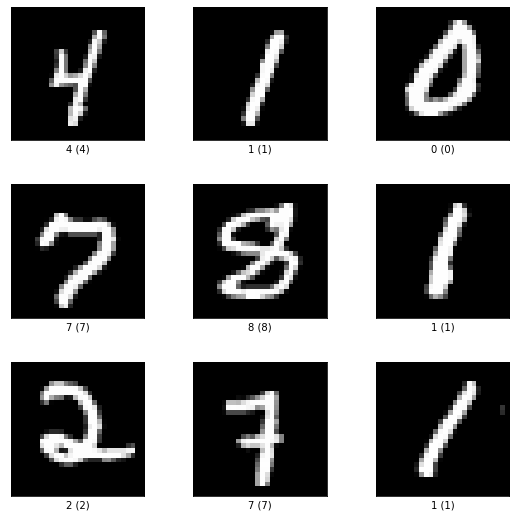

In [1]:
import tensorflow_datasets as tfds
import warnings
warnings.filterwarnings("ignore")

mnist, info =  tfds.load(
    "mnist", split="train", with_info=True
)

fig = tfds.show_examples(mnist, info)

- 여러 개의 숫자 이미지와 그에 알맞은 레이블이 출력되었을 것입니다. 이어서 아래 코드를 실행해 학습 전에 필요한 몇 가지 처리를 수행하는 함수를 정의합니다.
- 이미지 픽셀 값을 -1~1 사이의 범위로 변경했고, 레이블 정보를 one-hot encoding 했습니다.
- GAN과 cGAN 각각을 실험해 보기 위해 label 정보 사용 유무에 따라 두 가지 함수를 구성해 놓았습니다.

In [2]:
import tensorflow as tf

BATCH_SIZE = 128

def gan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

def cgan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    
    label = tf.one_hot(data["label"], 10)
    return image, label

gan_datasets = mnist.map(gan_preprocessing).shuffle(1000).batch(BATCH_SIZE)
cgan_datasets = mnist.map(cgan_preprocessing).shuffle(100).batch(BATCH_SIZE)
print("✅")

✅


- 원하는 대로 정확히 처리되었는지 한 개 데이터셋만 선택해 확인해봅시다. 이미지에 쓰인 숫자와 레이블이 일치해야 하고, 이미지 값의 범위가 -1~1 사이에 있어야 합니다.



Label : tf.Tensor([0. 1. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
Image Min/Max : -1.0 1.0


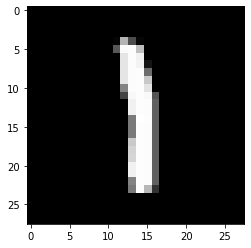

In [3]:
import matplotlib.pyplot as plt

for i,j in cgan_datasets : break

# 이미지 i와 라벨 j가 일치하는지 확인해 봅니다.     
print("Label :", j[0])
print("Image Min/Max :", i.numpy().min(), i.numpy().max())
plt.imshow(i.numpy()[0,...,0], plt.cm.gray)

## GAN Generator 구성하기
- 이번 구현은 Tensorflow2의 Subclassing 방법을 이용하겠습니다.
- Subclassing 방법은 tensorflow.keras.Model 을 상속받아 클래스를 만들며, 일반적으로 __init__() 메서드 안에서 레이어 구성을 정의하고,
- 구성된 레이어를 call() 메서드에서 사용해 forward propagation을 진행합니다.
- 이러한 Subclassing 방법은 Pytorch의 모델 구성 방법과도 매우 유사하므로 이에 익숙해진다면 Pytorch의 모델 구성 방법도 빠르게 습득할 수 있습니다.
- 먼저 GAN의 Generator를 아래와 같이 구현합니다.

In [4]:
from tensorflow.keras import layers, Input, Model

class GeneratorGAN(Model):
    def __init__(self):
        super(GeneratorGAN, self).__init__()

        self.dense_1 = layers.Dense(128, activation='relu')
        self.dense_2 = layers.Dense(256, activation='relu')
        self.dense_3 = layers.Dense(512, activation='relu')
        self.dense_4 = layers.Dense(28*28*1, activation='tanh')

        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise):
        out = self.dense_1(noise)
        out = self.dense_2(out)
        out = self.dense_3(out)
        out = self.dense_4(out)
        return self.reshape(out)

print("✅")

✅


- __init__() 메서드 안에서 사용할 모든 레이어를 정의했습니다. 4개의 fully-connected 레이어 중 한 개를 제외하고 모두 ReLU 활성화를 사용하는 것으로 확인됩니다.
- call() 메서드에서는 노이즈를 입력 받아 __init__()에서 정의된 레이어들을 순서대로 통과합니다.
- Generator는 숫자가 쓰인 이미지를 출력해야 하므로 마지막 출력은 layers.Reshape()을 이용해 (28,28,1) 크기로 변환됩니다.

## cGAN Generator 구성하기
- 이번에는 cGAN의 Generator를 살펴봅시다.


In [5]:
class GeneratorCGAN(Model):
    def __init__(self):
        super(GeneratorCGAN, self).__init__()
        
        self.dense_z = layers.Dense(256, activation='relu')
        self.dense_y = layers.Dense(256, activation='relu')
        self.combined_dense = layers.Dense(512, activation='relu')
        self.final_dense = layers.Dense(28 * 28 * 1, activation='tanh')
        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise, label):
        noise = self.dense_z(noise)
        label = self.dense_y(label)
        out = self.combined_dense(tf.concat([noise, label], axis=-1))
        out = self.final_dense(out)
        return self.reshape(out)
    
print("✅")

✅


- GAN의 Generator보다 구현이 복잡한 듯 하지만 ,이전에 cGAN을 이해한대로 두 구조의 차이점은 레이블 정보가 추가된다는 것 뿐입니다.
- 이번에는 여러분이 위 코드를 자세히 보고, 어떠한 연산이 이루어지는지 생각해봅시다.
- cGAN의 ***입력은 2개(노이즈 및 레이블 정보)*** 라는 점을 기억해주세요. (이전 GAN코드와 비교하여 잘 생각해 봅시다)
- 위 코드로 생성한 모델에 대해 입력부터 출력까지 어떤 연산이 이루어지는지 설명해주세요.(init() 메서드에서는 노이즈 및 레이블 입력 각각에 적용할 레이어를 생성했습니다)
    - 노이즈 입력 및 레이블 입력은 각각 1개의 fully-connected 레이어와 ReLU 활성화를 통과합니다. (dense_z, dense_y)  
    - 1번 문항의 각 결과가 서로 연결되어 다시 한번 1개의 fully-connected 레이어와 ReLU 활성화를 통과합니다 (tf.concat, conbined_dense)  
    - 2번 문항의 결과가 1개의 fully-connected 레이어 및 Hyperbolic tangent 활성화를 거쳐 28x28 차원의 결과가 생성되고 (28,28,1) 크기의 이미지 형태로 변환되어 출력됩니다 (final_dense, reshape)


# 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기
## GAN Discriminator 구성하기
- 이전에 임의 노이즈 및 레이블 정보로부터 숫자 이미지를 생성하는 Generator를 구현했습니다.
- 이번에는 실제 이미지와 Generator가 생성한 이미지에 대해 진짜와 가짜를 식별하는 Discriminator를 구현해 보겠습니다.
- 먼저 GAN의 Discriminator를 아래와 같이 구현합니다.

In [6]:
class DiscriminatorGAN(Model):
    def __init__(self):
        super(DiscriminatorGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.blocks = []
        for f in [512, 256, 128, 1]:
            self.blocks.append(
                layers.Dense(f, activation=None if f==1 else "relu")
            )
        
    def call(self, x):
        x = self.flatten(x)
        for block in self.blocks:
            x = block(x)
        return x
    
print("✅")

✅


- 여기에서는 __init__()에 blocks라는 리스트를 하나 만들어 놓고, for loop를 이용하여 필요한 레이어들을 차곡차곡 쌓아놓았습니다.
- 이러한 방식을 이용하면 각각의 fully-connected 레이어를 매번 정의하지 않아도 되므로 많은 레이어가 필요할 때 편리합니다.
- Discriminator의 입력은 Generator가 생성한 (28,28,1) 크기의 이미지이며, 이를 fully-connected 레이어로 학습하기 위해 call()에서는 가장 먼저 layers.Flatten()이 적용됩니다.
- 이어서 레이어들이 쌓여있는 blocks에 대해 for loop를 이용하여 레이어들을 순서대로 하나씩 꺼내 입력 데이터를 통과시킵니다.
- 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다.

## cGAN Discriminator 구성하기
- 다음으로 구현할 cGAN의 Discriminator는 Maxout이라는 특별한 레이어가 사용됩니다.
- Maxout은 간단히 설명하면 두 레이어 사이를 연결할 때, 여러 개의 fully-connected 레이어를 통과시켜 그 중 가장 큰 값을 가져오도록 합니다.
- 만약 2개의 fully-connected 레이어를 사용할 때 Maxout을 식으로 표현하면 아래와 같습니다.

- max(wT1x+b1, wT2x+b2)

- 아래 코드와 같이 Maxout을 구성할 수 있습니다.
- tensorflow.keras.layers.Layer 를 상속받아 레이어를 정의했습니다.
- 이전에 모델을 정의한 것과 비슷하게 __init__(), call() 메서드를 구성합니다.

In [7]:
class Maxout(layers.Layer):
    def __init__(self, units, pieces):
        super(Maxout, self).__init__()
        self.dense = layers.Dense(units*pieces, activation="relu")
        self.dropout = layers.Dropout(.5)    
        self.reshape = layers.Reshape((-1, pieces, units))
    
    def call(self, x):
        x = self.dense(x)
        x = self.dropout(x)
        x = self.reshape(x)
        return tf.math.reduce_max(x, axis=1)

print("✅")

✅


- Maxout 레이어를 구성할 때 units과 pieces의 설정이 필요하며, units 차원 수를 가진 fully-connected 레이어를 pieces개 만큼 만들고 그 중 최대 값을 출력합니다.
- 예를 들어, 사용할 Maxout 레이어가 units=100, pieces=10으로 설정 된다면 입력으로 부터 100차원의 representation을 10개 만들고,
- 10개 중에서 최대값을 가져와 최종 1개의 100차원 representation이 출력됩니다. 식으로 나타낸다면 아래와 같습니다. (위 예시에서는 각각의 wx+b가 모두 100차원 입니다)
- 위에서 정의한 Maxout 레이어를 3번만 사용하면 아래와 같이 쉽게 cGAN의 Discriminator를 구성할 수 있습니다.
- 아래아 같은 cGAN의 Disciminator에 (28,28,1) 크기 이미지 및 (10,) 크기 레이블이 입력될 때, 연산의 순서를 다음과 같이 나타낼 수 있습니다.  
    - 이미지가 Maxout 레이어를 통과 : 240차원
    - 레이블이 Maxout 레이어를 통과 : 50차원
    - 1)과 2)결과로 나온 representation을 결합(concate) 후 Maxout 레이어를 통과 : 240차원 
- 위 3개 과정의 각 결과 차원 수는 각각 몇일까요? 240, 50, 240

In [8]:
class DiscriminatorCGAN(Model):
    def __init__(self):
        super(DiscriminatorCGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.image_block = Maxout(240, 5)
        self.label_block = Maxout(50, 5)
        self.combine_block = Maxout(240, 4)
        
        self.dense = layers.Dense(1, activation=None)
    
    def call(self, image, label):
        image = self.flatten(image)
        image = self.image_block(image)
        label = self.label_block(label)
        x = layers.Concatenate()([image, label])
        x = self.combine_block(x)
        return self.dense(x)
    
print("✅")

✅


- GAN의 Discriminator와 마찬가지로 Generator가 생성한 (28,28,1) 크기의 이미지가 입력되므로, layers.Flatten()이 적용됩니다.
- 그리고 이미지 입력 및 레이블 입력 각각은 Maxout 레이어를 한번씩 통과한 후 서로 결합되어 Maxout 레이어를 한번 더 통과합니다.
- 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다.

# 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기
- 이전에 정의한 Generator 및 Discriminator를 이용해 MINST를 학습하고 각 모델로 직접 숫자 손글씨를 생성해봅시다.
- 우선 GAN, cGAN 각각의 모델 학습에 공통적으로 필요한 loss function과 optimizer를 정의합니다.
- 진짜 및 가짜를 구별하기 위해 Binary Cross Entropy를 사용하고, Adam optimizer를 이용해 학습하겠습니다.

In [9]:
from tensorflow.keras import optimizers, losses

bce = losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

gene_opt = optimizers.Adam(1e-4)
disc_opt = optimizers.Adam(1e-4)    

print("✅")

✅


## GAN으로 MNIST 학습하기
- 이전 단계에서 구성한 GeneratorGAN 및 DiscriminatorGAN 모델 클래스를 이용합니다.
- 여기서는 입력으로 사용되는 노이즈를 100차원으로 설정했으며, 하나의 배치 크기 데이터로 모델을 업데이트하는 함수를 아래와 같이 작성했습니다.



In [10]:
gan_generator = GeneratorGAN()
gan_discriminator = DiscriminatorGAN()

@tf.function()
def gan_step(real_images):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        # Generator를 이용해 가짜 이미지 생성
        fake_images = gan_generator(noise)
        # Discriminator를 이용해 진짜 및 가짜이미지를 각각 판별
        real_out = gan_discriminator(real_images)
        fake_out = gan_discriminator(fake_images)
        # 각 손실을 계산
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    # gradient 계산
    gene_grad = tape.gradient(gene_loss, gan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, gan_discriminator.trainable_variables)
    # 모델 학습
    gene_opt.apply_gradients(zip(gene_grad, gan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, gan_discriminator.trainable_variables))
    return gene_loss, disc_loss

print("✅")

✅


- 위 함수를 이용해 우선 10 epoch만큼 학습을 진행해 보겠습니다. 100번의 반복마다 각 손실을 출력하도록 했습니다.



In [11]:
EPOCHS = 10
for epoch in range(1, EPOCHS+1):
    for i, images in enumerate(gan_datasets):
        gene_loss, disc_loss = gan_step(images)

        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i+1} ITER] G:{gene_loss}, D:{disc_loss}")

[1/10 EPOCHS, 100 ITER] G:2.2775092124938965, D:0.12465766072273254
[1/10 EPOCHS, 200 ITER] G:2.580667734146118, D:0.10211232304573059
[1/10 EPOCHS, 300 ITER] G:2.6221041679382324, D:0.1496923565864563
[1/10 EPOCHS, 400 ITER] G:2.0699660778045654, D:0.20960171520709991
[2/10 EPOCHS, 100 ITER] G:4.120059967041016, D:0.0339379645884037
[2/10 EPOCHS, 200 ITER] G:2.5040533542633057, D:0.5687835216522217
[2/10 EPOCHS, 300 ITER] G:2.616739273071289, D:0.3590421676635742
[2/10 EPOCHS, 400 ITER] G:3.692882537841797, D:0.10481300950050354
[3/10 EPOCHS, 100 ITER] G:3.6338236331939697, D:0.1142437607049942
[3/10 EPOCHS, 200 ITER] G:4.0024733543396, D:0.14969535171985626
[3/10 EPOCHS, 300 ITER] G:2.7524232864379883, D:0.18067435920238495
[3/10 EPOCHS, 400 ITER] G:4.57073974609375, D:0.05446246266365051
[4/10 EPOCHS, 100 ITER] G:4.420670509338379, D:0.058258019387722015
[4/10 EPOCHS, 200 ITER] G:5.340031147003174, D:0.09431396424770355
[4/10 EPOCHS, 300 ITER] G:3.3012535572052, D:0.1952704340219497

- 짧은 시간 학습된 모델을 테스트 해봅시다. 100차원 노이즈 입력을 10개 사용하여 10개의 숫자 손글씨 데이터를 생성해 시각화합니다.

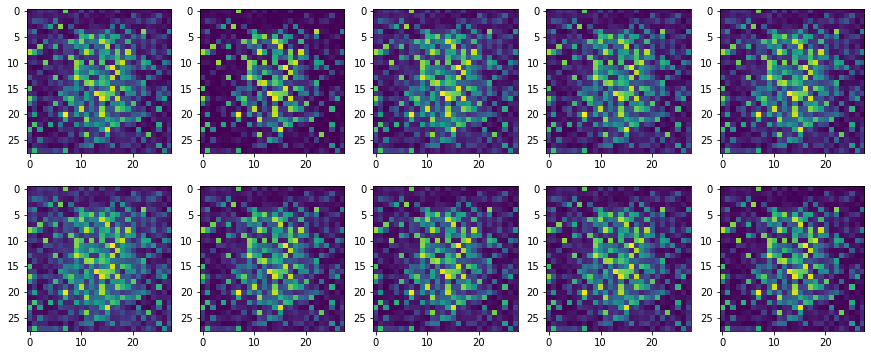

In [12]:
import numpy as np

noise = tf.random.normal([10, 100])

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

- 결과를 보니 아마도 10 epoch의 학습 만으로는 좋은 결과를 기대할 수 없나봅니다.
- 위 구현을 그대로 500 epoch 학습한 가중치를 아래에 첨부했으니 한번 사용해 봅시다.
- 첨부된 파일(GAN_500.zip)을 다운로드하여 아래와 같이 작업환경을 구성해 주세요.

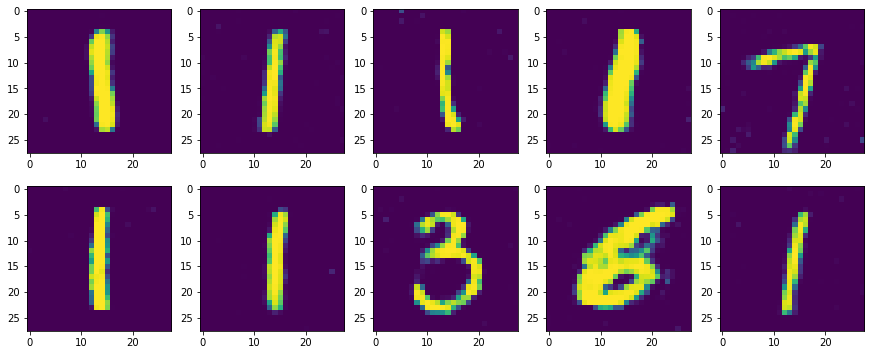

In [13]:
import os
weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/gan/GAN_500'

noise = tf.random.normal([10, 100]) 

gan_generator = GeneratorGAN()
gan_generator.load_weights(weight_path)

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

- 위에 보이는 10개의 결과 이미지는 서로 다른 숫자들이 시각화 되었을 것입니다 (아닐수도 있습니다).
- 이러한 방법으로는 내가 원하는 특정 숫자 하나를 출력하기 위해 수많은 입력을 넣어야 할 수 있습니다. 내가 원하는 숫자를 바로 얻어내기 위해 아래에서 cGAN을 학습시켜 봅시다.



## cGAN으로 MNIST 학습하기
- 이전 단계에서 구성한 GeneratorCGAN 및 DiscriminatorCGAN 모델 클래스를 이용합니다.
- 위에서 실행했던 GAN 학습처럼 약간의 학습으로는 제대로 된 생성 결과를 얻을 수 없을테니 이번에는 연습삼아 1 epoch만 학습시켜 보겠습니다.

In [14]:
cgan_generator = GeneratorCGAN()
cgan_discriminator = DiscriminatorCGAN()

@tf.function()
def cgan_step(real_images, labels):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        fake_images = cgan_generator(noise, labels)
        
        real_out = cgan_discriminator(real_images, labels)
        fake_out = cgan_discriminator(fake_images, labels)
        
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    
    gene_grad = tape.gradient(gene_loss, cgan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, cgan_discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_grad, cgan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, cgan_discriminator.trainable_variables))
    return gene_loss, disc_loss


EPOCHS = 1
for epoch in range(1, EPOCHS+1):
    
    for i, (images, labels) in enumerate(cgan_datasets):
        gene_loss, disc_loss = cgan_step(images, labels)
    
        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i} ITER] G:{gene_loss}, D:{disc_loss}")

[1/1 EPOCHS, 99 ITER] G:5.628383159637451, D:0.004264526069164276
[1/1 EPOCHS, 199 ITER] G:5.142124176025391, D:0.008296702057123184
[1/1 EPOCHS, 299 ITER] G:3.2867183685302734, D:0.1161959171295166
[1/1 EPOCHS, 399 ITER] G:3.1884560585021973, D:0.0994422510266304


- 학습 과정에서 Generator 및 Discriminator에 레이블 정보만 추가로 입력했다는 점을 제외하면 위에서 학습한 GAN과 큰 차이는 없습니다.
- 위 코드로 짧게나마 학습시켜봤는데, 충분한 학습이 되기엔 더 많은 시간을 투자해야 합니다.
- 뒤에서 학습해야 할 것들이 많이 남아있으니, 시간을 아끼기 위해 위 코드로 500 epoch 학습한 가중치를 아래에 첨부했습니다.

- 아래 코드의 가장 윗줄에 있는 number라는 변수에 숫자를 할당하지 않았습니다.
- number에 0~9 사이의 숫자 중 생성하길 원하는 숫자를 입력해 주시고 아래 코드를 실행시켜봅시다.
- 경고메시지가 출력된다면 그냥 무시하셔도 됩니다.

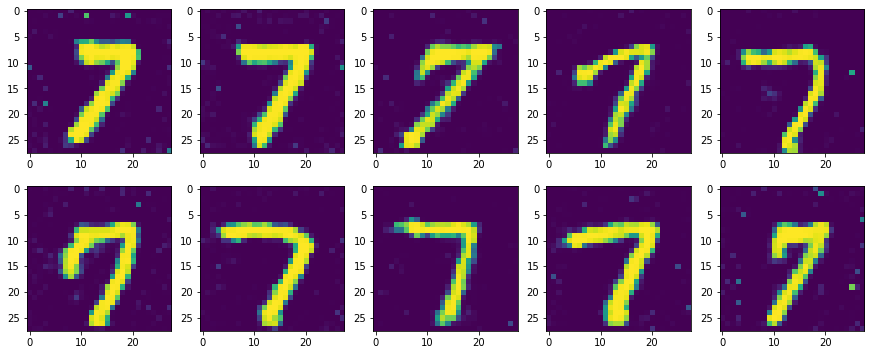

In [15]:
number = 7 # TODO : 생성할 숫자를 입력해 주세요!!

weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/cgan/CGAN_500'

noise = tf.random.normal([10, 100])

label = tf.one_hot(number, 10)
label = tf.expand_dims(label, axis=0)
label = tf.repeat(label, 10, axis=0)

generator = GeneratorCGAN()
generator.load_weights(weight_path)

output = generator(noise, label)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

- 출력된 10개 시각화 결과는 어떤가요? 아마도 number에 입력한 숫자에 해당하는 손글씨가 시각화되었을 것입니다.
- cGAN을 사용해 조건을 주고 학습하면 이렇게 특정한 숫자를 만들어내기가 훨씬 쉬워졌습니다.😆

# GAN의 입력에 이미지를 넣는다면? Pix2Pix
- 지금까지 cGAN에 대해 알아보고 실험해보면서, 작은 조건만으로 우리가 원하는 클래스의 이미지를 생성할 수 있음을 확인했습니다.
- 만약 입력자체가 조건이 된다면 어떨까요? cGAN과 같이 클래스 레이블 등의 조건을 함께 입력하는 것이 아니라, 조금 더 자세하게 내가 원하는 이미지를 얻기 위해 이미지를 조건으로 줄 수 없을까요?
- 이번에 소개드릴 Pix2Pix는 기존 노이즈 입력을 이미지로 변환하는 일반적인 GAN을 넘어 이미지를 입력으로 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델입니다.

- Pix2Pix를 제안한 논문의 제목은 Image-to-Image Translation with Conditional Adversarial Networks 로 하고자 하는 바가 제목에 그대로 담겨 있습니다.
- Conditional Adversarial Networks로 Image-to-Image Translation을 수행한다는 뜻이죠.
- Conditional Adversarial Networks는 이전 까지 알아봤던 cGAN과 같은 구조를 말하는 것인데, Image-to-Image Translation이란 단어는 무엇을 뜻하는 걸까요?
- 아래 Pix2Pix 논문에서 수행한 결과를 먼저 살펴봅시다.

- 이 후 표기되는 이미지에 대한 출처가 명시되지 않은 경우, Pix2Pix 논문에서 가져왔음을 미리 알려드립니다.
- - Image-to-Image Translation은 말 그대로 이미지 간 변환을 말합니다.😅
- 위 결과의 첫번째 [Labels to Street Scene] 이미지는 픽셀별로 레이블 정보만 존재하는 segmentation map을 입력으로 실제 거리 사진을 생성해 내었고, 이 외에 흑백 사진을 컬러로 변환하거나, 낮에 찍은 사진을 밤에 찍은 사진으로 변환하거나, 가방 스케치를 이용해 채색된 가방을 만들기도 합니다.
- 한 이미지의 픽셀에서 다른 이미지의 픽셀로(pixel to pixel) 변환한다는 뜻에서 Pix2Pix라는 이름으로 불립니다.
- 이 구조는 최근 활발하게 연구 및 응용되는 GAN 기반의 Image-to-Image Translation 작업에서 가장 기초가 되는 연구입니다.
- 노이즈와 레이블 정보를 함께 입력했던 cGAN은 fully-connected 레이어를 연속적으로 쌓아 만들었지만, 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용합니다. GAN 구조를 기반으로 하기 때문에 크게 Generator와 Discriminator 두 가지 구성 요소로 이루어집니다.

## Pix2Pix (Generator)
- Generator는 어떠한 이미지를 입력 받아 변환된 이미지를 출력하기 위해 사용됩니다.
- 여기서 입력 이미지와 변환된 이미지의 크기는 동일해야 하며, 이러한 문제에서 흔히 사용되는 구조는 아래 그림과 같은 Encoder-Decoder 구조입니다.

- Encoder에서 입력 이미지(x)를 받으면 단계적으로 이미지를 down-sampling하면서 입력 이미지의 중요한 representation을 학습합니다.
- Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지(y)를 생성해냅니다.
- 이러한 과정은 모두 convolution 레이어로 진행되며, 레이어 내의 수많은 파라미터를 학습하여 잘 변환된 이미지를 얻도록 합니다.
- 여기서 한 가지 짚고 넘어갈 부분은, Encoder의 최종 출력은 위 그림 중간에 위치한 가장 작은 사각형이며, bottleneck 이라고도 불리는 이 부분은 입력 이미지(x)의 가장 중요한 특징만을 담고 있습니다.
- 과연 이 중요하지만 작은 특징이 변환된 이미지(y)를 생성하는데 충분한 정보를 제공할까요?
- 이와 같은 점을 보완하기 위해 논문에서는 Generator 구조를 하나 더 제안합니다.
- 아래 그림과 같은 U-Net 구조 입니다.
- 위에서 살펴본 단순한 Encoder-Decoder로 구성된 Generator와 다른 점은, 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있다는 것입니다.
- Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로 부터 더 많은 추가 정보를 이용하는 방법이며,
- 이러한 U-Net 구조의 Generator를 사용해 아래와 같이 단순한 Encoder-Decoder 구조의 Generator를 사용한 결과에 비해 비교적 선명한 결과를 얻을 수 있었습니다.
- 여기서 U-Net은 이전에 segmentation 작업을 위해 제안된 구조입니다. U-Net에 대한 자세한 사항은 이번 노드의 학습 범위를 벗어나므로 아래에 잘 정리된 자료를 첨부합니다.

## Pix2Pix (Loss Function)
- 예상컨데 위 Generator 구조를 보면서 한번쯤 생각해 보셨을 것 같은 사항으로는 "Generator만으로도 이미지 변환이 가능하지 않을까?" 입니다.
- 생각 안해보셨다면 지금 한번 생각해봅시다.
- 물론, 가능합니다. AutoEncoder 형태의 접근은 Generator만으로 이미지 변환을 진행합니다.
- 당연하게도 변환하고자 하는 이미지를 Encoder에 입력 하여 Decoder의 출력으로 변환된 이미지를 얻을 수 있습니다.
- 출력된 이미지와 실제 이미지의 차이로 L2(MSE), L1(MAE) 같은 손실을 계산한 후 이를 역전파하여 네트워크를 학습 시키면 되겠죠.
- 이미지 변환이 가능은 하지만 문제는 변환된 이미지의 품질입니다.
- 아래 사진의 L1이라 써있는 결과가 Generator 만을 사용해 변환된 이미지와 실제 이미지 사이의 L1 손실을 이용해 만들어낸 결과입니다.
- L1 이라 쓰여있는 Generator만으로 생성된 결과는 매우 흐릿합니다. 이미지를 변환하는데 L1(MAE)이나 L2(MSE) 손실만을 이용해서 학습하는 경우 이렇게 결과가 흐릿해지는 경향이 있습니다. Generator가 단순히 이미지의 평균적인 손실만을 줄이고자 파라미터를 학습하기 때문에 이러한 현상이 불가피합니다.
- 반면 위 그림의 cGAN이라 쓰여진 GAN 기반의 학습방법은 비교적 훨씬 더 세밀한 정보를 잘 표현하고 있습니다.
- Discriminator를 잘 속이려면 Generator가 (Ground truth라고 쓰여진 이미지 같이) 진짜 같은 이미지를 만들어야 하기 때문이죠.
- 논문에서는 L1손실과 GAN 손실을 같이 사용하면 더욱 더 좋은 결과를 얻을 수 있다고 합니다 (위 그림의 L1+cGAN).

## Pix2Pix (Discriminator)
- 위 결과에서 보듯 실제 같은 이미지를 얻기 위해서는 GAN의 학습 방법을 이용해야 하며, 위에서 설명한 Generator를 발전시킬 서포터이자 경쟁자, Discriminator가 필요하겠죠. 혹시 이전에 다뤘던 DCGAN의 Discriminator 기억하시나요? 아래 그림은 DCGAN의 Discriminator를 나타냅니다.
- DCGAN의 Discriminator는 생성된 가짜이미지 혹은 진짜이미지를 하나씩 입력받아 convolution 레이어를 이용해 점점 크기를 줄여나가면서, 최종적으로 하나의 이미지에 대해 하나의 확률 값을 출력했습니다. Pix2Pix는 이 과정에서 의문을 갖습니다.
- 하나의 전체 이미지에 대해 하나의 확률 값만을 도출하는 것이 진짜 혹은 가짜를 판별하는 데 좋은 것일까?
- Pix2Pix는 이러한 의문점을 가지고 아래 그림과 같은 조금 다른 방식의 Discriminator를 사용합니다.
- 위 그림은 Pix2Pix에서 사용되는 Discriminator를 간략하게 나타냅니다. 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률 값을 나타내는 최종 결과를 생성하는데, 그 결과는 하나의 값이 아닌 여러 개의 값을 갖습니다 (위 그림의 Prediction은 16개의 값을 가지고 있습니다).
- 위 그림에서 입력이미지의 파란색 점선은 여러 개의 출력 중 하나의 출력을 계산하기 위한 입력이미지의 receptive field 영역을 나타내고 있으며, 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률 값을 도출한다는 것입니다.
- 이런 방식으로 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률 값을 계산할 수 있으며 이 값을 평균하여 최종 Discriminator의 출력을 생성합니다. 이러한 방법은 이미지의 일부 영역(patch)을 이용한다고 하여 PatchGAN이라고 불립니다. 일반적으로 이미지에서 거리가 먼 두 픽셀은 서로 연관성이 거의 없기 때문에 특정 크기를 가진 일부 영역에 대해서 세부적으로 진짜/가짜를 판별하는 것이 Generator로 하여금 더 진짜 같은 이미지를 만들도록 하는 방법입니다.
- 아래 그림은 (위 그림의 파란색 점선같은) 판별 영역을 다양한 크기로 실험하여 그 결과를 보여줍니다.
- 마지막에 보이는 286x286이라 적힌 이미지는 DCGAN의 Discriminator와 같이 전체 이미지에 대해 하나의 확률값을 출력하여
- 진짜/가짜를 판별하도록 학습한 결과입니다 (입력 이미지 크기가 286x286 입니다).
- 70x70 이미지는 Discriminator입력 이미지에서 70x70 크기를 갖는 일부 영역에 대해서 하나의 확률값을 출력한 것이며,
- 16x16, 1x1로 갈수록 더 작은 영역을 보고 각각의 확률값을 계산하므로 Discriminator의 출력 값의 개수가 더 많습니다.
- 위 4개의 이미지를 살펴보면, 너무 작은 patch를 사용한 결과(1x1, 16x16)는 품질이 좋지 않으며, 70x70 patch를 이용한 결과가
- 전체 이미지를 사용한 결과(286x286)보다 조금 더 사실적인 이미지를 생성하므로 PatchGAN의 사용이 성공적이라고 볼 수 있을 것 같습니다.
- 지금까지 Pix2Pix의 Generator와 Discriminator, Loss function을 구성하는 기본 아이디어들에 대해서 간략하게 알아봤습니다. 다음 단계부터는 Pix2Pix를 구현하면서 더 자세히 이해해봅시다.

# Segmentation map 도로 이미지 (1) 데이터 준비하기
- 이번에는 앞서 알아본 pix2pix 모델에 대해서 직접 구현하고 실험해봅시다. 사용해볼 데이터셋은 Sketch2Pokemon이라는 데이터셋입니다.
- Sketch2Pokemon info
- 위 출처에는 학습용 데이터 셋에 830개의 이미지가 있으며, 각 (256x256) 크기의 이미지 쌍이 나란히 붙어 (256x512) 크기의 이미지로 구성되어 있다고 합니다.
아래 링크에서 다운로드해서 직접 확인해봅시다. (위 출처에서 학습용 데이터셋만 따로 가져왔습니다)

In [16]:
import tensorflow_datasets as tfds
import warnings
warnings.filterwarnings("ignore")

import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/pokemon_pix2pix_dataset/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 830


- 출처의 내용과 같이 830개 이미지가 있음을 확인할 수 있습니다.

- 이번에는 아래 코드를 이용해 각각의 이미지들이 어떻게 생겼는지 확인해 봅시다. 학습용 데이터셋에서 임의로 6장을 선택하여 시각화합니다.



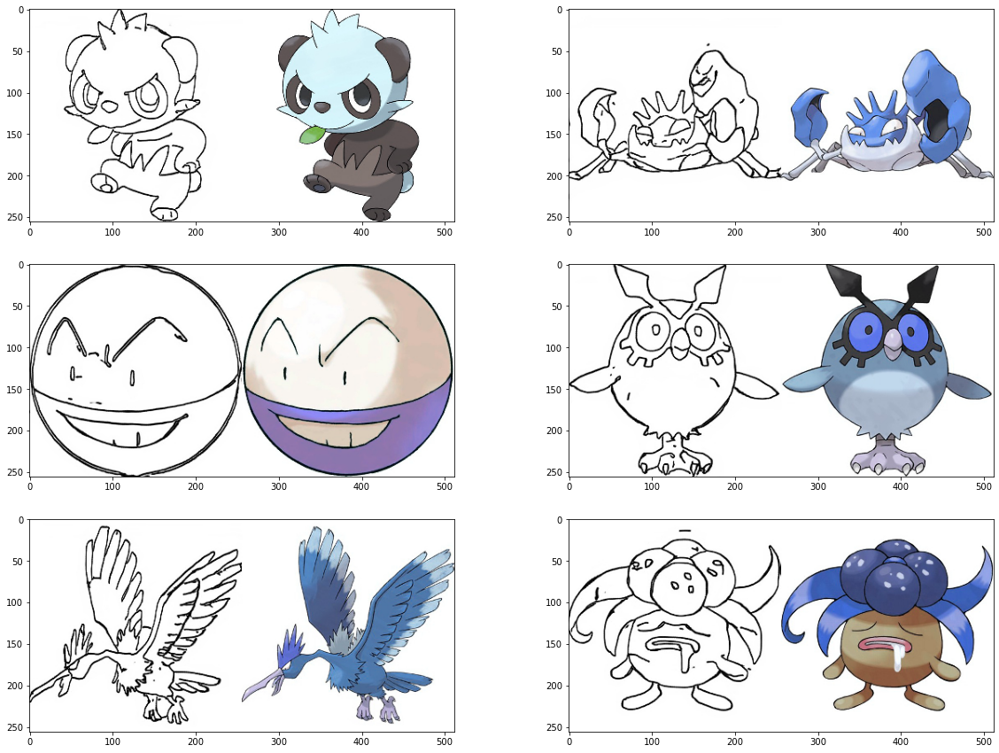

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

- 하나의 이미지에 포켓몬 스케치와 실제 포켓몬 이미지가 함께 포함되어 있음을 확인할 수 있습니다.
- 위 코드를 여러 번 반복 실행해 보면 일부는 제대로 스케치 되지 않은 이미지도 확인할 수 있습니다.
- 출처를 확인해보니 직접 그려서 만든 데이터셋이 아닌 스케치 생성 모델을 이용해서 만들었다고 하네요 😅

- 이미지를 하나 열어 아래와 같이 크기를 확인해 보겠습니다.

In [18]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


- (256, 512, 3)으로 확인되었습니다. 모델 학습에 사용할 데이터를 (256, 256, 3) 크기의 2개 이미지로 분할하여 사용하면 될 것 같네요.
- 아래 코드로 이미지를 나누어 봅시다.

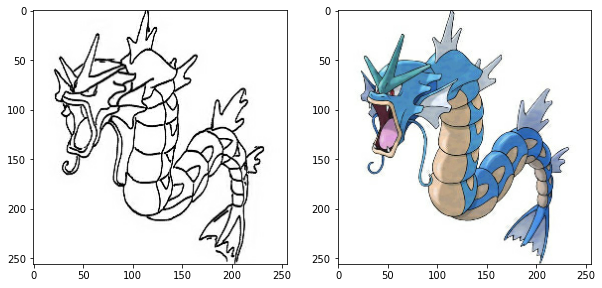

In [19]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

- 위와 같이 두개 이미지로 나누었습니다. 첫 번째 스케치를 다음 단계에서 구성할 Pix2Pix 모델에 입력하여 두 번째 그림과 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표입니다.

- 앞서 살펴봤듯이 학습에 사용할 수 있는 데이터의 수는 약 800개 뿐입니다.
- 학습에 사용하는 데이터의 다양성을 높이기 위해 아래 코드와 같이 여러 augmentation 방법을 적용해 보겠습니다.

In [20]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


- apply_augmentation 함수는 스케치 및 채색된 2개 이미지를 입력으로 받아 여러가지 연산을 두 이미지에 동일하게 적용합니다.
- 입력된 이미지에 어떠한 과정이 적용되는지 위 코드를 보면서 아래 퀴즈를 풀어봅시다.
- 위에서 정의한 apply_augmentation 함수에 두 이미지가 입력되면 어떠한 과정을 거치는지 순서대로 적어주세요.
    1. 두 이미지가 채널 축으로 연결됩니다. (tf.concat). 두 이미지가 각각 3채널인 경우 6채널이 됩니다.
    - 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용됩니다. (tf.pad)
    - 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냅니다. (tf.image.random_crop) 
    - 3.의 결과를 50% 확률로 가로로 뒤집습니다. (tf.image.random_flip_left_right)
    - 4.의 결과를 50% 확률로 세로로 뒤집습니다. (tf.image.random_flip_up_down) 
    - 5.의 결과를 50% 확률로 회전시킵니다. (tf.image.rot90)
    
    
- 위와 같이 구성한 함수를 데이터에 적용해 시각화 해봅시다.

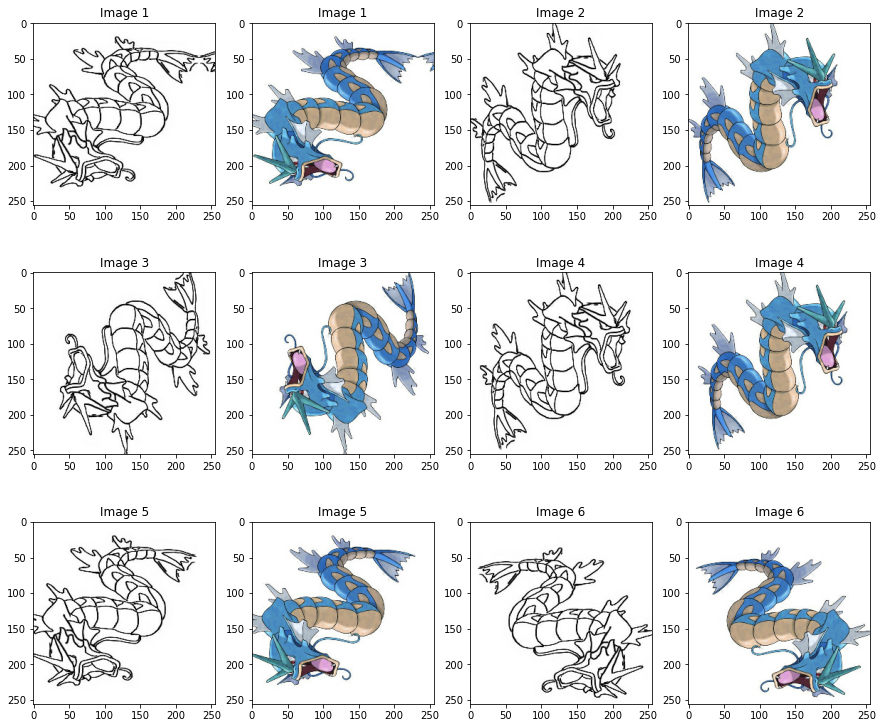

In [21]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

- 매우 다양한 이미지가 생성됩니다. 여기서 사용한 augmentation 방법 외에 더 많은 방법을 활용한다면 더욱 더 다양한 데이터셋을 만들어 좋은 일반화 결과를 기대해 볼 수 있습니다.😆

- 마지막으로 위 과정들을 학습 데이터에 적용하며, 잘 적용 되었는지 하나의 이미지만 시각화하여 확인해 보겠습니다.

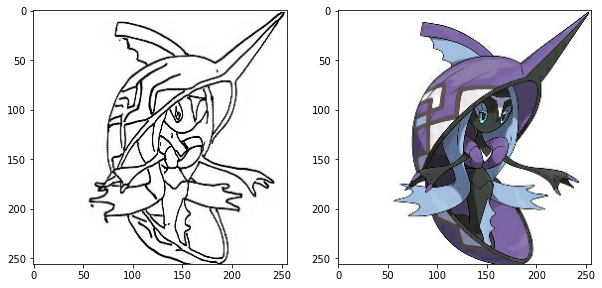

In [22]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

# 난 스케치를 할테니 너는 채색을 하거라 (2) Generator 구성하기
- 이제부터 본격적으로 Pix2Pix 구조를 구현합니다. 앞서 cGAN 구현과 같이 Tensorflow의 Subclassing 방법을 이용해 모델을 만들겠습니다.

- (주의) 커널 메모리를 체크해 주세요!
- 이전 모델이 메모리에 로드되어 있는 상태에서 pix2pix 모델을 함께 학습하면 메모리 오류가 발생할 수도 있습니다. 메모리가 충분하지 않다면 이 시점에 커널 재시작 후 진행할 것을 권합니다.

## Generator의 구성요소 알아보기
- 먼저, pix2pix 논문에서 Generator를 구성하는데 필요한 정보를 아래에 가져왔습니다. 한번 읽어보시고 아래 질문에 답해봅시다.

![title](paper_g.png)

- 논문에서 표기한 encoder의 "C64"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?
    - 64개의 4x4 필터에 stride 2를 적용한 Convolution → 0.2 slope의 LeakyReLU (위 논문의 아래 단락에 BatchNorm을 사용하지 않는다고 쓰여 있습니다)

- 논문에서 표기한 decoder의 "CD512"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?
    - 512개의 4x4 필터에 stride 2를 적용한 (Transposed) Convolution → BatchNorm → 50% Dropout → ReLU
    
- 아마도 위 두 개의 질문에 잘 답하셨다면, Generator를 구성하는데 필요한 레이어들은 대략적으로 숙지하셨으리라 생각됩니다.
- 이번에는 아래와 같이 보기 쉽게 표현한 그림을 통해 Generator의 전체 구조를 머리 속에 조금 더 자세히 그려봅시다.

![title](refer_g.max-800x600.png)

- 위 그림에서 ENCODE 또는 DECODE라고 쓰인 각각의 블럭을 기준으로 양쪽에 쓰인 입출력 크기에 집중해주세요.
- "in"이라고 쓰여진 입력 부분부터 윗줄의 화살표를 쭉 따라가면 계산된 결과의 (width, height) 크기가 점점 절반씩 줄어들며 최종적으로 (1,1)이 되고,
- 채널의 수는 512까지 늘어나는 것을 확인할 수 있습니다.
- 처음 입력부터 시작해서 (1,1,512) 크기를 출력하는 곳까지가 Encoder 부분 입니다.

- 이어서 아랫줄 화살표를 따라가면 (width, height) 크기가 점점 두 배로 늘어나 다시 (256, 256) 크기가 되고, 채널의 수는 점점 줄어들어 처음 입력과 같이 3채널이 됩니다.
- (1,1,512)를 입력으로 최종 출력까지의 연산들이 Decoder 부분입니다.

## Generator 구현하기
- 위 정보들을 토대로 여러분의 머릿속에 희미하게 그려진 Generator의 Encoder 부분을 구현하겠습니다.
- 먼저 위 논문에서 "C64", "C128" 등으로 쓰여진 것과 같이 "Convolution → BatchNorm → LeakyReLU"의 3개 레이어로 구성된 기본적인 블록을 아래와 같이 하나의 레이어로 만들었습니다.

In [23]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

✅


- __init__() 메서드에서 n_filters, use_bn를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정 할 수 있습니다.
- 이외 Convolution 레이어에서 필터의 크기(=4) 및 stride(=2)와 LeakyReLU 활성화의 slope coefficient(=0.2)는 모든 곳에서 고정되어 사용하므로 각각의 값을 지정했습니다.
- Encoder에 사용할 기본 블록을 구성했으니 이 블록을 여러 번 가져다 사용하면 아래와 같이 쉽게 Encoder를 구성할 수 있습니다.

In [24]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


- 각 블록을 거치면서 사용할 필터의 개수를 filters라는 리스트에 지정해 두었으며, blocks이라는 리스트에는 사용할 블록들을 정의해 넣어두고, call() 메서드에서 차례대로 블록들을 통과합니다.
- 앞서 퀴즈로 알아본 것 처럼 Encoder 첫번째 블록에서는 BatchNorm을 사용하지 않습니다.
- get_summary는 레이어가 제대로 구성되었는지 확인하기 위한 용도로 따로 만들어 놓았습니다.
- 위에서 구성한 Encoder에 (256,256,3) 크기의 데이터를 입력했을 때, 어떤 크기의 데이터가 출력되는지 살펴봅시다. 만들어 놓은 get_summary 메서드를 바로 불러오시면 됩니다.

In [25]:
Encoder().get_summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encode_block (EncodeBlock)   (None, 128, 128, 64)      3072      
_________________________________________________________________
encode_block_1 (EncodeBlock) (None, 64, 64, 128)       131584    
_________________________________________________________________
encode_block_2 (EncodeBlock) (None, 32, 32, 256)       525312    
_________________________________________________________________
encode_block_3 (EncodeBlock) (None, 16, 16, 512)       2099200   
_________________________________________________________________
encode_block_4 (EncodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
encode_block_5 (EncodeBlock) (None, 4, 4, 512)        

- 블록을 통과할수록 (width, height) 크기는 반씩 줄어들고, 사용된 필터의 수는 최대 512개로 늘어나 최종 (1,1,512)로 알맞은 크기가 출력됨을 확인 할 수 있습니다.

- 이번엔 Decoder를 구현합니다. Encoder와 마찬가지로 사용할 기본 블록을 정의하고, 이 블록을 여러번 반복하여 아래와 같이 Decoder를 만들겠습니다.

In [26]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,256)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

✅


- 처음 세 개의 블록에서만 Dropout을 사용했으며, 마지막 convolution에는 3개의 필터를 사용해 출력하는 것을 확인할 수 있습니다.
- 마찬가지로 (1,1,512) 크기의 데이터가 입력되었을 때, 어떤 크기가 출력되는지 확인해봅시다.

In [27]:
Decoder().get_summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1, 256)]       0         
_________________________________________________________________
decode_block (DecodeBlock)   (None, 2, 2, 512)         2099200   
_________________________________________________________________
decode_block_1 (DecodeBlock) (None, 4, 4, 512)         4196352   
_________________________________________________________________
decode_block_2 (DecodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
decode_block_3 (DecodeBlock) (None, 16, 16, 512)       4196352   
_________________________________________________________________
decode_block_4 (DecodeBlock) (None, 32, 32, 256)       2098176   
_________________________________________________________________
decode_block_5 (DecodeBlock) (None, 64, 64, 128)      

- (width, height) 크기가 점점 늘어나고 사용 필터의 수는 점점 줄어들어 최종 (256,256,3) 크기로 알맞게 출력되었습니다.

- 위에서 구성한 Encoder와 Decoder를 연결시키면 Encoder에서 (256,256,3) 입력이 (1,1,512)로 변환되고, Decoder를 통과해 다시 원래 입력 크기와 같은 (256,256,3)의 결과를 얻을 수 있겠군요. 스케치를 입력으로 이런 연산 과정을 통해 채색된 이미지 출력을 얻을 수 있습니다.
- 아래 코드와 같이 tf.keras.Model을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성해봅시다.



In [28]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encoder_1 (Encoder)          (None, 1, 1, 512)         19544576  
_________________________________________________________________
decoder_1 (Decoder)          (None, 256, 256, 3)       19542784  
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


Generator를 잘 작동시키기 위해서는 약 4000만개의 파라미터를 잘 학습시켜야 하네요😅

In [29]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


# 난 스케치를 할테니 너는 채색을 하거라 (3) Generator 재구성하기
- 지금까지 Encoder와 Decoder를 연결시켜 Generator를 만들어 봤습니다.
- 하지만 앞서 설명드린 것 처럼 Pix2Pix의 Generator 구조는 아래 그림처럼 두 가지를 제안했습니다.
- 아래 그림으로 다시 한번 봅시다.

- 위 그림에서 각 구조 아래에 표시된 이미지는 해당 구조를 Generator로 사용했을 때의 결과입니다.

- 단순한 Encoder-Decoder 구조에 비해 Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가 훨씬 더 실제 이미지에 가까운 품질을 보입니다.

- 이전 단계에서 구현했던 Generator는 위 그림의 Encoder-decoder 구조입니다.
- Encoder에서 출력된 결과를 Decoder의 입력으로 연결했고, 이 외에 추가적으로 Encoder와 Decoder를 연결시키는 부분은 없었습니다.
- 더 좋은 결과를 기대하기 위해 이전에 구현했던 것들을 조금 수정하여 위 그림의 U-Net 구조를 만들고 실험해봅시다.
- (아래 단락 부터는 두 가지 구조를 각각 "Encoder-Decoder Generator" 및 "U-Net Generator"라는 용어로 구분하여 사용하겠습니다)

- 먼저 Encoder 및 Decoder에 사용되는 기본적인 블록은 이전에 아래 코드와 같이 구현했었습니다.

In [30]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


- 여기서 특별히 수정해야 할 부분은 없습니다. 그대로 가져다가 사용하겠습니다.

- 정의된 블록들을 이용해 한 번에 U-Net Generator를 정의해 보겠습니다. 아래 모델의 __init__() 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록들을 정의해 놓고,
- call()에서 forward propagation 하도록 합니다. 이전 구현에는 없었던 skip connection이 call() 내부에서 어떻게 구현되었는지 잘 확인해봅시다.

- 먼저, __init__() 에서 정의된 encode_blocks 및 decode_blocks가 call() 내부에서 차례대로 사용되어 Encoder 및 Decoder 내부 연산을 수행합니다.
- 이 때, Encoder와 Decoder 사이의 skip connection을 위해 features 라는 리스트를 만들고 Encoder 내에서 사용된 각 블록들의 출력을 차례대로 담았습니다.
- 이 후 Encoder의 최종 출력이 Decoder의 입력으로 들어가면서 다시 한번 각각의 Decoder 블록들을 통과하는데,
- features 리스트에 있는 각각의 출력들이 Decoder 블록 연산 후 함께 연결되어 다음 블록의 입력으로 사용됩니다.

- 아래 질문에 답하면서 조금 더 자세히 이해해봅시다.
- 위 코드의 call() 내에서 ' features = features[:-1]' 는 왜 필요할까요?
    - Skip connection을 위해 만들어진 features 리스트에는 Encoder 내 각 블록의 출력이 들어있는데, Encoder의 마지막 출력(feature리스트 의 마지막 항목)은 Decoder로 직접 입력되므로 skip connection의 대상이 아닙니다.
- 위 코드의 call() 내의 Decoder 연산 부분에서 features[::-1] 는 왜 필요할까요?
    - Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고, Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등 대칭을 이룹니다(맨 위 U-Net 구조 사진 참고). 
    - features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결합니다.

- 아래와 같은 데이터 A, B가 있을 때, 
    - 데이터 A 크기 : (32,128,128,200) #(batch, width, height, channel)
    - 데이터 B 크기 : (32,128,128,400) #(batch, width, height, channel)
    - 여기서 사용되는 skip connection은 layers.Concatenate() 결과의 크기는 무엇일까요?
    - (128,128,600)
    - layers.Concatenate() 내에 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결됩니다.    

- 이제야 Generator 구현이 끝났습니다.

- 마지막으로 완성된 U-Net 구조 Generator 내부의 각 출력이 적절한지 아래 코드로 확인해봅시다.

In [31]:
UNetGenerator().get_summary()

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_16 (EncodeBlock)   (None, 128, 128, 64) 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encode_block_17 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_16[0][0]            
__________________________________________________________________________________________________
encode_block_18 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_17[0][0]            
_______________________________________________________________________________________

- 이전 Encoder-Decoder Generator 구조에서 학습해야 할 파라미터는 약 4000만개 였는데, Skip connection을 추가한 U-Net Generator의 파라미터는 약 5500만개로 꽤나 많이 늘어났습니다.
- U-Net Generator의 파라미터가 늘어난 곳은 Encoder와 Decoder 중 어디일까요?
- 또한, 두 종류의 Generator 구조에서 동일한 수의 convolution 레이어를 사용했는데, 구체적으로 어느 부분에서 파라미터가 늘어났을까요?
    - U-Net Generator의 Decoder 구조 내 파라미터가 많아졌습니다. 이 부분의 각 convolution 레이어에서 사용된 필터의 수는 두 종류의 Decoder에서 동일하지만, 그 크기가 다릅니다. 
    - 예를 들어, 이전 Decoder 블록의 출력의 크기가 (16,16,512)라면,
    - Encoder-decoder Generator의 경우, Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x512 입니다.
    - U-Net Generator의 경우, Encoder 내 블록 출력이 함께 연결되어 Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x(512+512) 입니다.
- 정리하면, U-Net Generator에서 사용한 skip-connection으로 인해 Decoder의 각 블록에서 입력 받는 채널 수가 늘어났고,
- 이에 따라 블록 내 convolution 레이어에서 사용하는 필터 크기가 커지면서 학습해야 할 파라미터가 늘어났습니다.

# 난 스케치를 할테니 너는 채색을 하거라 (4) Discriminator 구성하기
- Generator만으로 좋은 결과를 도출하기에는 부족합니다. 조금 더 사실적인 이미지를 생성하기 위한 Pix2Pix를 완성시키기 위해서는 Discriminator가 필요합니다.
- 이번 단계에서 Discriminator를 만들어 Pix2Pix 구조를 완성시켜 봅시다.

## Discriminator의 구성요소 알아보기
- Generator를 만들기 전에 봤듯이 먼저 Pix2Pix 논문에서 Discriminator를 구성하는데 필요한 정보를 아래에 가져왔습니다.

![title](paper_d.png)

- Generator의 구성 요소와 똑같이 "C64" 등으로 표기되어있습니다.
- 진짜 및 가짜 이미지를 판별하기 위해 최종 출력에 sigmoid를 사용하는 것을 제외하면 특별한 변경 사항은 없는 것 같습니다.

- 이어서 아래의 보기 쉽게 표현한 그림을 통해 Discriminator의 구조를 머리 속에 조금 더 자세히 그려봅시다.

![title](refer_d.max-800x600.png)

- Discriminator는 2개 입력(위 그림의 "in", "unknown")을 받아 연결(CONCAT)한 후, ENCODE 라고 쓰인 5개의 블록을 통과합니다.
- 이 중 마지막 블록을 제외한 4개 블록은 위 논문에서 표기된 "C64-C128-C256-C512"에 해당하며, 마지막은 1(채널)차원 출력을 위한 블록이 추가되었습니다.

- 최종적으로 출력되는 크기는 (30,30,1) 이며, 위 그림의 출력 이전의 2개의 ENCODE 블록을 보면 각각의 출력 크기가 32, 31, 30으로 1씩 감소하는 것을 알 수 있습니다.
- Generator에서도 사용했던 2 stride convolution에 패딩을 이용하면 (width, height) 크기가 절반씩 감소할 것입니다.
- 1 stride convolution에 패딩을 하지 않는다면 (width, height) 크기는 (필터 크기가 4이므로) 3씩 감소할 텐데, 그림과 같이 1씩 감소하도록 하려면 무언가 다른 방법을 써야 할 것 같네요.🤔
- 이 부분이 지금 이해되지 않는다면 아래 코드에서 다시 다룰테니 우선 넘어갑시다.

- 추가적으로 위 그림에서 최종 출력 크기가 (30,30)이 되어야 하는 이유는 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용했기 때문입니다. 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정입니다.
- 이 부분에 대한 설명은 아래 참고 자료로 대신하겠습니다. (아래 글 마지막 부분에 언급합니다)

- Understanding PatchGAN
- 이 부분만 제외하면 전반적으로는 Generator보다 간단한 것 같습니다. 구현해봅시다.

## Discriminator 구현하기
마찬가지로 Discriminator에 사용할 기본적인 블록부터 만들겠습니다.



In [32]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


- __init__() 에서 필요한 만큼 많은 설정을 가능하게끔 했습니다.
- 필터의 수(n_filters), 필터가 순회하는 간격(stride), 출력 feature map의 크기를 조절할 수 있도록 하는 패딩 설정(custom_pad),
- BatchNorm의 사용 여부(use_bn), 활성화 함수 사용 여부(act)가 설정 가능합니다.

- 아래 질문에 답하면서 위 코드가 어떻게 동작하는지 생각해봅시다.
- 다음의 DiscBlock(n_filters=64, stride=1, custom_pad=True, use_bn=True, act=True) 설정으로 생성된 블록에 (width, height, channel) = (128, 128, 32) 크기가 입력된다면, 블록 내부에서 순서대로 어떠한 레이어를 통과하는지, 그리고 각 레이어를 통과했을 때 출력 크기는 어떻게 되는지 적어주세요.
    1. 패딩 레이어 통과 layers.ZeroPadding2D() → (130,130,32)  
    2. Convolution 레이어 통과 layers.Conv2D(64,4,1,"valid") → (127,127,64)  
    3. BatchNormalization 레이어 통과  layers.BatchNormalization() → (127,127,64)  
    4. LeakyReLU 활성화 레이어 통과 layers.LeakyReLU(0.2) → (127,127,64)
    
- 이전 Discriminator를 표현한 그림에서 마지막 2개 블록의 출력은 입력에 비해 (width, height) 크기가 1씩 감소한다는 것을 언급했었습니다.
- 1씩 감소시키기 위한 방법이 위 질문의 답이며, 이에 대해 자세히 설명해보겠습니다.

    1. (128,128,32) 크기의 입력이 layers.ZeroPadding2D()를 통과하면, width 및 height의 양쪽 면에 각각 1씩 패딩되어 총 2만큼 크기가 늘어납니다. 출력 : (130,130,32)
    2. 패딩하지 않고 필터 크기 4 및 간격(stride) 1의 convolution 레이어를 통과하면 width 및 height 가 3씩 줄어듭니다. 이는 OutSize=(InSize+2∗PadSize−FilterSize)/Stride+1 의 식으로 계산할 수 있습니다. 채널 수는 사용한 필터 개수와 같습니다. 출력 : (127,127,64)
    3. 이 외 다른 레이어(BatchNorm, LeakyReLU)는 출력의 크기에 영향을 주지 않습니다.
- 간단하게 코드를 작성하여 각 출력의 크기가 맞는지 확인해 봅시다.

In [33]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_45 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


- 이러한 코드와 비슷한 설정으로 (width, height) 크기를 1씩 감소시킬 수 있습니다. 마지막 2개 블록은 출력의 크기가 1씩 감소하므로 이런 방식을 적용하면 되겠습니다.

- Pix2Pix의 Discriminator가 70x70 PatchGAN을 사용하기 때문에 최종 출력을 (30,30) 크기로 맞추느라 위와 같이 조금 복잡한 과정을 설명했습니다.
- 사용할 기본적인 블록을 만들었으니 이를 이용해 바로 Discriminator를 만들어봅시다.

In [34]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


- __init__() 내부에서 사용할 블록들을 정의했는데, 이전의 구현들 처럼 (위 코드의 주석 처리된 부분과 같이) for loop로 간편하게 블록을 만들 수도 있지만,
- 쉽게 코드를 읽게 끔 총 6개 블록을 각각 따로 만들었습니다.
- 첫 번째 블록은 단순한 연결(concat)을 수행하며, Discriminator의 최종 출력은 sigmoid 활성화를 사용했습니다.
- 각 블록의 출력 크기가 알맞게 되었는지 아래 코드로 확인해봅시다.

In [35]:
Discriminator().get_summary()

Model: "functional_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_6[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]  

- 두 개의 (256,256,3) 크기 입력으로 최종 (30,30,1) 출력을 만들었고, 아래의 Discriminator를 나타낸 그림과 각 출력 크기가 일치합니다.

![title](refer_d.max-800x600.png)

- 시험삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화해보겠습니다.

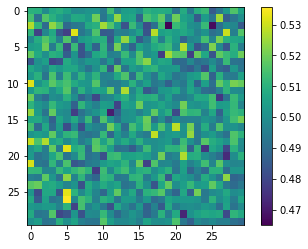

In [36]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

- 이전 PatchGAN에 대해 설명했던 것 처럼, 위 (30,30) 크기를 갖는 결과 이미지의 각 픽셀값은 원래 입력의 (70,70) 패치에 대한 분류 결과 입니다.
- 전체 입력의 크기가 (256,256) 이므로, 각각의 (70,70) 패치는 원래 입력상에서 많이 겹쳐있겠죠.
- 각각의 픽셀값은 sigmoid 함수의 결과값이므로 0~1 사이의 값을 가지며, 진짜 및 가짜 데이터를 판별해내는데 사용합니다.

- 드디어 Pix2Pix를 구성하는 Generator와 Discriminator의 구현이 끝났습니다.
- 다음 단계에서 본격적인 모델 학습을 진행해 봅시다!

# 난 스케치를 할테니 너는 채색을 하거라 (5) 학습 및 테스트하기
- 이번 단계에서는 구현된 Generator와 Discriminator를 학습시켜보고, 스케치를 입력으로 채색된 이미지를 생성해 봅시다. 먼저 학습에 필요한 손실함수 부터 정의하겠습니다.
- 논문의 여러 실험 결과 중 손실함수 선택에 따른 결과의 차이는 아래와 같습니다.

![title](p2p_result_loss2.max-800x600.png)

- 레이블 정보만 있는 입력에 대해 여러 손실함수를 사용해 실제 이미지를 만들어 낸 결과는, 일반적인 GAN의 손실함수에 L1을 추가로 이용했을 때
- 가장 실제에 가까운 이미지를 생성해 냈습니다. 이번 실험에서도 두 가지 손실 함수를 모두 사용해 봅시다.


In [37]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅



- Generator 및 Discriminator의 손실 계산을 각각 정의했습니다.

    - Generator의 손실함수 (위 코드의 get_gene_loss)는 총 3개의 입력이 있습니다.
    - 이 중 fake_disc는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값이며, 실제 이미지를 뜻하는 "1"과 비교하기 위해 tf.ones_like()를 사용합니다.
    - 또한 L1 손실을 계산하기 위해 생성한 가짜이미지(fake_output)와 실제 이미지(real_output) 사이의 MAE(Mean Absolute Error)를 계산합니다.

    - Discriminator의 손실함수 (위 코드의 get_disc_loss)는 2개의 입력이 있으며, 이들은 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값입니다.
    - Discriminator는 실제 이미지를 잘 구분해 내야 하므로 real_disc는 "1"로 채워진 벡터와 비교하고, fake_disc는 "0"으로 채워진 벡터와 비교합니다.

- 사용할 optimizer는 논문과 동일하게 아래와 같이 설정합니다.



In [38]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅



- 하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트 하는 과정은 아래와 같이 구현했습니다.

In [39]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


- 전반적인 학습 과정은 앞서 진행했었던 cGAN 학습과 크게 다르지 않습니다.
- 다만 위 코드의 gene_total_loss 계산 라인에서 최종 Generator 손실을 계산할 때, L1 손실에 100을 곱한 부분을 확인 하셨나요? (## 이 표시가 있는 부분을 확인해 주세요.) 논문에서는 Generator의 손실을 아래와 같이 정의했습니다.
    
![title](Generator_loss.png)    

- 위 식에서 λ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100 을 사용했습니다.

- 앞서 정의한 함수를 이용해서 학습을 진행합니다. 우선 10 epoch 학습해 봅시다.

In [91]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:1.1854                     
L1_loss:0.4904                     
Discriminator_loss:1.2460

EPOCH[1] - STEP[20]                     
Generator_loss:0.8864                     
L1_loss:0.2917                     
Discriminator_loss:1.2142

EPOCH[1] - STEP[30]                     
Generator_loss:1.0476                     
L1_loss:0.3189                     
Discriminator_loss:1.3749

EPOCH[1] - STEP[40]                     
Generator_loss:0.9881                     
L1_loss:0.2541                     
Discriminator_loss:1.0122

EPOCH[1] - STEP[50]                     
Generator_loss:1.5812                     
L1_loss:0.2416                     
Discriminator_loss:0.8710

EPOCH[1] - STEP[60]                     
Generator_loss:1.8158                     
L1_loss:0.2848                     
Discriminator_loss:0.5813

EPOCH[1] - STEP[70]                     
Generator_loss:1.1637                     
L1_loss:0.2547                    

EPOCH[3] - STEP[170]                     
Generator_loss:2.6317                     
L1_loss:0.2714                     
Discriminator_loss:0.4874

EPOCH[3] - STEP[180]                     
Generator_loss:3.3998                     
L1_loss:0.2624                     
Discriminator_loss:1.7796

EPOCH[3] - STEP[190]                     
Generator_loss:1.8778                     
L1_loss:0.2114                     
Discriminator_loss:0.4593

EPOCH[3] - STEP[200]                     
Generator_loss:2.1676                     
L1_loss:0.2320                     
Discriminator_loss:0.2184

EPOCH[4] - STEP[10]                     
Generator_loss:2.0236                     
L1_loss:0.2307                     
Discriminator_loss:0.6226

EPOCH[4] - STEP[20]                     
Generator_loss:0.2488                     
L1_loss:0.2104                     
Discriminator_loss:1.9006

EPOCH[4] - STEP[30]                     
Generator_loss:1.6653                     
L1_loss:0.2552                

EPOCH[6] - STEP[130]                     
Generator_loss:3.0803                     
L1_loss:0.2514                     
Discriminator_loss:0.4373

EPOCH[6] - STEP[140]                     
Generator_loss:1.5562                     
L1_loss:0.3083                     
Discriminator_loss:0.4565

EPOCH[6] - STEP[150]                     
Generator_loss:1.7044                     
L1_loss:0.2546                     
Discriminator_loss:0.7087

EPOCH[6] - STEP[160]                     
Generator_loss:1.0730                     
L1_loss:0.2435                     
Discriminator_loss:0.5515

EPOCH[6] - STEP[170]                     
Generator_loss:3.0690                     
L1_loss:0.3137                     
Discriminator_loss:1.2904

EPOCH[6] - STEP[180]                     
Generator_loss:2.6266                     
L1_loss:0.2775                     
Discriminator_loss:0.4066

EPOCH[6] - STEP[190]                     
Generator_loss:2.5682                     
L1_loss:0.2611             

EPOCH[9] - STEP[90]                     
Generator_loss:3.6174                     
L1_loss:0.2610                     
Discriminator_loss:0.4338

EPOCH[9] - STEP[100]                     
Generator_loss:1.0166                     
L1_loss:0.2057                     
Discriminator_loss:0.5914

EPOCH[9] - STEP[110]                     
Generator_loss:1.4100                     
L1_loss:0.2229                     
Discriminator_loss:0.7777

EPOCH[9] - STEP[120]                     
Generator_loss:0.9831                     
L1_loss:0.2167                     
Discriminator_loss:1.1101

EPOCH[9] - STEP[130]                     
Generator_loss:1.6884                     
L1_loss:0.2532                     
Discriminator_loss:0.2896

EPOCH[9] - STEP[140]                     
Generator_loss:2.3681                     
L1_loss:0.2807                     
Discriminator_loss:0.6587

EPOCH[9] - STEP[150]                     
Generator_loss:2.3642                     
L1_loss:0.2417              

- 아래 코드로 짧게나마 학습해 본 모델에 채색을 시켜봅시다. 아마 마음에 안들겁니다.. 😥

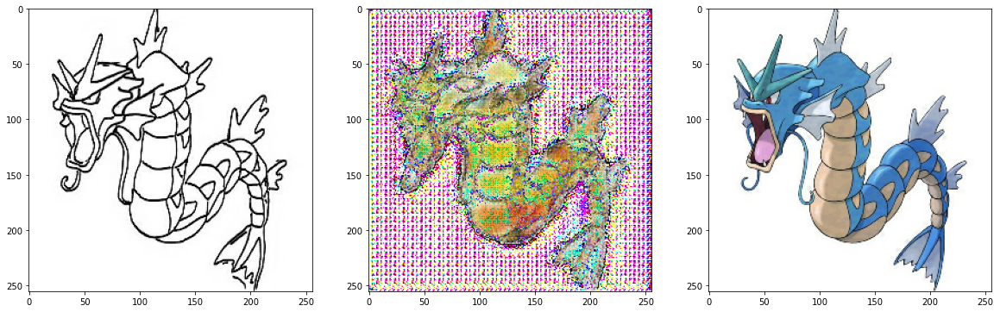

In [92]:
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

- 데이터셋을 제공한 출처를 보면, Pix2Pix로 128 epoch 학습 후 테스트 결과가 아래와 같다고 합니다.
- 이전 10 epoch 학습의 결과보다는 훨씬 낫지만, 조금 오래 학습했어도 채색해야 할 전체적인 색감 정도만 학습되며 아직까지 세부적으로는 제대로 채색되지 않다는 것을 확인할 수 있습니다.

![title](pokemon_result.max-800x600.png)

- 지금까지 꽤 많은 시간을 투자해서 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현까지 이해하느라 고생하셨습니다.
- 앞서 다뤘던 코드의 이해에 큰 어려움이 없었다면, 연습을 통해 이와 비슷한 구조의 모델들 또한 쉽게 구현할 수 있을 것입니다.
- (U-Net Generator를 구현했으니 원래 segmentation에 사용되었던 U-Net도 쉽게 구현할 수 있습니다!).

- 이번 학습을 통해서 여러분이 Pix2Pix 구조뿐만 아니라 CNN 기반의 어떠한 구조라도 자신을 갖고 구현을 시작할 수 있길 바랍니다.
- 마지막으로 다음 단계로 넘어가서 Pix2Pix를 이용한 프로젝트를 수행해봅시다.

In [40]:
EPOCHS = 200

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:1.0160                     
L1_loss:0.4621                     
Discriminator_loss:1.1271

EPOCH[1] - STEP[20]                     
Generator_loss:1.0231                     
L1_loss:0.3299                     
Discriminator_loss:1.3675

EPOCH[1] - STEP[30]                     
Generator_loss:1.2699                     
L1_loss:0.3399                     
Discriminator_loss:1.1682

EPOCH[1] - STEP[40]                     
Generator_loss:1.2457                     
L1_loss:0.2526                     
Discriminator_loss:0.9581

EPOCH[1] - STEP[50]                     
Generator_loss:1.4900                     
L1_loss:0.3391                     
Discriminator_loss:0.6275

EPOCH[1] - STEP[60]                     
Generator_loss:1.6553                     
L1_loss:0.2851                     
Discriminator_loss:0.4581

EPOCH[1] - STEP[70]                     
Generator_loss:1.4952                     
L1_loss:0.2162                    

EPOCH[3] - STEP[170]                     
Generator_loss:0.4416                     
L1_loss:0.2268                     
Discriminator_loss:1.9264

EPOCH[3] - STEP[180]                     
Generator_loss:0.1530                     
L1_loss:0.2635                     
Discriminator_loss:2.3365

EPOCH[3] - STEP[190]                     
Generator_loss:2.1344                     
L1_loss:0.2214                     
Discriminator_loss:0.4929

EPOCH[3] - STEP[200]                     
Generator_loss:1.2546                     
L1_loss:0.2530                     
Discriminator_loss:0.4868

EPOCH[4] - STEP[10]                     
Generator_loss:0.6778                     
L1_loss:0.2304                     
Discriminator_loss:1.3839

EPOCH[4] - STEP[20]                     
Generator_loss:3.2667                     
L1_loss:0.2534                     
Discriminator_loss:0.9430

EPOCH[4] - STEP[30]                     
Generator_loss:0.1026                     
L1_loss:0.2358                

EPOCH[6] - STEP[130]                     
Generator_loss:2.4899                     
L1_loss:0.2820                     
Discriminator_loss:0.1595

EPOCH[6] - STEP[140]                     
Generator_loss:1.2860                     
L1_loss:0.2362                     
Discriminator_loss:0.5357

EPOCH[6] - STEP[150]                     
Generator_loss:2.9938                     
L1_loss:0.2518                     
Discriminator_loss:1.0831

EPOCH[6] - STEP[160]                     
Generator_loss:1.1299                     
L1_loss:0.2235                     
Discriminator_loss:1.3842

EPOCH[6] - STEP[170]                     
Generator_loss:1.2449                     
L1_loss:0.2173                     
Discriminator_loss:0.5863

EPOCH[6] - STEP[180]                     
Generator_loss:2.0352                     
L1_loss:0.2115                     
Discriminator_loss:0.4276

EPOCH[6] - STEP[190]                     
Generator_loss:2.1258                     
L1_loss:0.2507             

EPOCH[9] - STEP[90]                     
Generator_loss:1.3679                     
L1_loss:0.2271                     
Discriminator_loss:0.3918

EPOCH[9] - STEP[100]                     
Generator_loss:2.6091                     
L1_loss:0.2321                     
Discriminator_loss:0.1641

EPOCH[9] - STEP[110]                     
Generator_loss:3.8959                     
L1_loss:0.3113                     
Discriminator_loss:0.9098

EPOCH[9] - STEP[120]                     
Generator_loss:2.1767                     
L1_loss:0.2638                     
Discriminator_loss:0.2594

EPOCH[9] - STEP[130]                     
Generator_loss:1.4934                     
L1_loss:0.2352                     
Discriminator_loss:0.6075

EPOCH[9] - STEP[140]                     
Generator_loss:1.7723                     
L1_loss:0.2303                     
Discriminator_loss:0.2346

EPOCH[9] - STEP[150]                     
Generator_loss:2.1155                     
L1_loss:0.2354              

EPOCH[12] - STEP[50]                     
Generator_loss:1.7655                     
L1_loss:0.2257                     
Discriminator_loss:0.2484

EPOCH[12] - STEP[60]                     
Generator_loss:1.5043                     
L1_loss:0.2515                     
Discriminator_loss:0.4266

EPOCH[12] - STEP[70]                     
Generator_loss:2.5214                     
L1_loss:0.2633                     
Discriminator_loss:0.7732

EPOCH[12] - STEP[80]                     
Generator_loss:1.4429                     
L1_loss:0.2839                     
Discriminator_loss:0.6949

EPOCH[12] - STEP[90]                     
Generator_loss:1.0269                     
L1_loss:0.1949                     
Discriminator_loss:0.6464

EPOCH[12] - STEP[100]                     
Generator_loss:2.0723                     
L1_loss:0.2288                     
Discriminator_loss:0.5292

EPOCH[12] - STEP[110]                     
Generator_loss:0.1688                     
L1_loss:0.1959           

EPOCH[15] - STEP[10]                     
Generator_loss:2.8623                     
L1_loss:0.2377                     
Discriminator_loss:0.5715

EPOCH[15] - STEP[20]                     
Generator_loss:1.1575                     
L1_loss:0.3318                     
Discriminator_loss:0.5141

EPOCH[15] - STEP[30]                     
Generator_loss:1.5578                     
L1_loss:0.3006                     
Discriminator_loss:0.3174

EPOCH[15] - STEP[40]                     
Generator_loss:3.2718                     
L1_loss:0.2169                     
Discriminator_loss:2.0648

EPOCH[15] - STEP[50]                     
Generator_loss:1.3536                     
L1_loss:0.2093                     
Discriminator_loss:0.7006

EPOCH[15] - STEP[60]                     
Generator_loss:3.6250                     
L1_loss:0.1935                     
Discriminator_loss:1.3810

EPOCH[15] - STEP[70]                     
Generator_loss:3.5145                     
L1_loss:0.2844             

EPOCH[17] - STEP[170]                     
Generator_loss:1.4493                     
L1_loss:0.2143                     
Discriminator_loss:0.7122

EPOCH[17] - STEP[180]                     
Generator_loss:2.0469                     
L1_loss:0.2447                     
Discriminator_loss:0.3532

EPOCH[17] - STEP[190]                     
Generator_loss:2.8966                     
L1_loss:0.2528                     
Discriminator_loss:0.2690

EPOCH[17] - STEP[200]                     
Generator_loss:1.1920                     
L1_loss:0.2108                     
Discriminator_loss:0.5439

EPOCH[18] - STEP[10]                     
Generator_loss:2.7482                     
L1_loss:0.2465                     
Discriminator_loss:0.4388

EPOCH[18] - STEP[20]                     
Generator_loss:2.3062                     
L1_loss:0.2516                     
Discriminator_loss:0.8272

EPOCH[18] - STEP[30]                     
Generator_loss:0.8839                     
L1_loss:0.2587         

EPOCH[20] - STEP[130]                     
Generator_loss:0.7382                     
L1_loss:0.1993                     
Discriminator_loss:0.7674

EPOCH[20] - STEP[140]                     
Generator_loss:2.6070                     
L1_loss:0.2359                     
Discriminator_loss:1.6077

EPOCH[20] - STEP[150]                     
Generator_loss:0.8345                     
L1_loss:0.2108                     
Discriminator_loss:0.8948

EPOCH[20] - STEP[160]                     
Generator_loss:3.2019                     
L1_loss:0.1978                     
Discriminator_loss:0.5911

EPOCH[20] - STEP[170]                     
Generator_loss:1.1192                     
L1_loss:0.2609                     
Discriminator_loss:0.4753

EPOCH[20] - STEP[180]                     
Generator_loss:3.0685                     
L1_loss:0.2805                     
Discriminator_loss:0.9558

EPOCH[20] - STEP[190]                     
Generator_loss:3.7819                     
L1_loss:0.2134      

EPOCH[23] - STEP[90]                     
Generator_loss:1.4182                     
L1_loss:0.2266                     
Discriminator_loss:0.4127

EPOCH[23] - STEP[100]                     
Generator_loss:1.5234                     
L1_loss:0.2306                     
Discriminator_loss:0.3222

EPOCH[23] - STEP[110]                     
Generator_loss:1.1641                     
L1_loss:0.1978                     
Discriminator_loss:0.5090

EPOCH[23] - STEP[120]                     
Generator_loss:0.0441                     
L1_loss:0.2867                     
Discriminator_loss:3.4551

EPOCH[23] - STEP[130]                     
Generator_loss:1.7244                     
L1_loss:0.2383                     
Discriminator_loss:0.3988

EPOCH[23] - STEP[140]                     
Generator_loss:2.4692                     
L1_loss:0.2100                     
Discriminator_loss:1.4876

EPOCH[23] - STEP[150]                     
Generator_loss:1.2524                     
L1_loss:0.2126       

EPOCH[26] - STEP[50]                     
Generator_loss:1.8303                     
L1_loss:0.1696                     
Discriminator_loss:0.6862

EPOCH[26] - STEP[60]                     
Generator_loss:0.2718                     
L1_loss:0.2125                     
Discriminator_loss:1.6056

EPOCH[26] - STEP[70]                     
Generator_loss:2.9322                     
L1_loss:0.2627                     
Discriminator_loss:0.2497

EPOCH[26] - STEP[80]                     
Generator_loss:2.6220                     
L1_loss:0.2465                     
Discriminator_loss:0.2162

EPOCH[26] - STEP[90]                     
Generator_loss:1.3473                     
L1_loss:0.2440                     
Discriminator_loss:0.4626

EPOCH[26] - STEP[100]                     
Generator_loss:2.6590                     
L1_loss:0.2388                     
Discriminator_loss:0.7146

EPOCH[26] - STEP[110]                     
Generator_loss:0.2152                     
L1_loss:0.2743           

EPOCH[29] - STEP[10]                     
Generator_loss:1.4190                     
L1_loss:0.1879                     
Discriminator_loss:2.7682

EPOCH[29] - STEP[20]                     
Generator_loss:1.5723                     
L1_loss:0.2995                     
Discriminator_loss:0.2824

EPOCH[29] - STEP[30]                     
Generator_loss:3.4832                     
L1_loss:0.2885                     
Discriminator_loss:1.4704

EPOCH[29] - STEP[40]                     
Generator_loss:1.9025                     
L1_loss:0.2766                     
Discriminator_loss:0.2900

EPOCH[29] - STEP[50]                     
Generator_loss:2.7716                     
L1_loss:0.2195                     
Discriminator_loss:1.0564

EPOCH[29] - STEP[60]                     
Generator_loss:2.3243                     
L1_loss:0.2450                     
Discriminator_loss:0.2839

EPOCH[29] - STEP[70]                     
Generator_loss:2.6523                     
L1_loss:0.2314             

EPOCH[31] - STEP[170]                     
Generator_loss:1.4203                     
L1_loss:0.2809                     
Discriminator_loss:0.3458

EPOCH[31] - STEP[180]                     
Generator_loss:3.5641                     
L1_loss:0.2527                     
Discriminator_loss:0.1024

EPOCH[31] - STEP[190]                     
Generator_loss:0.3817                     
L1_loss:0.2418                     
Discriminator_loss:1.4697

EPOCH[31] - STEP[200]                     
Generator_loss:3.4455                     
L1_loss:0.2385                     
Discriminator_loss:0.3589

EPOCH[32] - STEP[10]                     
Generator_loss:0.9495                     
L1_loss:0.2541                     
Discriminator_loss:0.7029

EPOCH[32] - STEP[20]                     
Generator_loss:0.5169                     
L1_loss:0.2198                     
Discriminator_loss:1.0816

EPOCH[32] - STEP[30]                     
Generator_loss:0.7351                     
L1_loss:0.2386         

EPOCH[34] - STEP[130]                     
Generator_loss:1.8668                     
L1_loss:0.2290                     
Discriminator_loss:0.5215

EPOCH[34] - STEP[140]                     
Generator_loss:2.5980                     
L1_loss:0.2651                     
Discriminator_loss:0.1364

EPOCH[34] - STEP[150]                     
Generator_loss:1.0638                     
L1_loss:0.2352                     
Discriminator_loss:0.5168

EPOCH[34] - STEP[160]                     
Generator_loss:1.3977                     
L1_loss:0.2630                     
Discriminator_loss:0.6521

EPOCH[34] - STEP[170]                     
Generator_loss:0.3910                     
L1_loss:0.2373                     
Discriminator_loss:1.2616

EPOCH[34] - STEP[180]                     
Generator_loss:2.2043                     
L1_loss:0.2125                     
Discriminator_loss:0.1970

EPOCH[34] - STEP[190]                     
Generator_loss:1.2589                     
L1_loss:0.2921      

EPOCH[37] - STEP[90]                     
Generator_loss:4.0350                     
L1_loss:0.2104                     
Discriminator_loss:0.1138

EPOCH[37] - STEP[100]                     
Generator_loss:3.3680                     
L1_loss:0.2322                     
Discriminator_loss:0.1399

EPOCH[37] - STEP[110]                     
Generator_loss:2.1027                     
L1_loss:0.2042                     
Discriminator_loss:0.2546

EPOCH[37] - STEP[120]                     
Generator_loss:1.0911                     
L1_loss:0.2258                     
Discriminator_loss:0.5877

EPOCH[37] - STEP[130]                     
Generator_loss:4.2132                     
L1_loss:0.2328                     
Discriminator_loss:0.1908

EPOCH[37] - STEP[140]                     
Generator_loss:3.0932                     
L1_loss:0.2178                     
Discriminator_loss:0.4764

EPOCH[37] - STEP[150]                     
Generator_loss:3.0442                     
L1_loss:0.2053       

EPOCH[40] - STEP[50]                     
Generator_loss:4.3023                     
L1_loss:0.2313                     
Discriminator_loss:0.8805

EPOCH[40] - STEP[60]                     
Generator_loss:0.3845                     
L1_loss:0.2364                     
Discriminator_loss:1.3579

EPOCH[40] - STEP[70]                     
Generator_loss:4.3503                     
L1_loss:0.2520                     
Discriminator_loss:0.2741

EPOCH[40] - STEP[80]                     
Generator_loss:3.1567                     
L1_loss:0.2850                     
Discriminator_loss:0.0745

EPOCH[40] - STEP[90]                     
Generator_loss:0.0347                     
L1_loss:0.2267                     
Discriminator_loss:4.0266

EPOCH[40] - STEP[100]                     
Generator_loss:3.1122                     
L1_loss:0.1965                     
Discriminator_loss:0.1515

EPOCH[40] - STEP[110]                     
Generator_loss:3.1212                     
L1_loss:0.2656           

EPOCH[43] - STEP[10]                     
Generator_loss:3.5250                     
L1_loss:0.2374                     
Discriminator_loss:0.1043

EPOCH[43] - STEP[20]                     
Generator_loss:2.1952                     
L1_loss:0.2402                     
Discriminator_loss:0.1591

EPOCH[43] - STEP[30]                     
Generator_loss:1.2433                     
L1_loss:0.2562                     
Discriminator_loss:0.4009

EPOCH[43] - STEP[40]                     
Generator_loss:2.8863                     
L1_loss:0.2328                     
Discriminator_loss:0.2869

EPOCH[43] - STEP[50]                     
Generator_loss:0.1853                     
L1_loss:0.2329                     
Discriminator_loss:2.4321

EPOCH[43] - STEP[60]                     
Generator_loss:5.4886                     
L1_loss:0.2600                     
Discriminator_loss:1.6415

EPOCH[43] - STEP[70]                     
Generator_loss:2.2141                     
L1_loss:0.2311             

EPOCH[45] - STEP[170]                     
Generator_loss:2.4129                     
L1_loss:0.2812                     
Discriminator_loss:0.1146

EPOCH[45] - STEP[180]                     
Generator_loss:3.7554                     
L1_loss:0.2371                     
Discriminator_loss:1.2588

EPOCH[45] - STEP[190]                     
Generator_loss:3.1648                     
L1_loss:0.2113                     
Discriminator_loss:0.1110

EPOCH[45] - STEP[200]                     
Generator_loss:2.4187                     
L1_loss:0.1932                     
Discriminator_loss:0.2994

EPOCH[46] - STEP[10]                     
Generator_loss:0.6555                     
L1_loss:0.2107                     
Discriminator_loss:0.9300

EPOCH[46] - STEP[20]                     
Generator_loss:5.5154                     
L1_loss:0.2386                     
Discriminator_loss:0.1875

EPOCH[46] - STEP[30]                     
Generator_loss:3.0415                     
L1_loss:0.1976         

EPOCH[48] - STEP[130]                     
Generator_loss:4.7927                     
L1_loss:0.2177                     
Discriminator_loss:0.4082

EPOCH[48] - STEP[140]                     
Generator_loss:2.6650                     
L1_loss:0.2287                     
Discriminator_loss:0.5047

EPOCH[48] - STEP[150]                     
Generator_loss:0.5429                     
L1_loss:0.2919                     
Discriminator_loss:1.4789

EPOCH[48] - STEP[160]                     
Generator_loss:2.5788                     
L1_loss:0.2155                     
Discriminator_loss:2.6270

EPOCH[48] - STEP[170]                     
Generator_loss:2.7248                     
L1_loss:0.2296                     
Discriminator_loss:0.1642

EPOCH[48] - STEP[180]                     
Generator_loss:0.8070                     
L1_loss:0.2510                     
Discriminator_loss:0.6979

EPOCH[48] - STEP[190]                     
Generator_loss:2.4172                     
L1_loss:0.2536      

EPOCH[51] - STEP[90]                     
Generator_loss:0.2865                     
L1_loss:0.2265                     
Discriminator_loss:1.8210

EPOCH[51] - STEP[100]                     
Generator_loss:1.9508                     
L1_loss:0.1947                     
Discriminator_loss:0.6424

EPOCH[51] - STEP[110]                     
Generator_loss:0.2945                     
L1_loss:0.2028                     
Discriminator_loss:1.5870

EPOCH[51] - STEP[120]                     
Generator_loss:3.0229                     
L1_loss:0.1934                     
Discriminator_loss:0.0742

EPOCH[51] - STEP[130]                     
Generator_loss:3.9219                     
L1_loss:0.2488                     
Discriminator_loss:0.0692

EPOCH[51] - STEP[140]                     
Generator_loss:2.5332                     
L1_loss:0.2133                     
Discriminator_loss:0.1670

EPOCH[51] - STEP[150]                     
Generator_loss:2.7107                     
L1_loss:0.2089       

EPOCH[54] - STEP[50]                     
Generator_loss:1.9903                     
L1_loss:0.2315                     
Discriminator_loss:0.1995

EPOCH[54] - STEP[60]                     
Generator_loss:3.5965                     
L1_loss:0.2379                     
Discriminator_loss:0.1672

EPOCH[54] - STEP[70]                     
Generator_loss:2.6977                     
L1_loss:0.1764                     
Discriminator_loss:0.2264

EPOCH[54] - STEP[80]                     
Generator_loss:2.2488                     
L1_loss:0.1976                     
Discriminator_loss:0.4250

EPOCH[54] - STEP[90]                     
Generator_loss:1.5271                     
L1_loss:0.2445                     
Discriminator_loss:0.3587

EPOCH[54] - STEP[100]                     
Generator_loss:2.9500                     
L1_loss:0.2200                     
Discriminator_loss:0.0726

EPOCH[54] - STEP[110]                     
Generator_loss:2.8347                     
L1_loss:0.1929           

EPOCH[57] - STEP[10]                     
Generator_loss:1.3543                     
L1_loss:0.2142                     
Discriminator_loss:0.3701

EPOCH[57] - STEP[20]                     
Generator_loss:3.5359                     
L1_loss:0.2464                     
Discriminator_loss:0.6933

EPOCH[57] - STEP[30]                     
Generator_loss:5.0582                     
L1_loss:0.2086                     
Discriminator_loss:0.8947

EPOCH[57] - STEP[40]                     
Generator_loss:1.9777                     
L1_loss:0.2356                     
Discriminator_loss:0.2012

EPOCH[57] - STEP[50]                     
Generator_loss:2.8190                     
L1_loss:0.2878                     
Discriminator_loss:0.2079

EPOCH[57] - STEP[60]                     
Generator_loss:2.7933                     
L1_loss:0.2725                     
Discriminator_loss:0.1452

EPOCH[57] - STEP[70]                     
Generator_loss:3.3596                     
L1_loss:0.2557             

EPOCH[59] - STEP[170]                     
Generator_loss:2.5819                     
L1_loss:0.2090                     
Discriminator_loss:0.3723

EPOCH[59] - STEP[180]                     
Generator_loss:1.5148                     
L1_loss:0.2003                     
Discriminator_loss:0.4373

EPOCH[59] - STEP[190]                     
Generator_loss:3.3766                     
L1_loss:0.1885                     
Discriminator_loss:0.3029

EPOCH[59] - STEP[200]                     
Generator_loss:1.3238                     
L1_loss:0.2194                     
Discriminator_loss:0.8020

EPOCH[60] - STEP[10]                     
Generator_loss:3.3298                     
L1_loss:0.2245                     
Discriminator_loss:0.3762

EPOCH[60] - STEP[20]                     
Generator_loss:1.0730                     
L1_loss:0.2139                     
Discriminator_loss:0.6210

EPOCH[60] - STEP[30]                     
Generator_loss:2.7825                     
L1_loss:0.2250         

EPOCH[62] - STEP[130]                     
Generator_loss:1.8271                     
L1_loss:0.2295                     
Discriminator_loss:0.3308

EPOCH[62] - STEP[140]                     
Generator_loss:2.3064                     
L1_loss:0.2198                     
Discriminator_loss:0.2426

EPOCH[62] - STEP[150]                     
Generator_loss:3.0252                     
L1_loss:0.2078                     
Discriminator_loss:0.5053

EPOCH[62] - STEP[160]                     
Generator_loss:2.5491                     
L1_loss:0.2220                     
Discriminator_loss:0.6588

EPOCH[62] - STEP[170]                     
Generator_loss:2.2200                     
L1_loss:0.2330                     
Discriminator_loss:0.1689

EPOCH[62] - STEP[180]                     
Generator_loss:1.9824                     
L1_loss:0.2527                     
Discriminator_loss:0.2466

EPOCH[62] - STEP[190]                     
Generator_loss:2.5654                     
L1_loss:0.1767      

EPOCH[65] - STEP[90]                     
Generator_loss:4.2166                     
L1_loss:0.1875                     
Discriminator_loss:1.0267

EPOCH[65] - STEP[100]                     
Generator_loss:3.0433                     
L1_loss:0.2331                     
Discriminator_loss:0.7090

EPOCH[65] - STEP[110]                     
Generator_loss:2.5609                     
L1_loss:0.2345                     
Discriminator_loss:0.1420

EPOCH[65] - STEP[120]                     
Generator_loss:2.9199                     
L1_loss:0.3920                     
Discriminator_loss:0.0878

EPOCH[65] - STEP[130]                     
Generator_loss:0.8317                     
L1_loss:0.2038                     
Discriminator_loss:0.7402

EPOCH[65] - STEP[140]                     
Generator_loss:3.7023                     
L1_loss:0.1912                     
Discriminator_loss:0.1617

EPOCH[65] - STEP[150]                     
Generator_loss:3.4088                     
L1_loss:0.2468       

EPOCH[68] - STEP[50]                     
Generator_loss:3.5921                     
L1_loss:0.2412                     
Discriminator_loss:0.1618

EPOCH[68] - STEP[60]                     
Generator_loss:4.3831                     
L1_loss:0.2477                     
Discriminator_loss:0.1172

EPOCH[68] - STEP[70]                     
Generator_loss:3.3371                     
L1_loss:0.2646                     
Discriminator_loss:0.1463

EPOCH[68] - STEP[80]                     
Generator_loss:1.4232                     
L1_loss:0.1952                     
Discriminator_loss:0.4141

EPOCH[68] - STEP[90]                     
Generator_loss:4.7315                     
L1_loss:0.2027                     
Discriminator_loss:0.5623

EPOCH[68] - STEP[100]                     
Generator_loss:5.5256                     
L1_loss:0.1943                     
Discriminator_loss:0.0897

EPOCH[68] - STEP[110]                     
Generator_loss:4.0698                     
L1_loss:0.2616           

EPOCH[71] - STEP[10]                     
Generator_loss:1.3055                     
L1_loss:0.2122                     
Discriminator_loss:0.4251

EPOCH[71] - STEP[20]                     
Generator_loss:2.9024                     
L1_loss:0.2192                     
Discriminator_loss:0.1816

EPOCH[71] - STEP[30]                     
Generator_loss:4.2949                     
L1_loss:0.1923                     
Discriminator_loss:0.3750

EPOCH[71] - STEP[40]                     
Generator_loss:4.2214                     
L1_loss:0.2198                     
Discriminator_loss:0.7189

EPOCH[71] - STEP[50]                     
Generator_loss:2.8352                     
L1_loss:0.1884                     
Discriminator_loss:1.7146

EPOCH[71] - STEP[60]                     
Generator_loss:1.9079                     
L1_loss:0.2012                     
Discriminator_loss:0.3053

EPOCH[71] - STEP[70]                     
Generator_loss:3.6735                     
L1_loss:0.2290             

EPOCH[73] - STEP[170]                     
Generator_loss:0.4497                     
L1_loss:0.1965                     
Discriminator_loss:1.2406

EPOCH[73] - STEP[180]                     
Generator_loss:5.5883                     
L1_loss:0.2365                     
Discriminator_loss:3.8232

EPOCH[73] - STEP[190]                     
Generator_loss:3.6939                     
L1_loss:0.2137                     
Discriminator_loss:1.1353

EPOCH[73] - STEP[200]                     
Generator_loss:3.8820                     
L1_loss:0.2157                     
Discriminator_loss:0.1570

EPOCH[74] - STEP[10]                     
Generator_loss:4.2906                     
L1_loss:0.2253                     
Discriminator_loss:0.4095

EPOCH[74] - STEP[20]                     
Generator_loss:2.5422                     
L1_loss:0.2106                     
Discriminator_loss:0.5718

EPOCH[74] - STEP[30]                     
Generator_loss:2.0139                     
L1_loss:0.2312         

EPOCH[76] - STEP[130]                     
Generator_loss:3.0583                     
L1_loss:0.1743                     
Discriminator_loss:0.3593

EPOCH[76] - STEP[140]                     
Generator_loss:0.7215                     
L1_loss:0.2122                     
Discriminator_loss:0.8020

EPOCH[76] - STEP[150]                     
Generator_loss:4.3312                     
L1_loss:0.2128                     
Discriminator_loss:1.0320

EPOCH[76] - STEP[160]                     
Generator_loss:1.6644                     
L1_loss:0.1750                     
Discriminator_loss:0.5304

EPOCH[76] - STEP[170]                     
Generator_loss:2.4034                     
L1_loss:0.2085                     
Discriminator_loss:0.2106

EPOCH[76] - STEP[180]                     
Generator_loss:2.4382                     
L1_loss:0.2190                     
Discriminator_loss:0.4234

EPOCH[76] - STEP[190]                     
Generator_loss:1.4351                     
L1_loss:0.2196      

EPOCH[79] - STEP[90]                     
Generator_loss:1.9559                     
L1_loss:0.2509                     
Discriminator_loss:0.3019

EPOCH[79] - STEP[100]                     
Generator_loss:3.9564                     
L1_loss:0.1724                     
Discriminator_loss:0.1150

EPOCH[79] - STEP[110]                     
Generator_loss:2.7084                     
L1_loss:0.2302                     
Discriminator_loss:0.1223

EPOCH[79] - STEP[120]                     
Generator_loss:0.9799                     
L1_loss:0.2670                     
Discriminator_loss:0.6362

EPOCH[79] - STEP[130]                     
Generator_loss:1.5661                     
L1_loss:0.2281                     
Discriminator_loss:0.3176

EPOCH[79] - STEP[140]                     
Generator_loss:2.3294                     
L1_loss:0.2326                     
Discriminator_loss:0.1650

EPOCH[79] - STEP[150]                     
Generator_loss:2.2934                     
L1_loss:0.2272       

EPOCH[82] - STEP[50]                     
Generator_loss:2.7276                     
L1_loss:0.2080                     
Discriminator_loss:0.3080

EPOCH[82] - STEP[60]                     
Generator_loss:2.3577                     
L1_loss:0.2127                     
Discriminator_loss:0.3722

EPOCH[82] - STEP[70]                     
Generator_loss:3.7997                     
L1_loss:0.2144                     
Discriminator_loss:0.0857

EPOCH[82] - STEP[80]                     
Generator_loss:4.1674                     
L1_loss:0.2242                     
Discriminator_loss:0.7115

EPOCH[82] - STEP[90]                     
Generator_loss:4.8662                     
L1_loss:0.2211                     
Discriminator_loss:0.2325

EPOCH[82] - STEP[100]                     
Generator_loss:2.5335                     
L1_loss:0.2249                     
Discriminator_loss:0.2428

EPOCH[82] - STEP[110]                     
Generator_loss:3.2941                     
L1_loss:0.2006           

EPOCH[85] - STEP[10]                     
Generator_loss:3.9748                     
L1_loss:0.2517                     
Discriminator_loss:0.0987

EPOCH[85] - STEP[20]                     
Generator_loss:3.8831                     
L1_loss:0.2176                     
Discriminator_loss:1.2562

EPOCH[85] - STEP[30]                     
Generator_loss:5.1166                     
L1_loss:0.1943                     
Discriminator_loss:1.5210

EPOCH[85] - STEP[40]                     
Generator_loss:1.8654                     
L1_loss:0.2223                     
Discriminator_loss:0.4313

EPOCH[85] - STEP[50]                     
Generator_loss:0.4950                     
L1_loss:0.2421                     
Discriminator_loss:1.2453

EPOCH[85] - STEP[60]                     
Generator_loss:1.8033                     
L1_loss:0.2275                     
Discriminator_loss:0.3533

EPOCH[85] - STEP[70]                     
Generator_loss:1.0688                     
L1_loss:0.1690             

EPOCH[87] - STEP[170]                     
Generator_loss:1.3059                     
L1_loss:0.1776                     
Discriminator_loss:0.4502

EPOCH[87] - STEP[180]                     
Generator_loss:4.1357                     
L1_loss:0.2191                     
Discriminator_loss:0.3617

EPOCH[87] - STEP[190]                     
Generator_loss:3.7151                     
L1_loss:0.2276                     
Discriminator_loss:0.1691

EPOCH[87] - STEP[200]                     
Generator_loss:3.3941                     
L1_loss:0.2151                     
Discriminator_loss:0.7835

EPOCH[88] - STEP[10]                     
Generator_loss:1.4509                     
L1_loss:0.2203                     
Discriminator_loss:0.3681

EPOCH[88] - STEP[20]                     
Generator_loss:3.4730                     
L1_loss:0.2419                     
Discriminator_loss:1.1381

EPOCH[88] - STEP[30]                     
Generator_loss:3.2717                     
L1_loss:0.2251         

EPOCH[90] - STEP[130]                     
Generator_loss:1.7895                     
L1_loss:0.2398                     
Discriminator_loss:0.2740

EPOCH[90] - STEP[140]                     
Generator_loss:3.9088                     
L1_loss:0.1891                     
Discriminator_loss:0.1964

EPOCH[90] - STEP[150]                     
Generator_loss:3.3252                     
L1_loss:0.2505                     
Discriminator_loss:0.5557

EPOCH[90] - STEP[160]                     
Generator_loss:3.2422                     
L1_loss:0.2378                     
Discriminator_loss:0.4890

EPOCH[90] - STEP[170]                     
Generator_loss:0.4455                     
L1_loss:0.1972                     
Discriminator_loss:1.2278

EPOCH[90] - STEP[180]                     
Generator_loss:5.1350                     
L1_loss:0.2017                     
Discriminator_loss:0.4412

EPOCH[90] - STEP[190]                     
Generator_loss:3.6471                     
L1_loss:0.2200      

EPOCH[93] - STEP[90]                     
Generator_loss:1.8942                     
L1_loss:0.2560                     
Discriminator_loss:0.2394

EPOCH[93] - STEP[100]                     
Generator_loss:4.5392                     
L1_loss:0.2165                     
Discriminator_loss:0.0720

EPOCH[93] - STEP[110]                     
Generator_loss:0.8091                     
L1_loss:0.2420                     
Discriminator_loss:0.7019

EPOCH[93] - STEP[120]                     
Generator_loss:3.9640                     
L1_loss:0.1692                     
Discriminator_loss:0.6771

EPOCH[93] - STEP[130]                     
Generator_loss:0.9946                     
L1_loss:0.1970                     
Discriminator_loss:0.5993

EPOCH[93] - STEP[140]                     
Generator_loss:0.7616                     
L1_loss:0.2161                     
Discriminator_loss:0.7490

EPOCH[93] - STEP[150]                     
Generator_loss:0.5802                     
L1_loss:0.2524       

EPOCH[96] - STEP[50]                     
Generator_loss:3.4266                     
L1_loss:0.2701                     
Discriminator_loss:0.0894

EPOCH[96] - STEP[60]                     
Generator_loss:3.6180                     
L1_loss:0.2036                     
Discriminator_loss:0.1256

EPOCH[96] - STEP[70]                     
Generator_loss:1.4265                     
L1_loss:0.2658                     
Discriminator_loss:0.4072

EPOCH[96] - STEP[80]                     
Generator_loss:2.9689                     
L1_loss:0.2066                     
Discriminator_loss:0.1145

EPOCH[96] - STEP[90]                     
Generator_loss:2.5165                     
L1_loss:0.1989                     
Discriminator_loss:0.9766

EPOCH[96] - STEP[100]                     
Generator_loss:2.6021                     
L1_loss:0.2205                     
Discriminator_loss:0.1122

EPOCH[96] - STEP[110]                     
Generator_loss:1.6367                     
L1_loss:0.2087           

EPOCH[99] - STEP[10]                     
Generator_loss:0.8756                     
L1_loss:0.1921                     
Discriminator_loss:0.7476

EPOCH[99] - STEP[20]                     
Generator_loss:3.0381                     
L1_loss:0.2351                     
Discriminator_loss:0.0936

EPOCH[99] - STEP[30]                     
Generator_loss:3.0299                     
L1_loss:0.2226                     
Discriminator_loss:0.4694

EPOCH[99] - STEP[40]                     
Generator_loss:2.7187                     
L1_loss:0.2012                     
Discriminator_loss:0.1202

EPOCH[99] - STEP[50]                     
Generator_loss:4.9035                     
L1_loss:0.2549                     
Discriminator_loss:0.3524

EPOCH[99] - STEP[60]                     
Generator_loss:1.3228                     
L1_loss:0.2147                     
Discriminator_loss:0.4567

EPOCH[99] - STEP[70]                     
Generator_loss:0.9830                     
L1_loss:0.2267             

EPOCH[101] - STEP[160]                     
Generator_loss:3.6585                     
L1_loss:0.2338                     
Discriminator_loss:0.3114

EPOCH[101] - STEP[170]                     
Generator_loss:1.2018                     
L1_loss:0.2228                     
Discriminator_loss:0.4567

EPOCH[101] - STEP[180]                     
Generator_loss:1.5313                     
L1_loss:0.2630                     
Discriminator_loss:0.4107

EPOCH[101] - STEP[190]                     
Generator_loss:2.8137                     
L1_loss:0.2400                     
Discriminator_loss:1.2269

EPOCH[101] - STEP[200]                     
Generator_loss:0.0381                     
L1_loss:0.2256                     
Discriminator_loss:3.7468

EPOCH[102] - STEP[10]                     
Generator_loss:3.4039                     
L1_loss:0.1808                     
Discriminator_loss:0.6789

EPOCH[102] - STEP[20]                     
Generator_loss:1.9235                     
L1_loss:0.1721 

EPOCH[104] - STEP[110]                     
Generator_loss:1.1128                     
L1_loss:0.2071                     
Discriminator_loss:0.4698

EPOCH[104] - STEP[120]                     
Generator_loss:3.3189                     
L1_loss:0.2213                     
Discriminator_loss:0.3340

EPOCH[104] - STEP[130]                     
Generator_loss:2.5151                     
L1_loss:0.2197                     
Discriminator_loss:0.1580

EPOCH[104] - STEP[140]                     
Generator_loss:3.5293                     
L1_loss:0.2047                     
Discriminator_loss:0.4844

EPOCH[104] - STEP[150]                     
Generator_loss:1.4480                     
L1_loss:0.1969                     
Discriminator_loss:0.3626

EPOCH[104] - STEP[160]                     
Generator_loss:3.9343                     
L1_loss:0.2007                     
Discriminator_loss:1.4625

EPOCH[104] - STEP[170]                     
Generator_loss:3.2434                     
L1_loss:0.201

EPOCH[107] - STEP[60]                     
Generator_loss:3.8986                     
L1_loss:0.2387                     
Discriminator_loss:0.1821

EPOCH[107] - STEP[70]                     
Generator_loss:4.3003                     
L1_loss:0.1797                     
Discriminator_loss:1.3794

EPOCH[107] - STEP[80]                     
Generator_loss:1.9279                     
L1_loss:0.1915                     
Discriminator_loss:0.2190

EPOCH[107] - STEP[90]                     
Generator_loss:2.5904                     
L1_loss:0.2100                     
Discriminator_loss:1.4003

EPOCH[107] - STEP[100]                     
Generator_loss:3.1639                     
L1_loss:0.1998                     
Discriminator_loss:2.4952

EPOCH[107] - STEP[110]                     
Generator_loss:0.7112                     
L1_loss:0.1712                     
Discriminator_loss:0.8460

EPOCH[107] - STEP[120]                     
Generator_loss:4.1016                     
L1_loss:0.1674   

EPOCH[110] - STEP[10]                     
Generator_loss:4.1142                     
L1_loss:0.3101                     
Discriminator_loss:0.0325

EPOCH[110] - STEP[20]                     
Generator_loss:3.5760                     
L1_loss:0.2053                     
Discriminator_loss:1.3142

EPOCH[110] - STEP[30]                     
Generator_loss:0.8910                     
L1_loss:0.2201                     
Discriminator_loss:0.6629

EPOCH[110] - STEP[40]                     
Generator_loss:4.6532                     
L1_loss:0.1752                     
Discriminator_loss:0.6878

EPOCH[110] - STEP[50]                     
Generator_loss:1.6775                     
L1_loss:0.2108                     
Discriminator_loss:0.4805

EPOCH[110] - STEP[60]                     
Generator_loss:3.1328                     
L1_loss:0.2222                     
Discriminator_loss:0.0919

EPOCH[110] - STEP[70]                     
Generator_loss:2.9999                     
L1_loss:0.2489      

EPOCH[112] - STEP[160]                     
Generator_loss:3.3701                     
L1_loss:0.2192                     
Discriminator_loss:0.2410

EPOCH[112] - STEP[170]                     
Generator_loss:3.2064                     
L1_loss:0.2598                     
Discriminator_loss:0.5693

EPOCH[112] - STEP[180]                     
Generator_loss:3.6045                     
L1_loss:0.1537                     
Discriminator_loss:1.8992

EPOCH[112] - STEP[190]                     
Generator_loss:3.1892                     
L1_loss:0.1709                     
Discriminator_loss:0.5380

EPOCH[112] - STEP[200]                     
Generator_loss:3.7811                     
L1_loss:0.2269                     
Discriminator_loss:0.6182

EPOCH[113] - STEP[10]                     
Generator_loss:1.5645                     
L1_loss:0.2181                     
Discriminator_loss:0.3118

EPOCH[113] - STEP[20]                     
Generator_loss:3.3137                     
L1_loss:0.2123 

EPOCH[115] - STEP[110]                     
Generator_loss:2.0606                     
L1_loss:0.3033                     
Discriminator_loss:0.1669

EPOCH[115] - STEP[120]                     
Generator_loss:2.4205                     
L1_loss:0.2017                     
Discriminator_loss:0.1455

EPOCH[115] - STEP[130]                     
Generator_loss:2.5317                     
L1_loss:0.2435                     
Discriminator_loss:0.1674

EPOCH[115] - STEP[140]                     
Generator_loss:1.3619                     
L1_loss:0.1900                     
Discriminator_loss:0.5335

EPOCH[115] - STEP[150]                     
Generator_loss:1.1446                     
L1_loss:0.2244                     
Discriminator_loss:0.6385

EPOCH[115] - STEP[160]                     
Generator_loss:4.1695                     
L1_loss:0.2214                     
Discriminator_loss:0.3132

EPOCH[115] - STEP[170]                     
Generator_loss:2.2693                     
L1_loss:0.272

EPOCH[118] - STEP[60]                     
Generator_loss:2.3025                     
L1_loss:0.2243                     
Discriminator_loss:0.1565

EPOCH[118] - STEP[70]                     
Generator_loss:2.3753                     
L1_loss:0.2614                     
Discriminator_loss:0.5766

EPOCH[118] - STEP[80]                     
Generator_loss:2.1537                     
L1_loss:0.2016                     
Discriminator_loss:0.1808

EPOCH[118] - STEP[90]                     
Generator_loss:0.9688                     
L1_loss:0.2060                     
Discriminator_loss:0.6062

EPOCH[118] - STEP[100]                     
Generator_loss:3.9036                     
L1_loss:0.2027                     
Discriminator_loss:0.8490

EPOCH[118] - STEP[110]                     
Generator_loss:3.8862                     
L1_loss:0.2083                     
Discriminator_loss:0.1344

EPOCH[118] - STEP[120]                     
Generator_loss:2.4517                     
L1_loss:0.2368   

EPOCH[121] - STEP[10]                     
Generator_loss:1.8170                     
L1_loss:0.2186                     
Discriminator_loss:0.3134

EPOCH[121] - STEP[20]                     
Generator_loss:2.4756                     
L1_loss:0.2345                     
Discriminator_loss:0.1274

EPOCH[121] - STEP[30]                     
Generator_loss:3.9866                     
L1_loss:0.2004                     
Discriminator_loss:0.7595

EPOCH[121] - STEP[40]                     
Generator_loss:3.1856                     
L1_loss:0.2436                     
Discriminator_loss:0.1205

EPOCH[121] - STEP[50]                     
Generator_loss:0.9529                     
L1_loss:0.2217                     
Discriminator_loss:0.7490

EPOCH[121] - STEP[60]                     
Generator_loss:1.6764                     
L1_loss:0.2131                     
Discriminator_loss:0.3164

EPOCH[121] - STEP[70]                     
Generator_loss:3.4527                     
L1_loss:0.1723      

EPOCH[123] - STEP[160]                     
Generator_loss:1.7338                     
L1_loss:0.1922                     
Discriminator_loss:0.4731

EPOCH[123] - STEP[170]                     
Generator_loss:2.0796                     
L1_loss:0.1994                     
Discriminator_loss:0.2447

EPOCH[123] - STEP[180]                     
Generator_loss:3.7193                     
L1_loss:0.1955                     
Discriminator_loss:0.0798

EPOCH[123] - STEP[190]                     
Generator_loss:4.4402                     
L1_loss:0.2045                     
Discriminator_loss:0.1359

EPOCH[123] - STEP[200]                     
Generator_loss:1.8535                     
L1_loss:0.2770                     
Discriminator_loss:0.3872

EPOCH[124] - STEP[10]                     
Generator_loss:0.7396                     
L1_loss:0.2447                     
Discriminator_loss:0.9167

EPOCH[124] - STEP[20]                     
Generator_loss:3.2904                     
L1_loss:0.2007 

EPOCH[126] - STEP[110]                     
Generator_loss:3.3334                     
L1_loss:0.2130                     
Discriminator_loss:0.1298

EPOCH[126] - STEP[120]                     
Generator_loss:5.1793                     
L1_loss:0.1790                     
Discriminator_loss:0.9120

EPOCH[126] - STEP[130]                     
Generator_loss:4.5857                     
L1_loss:0.2400                     
Discriminator_loss:0.3355

EPOCH[126] - STEP[140]                     
Generator_loss:1.0780                     
L1_loss:0.2145                     
Discriminator_loss:0.5661

EPOCH[126] - STEP[150]                     
Generator_loss:2.7664                     
L1_loss:0.2282                     
Discriminator_loss:0.2075

EPOCH[126] - STEP[160]                     
Generator_loss:2.6759                     
L1_loss:0.1914                     
Discriminator_loss:0.6970

EPOCH[126] - STEP[170]                     
Generator_loss:1.5406                     
L1_loss:0.209

EPOCH[129] - STEP[60]                     
Generator_loss:5.5550                     
L1_loss:0.2463                     
Discriminator_loss:0.6849

EPOCH[129] - STEP[70]                     
Generator_loss:3.4935                     
L1_loss:0.2159                     
Discriminator_loss:0.7654

EPOCH[129] - STEP[80]                     
Generator_loss:1.6461                     
L1_loss:0.2327                     
Discriminator_loss:0.2830

EPOCH[129] - STEP[90]                     
Generator_loss:0.6168                     
L1_loss:0.2467                     
Discriminator_loss:0.9776

EPOCH[129] - STEP[100]                     
Generator_loss:3.5795                     
L1_loss:0.2142                     
Discriminator_loss:0.0416

EPOCH[129] - STEP[110]                     
Generator_loss:3.1032                     
L1_loss:0.3004                     
Discriminator_loss:0.0762

EPOCH[129] - STEP[120]                     
Generator_loss:1.7043                     
L1_loss:0.2544   

EPOCH[132] - STEP[10]                     
Generator_loss:3.2405                     
L1_loss:0.2465                     
Discriminator_loss:0.1178

EPOCH[132] - STEP[20]                     
Generator_loss:3.5199                     
L1_loss:0.2334                     
Discriminator_loss:0.0659

EPOCH[132] - STEP[30]                     
Generator_loss:1.0849                     
L1_loss:0.2056                     
Discriminator_loss:0.5270

EPOCH[132] - STEP[40]                     
Generator_loss:3.0482                     
L1_loss:0.2138                     
Discriminator_loss:0.4161

EPOCH[132] - STEP[50]                     
Generator_loss:1.4967                     
L1_loss:0.1385                     
Discriminator_loss:0.5368

EPOCH[132] - STEP[60]                     
Generator_loss:3.8126                     
L1_loss:0.1818                     
Discriminator_loss:2.3427

EPOCH[132] - STEP[70]                     
Generator_loss:3.0233                     
L1_loss:0.1924      

EPOCH[134] - STEP[160]                     
Generator_loss:0.5629                     
L1_loss:0.2187                     
Discriminator_loss:1.1114

EPOCH[134] - STEP[170]                     
Generator_loss:2.8551                     
L1_loss:0.1883                     
Discriminator_loss:0.3263

EPOCH[134] - STEP[180]                     
Generator_loss:2.9568                     
L1_loss:0.2336                     
Discriminator_loss:0.1002

EPOCH[134] - STEP[190]                     
Generator_loss:2.3245                     
L1_loss:0.2143                     
Discriminator_loss:0.1414

EPOCH[134] - STEP[200]                     
Generator_loss:1.0587                     
L1_loss:0.2350                     
Discriminator_loss:0.9601

EPOCH[135] - STEP[10]                     
Generator_loss:4.5643                     
L1_loss:0.1621                     
Discriminator_loss:0.4555

EPOCH[135] - STEP[20]                     
Generator_loss:2.2261                     
L1_loss:0.1483 

EPOCH[137] - STEP[110]                     
Generator_loss:1.2027                     
L1_loss:0.2031                     
Discriminator_loss:0.4865

EPOCH[137] - STEP[120]                     
Generator_loss:4.1162                     
L1_loss:0.1826                     
Discriminator_loss:0.4977

EPOCH[137] - STEP[130]                     
Generator_loss:3.7116                     
L1_loss:0.1909                     
Discriminator_loss:0.0848

EPOCH[137] - STEP[140]                     
Generator_loss:6.9219                     
L1_loss:0.2338                     
Discriminator_loss:0.1104

EPOCH[137] - STEP[150]                     
Generator_loss:4.8370                     
L1_loss:0.1919                     
Discriminator_loss:0.0201

EPOCH[137] - STEP[160]                     
Generator_loss:2.0092                     
L1_loss:0.1861                     
Discriminator_loss:0.2851

EPOCH[137] - STEP[170]                     
Generator_loss:2.4400                     
L1_loss:0.197

EPOCH[140] - STEP[60]                     
Generator_loss:4.4324                     
L1_loss:0.2037                     
Discriminator_loss:0.0231

EPOCH[140] - STEP[70]                     
Generator_loss:3.4997                     
L1_loss:0.1946                     
Discriminator_loss:0.4622

EPOCH[140] - STEP[80]                     
Generator_loss:1.2482                     
L1_loss:0.2085                     
Discriminator_loss:0.4244

EPOCH[140] - STEP[90]                     
Generator_loss:1.8703                     
L1_loss:0.2294                     
Discriminator_loss:0.3001

EPOCH[140] - STEP[100]                     
Generator_loss:1.9101                     
L1_loss:0.2325                     
Discriminator_loss:0.2867

EPOCH[140] - STEP[110]                     
Generator_loss:2.3045                     
L1_loss:0.2470                     
Discriminator_loss:0.1767

EPOCH[140] - STEP[120]                     
Generator_loss:2.4996                     
L1_loss:0.2292   

EPOCH[143] - STEP[10]                     
Generator_loss:1.3396                     
L1_loss:0.2383                     
Discriminator_loss:0.3976

EPOCH[143] - STEP[20]                     
Generator_loss:3.5860                     
L1_loss:0.1710                     
Discriminator_loss:0.1819

EPOCH[143] - STEP[30]                     
Generator_loss:0.7066                     
L1_loss:0.2014                     
Discriminator_loss:0.9332

EPOCH[143] - STEP[40]                     
Generator_loss:2.3254                     
L1_loss:0.2213                     
Discriminator_loss:0.2025

EPOCH[143] - STEP[50]                     
Generator_loss:3.7658                     
L1_loss:0.2368                     
Discriminator_loss:1.9800

EPOCH[143] - STEP[60]                     
Generator_loss:1.1381                     
L1_loss:0.1295                     
Discriminator_loss:0.5815

EPOCH[143] - STEP[70]                     
Generator_loss:0.5210                     
L1_loss:0.2246      

EPOCH[145] - STEP[160]                     
Generator_loss:2.4191                     
L1_loss:0.2538                     
Discriminator_loss:0.1318

EPOCH[145] - STEP[170]                     
Generator_loss:3.6535                     
L1_loss:0.2129                     
Discriminator_loss:0.1483

EPOCH[145] - STEP[180]                     
Generator_loss:3.1103                     
L1_loss:0.1624                     
Discriminator_loss:0.3880

EPOCH[145] - STEP[190]                     
Generator_loss:3.8363                     
L1_loss:0.2103                     
Discriminator_loss:2.6059

EPOCH[145] - STEP[200]                     
Generator_loss:1.2672                     
L1_loss:0.2118                     
Discriminator_loss:0.4117

EPOCH[146] - STEP[10]                     
Generator_loss:3.7074                     
L1_loss:0.2121                     
Discriminator_loss:0.1189

EPOCH[146] - STEP[20]                     
Generator_loss:3.6549                     
L1_loss:0.1719 

EPOCH[148] - STEP[110]                     
Generator_loss:1.0934                     
L1_loss:0.1666                     
Discriminator_loss:0.6449

EPOCH[148] - STEP[120]                     
Generator_loss:3.1188                     
L1_loss:0.1981                     
Discriminator_loss:0.5459

EPOCH[148] - STEP[130]                     
Generator_loss:3.0309                     
L1_loss:0.2268                     
Discriminator_loss:0.2481

EPOCH[148] - STEP[140]                     
Generator_loss:2.1881                     
L1_loss:0.1887                     
Discriminator_loss:1.0217

EPOCH[148] - STEP[150]                     
Generator_loss:1.6692                     
L1_loss:0.2074                     
Discriminator_loss:0.7297

EPOCH[148] - STEP[160]                     
Generator_loss:1.7104                     
L1_loss:0.1743                     
Discriminator_loss:0.2826

EPOCH[148] - STEP[170]                     
Generator_loss:3.7446                     
L1_loss:0.184

EPOCH[151] - STEP[60]                     
Generator_loss:2.1461                     
L1_loss:0.2251                     
Discriminator_loss:0.1550

EPOCH[151] - STEP[70]                     
Generator_loss:3.8281                     
L1_loss:0.2290                     
Discriminator_loss:0.3263

EPOCH[151] - STEP[80]                     
Generator_loss:3.0041                     
L1_loss:0.2102                     
Discriminator_loss:0.0991

EPOCH[151] - STEP[90]                     
Generator_loss:0.3586                     
L1_loss:0.2063                     
Discriminator_loss:1.6744

EPOCH[151] - STEP[100]                     
Generator_loss:3.7078                     
L1_loss:0.2413                     
Discriminator_loss:0.2793

EPOCH[151] - STEP[110]                     
Generator_loss:1.8103                     
L1_loss:0.2688                     
Discriminator_loss:0.2221

EPOCH[151] - STEP[120]                     
Generator_loss:3.3652                     
L1_loss:0.2433   

EPOCH[154] - STEP[10]                     
Generator_loss:6.5907                     
L1_loss:0.2333                     
Discriminator_loss:0.3898

EPOCH[154] - STEP[20]                     
Generator_loss:2.9275                     
L1_loss:0.2270                     
Discriminator_loss:0.0763

EPOCH[154] - STEP[30]                     
Generator_loss:4.2881                     
L1_loss:0.1724                     
Discriminator_loss:0.5986

EPOCH[154] - STEP[40]                     
Generator_loss:2.1312                     
L1_loss:0.2335                     
Discriminator_loss:0.3347

EPOCH[154] - STEP[50]                     
Generator_loss:4.7820                     
L1_loss:0.2469                     
Discriminator_loss:2.8079

EPOCH[154] - STEP[60]                     
Generator_loss:5.9151                     
L1_loss:0.1379                     
Discriminator_loss:2.7526

EPOCH[154] - STEP[70]                     
Generator_loss:0.9233                     
L1_loss:0.1696      

EPOCH[156] - STEP[160]                     
Generator_loss:0.7673                     
L1_loss:0.1960                     
Discriminator_loss:0.8204

EPOCH[156] - STEP[170]                     
Generator_loss:2.5226                     
L1_loss:0.2586                     
Discriminator_loss:0.1592

EPOCH[156] - STEP[180]                     
Generator_loss:2.4493                     
L1_loss:0.2355                     
Discriminator_loss:0.1212

EPOCH[156] - STEP[190]                     
Generator_loss:2.0981                     
L1_loss:0.2190                     
Discriminator_loss:0.9458

EPOCH[156] - STEP[200]                     
Generator_loss:3.7289                     
L1_loss:0.2377                     
Discriminator_loss:1.7398

EPOCH[157] - STEP[10]                     
Generator_loss:0.0348                     
L1_loss:0.2194                     
Discriminator_loss:3.8514

EPOCH[157] - STEP[20]                     
Generator_loss:2.4674                     
L1_loss:0.2047 

EPOCH[159] - STEP[110]                     
Generator_loss:2.0560                     
L1_loss:0.1824                     
Discriminator_loss:0.1811

EPOCH[159] - STEP[120]                     
Generator_loss:0.9416                     
L1_loss:0.1890                     
Discriminator_loss:0.7824

EPOCH[159] - STEP[130]                     
Generator_loss:3.0265                     
L1_loss:0.1834                     
Discriminator_loss:0.1470

EPOCH[159] - STEP[140]                     
Generator_loss:2.9509                     
L1_loss:0.2582                     
Discriminator_loss:0.0841

EPOCH[159] - STEP[150]                     
Generator_loss:1.0828                     
L1_loss:0.2109                     
Discriminator_loss:0.5955

EPOCH[159] - STEP[160]                     
Generator_loss:2.1387                     
L1_loss:0.2156                     
Discriminator_loss:0.2121

EPOCH[159] - STEP[170]                     
Generator_loss:4.8883                     
L1_loss:0.186

EPOCH[162] - STEP[60]                     
Generator_loss:3.6339                     
L1_loss:0.2176                     
Discriminator_loss:0.0521

EPOCH[162] - STEP[70]                     
Generator_loss:4.1326                     
L1_loss:0.2067                     
Discriminator_loss:0.6523

EPOCH[162] - STEP[80]                     
Generator_loss:2.2773                     
L1_loss:0.2317                     
Discriminator_loss:0.3669

EPOCH[162] - STEP[90]                     
Generator_loss:5.7040                     
L1_loss:0.2403                     
Discriminator_loss:0.6257

EPOCH[162] - STEP[100]                     
Generator_loss:0.6206                     
L1_loss:0.1997                     
Discriminator_loss:0.9285

EPOCH[162] - STEP[110]                     
Generator_loss:2.9151                     
L1_loss:0.2017                     
Discriminator_loss:0.3829

EPOCH[162] - STEP[120]                     
Generator_loss:3.9111                     
L1_loss:0.1832   

EPOCH[165] - STEP[10]                     
Generator_loss:5.5694                     
L1_loss:0.2224                     
Discriminator_loss:0.0139

EPOCH[165] - STEP[20]                     
Generator_loss:3.7697                     
L1_loss:0.2358                     
Discriminator_loss:0.3293

EPOCH[165] - STEP[30]                     
Generator_loss:4.5163                     
L1_loss:0.2185                     
Discriminator_loss:0.1617

EPOCH[165] - STEP[40]                     
Generator_loss:2.2497                     
L1_loss:0.2316                     
Discriminator_loss:0.1767

EPOCH[165] - STEP[50]                     
Generator_loss:1.8108                     
L1_loss:0.2797                     
Discriminator_loss:0.2713

EPOCH[165] - STEP[60]                     
Generator_loss:3.1031                     
L1_loss:0.2987                     
Discriminator_loss:0.0659

EPOCH[165] - STEP[70]                     
Generator_loss:4.0001                     
L1_loss:0.1989      

EPOCH[167] - STEP[160]                     
Generator_loss:1.7717                     
L1_loss:0.2376                     
Discriminator_loss:0.2682

EPOCH[167] - STEP[170]                     
Generator_loss:0.8767                     
L1_loss:0.1884                     
Discriminator_loss:0.6721

EPOCH[167] - STEP[180]                     
Generator_loss:3.9553                     
L1_loss:0.2318                     
Discriminator_loss:0.0444

EPOCH[167] - STEP[190]                     
Generator_loss:1.2618                     
L1_loss:0.1940                     
Discriminator_loss:0.4135

EPOCH[167] - STEP[200]                     
Generator_loss:2.1449                     
L1_loss:0.2020                     
Discriminator_loss:0.2840

EPOCH[168] - STEP[10]                     
Generator_loss:2.5389                     
L1_loss:0.2044                     
Discriminator_loss:0.1274

EPOCH[168] - STEP[20]                     
Generator_loss:1.6203                     
L1_loss:0.1869 

EPOCH[170] - STEP[110]                     
Generator_loss:4.1282                     
L1_loss:0.2640                     
Discriminator_loss:0.0456

EPOCH[170] - STEP[120]                     
Generator_loss:5.1461                     
L1_loss:0.2001                     
Discriminator_loss:0.1628

EPOCH[170] - STEP[130]                     
Generator_loss:5.3346                     
L1_loss:0.2365                     
Discriminator_loss:0.1074

EPOCH[170] - STEP[140]                     
Generator_loss:3.5764                     
L1_loss:0.2063                     
Discriminator_loss:0.3608

EPOCH[170] - STEP[150]                     
Generator_loss:3.4485                     
L1_loss:0.1854                     
Discriminator_loss:0.0633

EPOCH[170] - STEP[160]                     
Generator_loss:0.9978                     
L1_loss:0.1612                     
Discriminator_loss:0.5908

EPOCH[170] - STEP[170]                     
Generator_loss:1.4818                     
L1_loss:0.221

EPOCH[173] - STEP[60]                     
Generator_loss:0.4880                     
L1_loss:0.1776                     
Discriminator_loss:1.3596

EPOCH[173] - STEP[70]                     
Generator_loss:3.6212                     
L1_loss:0.2071                     
Discriminator_loss:0.1365

EPOCH[173] - STEP[80]                     
Generator_loss:2.9113                     
L1_loss:0.2638                     
Discriminator_loss:0.1244

EPOCH[173] - STEP[90]                     
Generator_loss:2.3774                     
L1_loss:0.2016                     
Discriminator_loss:0.5709

EPOCH[173] - STEP[100]                     
Generator_loss:2.0043                     
L1_loss:0.2173                     
Discriminator_loss:0.2425

EPOCH[173] - STEP[110]                     
Generator_loss:5.8901                     
L1_loss:0.2373                     
Discriminator_loss:0.0987

EPOCH[173] - STEP[120]                     
Generator_loss:3.6216                     
L1_loss:0.2258   

EPOCH[176] - STEP[10]                     
Generator_loss:4.3590                     
L1_loss:0.2091                     
Discriminator_loss:0.1259

EPOCH[176] - STEP[20]                     
Generator_loss:3.7410                     
L1_loss:0.2263                     
Discriminator_loss:0.0887

EPOCH[176] - STEP[30]                     
Generator_loss:1.5564                     
L1_loss:0.2140                     
Discriminator_loss:0.3495

EPOCH[176] - STEP[40]                     
Generator_loss:2.3868                     
L1_loss:0.1926                     
Discriminator_loss:0.1600

EPOCH[176] - STEP[50]                     
Generator_loss:5.0656                     
L1_loss:0.2161                     
Discriminator_loss:0.0202

EPOCH[176] - STEP[60]                     
Generator_loss:5.1839                     
L1_loss:0.1797                     
Discriminator_loss:1.2205

EPOCH[176] - STEP[70]                     
Generator_loss:2.4803                     
L1_loss:0.2024      

EPOCH[178] - STEP[160]                     
Generator_loss:1.5094                     
L1_loss:0.2078                     
Discriminator_loss:0.4126

EPOCH[178] - STEP[170]                     
Generator_loss:0.4551                     
L1_loss:0.2524                     
Discriminator_loss:1.2951

EPOCH[178] - STEP[180]                     
Generator_loss:3.9242                     
L1_loss:0.1704                     
Discriminator_loss:0.2374

EPOCH[178] - STEP[190]                     
Generator_loss:5.3608                     
L1_loss:0.2110                     
Discriminator_loss:0.3523

EPOCH[178] - STEP[200]                     
Generator_loss:5.9024                     
L1_loss:0.1912                     
Discriminator_loss:2.3122

EPOCH[179] - STEP[10]                     
Generator_loss:1.7934                     
L1_loss:0.1906                     
Discriminator_loss:0.2851

EPOCH[179] - STEP[20]                     
Generator_loss:1.4853                     
L1_loss:0.1781 

EPOCH[181] - STEP[110]                     
Generator_loss:2.9651                     
L1_loss:0.1856                     
Discriminator_loss:0.1146

EPOCH[181] - STEP[120]                     
Generator_loss:1.1662                     
L1_loss:0.2420                     
Discriminator_loss:0.5807

EPOCH[181] - STEP[130]                     
Generator_loss:1.4782                     
L1_loss:0.2051                     
Discriminator_loss:0.4189

EPOCH[181] - STEP[140]                     
Generator_loss:3.8582                     
L1_loss:0.2245                     
Discriminator_loss:0.1316

EPOCH[181] - STEP[150]                     
Generator_loss:2.3485                     
L1_loss:0.1683                     
Discriminator_loss:0.2131

EPOCH[181] - STEP[160]                     
Generator_loss:3.9200                     
L1_loss:0.1801                     
Discriminator_loss:1.9922

EPOCH[181] - STEP[170]                     
Generator_loss:3.9927                     
L1_loss:0.196

EPOCH[184] - STEP[60]                     
Generator_loss:1.1637                     
L1_loss:0.2029                     
Discriminator_loss:0.5358

EPOCH[184] - STEP[70]                     
Generator_loss:1.5182                     
L1_loss:0.1968                     
Discriminator_loss:0.3919

EPOCH[184] - STEP[80]                     
Generator_loss:0.9682                     
L1_loss:0.2088                     
Discriminator_loss:0.6384

EPOCH[184] - STEP[90]                     
Generator_loss:5.8630                     
L1_loss:0.2341                     
Discriminator_loss:0.0830

EPOCH[184] - STEP[100]                     
Generator_loss:3.1951                     
L1_loss:0.1972                     
Discriminator_loss:0.0609

EPOCH[184] - STEP[110]                     
Generator_loss:1.5051                     
L1_loss:0.2242                     
Discriminator_loss:0.6354

EPOCH[184] - STEP[120]                     
Generator_loss:3.1589                     
L1_loss:0.2333   

EPOCH[187] - STEP[10]                     
Generator_loss:4.6028                     
L1_loss:0.2715                     
Discriminator_loss:0.2298

EPOCH[187] - STEP[20]                     
Generator_loss:2.1623                     
L1_loss:0.2334                     
Discriminator_loss:0.1774

EPOCH[187] - STEP[30]                     
Generator_loss:3.3095                     
L1_loss:0.2039                     
Discriminator_loss:0.0760

EPOCH[187] - STEP[40]                     
Generator_loss:0.9684                     
L1_loss:0.1847                     
Discriminator_loss:0.6264

EPOCH[187] - STEP[50]                     
Generator_loss:1.3622                     
L1_loss:0.1659                     
Discriminator_loss:0.4152

EPOCH[187] - STEP[60]                     
Generator_loss:1.5407                     
L1_loss:0.2618                     
Discriminator_loss:0.3948

EPOCH[187] - STEP[70]                     
Generator_loss:3.8473                     
L1_loss:0.2198      

EPOCH[189] - STEP[160]                     
Generator_loss:5.5169                     
L1_loss:0.2309                     
Discriminator_loss:1.6077

EPOCH[189] - STEP[170]                     
Generator_loss:4.8877                     
L1_loss:0.2472                     
Discriminator_loss:0.2036

EPOCH[189] - STEP[180]                     
Generator_loss:2.7946                     
L1_loss:0.2122                     
Discriminator_loss:0.1316

EPOCH[189] - STEP[190]                     
Generator_loss:4.7339                     
L1_loss:0.2022                     
Discriminator_loss:0.0300

EPOCH[189] - STEP[200]                     
Generator_loss:2.7568                     
L1_loss:0.1774                     
Discriminator_loss:0.0876

EPOCH[190] - STEP[10]                     
Generator_loss:2.5762                     
L1_loss:0.1780                     
Discriminator_loss:0.2588

EPOCH[190] - STEP[20]                     
Generator_loss:2.0945                     
L1_loss:0.1821 

EPOCH[192] - STEP[110]                     
Generator_loss:1.3944                     
L1_loss:0.2023                     
Discriminator_loss:0.3999

EPOCH[192] - STEP[120]                     
Generator_loss:2.7214                     
L1_loss:0.1704                     
Discriminator_loss:1.0684

EPOCH[192] - STEP[130]                     
Generator_loss:1.0118                     
L1_loss:0.2704                     
Discriminator_loss:0.6956

EPOCH[192] - STEP[140]                     
Generator_loss:0.6511                     
L1_loss:0.2261                     
Discriminator_loss:0.9692

EPOCH[192] - STEP[150]                     
Generator_loss:1.4428                     
L1_loss:0.1682                     
Discriminator_loss:0.4147

EPOCH[192] - STEP[160]                     
Generator_loss:1.1576                     
L1_loss:0.1563                     
Discriminator_loss:0.5808

EPOCH[192] - STEP[170]                     
Generator_loss:4.3680                     
L1_loss:0.151

EPOCH[195] - STEP[60]                     
Generator_loss:1.2212                     
L1_loss:0.1970                     
Discriminator_loss:0.4814

EPOCH[195] - STEP[70]                     
Generator_loss:0.8271                     
L1_loss:0.1696                     
Discriminator_loss:1.0506

EPOCH[195] - STEP[80]                     
Generator_loss:2.3332                     
L1_loss:0.2116                     
Discriminator_loss:0.1804

EPOCH[195] - STEP[90]                     
Generator_loss:5.2243                     
L1_loss:0.1956                     
Discriminator_loss:0.3265

EPOCH[195] - STEP[100]                     
Generator_loss:3.8513                     
L1_loss:0.1847                     
Discriminator_loss:0.4722

EPOCH[195] - STEP[110]                     
Generator_loss:3.7336                     
L1_loss:0.2263                     
Discriminator_loss:0.1424

EPOCH[195] - STEP[120]                     
Generator_loss:0.8878                     
L1_loss:0.2075   

EPOCH[198] - STEP[10]                     
Generator_loss:4.5579                     
L1_loss:0.2211                     
Discriminator_loss:0.0672

EPOCH[198] - STEP[20]                     
Generator_loss:3.3754                     
L1_loss:0.1905                     
Discriminator_loss:0.0632

EPOCH[198] - STEP[30]                     
Generator_loss:0.3230                     
L1_loss:0.1856                     
Discriminator_loss:1.6289

EPOCH[198] - STEP[40]                     
Generator_loss:1.3076                     
L1_loss:0.1799                     
Discriminator_loss:0.4254

EPOCH[198] - STEP[50]                     
Generator_loss:0.5866                     
L1_loss:0.1325                     
Discriminator_loss:1.0136

EPOCH[198] - STEP[60]                     
Generator_loss:2.0755                     
L1_loss:0.2045                     
Discriminator_loss:0.2469

EPOCH[198] - STEP[70]                     
Generator_loss:8.3203                     
L1_loss:0.2287      

EPOCH[200] - STEP[160]                     
Generator_loss:2.3265                     
L1_loss:0.2478                     
Discriminator_loss:0.1921

EPOCH[200] - STEP[170]                     
Generator_loss:1.4169                     
L1_loss:0.1326                     
Discriminator_loss:0.4791

EPOCH[200] - STEP[180]                     
Generator_loss:3.9353                     
L1_loss:0.2167                     
Discriminator_loss:0.0450

EPOCH[200] - STEP[190]                     
Generator_loss:2.0014                     
L1_loss:0.2052                     
Discriminator_loss:0.3167

EPOCH[200] - STEP[200]                     
Generator_loss:2.8356                     
L1_loss:0.1745                     
Discriminator_loss:0.1447



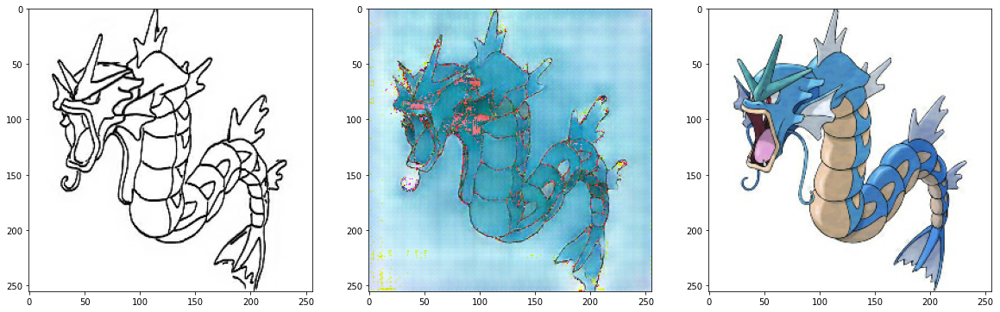

In [41]:
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

In [40]:
EPOCHS = 1000

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:1.0607                     
L1_loss:0.5637                     
Discriminator_loss:1.0704

EPOCH[1] - STEP[20]                     
Generator_loss:1.2219                     
L1_loss:0.3178                     
Discriminator_loss:1.0008

EPOCH[1] - STEP[30]                     
Generator_loss:0.9103                     
L1_loss:0.2572                     
Discriminator_loss:1.2509

EPOCH[1] - STEP[40]                     
Generator_loss:1.1251                     
L1_loss:0.2746                     
Discriminator_loss:1.0479

EPOCH[1] - STEP[50]                     
Generator_loss:1.3854                     
L1_loss:0.2806                     
Discriminator_loss:0.8936

EPOCH[1] - STEP[60]                     
Generator_loss:0.9370                     
L1_loss:0.2736                     
Discriminator_loss:0.8336

EPOCH[1] - STEP[70]                     
Generator_loss:2.2465                     
L1_loss:0.2512                    

EPOCH[3] - STEP[170]                     
Generator_loss:0.2897                     
L1_loss:0.2321                     
Discriminator_loss:1.5526

EPOCH[3] - STEP[180]                     
Generator_loss:0.7333                     
L1_loss:0.3030                     
Discriminator_loss:0.8166

EPOCH[3] - STEP[190]                     
Generator_loss:0.9942                     
L1_loss:0.2297                     
Discriminator_loss:0.8948

EPOCH[3] - STEP[200]                     
Generator_loss:4.4693                     
L1_loss:0.2791                     
Discriminator_loss:0.2375

EPOCH[4] - STEP[10]                     
Generator_loss:3.8504                     
L1_loss:0.2540                     
Discriminator_loss:1.2613

EPOCH[4] - STEP[20]                     
Generator_loss:0.3181                     
L1_loss:0.2491                     
Discriminator_loss:1.5419

EPOCH[4] - STEP[30]                     
Generator_loss:0.3217                     
L1_loss:0.2406                

EPOCH[6] - STEP[130]                     
Generator_loss:2.2657                     
L1_loss:0.2788                     
Discriminator_loss:0.9562

EPOCH[6] - STEP[140]                     
Generator_loss:1.2196                     
L1_loss:0.2629                     
Discriminator_loss:0.5616

EPOCH[6] - STEP[150]                     
Generator_loss:3.2254                     
L1_loss:0.2303                     
Discriminator_loss:0.8493

EPOCH[6] - STEP[160]                     
Generator_loss:1.9918                     
L1_loss:0.2622                     
Discriminator_loss:0.1900

EPOCH[6] - STEP[170]                     
Generator_loss:0.5677                     
L1_loss:0.2113                     
Discriminator_loss:0.9689

EPOCH[6] - STEP[180]                     
Generator_loss:2.3346                     
L1_loss:0.2454                     
Discriminator_loss:0.2555

EPOCH[6] - STEP[190]                     
Generator_loss:3.8661                     
L1_loss:0.2583             

EPOCH[9] - STEP[90]                     
Generator_loss:2.7980                     
L1_loss:0.2084                     
Discriminator_loss:1.1443

EPOCH[9] - STEP[100]                     
Generator_loss:1.0689                     
L1_loss:0.2323                     
Discriminator_loss:1.3615

EPOCH[9] - STEP[110]                     
Generator_loss:3.8736                     
L1_loss:0.2786                     
Discriminator_loss:0.2394

EPOCH[9] - STEP[120]                     
Generator_loss:0.6082                     
L1_loss:0.2208                     
Discriminator_loss:1.1406

EPOCH[9] - STEP[130]                     
Generator_loss:1.0758                     
L1_loss:0.2413                     
Discriminator_loss:0.5550

EPOCH[9] - STEP[140]                     
Generator_loss:1.9370                     
L1_loss:0.2175                     
Discriminator_loss:1.1059

EPOCH[9] - STEP[150]                     
Generator_loss:1.6785                     
L1_loss:0.2450              

EPOCH[12] - STEP[50]                     
Generator_loss:2.2799                     
L1_loss:0.2514                     
Discriminator_loss:0.2913

EPOCH[12] - STEP[60]                     
Generator_loss:1.6296                     
L1_loss:0.2316                     
Discriminator_loss:0.7952

EPOCH[12] - STEP[70]                     
Generator_loss:0.9872                     
L1_loss:0.2478                     
Discriminator_loss:0.5748

EPOCH[12] - STEP[80]                     
Generator_loss:0.6608                     
L1_loss:0.2435                     
Discriminator_loss:0.8657

EPOCH[12] - STEP[90]                     
Generator_loss:2.8957                     
L1_loss:0.2623                     
Discriminator_loss:0.3952

EPOCH[12] - STEP[100]                     
Generator_loss:0.9070                     
L1_loss:0.2247                     
Discriminator_loss:0.6382

EPOCH[12] - STEP[110]                     
Generator_loss:1.9578                     
L1_loss:0.2603           

EPOCH[15] - STEP[10]                     
Generator_loss:1.2308                     
L1_loss:0.2194                     
Discriminator_loss:0.9125

EPOCH[15] - STEP[20]                     
Generator_loss:0.2527                     
L1_loss:0.2088                     
Discriminator_loss:2.3144

EPOCH[15] - STEP[30]                     
Generator_loss:2.2145                     
L1_loss:0.1945                     
Discriminator_loss:0.2172

EPOCH[15] - STEP[40]                     
Generator_loss:1.5066                     
L1_loss:0.2880                     
Discriminator_loss:0.3652

EPOCH[15] - STEP[50]                     
Generator_loss:3.2740                     
L1_loss:0.2151                     
Discriminator_loss:3.4843

EPOCH[15] - STEP[60]                     
Generator_loss:2.9547                     
L1_loss:0.2483                     
Discriminator_loss:0.3474

EPOCH[15] - STEP[70]                     
Generator_loss:1.5044                     
L1_loss:0.2723             

EPOCH[17] - STEP[170]                     
Generator_loss:1.1276                     
L1_loss:0.1929                     
Discriminator_loss:0.6138

EPOCH[17] - STEP[180]                     
Generator_loss:1.7886                     
L1_loss:0.2703                     
Discriminator_loss:0.8564

EPOCH[17] - STEP[190]                     
Generator_loss:3.8516                     
L1_loss:0.2413                     
Discriminator_loss:0.4526

EPOCH[17] - STEP[200]                     
Generator_loss:1.3729                     
L1_loss:0.2167                     
Discriminator_loss:1.5986

EPOCH[18] - STEP[10]                     
Generator_loss:2.4195                     
L1_loss:0.2244                     
Discriminator_loss:0.4057

EPOCH[18] - STEP[20]                     
Generator_loss:0.5032                     
L1_loss:0.1744                     
Discriminator_loss:2.1131

EPOCH[18] - STEP[30]                     
Generator_loss:3.0730                     
L1_loss:0.2485         

EPOCH[20] - STEP[130]                     
Generator_loss:0.8001                     
L1_loss:0.2552                     
Discriminator_loss:0.7114

EPOCH[20] - STEP[140]                     
Generator_loss:0.4557                     
L1_loss:0.2145                     
Discriminator_loss:1.1461

EPOCH[20] - STEP[150]                     
Generator_loss:1.3047                     
L1_loss:0.2079                     
Discriminator_loss:0.8260

EPOCH[20] - STEP[160]                     
Generator_loss:0.2368                     
L1_loss:0.2615                     
Discriminator_loss:2.0221

EPOCH[20] - STEP[170]                     
Generator_loss:3.1379                     
L1_loss:0.2463                     
Discriminator_loss:0.6363

EPOCH[20] - STEP[180]                     
Generator_loss:3.4308                     
L1_loss:0.2120                     
Discriminator_loss:0.1423

EPOCH[20] - STEP[190]                     
Generator_loss:3.4577                     
L1_loss:0.2801      

EPOCH[23] - STEP[90]                     
Generator_loss:2.1090                     
L1_loss:0.1910                     
Discriminator_loss:0.5691

EPOCH[23] - STEP[100]                     
Generator_loss:0.6896                     
L1_loss:0.2220                     
Discriminator_loss:0.8491

EPOCH[23] - STEP[110]                     
Generator_loss:3.5373                     
L1_loss:0.1967                     
Discriminator_loss:0.5576

EPOCH[23] - STEP[120]                     
Generator_loss:0.7092                     
L1_loss:0.2562                     
Discriminator_loss:1.0079

EPOCH[23] - STEP[130]                     
Generator_loss:3.9214                     
L1_loss:0.2633                     
Discriminator_loss:0.6642

EPOCH[23] - STEP[140]                     
Generator_loss:1.1499                     
L1_loss:0.2026                     
Discriminator_loss:0.9564

EPOCH[23] - STEP[150]                     
Generator_loss:2.5485                     
L1_loss:0.2693       

EPOCH[26] - STEP[50]                     
Generator_loss:1.7266                     
L1_loss:0.2124                     
Discriminator_loss:0.3370

EPOCH[26] - STEP[60]                     
Generator_loss:1.7284                     
L1_loss:0.2593                     
Discriminator_loss:0.3630

EPOCH[26] - STEP[70]                     
Generator_loss:3.1825                     
L1_loss:0.2320                     
Discriminator_loss:0.1954

EPOCH[26] - STEP[80]                     
Generator_loss:2.7475                     
L1_loss:0.2378                     
Discriminator_loss:0.4000

EPOCH[26] - STEP[90]                     
Generator_loss:2.0581                     
L1_loss:0.2018                     
Discriminator_loss:1.2720

EPOCH[26] - STEP[100]                     
Generator_loss:1.5314                     
L1_loss:0.2364                     
Discriminator_loss:0.5482

EPOCH[26] - STEP[110]                     
Generator_loss:2.6673                     
L1_loss:0.2520           

EPOCH[29] - STEP[10]                     
Generator_loss:2.6639                     
L1_loss:0.2848                     
Discriminator_loss:0.1178

EPOCH[29] - STEP[20]                     
Generator_loss:1.6731                     
L1_loss:0.2100                     
Discriminator_loss:0.4935

EPOCH[29] - STEP[30]                     
Generator_loss:0.9358                     
L1_loss:0.2061                     
Discriminator_loss:0.6913

EPOCH[29] - STEP[40]                     
Generator_loss:2.9997                     
L1_loss:0.2397                     
Discriminator_loss:0.4020

EPOCH[29] - STEP[50]                     
Generator_loss:0.1331                     
L1_loss:0.2214                     
Discriminator_loss:2.5362

EPOCH[29] - STEP[60]                     
Generator_loss:2.9047                     
L1_loss:0.2638                     
Discriminator_loss:0.0997

EPOCH[29] - STEP[70]                     
Generator_loss:2.1704                     
L1_loss:0.2477             

EPOCH[31] - STEP[170]                     
Generator_loss:2.4389                     
L1_loss:0.2091                     
Discriminator_loss:0.4917

EPOCH[31] - STEP[180]                     
Generator_loss:3.9786                     
L1_loss:0.2407                     
Discriminator_loss:2.1701

EPOCH[31] - STEP[190]                     
Generator_loss:2.3100                     
L1_loss:0.2069                     
Discriminator_loss:0.9289

EPOCH[31] - STEP[200]                     
Generator_loss:4.7857                     
L1_loss:0.2343                     
Discriminator_loss:0.8072

EPOCH[32] - STEP[10]                     
Generator_loss:2.9876                     
L1_loss:0.2054                     
Discriminator_loss:1.6465

EPOCH[32] - STEP[20]                     
Generator_loss:1.7805                     
L1_loss:0.2162                     
Discriminator_loss:0.5309

EPOCH[32] - STEP[30]                     
Generator_loss:1.4986                     
L1_loss:0.1997         

EPOCH[34] - STEP[130]                     
Generator_loss:2.9038                     
L1_loss:0.2532                     
Discriminator_loss:0.0955

EPOCH[34] - STEP[140]                     
Generator_loss:2.8457                     
L1_loss:0.2570                     
Discriminator_loss:0.7322

EPOCH[34] - STEP[150]                     
Generator_loss:2.4186                     
L1_loss:0.2627                     
Discriminator_loss:0.1409

EPOCH[34] - STEP[160]                     
Generator_loss:0.8077                     
L1_loss:0.2203                     
Discriminator_loss:0.7487

EPOCH[34] - STEP[170]                     
Generator_loss:4.0866                     
L1_loss:0.2235                     
Discriminator_loss:0.8013

EPOCH[34] - STEP[180]                     
Generator_loss:2.8764                     
L1_loss:0.2776                     
Discriminator_loss:0.6721

EPOCH[34] - STEP[190]                     
Generator_loss:2.8788                     
L1_loss:0.2596      

EPOCH[37] - STEP[90]                     
Generator_loss:2.6867                     
L1_loss:0.2709                     
Discriminator_loss:0.2531

EPOCH[37] - STEP[100]                     
Generator_loss:2.8170                     
L1_loss:0.2977                     
Discriminator_loss:0.3878

EPOCH[37] - STEP[110]                     
Generator_loss:3.5001                     
L1_loss:0.2241                     
Discriminator_loss:0.2563

EPOCH[37] - STEP[120]                     
Generator_loss:3.5012                     
L1_loss:0.2763                     
Discriminator_loss:0.0514

EPOCH[37] - STEP[130]                     
Generator_loss:3.5878                     
L1_loss:0.2043                     
Discriminator_loss:0.3465

EPOCH[37] - STEP[140]                     
Generator_loss:0.1319                     
L1_loss:0.2040                     
Discriminator_loss:2.4754

EPOCH[37] - STEP[150]                     
Generator_loss:1.0879                     
L1_loss:0.2189       

EPOCH[40] - STEP[50]                     
Generator_loss:3.7828                     
L1_loss:0.2273                     
Discriminator_loss:0.3728

EPOCH[40] - STEP[60]                     
Generator_loss:3.9895                     
L1_loss:0.2422                     
Discriminator_loss:0.1280

EPOCH[40] - STEP[70]                     
Generator_loss:3.7800                     
L1_loss:0.2363                     
Discriminator_loss:0.2033

EPOCH[40] - STEP[80]                     
Generator_loss:1.9215                     
L1_loss:0.2659                     
Discriminator_loss:0.2114

EPOCH[40] - STEP[90]                     
Generator_loss:4.4465                     
L1_loss:0.2442                     
Discriminator_loss:1.4539

EPOCH[40] - STEP[100]                     
Generator_loss:2.8315                     
L1_loss:0.2362                     
Discriminator_loss:0.1096

EPOCH[40] - STEP[110]                     
Generator_loss:1.8443                     
L1_loss:0.1969           

EPOCH[43] - STEP[10]                     
Generator_loss:1.6120                     
L1_loss:0.2014                     
Discriminator_loss:1.0628

EPOCH[43] - STEP[20]                     
Generator_loss:1.9037                     
L1_loss:0.2727                     
Discriminator_loss:0.2027

EPOCH[43] - STEP[30]                     
Generator_loss:1.9430                     
L1_loss:0.2502                     
Discriminator_loss:0.4878

EPOCH[43] - STEP[40]                     
Generator_loss:2.1421                     
L1_loss:0.2418                     
Discriminator_loss:0.2070

EPOCH[43] - STEP[50]                     
Generator_loss:2.9819                     
L1_loss:0.2237                     
Discriminator_loss:0.4898

EPOCH[43] - STEP[60]                     
Generator_loss:2.7066                     
L1_loss:0.2512                     
Discriminator_loss:0.2039

EPOCH[43] - STEP[70]                     
Generator_loss:0.3793                     
L1_loss:0.2349             

EPOCH[45] - STEP[170]                     
Generator_loss:3.6321                     
L1_loss:0.2428                     
Discriminator_loss:0.2172

EPOCH[45] - STEP[180]                     
Generator_loss:2.5309                     
L1_loss:0.1981                     
Discriminator_loss:0.4495

EPOCH[45] - STEP[190]                     
Generator_loss:2.4937                     
L1_loss:0.2303                     
Discriminator_loss:0.1701

EPOCH[45] - STEP[200]                     
Generator_loss:3.9574                     
L1_loss:0.1886                     
Discriminator_loss:0.8057

EPOCH[46] - STEP[10]                     
Generator_loss:2.1564                     
L1_loss:0.2245                     
Discriminator_loss:0.4089

EPOCH[46] - STEP[20]                     
Generator_loss:2.0287                     
L1_loss:0.2512                     
Discriminator_loss:0.2670

EPOCH[46] - STEP[30]                     
Generator_loss:2.5778                     
L1_loss:0.2120         

EPOCH[48] - STEP[130]                     
Generator_loss:1.4642                     
L1_loss:0.1980                     
Discriminator_loss:0.4945

EPOCH[48] - STEP[140]                     
Generator_loss:1.4738                     
L1_loss:0.1921                     
Discriminator_loss:0.3823

EPOCH[48] - STEP[150]                     
Generator_loss:2.2026                     
L1_loss:0.2276                     
Discriminator_loss:0.2549

EPOCH[48] - STEP[160]                     
Generator_loss:1.5383                     
L1_loss:0.2001                     
Discriminator_loss:0.5741

EPOCH[48] - STEP[170]                     
Generator_loss:0.6573                     
L1_loss:0.2266                     
Discriminator_loss:0.8713

EPOCH[48] - STEP[180]                     
Generator_loss:3.6734                     
L1_loss:0.2191                     
Discriminator_loss:0.9117

EPOCH[48] - STEP[190]                     
Generator_loss:0.5697                     
L1_loss:0.2097      

EPOCH[51] - STEP[90]                     
Generator_loss:0.9414                     
L1_loss:0.2155                     
Discriminator_loss:0.6167

EPOCH[51] - STEP[100]                     
Generator_loss:2.5603                     
L1_loss:0.2787                     
Discriminator_loss:0.1806

EPOCH[51] - STEP[110]                     
Generator_loss:0.9630                     
L1_loss:0.1901                     
Discriminator_loss:0.6164

EPOCH[51] - STEP[120]                     
Generator_loss:2.7842                     
L1_loss:0.2291                     
Discriminator_loss:0.1317

EPOCH[51] - STEP[130]                     
Generator_loss:2.4611                     
L1_loss:0.2235                     
Discriminator_loss:0.7389

EPOCH[51] - STEP[140]                     
Generator_loss:2.9510                     
L1_loss:0.2327                     
Discriminator_loss:0.3801

EPOCH[51] - STEP[150]                     
Generator_loss:2.1999                     
L1_loss:0.1619       

EPOCH[54] - STEP[50]                     
Generator_loss:3.0515                     
L1_loss:0.2104                     
Discriminator_loss:0.1431

EPOCH[54] - STEP[60]                     
Generator_loss:2.0647                     
L1_loss:0.1987                     
Discriminator_loss:0.2472

EPOCH[54] - STEP[70]                     
Generator_loss:2.3568                     
L1_loss:0.1981                     
Discriminator_loss:0.3029

EPOCH[54] - STEP[80]                     
Generator_loss:1.0054                     
L1_loss:0.2383                     
Discriminator_loss:0.5379

EPOCH[54] - STEP[90]                     
Generator_loss:2.2052                     
L1_loss:0.2468                     
Discriminator_loss:0.2331

EPOCH[54] - STEP[100]                     
Generator_loss:2.1213                     
L1_loss:0.2678                     
Discriminator_loss:0.1798

EPOCH[54] - STEP[110]                     
Generator_loss:3.8186                     
L1_loss:0.2605           

EPOCH[57] - STEP[10]                     
Generator_loss:1.5220                     
L1_loss:0.2112                     
Discriminator_loss:0.4045

EPOCH[57] - STEP[20]                     
Generator_loss:0.1101                     
L1_loss:0.2807                     
Discriminator_loss:2.8151

EPOCH[57] - STEP[30]                     
Generator_loss:0.7397                     
L1_loss:0.2100                     
Discriminator_loss:0.8912

EPOCH[57] - STEP[40]                     
Generator_loss:2.8890                     
L1_loss:0.2435                     
Discriminator_loss:0.0830

EPOCH[57] - STEP[50]                     
Generator_loss:3.6337                     
L1_loss:0.2175                     
Discriminator_loss:0.1753

EPOCH[57] - STEP[60]                     
Generator_loss:0.4211                     
L1_loss:0.2258                     
Discriminator_loss:1.1949

EPOCH[57] - STEP[70]                     
Generator_loss:4.0969                     
L1_loss:0.2163             

EPOCH[59] - STEP[170]                     
Generator_loss:1.7219                     
L1_loss:0.2589                     
Discriminator_loss:0.2906

EPOCH[59] - STEP[180]                     
Generator_loss:3.7068                     
L1_loss:0.2710                     
Discriminator_loss:0.4840

EPOCH[59] - STEP[190]                     
Generator_loss:4.6583                     
L1_loss:0.2392                     
Discriminator_loss:2.2852

EPOCH[59] - STEP[200]                     
Generator_loss:0.7209                     
L1_loss:0.1934                     
Discriminator_loss:1.5255

EPOCH[60] - STEP[10]                     
Generator_loss:2.7949                     
L1_loss:0.2389                     
Discriminator_loss:0.5089

EPOCH[60] - STEP[20]                     
Generator_loss:2.9745                     
L1_loss:0.1906                     
Discriminator_loss:0.3267

EPOCH[60] - STEP[30]                     
Generator_loss:3.9008                     
L1_loss:0.2320         

EPOCH[62] - STEP[130]                     
Generator_loss:0.9946                     
L1_loss:0.2239                     
Discriminator_loss:0.5653

EPOCH[62] - STEP[140]                     
Generator_loss:3.5765                     
L1_loss:0.2781                     
Discriminator_loss:0.0844

EPOCH[62] - STEP[150]                     
Generator_loss:2.9017                     
L1_loss:0.2242                     
Discriminator_loss:0.1799

EPOCH[62] - STEP[160]                     
Generator_loss:3.9984                     
L1_loss:0.2015                     
Discriminator_loss:1.2624

EPOCH[62] - STEP[170]                     
Generator_loss:2.9988                     
L1_loss:0.2280                     
Discriminator_loss:0.0671

EPOCH[62] - STEP[180]                     
Generator_loss:1.3177                     
L1_loss:0.2005                     
Discriminator_loss:0.6256

EPOCH[62] - STEP[190]                     
Generator_loss:2.4398                     
L1_loss:0.2286      

EPOCH[65] - STEP[90]                     
Generator_loss:3.2945                     
L1_loss:0.2276                     
Discriminator_loss:0.1634

EPOCH[65] - STEP[100]                     
Generator_loss:1.4668                     
L1_loss:0.1888                     
Discriminator_loss:0.3835

EPOCH[65] - STEP[110]                     
Generator_loss:3.4720                     
L1_loss:0.2015                     
Discriminator_loss:0.6366

EPOCH[65] - STEP[120]                     
Generator_loss:3.2695                     
L1_loss:0.2333                     
Discriminator_loss:0.3263

EPOCH[65] - STEP[130]                     
Generator_loss:1.3329                     
L1_loss:0.2447                     
Discriminator_loss:0.4023

EPOCH[65] - STEP[140]                     
Generator_loss:2.3515                     
L1_loss:0.2288                     
Discriminator_loss:0.3217

EPOCH[65] - STEP[150]                     
Generator_loss:2.9338                     
L1_loss:0.1652       

EPOCH[68] - STEP[50]                     
Generator_loss:3.8085                     
L1_loss:0.2198                     
Discriminator_loss:0.6858

EPOCH[68] - STEP[60]                     
Generator_loss:3.2366                     
L1_loss:0.2621                     
Discriminator_loss:0.1368

EPOCH[68] - STEP[70]                     
Generator_loss:1.8880                     
L1_loss:0.2406                     
Discriminator_loss:0.2160

EPOCH[68] - STEP[80]                     
Generator_loss:2.6830                     
L1_loss:0.1972                     
Discriminator_loss:1.4340

EPOCH[68] - STEP[90]                     
Generator_loss:1.7556                     
L1_loss:0.2563                     
Discriminator_loss:0.2422

EPOCH[68] - STEP[100]                     
Generator_loss:5.1218                     
L1_loss:0.2027                     
Discriminator_loss:0.9835

EPOCH[68] - STEP[110]                     
Generator_loss:2.6278                     
L1_loss:0.2074           

EPOCH[71] - STEP[10]                     
Generator_loss:0.1797                     
L1_loss:0.2615                     
Discriminator_loss:2.2370

EPOCH[71] - STEP[20]                     
Generator_loss:0.6860                     
L1_loss:0.2240                     
Discriminator_loss:1.0333

EPOCH[71] - STEP[30]                     
Generator_loss:4.2159                     
L1_loss:0.2287                     
Discriminator_loss:1.6648

EPOCH[71] - STEP[40]                     
Generator_loss:1.0167                     
L1_loss:0.2153                     
Discriminator_loss:0.6045

EPOCH[71] - STEP[50]                     
Generator_loss:3.6071                     
L1_loss:0.2277                     
Discriminator_loss:0.1371

EPOCH[71] - STEP[60]                     
Generator_loss:2.4733                     
L1_loss:0.2136                     
Discriminator_loss:0.4010

EPOCH[71] - STEP[70]                     
Generator_loss:2.9334                     
L1_loss:0.2408             

EPOCH[73] - STEP[170]                     
Generator_loss:0.9471                     
L1_loss:0.2446                     
Discriminator_loss:0.7182

EPOCH[73] - STEP[180]                     
Generator_loss:2.8169                     
L1_loss:0.1933                     
Discriminator_loss:0.8869

EPOCH[73] - STEP[190]                     
Generator_loss:1.2485                     
L1_loss:0.2573                     
Discriminator_loss:0.6209

EPOCH[73] - STEP[200]                     
Generator_loss:1.5814                     
L1_loss:0.2258                     
Discriminator_loss:0.3183

EPOCH[74] - STEP[10]                     
Generator_loss:2.3607                     
L1_loss:0.2067                     
Discriminator_loss:0.1657

EPOCH[74] - STEP[20]                     
Generator_loss:2.3861                     
L1_loss:0.1931                     
Discriminator_loss:0.1653

EPOCH[74] - STEP[30]                     
Generator_loss:0.4809                     
L1_loss:0.2154         

EPOCH[76] - STEP[130]                     
Generator_loss:0.4687                     
L1_loss:0.2290                     
Discriminator_loss:1.2547

EPOCH[76] - STEP[140]                     
Generator_loss:2.0754                     
L1_loss:0.2208                     
Discriminator_loss:0.2176

EPOCH[76] - STEP[150]                     
Generator_loss:2.5684                     
L1_loss:0.2065                     
Discriminator_loss:1.1268

EPOCH[76] - STEP[160]                     
Generator_loss:1.5069                     
L1_loss:0.2151                     
Discriminator_loss:0.3468

EPOCH[76] - STEP[170]                     
Generator_loss:2.3107                     
L1_loss:0.2980                     
Discriminator_loss:0.3445

EPOCH[76] - STEP[180]                     
Generator_loss:2.2818                     
L1_loss:0.2098                     
Discriminator_loss:0.1695

EPOCH[76] - STEP[190]                     
Generator_loss:3.4954                     
L1_loss:0.2356      

EPOCH[79] - STEP[90]                     
Generator_loss:0.8497                     
L1_loss:0.2194                     
Discriminator_loss:0.7269

EPOCH[79] - STEP[100]                     
Generator_loss:6.8347                     
L1_loss:0.2374                     
Discriminator_loss:2.7303

EPOCH[79] - STEP[110]                     
Generator_loss:0.3494                     
L1_loss:0.2475                     
Discriminator_loss:1.3949

EPOCH[79] - STEP[120]                     
Generator_loss:5.5400                     
L1_loss:0.2095                     
Discriminator_loss:2.6643

EPOCH[79] - STEP[130]                     
Generator_loss:1.8723                     
L1_loss:0.2130                     
Discriminator_loss:0.2861

EPOCH[79] - STEP[140]                     
Generator_loss:1.8297                     
L1_loss:0.2307                     
Discriminator_loss:0.3452

EPOCH[79] - STEP[150]                     
Generator_loss:2.4610                     
L1_loss:0.1942       

EPOCH[82] - STEP[50]                     
Generator_loss:4.7784                     
L1_loss:0.2372                     
Discriminator_loss:0.0343

EPOCH[82] - STEP[60]                     
Generator_loss:0.4563                     
L1_loss:0.2126                     
Discriminator_loss:1.1687

EPOCH[82] - STEP[70]                     
Generator_loss:1.9319                     
L1_loss:0.1850                     
Discriminator_loss:0.3358

EPOCH[82] - STEP[80]                     
Generator_loss:2.5626                     
L1_loss:0.2422                     
Discriminator_loss:0.1011

EPOCH[82] - STEP[90]                     
Generator_loss:0.0583                     
L1_loss:0.1851                     
Discriminator_loss:3.3894

EPOCH[82] - STEP[100]                     
Generator_loss:2.2614                     
L1_loss:0.2227                     
Discriminator_loss:0.3667

EPOCH[82] - STEP[110]                     
Generator_loss:1.6422                     
L1_loss:0.2199           

EPOCH[85] - STEP[10]                     
Generator_loss:3.6812                     
L1_loss:0.2507                     
Discriminator_loss:1.1449

EPOCH[85] - STEP[20]                     
Generator_loss:1.7540                     
L1_loss:0.2349                     
Discriminator_loss:0.2611

EPOCH[85] - STEP[30]                     
Generator_loss:2.7081                     
L1_loss:0.2409                     
Discriminator_loss:0.1931

EPOCH[85] - STEP[40]                     
Generator_loss:4.6799                     
L1_loss:0.1826                     
Discriminator_loss:0.5059

EPOCH[85] - STEP[50]                     
Generator_loss:2.8047                     
L1_loss:0.1612                     
Discriminator_loss:0.2288

EPOCH[85] - STEP[60]                     
Generator_loss:5.6820                     
L1_loss:0.1775                     
Discriminator_loss:1.8636

EPOCH[85] - STEP[70]                     
Generator_loss:1.3960                     
L1_loss:0.2295             

EPOCH[87] - STEP[170]                     
Generator_loss:1.5166                     
L1_loss:0.1784                     
Discriminator_loss:0.4924

EPOCH[87] - STEP[180]                     
Generator_loss:2.4660                     
L1_loss:0.2066                     
Discriminator_loss:1.0330

EPOCH[87] - STEP[190]                     
Generator_loss:1.0126                     
L1_loss:0.2572                     
Discriminator_loss:0.5588

EPOCH[87] - STEP[200]                     
Generator_loss:5.4306                     
L1_loss:0.2186                     
Discriminator_loss:2.2748

EPOCH[88] - STEP[10]                     
Generator_loss:3.5419                     
L1_loss:0.2442                     
Discriminator_loss:0.1574

EPOCH[88] - STEP[20]                     
Generator_loss:2.0601                     
L1_loss:0.1472                     
Discriminator_loss:0.4601

EPOCH[88] - STEP[30]                     
Generator_loss:2.9237                     
L1_loss:0.2666         

EPOCH[90] - STEP[130]                     
Generator_loss:1.4555                     
L1_loss:0.1986                     
Discriminator_loss:0.6099

EPOCH[90] - STEP[140]                     
Generator_loss:1.5377                     
L1_loss:0.2308                     
Discriminator_loss:0.9654

EPOCH[90] - STEP[150]                     
Generator_loss:1.9262                     
L1_loss:0.1837                     
Discriminator_loss:0.2264

EPOCH[90] - STEP[160]                     
Generator_loss:1.2965                     
L1_loss:0.1892                     
Discriminator_loss:0.6214

EPOCH[90] - STEP[170]                     
Generator_loss:3.1089                     
L1_loss:0.2961                     
Discriminator_loss:0.2137

EPOCH[90] - STEP[180]                     
Generator_loss:2.0790                     
L1_loss:0.1812                     
Discriminator_loss:0.3029

EPOCH[90] - STEP[190]                     
Generator_loss:4.4391                     
L1_loss:0.2056      

EPOCH[93] - STEP[90]                     
Generator_loss:5.2011                     
L1_loss:0.2192                     
Discriminator_loss:0.6549

EPOCH[93] - STEP[100]                     
Generator_loss:2.6573                     
L1_loss:0.2238                     
Discriminator_loss:0.1821

EPOCH[93] - STEP[110]                     
Generator_loss:0.3756                     
L1_loss:0.2121                     
Discriminator_loss:1.3893

EPOCH[93] - STEP[120]                     
Generator_loss:1.8880                     
L1_loss:0.2122                     
Discriminator_loss:0.8575

EPOCH[93] - STEP[130]                     
Generator_loss:1.8394                     
L1_loss:0.1959                     
Discriminator_loss:0.4123

EPOCH[93] - STEP[140]                     
Generator_loss:2.0638                     
L1_loss:0.2582                     
Discriminator_loss:0.1940

EPOCH[93] - STEP[150]                     
Generator_loss:4.7248                     
L1_loss:0.2043       

EPOCH[96] - STEP[50]                     
Generator_loss:0.3751                     
L1_loss:0.2329                     
Discriminator_loss:1.4627

EPOCH[96] - STEP[60]                     
Generator_loss:3.4167                     
L1_loss:0.2537                     
Discriminator_loss:0.4696

EPOCH[96] - STEP[70]                     
Generator_loss:2.7891                     
L1_loss:0.2372                     
Discriminator_loss:0.2204

EPOCH[96] - STEP[80]                     
Generator_loss:0.7705                     
L1_loss:0.1603                     
Discriminator_loss:0.8191

EPOCH[96] - STEP[90]                     
Generator_loss:2.9325                     
L1_loss:0.2394                     
Discriminator_loss:0.1643

EPOCH[96] - STEP[100]                     
Generator_loss:2.5039                     
L1_loss:0.2033                     
Discriminator_loss:0.2539

EPOCH[96] - STEP[110]                     
Generator_loss:2.4855                     
L1_loss:0.1786           

EPOCH[99] - STEP[10]                     
Generator_loss:0.3384                     
L1_loss:0.2129                     
Discriminator_loss:1.6149

EPOCH[99] - STEP[20]                     
Generator_loss:2.6096                     
L1_loss:0.2253                     
Discriminator_loss:0.4071

EPOCH[99] - STEP[30]                     
Generator_loss:2.6679                     
L1_loss:0.2074                     
Discriminator_loss:1.0286

EPOCH[99] - STEP[40]                     
Generator_loss:0.5593                     
L1_loss:0.2000                     
Discriminator_loss:1.7129

EPOCH[99] - STEP[50]                     
Generator_loss:1.9965                     
L1_loss:0.1860                     
Discriminator_loss:0.1998

EPOCH[99] - STEP[60]                     
Generator_loss:3.1721                     
L1_loss:0.2121                     
Discriminator_loss:0.3360

EPOCH[99] - STEP[70]                     
Generator_loss:2.2514                     
L1_loss:0.1976             

EPOCH[101] - STEP[160]                     
Generator_loss:1.5691                     
L1_loss:0.2093                     
Discriminator_loss:0.2922

EPOCH[101] - STEP[170]                     
Generator_loss:3.7927                     
L1_loss:0.2448                     
Discriminator_loss:0.1684

EPOCH[101] - STEP[180]                     
Generator_loss:1.8748                     
L1_loss:0.2321                     
Discriminator_loss:0.2349

EPOCH[101] - STEP[190]                     
Generator_loss:1.9252                     
L1_loss:0.1764                     
Discriminator_loss:1.3025

EPOCH[101] - STEP[200]                     
Generator_loss:1.8235                     
L1_loss:0.1701                     
Discriminator_loss:0.8328

EPOCH[102] - STEP[10]                     
Generator_loss:3.3642                     
L1_loss:0.1909                     
Discriminator_loss:0.3982

EPOCH[102] - STEP[20]                     
Generator_loss:0.6471                     
L1_loss:0.2532 

EPOCH[104] - STEP[110]                     
Generator_loss:3.3012                     
L1_loss:0.2194                     
Discriminator_loss:0.5475

EPOCH[104] - STEP[120]                     
Generator_loss:2.3874                     
L1_loss:0.1586                     
Discriminator_loss:0.4849

EPOCH[104] - STEP[130]                     
Generator_loss:3.8379                     
L1_loss:0.2300                     
Discriminator_loss:0.2119

EPOCH[104] - STEP[140]                     
Generator_loss:1.4630                     
L1_loss:0.2400                     
Discriminator_loss:0.5609

EPOCH[104] - STEP[150]                     
Generator_loss:4.3539                     
L1_loss:0.2352                     
Discriminator_loss:0.1269

EPOCH[104] - STEP[160]                     
Generator_loss:2.0182                     
L1_loss:0.1953                     
Discriminator_loss:0.8593

EPOCH[104] - STEP[170]                     
Generator_loss:2.3316                     
L1_loss:0.210

EPOCH[107] - STEP[60]                     
Generator_loss:1.5894                     
L1_loss:0.1834                     
Discriminator_loss:0.3760

EPOCH[107] - STEP[70]                     
Generator_loss:3.6934                     
L1_loss:0.2023                     
Discriminator_loss:0.3176

EPOCH[107] - STEP[80]                     
Generator_loss:2.4140                     
L1_loss:0.1534                     
Discriminator_loss:0.9627

EPOCH[107] - STEP[90]                     
Generator_loss:1.7064                     
L1_loss:0.2098                     
Discriminator_loss:0.4608

EPOCH[107] - STEP[100]                     
Generator_loss:1.9344                     
L1_loss:0.1929                     
Discriminator_loss:0.2361

EPOCH[107] - STEP[110]                     
Generator_loss:3.2312                     
L1_loss:0.1944                     
Discriminator_loss:0.2914

EPOCH[107] - STEP[120]                     
Generator_loss:3.8589                     
L1_loss:0.2427   

EPOCH[110] - STEP[10]                     
Generator_loss:3.5882                     
L1_loss:0.2167                     
Discriminator_loss:0.1029

EPOCH[110] - STEP[20]                     
Generator_loss:2.3044                     
L1_loss:0.1849                     
Discriminator_loss:1.6738

EPOCH[110] - STEP[30]                     
Generator_loss:2.3811                     
L1_loss:0.1909                     
Discriminator_loss:0.3699

EPOCH[110] - STEP[40]                     
Generator_loss:0.7887                     
L1_loss:0.2279                     
Discriminator_loss:0.7710

EPOCH[110] - STEP[50]                     
Generator_loss:0.7779                     
L1_loss:0.2019                     
Discriminator_loss:0.8138

EPOCH[110] - STEP[60]                     
Generator_loss:3.6044                     
L1_loss:0.2077                     
Discriminator_loss:0.0610

EPOCH[110] - STEP[70]                     
Generator_loss:1.4693                     
L1_loss:0.2177      

EPOCH[112] - STEP[160]                     
Generator_loss:1.9724                     
L1_loss:0.2414                     
Discriminator_loss:0.2037

EPOCH[112] - STEP[170]                     
Generator_loss:4.2685                     
L1_loss:0.2697                     
Discriminator_loss:0.1046

EPOCH[112] - STEP[180]                     
Generator_loss:2.6430                     
L1_loss:0.2003                     
Discriminator_loss:0.2463

EPOCH[112] - STEP[190]                     
Generator_loss:0.1684                     
L1_loss:0.2060                     
Discriminator_loss:2.5223

EPOCH[112] - STEP[200]                     
Generator_loss:0.6947                     
L1_loss:0.2250                     
Discriminator_loss:0.8302

EPOCH[113] - STEP[10]                     
Generator_loss:3.3945                     
L1_loss:0.2099                     
Discriminator_loss:0.0916

EPOCH[113] - STEP[20]                     
Generator_loss:1.3885                     
L1_loss:0.2178 

EPOCH[115] - STEP[110]                     
Generator_loss:3.2785                     
L1_loss:0.2037                     
Discriminator_loss:0.0749

EPOCH[115] - STEP[120]                     
Generator_loss:1.5939                     
L1_loss:0.2048                     
Discriminator_loss:0.6703

EPOCH[115] - STEP[130]                     
Generator_loss:2.0249                     
L1_loss:0.2224                     
Discriminator_loss:0.4294

EPOCH[115] - STEP[140]                     
Generator_loss:2.0992                     
L1_loss:0.2026                     
Discriminator_loss:0.3233

EPOCH[115] - STEP[150]                     
Generator_loss:3.8942                     
L1_loss:0.1995                     
Discriminator_loss:0.1939

EPOCH[115] - STEP[160]                     
Generator_loss:3.2709                     
L1_loss:0.2770                     
Discriminator_loss:0.2278

EPOCH[115] - STEP[170]                     
Generator_loss:2.7753                     
L1_loss:0.208

EPOCH[118] - STEP[60]                     
Generator_loss:3.2756                     
L1_loss:0.2261                     
Discriminator_loss:0.8943

EPOCH[118] - STEP[70]                     
Generator_loss:1.6816                     
L1_loss:0.2089                     
Discriminator_loss:0.3839

EPOCH[118] - STEP[80]                     
Generator_loss:2.7572                     
L1_loss:0.1746                     
Discriminator_loss:0.5996

EPOCH[118] - STEP[90]                     
Generator_loss:1.3367                     
L1_loss:0.1676                     
Discriminator_loss:0.4139

EPOCH[118] - STEP[100]                     
Generator_loss:3.4271                     
L1_loss:0.1615                     
Discriminator_loss:0.7369

EPOCH[118] - STEP[110]                     
Generator_loss:3.5210                     
L1_loss:0.1935                     
Discriminator_loss:0.0488

EPOCH[118] - STEP[120]                     
Generator_loss:3.4407                     
L1_loss:0.2186   

EPOCH[121] - STEP[10]                     
Generator_loss:4.8170                     
L1_loss:0.2068                     
Discriminator_loss:0.3057

EPOCH[121] - STEP[20]                     
Generator_loss:3.0147                     
L1_loss:0.2577                     
Discriminator_loss:0.1079

EPOCH[121] - STEP[30]                     
Generator_loss:3.1610                     
L1_loss:0.1812                     
Discriminator_loss:0.4837

EPOCH[121] - STEP[40]                     
Generator_loss:2.5554                     
L1_loss:0.2416                     
Discriminator_loss:0.1882

EPOCH[121] - STEP[50]                     
Generator_loss:4.0064                     
L1_loss:0.2075                     
Discriminator_loss:0.0876

EPOCH[121] - STEP[60]                     
Generator_loss:2.2092                     
L1_loss:0.1874                     
Discriminator_loss:0.2811

EPOCH[121] - STEP[70]                     
Generator_loss:2.3855                     
L1_loss:0.2025      

EPOCH[123] - STEP[160]                     
Generator_loss:4.3596                     
L1_loss:0.2027                     
Discriminator_loss:0.1635

EPOCH[123] - STEP[170]                     
Generator_loss:1.5940                     
L1_loss:0.1999                     
Discriminator_loss:0.5783

EPOCH[123] - STEP[180]                     
Generator_loss:5.3509                     
L1_loss:0.2265                     
Discriminator_loss:0.1461

EPOCH[123] - STEP[190]                     
Generator_loss:3.7538                     
L1_loss:0.2215                     
Discriminator_loss:0.4989

EPOCH[123] - STEP[200]                     
Generator_loss:0.7515                     
L1_loss:0.1880                     
Discriminator_loss:0.8595

EPOCH[124] - STEP[10]                     
Generator_loss:2.8722                     
L1_loss:0.2248                     
Discriminator_loss:0.0919

EPOCH[124] - STEP[20]                     
Generator_loss:2.6221                     
L1_loss:0.2060 

EPOCH[126] - STEP[110]                     
Generator_loss:2.3804                     
L1_loss:0.1814                     
Discriminator_loss:0.2249

EPOCH[126] - STEP[120]                     
Generator_loss:1.3613                     
L1_loss:0.2248                     
Discriminator_loss:0.5299

EPOCH[126] - STEP[130]                     
Generator_loss:4.4606                     
L1_loss:0.2206                     
Discriminator_loss:0.6353

EPOCH[126] - STEP[140]                     
Generator_loss:2.6301                     
L1_loss:0.2127                     
Discriminator_loss:0.1585

EPOCH[126] - STEP[150]                     
Generator_loss:1.6412                     
L1_loss:0.1686                     
Discriminator_loss:0.3288

EPOCH[126] - STEP[160]                     
Generator_loss:2.9311                     
L1_loss:0.2338                     
Discriminator_loss:0.3488

EPOCH[126] - STEP[170]                     
Generator_loss:0.5103                     
L1_loss:0.163

EPOCH[129] - STEP[60]                     
Generator_loss:4.6138                     
L1_loss:0.2210                     
Discriminator_loss:0.1471

EPOCH[129] - STEP[70]                     
Generator_loss:2.7949                     
L1_loss:0.1846                     
Discriminator_loss:0.2562

EPOCH[129] - STEP[80]                     
Generator_loss:1.5253                     
L1_loss:0.2432                     
Discriminator_loss:0.3539

EPOCH[129] - STEP[90]                     
Generator_loss:2.3551                     
L1_loss:0.1938                     
Discriminator_loss:1.6158

EPOCH[129] - STEP[100]                     
Generator_loss:2.6760                     
L1_loss:0.1801                     
Discriminator_loss:0.5205

EPOCH[129] - STEP[110]                     
Generator_loss:3.1900                     
L1_loss:0.2089                     
Discriminator_loss:0.0847

EPOCH[129] - STEP[120]                     
Generator_loss:1.7885                     
L1_loss:0.2295   

EPOCH[132] - STEP[10]                     
Generator_loss:2.0396                     
L1_loss:0.1838                     
Discriminator_loss:0.3000

EPOCH[132] - STEP[20]                     
Generator_loss:4.2704                     
L1_loss:0.1878                     
Discriminator_loss:0.3418

EPOCH[132] - STEP[30]                     
Generator_loss:3.0144                     
L1_loss:0.2821                     
Discriminator_loss:0.1211

EPOCH[132] - STEP[40]                     
Generator_loss:5.6634                     
L1_loss:0.2138                     
Discriminator_loss:0.7129

EPOCH[132] - STEP[50]                     
Generator_loss:4.1170                     
L1_loss:0.2548                     
Discriminator_loss:0.1193

EPOCH[132] - STEP[60]                     
Generator_loss:1.6018                     
L1_loss:0.1930                     
Discriminator_loss:0.3108

EPOCH[132] - STEP[70]                     
Generator_loss:2.5726                     
L1_loss:0.2223      

EPOCH[134] - STEP[160]                     
Generator_loss:2.0921                     
L1_loss:0.2468                     
Discriminator_loss:0.1941

EPOCH[134] - STEP[170]                     
Generator_loss:2.2744                     
L1_loss:0.1814                     
Discriminator_loss:0.5999

EPOCH[134] - STEP[180]                     
Generator_loss:4.7885                     
L1_loss:0.1756                     
Discriminator_loss:0.1615

EPOCH[134] - STEP[190]                     
Generator_loss:3.2933                     
L1_loss:0.2049                     
Discriminator_loss:0.3291

EPOCH[134] - STEP[200]                     
Generator_loss:1.0703                     
L1_loss:0.1766                     
Discriminator_loss:0.5402

EPOCH[135] - STEP[10]                     
Generator_loss:2.3975                     
L1_loss:0.2073                     
Discriminator_loss:1.3373

EPOCH[135] - STEP[20]                     
Generator_loss:1.5583                     
L1_loss:0.2039 

EPOCH[137] - STEP[110]                     
Generator_loss:1.5923                     
L1_loss:0.1848                     
Discriminator_loss:0.3439

EPOCH[137] - STEP[120]                     
Generator_loss:2.8055                     
L1_loss:0.2200                     
Discriminator_loss:0.0925

EPOCH[137] - STEP[130]                     
Generator_loss:2.7558                     
L1_loss:0.2167                     
Discriminator_loss:0.1087

EPOCH[137] - STEP[140]                     
Generator_loss:4.7330                     
L1_loss:0.1908                     
Discriminator_loss:0.2063

EPOCH[137] - STEP[150]                     
Generator_loss:3.5774                     
L1_loss:0.2185                     
Discriminator_loss:0.0624

EPOCH[137] - STEP[160]                     
Generator_loss:1.7622                     
L1_loss:0.1867                     
Discriminator_loss:0.5213

EPOCH[137] - STEP[170]                     
Generator_loss:5.2454                     
L1_loss:0.212

EPOCH[140] - STEP[60]                     
Generator_loss:2.7575                     
L1_loss:0.2118                     
Discriminator_loss:0.0987

EPOCH[140] - STEP[70]                     
Generator_loss:4.7446                     
L1_loss:0.1955                     
Discriminator_loss:0.0645

EPOCH[140] - STEP[80]                     
Generator_loss:1.5037                     
L1_loss:0.1859                     
Discriminator_loss:0.9511

EPOCH[140] - STEP[90]                     
Generator_loss:4.3758                     
L1_loss:0.2014                     
Discriminator_loss:0.7270

EPOCH[140] - STEP[100]                     
Generator_loss:2.3789                     
L1_loss:0.2209                     
Discriminator_loss:0.6594

EPOCH[140] - STEP[110]                     
Generator_loss:2.3298                     
L1_loss:0.1870                     
Discriminator_loss:0.3469

EPOCH[140] - STEP[120]                     
Generator_loss:2.7640                     
L1_loss:0.2256   

EPOCH[143] - STEP[10]                     
Generator_loss:4.6466                     
L1_loss:0.2129                     
Discriminator_loss:0.5222

EPOCH[143] - STEP[20]                     
Generator_loss:1.5825                     
L1_loss:0.2556                     
Discriminator_loss:0.3891

EPOCH[143] - STEP[30]                     
Generator_loss:1.9617                     
L1_loss:0.2148                     
Discriminator_loss:0.2132

EPOCH[143] - STEP[40]                     
Generator_loss:2.3430                     
L1_loss:0.1697                     
Discriminator_loss:0.1697

EPOCH[143] - STEP[50]                     
Generator_loss:4.4570                     
L1_loss:0.1755                     
Discriminator_loss:0.3231

EPOCH[143] - STEP[60]                     
Generator_loss:2.8981                     
L1_loss:0.2055                     
Discriminator_loss:0.2545

EPOCH[143] - STEP[70]                     
Generator_loss:4.5154                     
L1_loss:0.2153      

EPOCH[145] - STEP[160]                     
Generator_loss:4.1635                     
L1_loss:0.2551                     
Discriminator_loss:0.0316

EPOCH[145] - STEP[170]                     
Generator_loss:5.3225                     
L1_loss:0.2284                     
Discriminator_loss:0.8125

EPOCH[145] - STEP[180]                     
Generator_loss:1.6647                     
L1_loss:0.1808                     
Discriminator_loss:0.2840

EPOCH[145] - STEP[190]                     
Generator_loss:3.3197                     
L1_loss:0.2829                     
Discriminator_loss:0.9403

EPOCH[145] - STEP[200]                     
Generator_loss:3.1633                     
L1_loss:0.2079                     
Discriminator_loss:0.2509

EPOCH[146] - STEP[10]                     
Generator_loss:4.8168                     
L1_loss:0.2196                     
Discriminator_loss:1.6669

EPOCH[146] - STEP[20]                     
Generator_loss:0.7762                     
L1_loss:0.1696 

EPOCH[148] - STEP[110]                     
Generator_loss:1.7993                     
L1_loss:0.2371                     
Discriminator_loss:0.2944

EPOCH[148] - STEP[120]                     
Generator_loss:1.6082                     
L1_loss:0.1915                     
Discriminator_loss:0.7649

EPOCH[148] - STEP[130]                     
Generator_loss:3.6484                     
L1_loss:0.1967                     
Discriminator_loss:0.3365

EPOCH[148] - STEP[140]                     
Generator_loss:3.8254                     
L1_loss:0.1660                     
Discriminator_loss:0.1851

EPOCH[148] - STEP[150]                     
Generator_loss:3.4392                     
L1_loss:0.2217                     
Discriminator_loss:0.2697

EPOCH[148] - STEP[160]                     
Generator_loss:2.9025                     
L1_loss:0.2247                     
Discriminator_loss:0.2451

EPOCH[148] - STEP[170]                     
Generator_loss:4.0826                     
L1_loss:0.192

EPOCH[151] - STEP[60]                     
Generator_loss:3.1289                     
L1_loss:0.1899                     
Discriminator_loss:0.0821

EPOCH[151] - STEP[70]                     
Generator_loss:3.6597                     
L1_loss:0.2208                     
Discriminator_loss:0.0774

EPOCH[151] - STEP[80]                     
Generator_loss:2.8292                     
L1_loss:0.1967                     
Discriminator_loss:0.2188

EPOCH[151] - STEP[90]                     
Generator_loss:1.4190                     
L1_loss:0.2560                     
Discriminator_loss:0.7082

EPOCH[151] - STEP[100]                     
Generator_loss:3.9038                     
L1_loss:0.1894                     
Discriminator_loss:0.3844

EPOCH[151] - STEP[110]                     
Generator_loss:1.5267                     
L1_loss:0.2038                     
Discriminator_loss:0.4140

EPOCH[151] - STEP[120]                     
Generator_loss:1.8335                     
L1_loss:0.1582   

EPOCH[154] - STEP[10]                     
Generator_loss:4.2216                     
L1_loss:0.2243                     
Discriminator_loss:0.2410

EPOCH[154] - STEP[20]                     
Generator_loss:3.5505                     
L1_loss:0.1809                     
Discriminator_loss:0.1376

EPOCH[154] - STEP[30]                     
Generator_loss:4.0327                     
L1_loss:0.1942                     
Discriminator_loss:0.0872

EPOCH[154] - STEP[40]                     
Generator_loss:2.4809                     
L1_loss:0.1945                     
Discriminator_loss:0.1337

EPOCH[154] - STEP[50]                     
Generator_loss:2.3772                     
L1_loss:0.2060                     
Discriminator_loss:0.4785

EPOCH[154] - STEP[60]                     
Generator_loss:5.1134                     
L1_loss:0.1979                     
Discriminator_loss:0.6037

EPOCH[154] - STEP[70]                     
Generator_loss:3.8291                     
L1_loss:0.2367      

EPOCH[156] - STEP[160]                     
Generator_loss:2.2217                     
L1_loss:0.2577                     
Discriminator_loss:0.1716

EPOCH[156] - STEP[170]                     
Generator_loss:6.5113                     
L1_loss:0.1792                     
Discriminator_loss:1.0966

EPOCH[156] - STEP[180]                     
Generator_loss:5.6857                     
L1_loss:0.2545                     
Discriminator_loss:0.2611

EPOCH[156] - STEP[190]                     
Generator_loss:5.3673                     
L1_loss:0.2201                     
Discriminator_loss:1.0396

EPOCH[156] - STEP[200]                     
Generator_loss:2.2223                     
L1_loss:0.1507                     
Discriminator_loss:0.2166

EPOCH[157] - STEP[10]                     
Generator_loss:1.5852                     
L1_loss:0.1822                     
Discriminator_loss:1.1421

EPOCH[157] - STEP[20]                     
Generator_loss:2.7668                     
L1_loss:0.2595 

EPOCH[159] - STEP[110]                     
Generator_loss:1.2530                     
L1_loss:0.2019                     
Discriminator_loss:0.4923

EPOCH[159] - STEP[120]                     
Generator_loss:3.2090                     
L1_loss:0.2263                     
Discriminator_loss:0.0664

EPOCH[159] - STEP[130]                     
Generator_loss:2.1831                     
L1_loss:0.2259                     
Discriminator_loss:0.2784

EPOCH[159] - STEP[140]                     
Generator_loss:2.5466                     
L1_loss:0.1830                     
Discriminator_loss:0.9827

EPOCH[159] - STEP[150]                     
Generator_loss:3.7710                     
L1_loss:0.2218                     
Discriminator_loss:0.0654

EPOCH[159] - STEP[160]                     
Generator_loss:5.2319                     
L1_loss:0.1824                     
Discriminator_loss:0.6460

EPOCH[159] - STEP[170]                     
Generator_loss:4.5137                     
L1_loss:0.174

EPOCH[162] - STEP[60]                     
Generator_loss:4.1237                     
L1_loss:0.2253                     
Discriminator_loss:0.1581

EPOCH[162] - STEP[70]                     
Generator_loss:3.2033                     
L1_loss:0.1766                     
Discriminator_loss:0.2220

EPOCH[162] - STEP[80]                     
Generator_loss:1.8034                     
L1_loss:0.1893                     
Discriminator_loss:0.2920

EPOCH[162] - STEP[90]                     
Generator_loss:1.4708                     
L1_loss:0.1771                     
Discriminator_loss:0.3814

EPOCH[162] - STEP[100]                     
Generator_loss:2.7872                     
L1_loss:0.1856                     
Discriminator_loss:0.2298

EPOCH[162] - STEP[110]                     
Generator_loss:7.0331                     
L1_loss:0.1955                     
Discriminator_loss:0.9983

EPOCH[162] - STEP[120]                     
Generator_loss:3.8188                     
L1_loss:0.2189   

EPOCH[165] - STEP[10]                     
Generator_loss:2.1834                     
L1_loss:0.2514                     
Discriminator_loss:0.2219

EPOCH[165] - STEP[20]                     
Generator_loss:4.1937                     
L1_loss:0.2336                     
Discriminator_loss:0.0347

EPOCH[165] - STEP[30]                     
Generator_loss:2.9116                     
L1_loss:0.3136                     
Discriminator_loss:0.1230

EPOCH[165] - STEP[40]                     
Generator_loss:3.5180                     
L1_loss:0.1904                     
Discriminator_loss:0.1511

EPOCH[165] - STEP[50]                     
Generator_loss:2.5562                     
L1_loss:0.2093                     
Discriminator_loss:0.1041

EPOCH[165] - STEP[60]                     
Generator_loss:4.2280                     
L1_loss:0.2491                     
Discriminator_loss:0.0197

EPOCH[165] - STEP[70]                     
Generator_loss:7.4476                     
L1_loss:0.2346      

EPOCH[167] - STEP[160]                     
Generator_loss:4.0238                     
L1_loss:0.1742                     
Discriminator_loss:1.0077

EPOCH[167] - STEP[170]                     
Generator_loss:5.3236                     
L1_loss:0.1799                     
Discriminator_loss:1.0415

EPOCH[167] - STEP[180]                     
Generator_loss:3.7041                     
L1_loss:0.1969                     
Discriminator_loss:0.1007

EPOCH[167] - STEP[190]                     
Generator_loss:3.6041                     
L1_loss:0.2037                     
Discriminator_loss:0.1787

EPOCH[167] - STEP[200]                     
Generator_loss:4.9520                     
L1_loss:0.1884                     
Discriminator_loss:0.7071

EPOCH[168] - STEP[10]                     
Generator_loss:0.0828                     
L1_loss:0.1756                     
Discriminator_loss:3.1074

EPOCH[168] - STEP[20]                     
Generator_loss:3.4574                     
L1_loss:0.2402 

EPOCH[170] - STEP[110]                     
Generator_loss:2.8698                     
L1_loss:0.2486                     
Discriminator_loss:0.1071

EPOCH[170] - STEP[120]                     
Generator_loss:3.0365                     
L1_loss:0.2435                     
Discriminator_loss:0.0747

EPOCH[170] - STEP[130]                     
Generator_loss:2.5607                     
L1_loss:0.1838                     
Discriminator_loss:0.1084

EPOCH[170] - STEP[140]                     
Generator_loss:3.4946                     
L1_loss:0.1996                     
Discriminator_loss:0.1155

EPOCH[170] - STEP[150]                     
Generator_loss:0.7827                     
L1_loss:0.1961                     
Discriminator_loss:0.8911

EPOCH[170] - STEP[160]                     
Generator_loss:1.3379                     
L1_loss:0.2461                     
Discriminator_loss:0.3917

EPOCH[170] - STEP[170]                     
Generator_loss:4.0633                     
L1_loss:0.242

EPOCH[173] - STEP[60]                     
Generator_loss:2.2254                     
L1_loss:0.2207                     
Discriminator_loss:0.4068

EPOCH[173] - STEP[70]                     
Generator_loss:2.8533                     
L1_loss:0.1888                     
Discriminator_loss:0.3460

EPOCH[173] - STEP[80]                     
Generator_loss:3.7704                     
L1_loss:0.1762                     
Discriminator_loss:0.1569

EPOCH[173] - STEP[90]                     
Generator_loss:1.2248                     
L1_loss:0.2442                     
Discriminator_loss:0.5850

EPOCH[173] - STEP[100]                     
Generator_loss:3.4602                     
L1_loss:0.1868                     
Discriminator_loss:0.1538

EPOCH[173] - STEP[110]                     
Generator_loss:1.4834                     
L1_loss:0.2487                     
Discriminator_loss:0.3565

EPOCH[173] - STEP[120]                     
Generator_loss:4.8899                     
L1_loss:0.2162   

EPOCH[176] - STEP[10]                     
Generator_loss:3.1609                     
L1_loss:0.2432                     
Discriminator_loss:0.0751

EPOCH[176] - STEP[20]                     
Generator_loss:2.8707                     
L1_loss:0.2952                     
Discriminator_loss:0.0961

EPOCH[176] - STEP[30]                     
Generator_loss:4.6006                     
L1_loss:0.1985                     
Discriminator_loss:0.7498

EPOCH[176] - STEP[40]                     
Generator_loss:5.8280                     
L1_loss:0.2207                     
Discriminator_loss:0.8043

EPOCH[176] - STEP[50]                     
Generator_loss:3.0009                     
L1_loss:0.1842                     
Discriminator_loss:0.1300

EPOCH[176] - STEP[60]                     
Generator_loss:3.5015                     
L1_loss:0.2375                     
Discriminator_loss:0.0744

EPOCH[176] - STEP[70]                     
Generator_loss:0.1706                     
L1_loss:0.1558      

EPOCH[178] - STEP[160]                     
Generator_loss:0.8617                     
L1_loss:0.1924                     
Discriminator_loss:0.7197

EPOCH[178] - STEP[170]                     
Generator_loss:3.7121                     
L1_loss:0.2517                     
Discriminator_loss:0.0655

EPOCH[178] - STEP[180]                     
Generator_loss:0.5153                     
L1_loss:0.2630                     
Discriminator_loss:1.1684

EPOCH[178] - STEP[190]                     
Generator_loss:2.2474                     
L1_loss:0.1822                     
Discriminator_loss:0.2226

EPOCH[178] - STEP[200]                     
Generator_loss:2.5248                     
L1_loss:0.2226                     
Discriminator_loss:0.1265

EPOCH[179] - STEP[10]                     
Generator_loss:4.2416                     
L1_loss:0.2327                     
Discriminator_loss:0.0635

EPOCH[179] - STEP[20]                     
Generator_loss:3.9497                     
L1_loss:0.2408 

EPOCH[181] - STEP[110]                     
Generator_loss:2.2986                     
L1_loss:0.1838                     
Discriminator_loss:0.1808

EPOCH[181] - STEP[120]                     
Generator_loss:2.3686                     
L1_loss:0.2081                     
Discriminator_loss:0.3289

EPOCH[181] - STEP[130]                     
Generator_loss:3.4141                     
L1_loss:0.2305                     
Discriminator_loss:0.0577

EPOCH[181] - STEP[140]                     
Generator_loss:3.3876                     
L1_loss:0.2834                     
Discriminator_loss:0.1326

EPOCH[181] - STEP[150]                     
Generator_loss:3.7636                     
L1_loss:0.1666                     
Discriminator_loss:0.9808

EPOCH[181] - STEP[160]                     
Generator_loss:3.3599                     
L1_loss:0.2196                     
Discriminator_loss:0.1436

EPOCH[181] - STEP[170]                     
Generator_loss:2.4554                     
L1_loss:0.176

EPOCH[184] - STEP[60]                     
Generator_loss:3.4457                     
L1_loss:0.1623                     
Discriminator_loss:1.2999

EPOCH[184] - STEP[70]                     
Generator_loss:3.4655                     
L1_loss:0.2258                     
Discriminator_loss:0.0942

EPOCH[184] - STEP[80]                     
Generator_loss:4.8376                     
L1_loss:0.2186                     
Discriminator_loss:0.1744

EPOCH[184] - STEP[90]                     
Generator_loss:0.5611                     
L1_loss:0.1664                     
Discriminator_loss:1.0770

EPOCH[184] - STEP[100]                     
Generator_loss:1.8295                     
L1_loss:0.1919                     
Discriminator_loss:0.2511

EPOCH[184] - STEP[110]                     
Generator_loss:1.7398                     
L1_loss:0.2139                     
Discriminator_loss:0.2929

EPOCH[184] - STEP[120]                     
Generator_loss:3.7622                     
L1_loss:0.2193   

EPOCH[187] - STEP[10]                     
Generator_loss:4.0716                     
L1_loss:0.2350                     
Discriminator_loss:0.2903

EPOCH[187] - STEP[20]                     
Generator_loss:2.8979                     
L1_loss:0.1632                     
Discriminator_loss:0.6346

EPOCH[187] - STEP[30]                     
Generator_loss:2.3790                     
L1_loss:0.1951                     
Discriminator_loss:1.3558

EPOCH[187] - STEP[40]                     
Generator_loss:3.4685                     
L1_loss:0.1663                     
Discriminator_loss:0.0504

EPOCH[187] - STEP[50]                     
Generator_loss:0.3860                     
L1_loss:0.2092                     
Discriminator_loss:1.3912

EPOCH[187] - STEP[60]                     
Generator_loss:4.5650                     
L1_loss:0.2103                     
Discriminator_loss:0.0210

EPOCH[187] - STEP[70]                     
Generator_loss:5.2546                     
L1_loss:0.2029      

EPOCH[189] - STEP[160]                     
Generator_loss:1.6190                     
L1_loss:0.1792                     
Discriminator_loss:0.3226

EPOCH[189] - STEP[170]                     
Generator_loss:4.1309                     
L1_loss:0.2080                     
Discriminator_loss:0.0335

EPOCH[189] - STEP[180]                     
Generator_loss:2.3454                     
L1_loss:0.1965                     
Discriminator_loss:0.1804

EPOCH[189] - STEP[190]                     
Generator_loss:5.9105                     
L1_loss:0.1920                     
Discriminator_loss:1.5968

EPOCH[189] - STEP[200]                     
Generator_loss:2.4298                     
L1_loss:0.2029                     
Discriminator_loss:0.1472

EPOCH[190] - STEP[10]                     
Generator_loss:5.3804                     
L1_loss:0.1885                     
Discriminator_loss:0.2496

EPOCH[190] - STEP[20]                     
Generator_loss:6.2040                     
L1_loss:0.1869 

EPOCH[192] - STEP[110]                     
Generator_loss:5.3801                     
L1_loss:0.2318                     
Discriminator_loss:0.0303

EPOCH[192] - STEP[120]                     
Generator_loss:1.9590                     
L1_loss:0.1593                     
Discriminator_loss:0.2099

EPOCH[192] - STEP[130]                     
Generator_loss:3.7691                     
L1_loss:0.2102                     
Discriminator_loss:0.1343

EPOCH[192] - STEP[140]                     
Generator_loss:1.7099                     
L1_loss:0.2312                     
Discriminator_loss:0.3274

EPOCH[192] - STEP[150]                     
Generator_loss:1.7887                     
L1_loss:0.2260                     
Discriminator_loss:0.2622

EPOCH[192] - STEP[160]                     
Generator_loss:4.6087                     
L1_loss:0.1995                     
Discriminator_loss:0.0322

EPOCH[192] - STEP[170]                     
Generator_loss:2.5807                     
L1_loss:0.174

EPOCH[195] - STEP[60]                     
Generator_loss:3.9213                     
L1_loss:0.1982                     
Discriminator_loss:0.4725

EPOCH[195] - STEP[70]                     
Generator_loss:1.0231                     
L1_loss:0.1970                     
Discriminator_loss:0.6767

EPOCH[195] - STEP[80]                     
Generator_loss:4.3863                     
L1_loss:0.2203                     
Discriminator_loss:0.0517

EPOCH[195] - STEP[90]                     
Generator_loss:2.0867                     
L1_loss:0.1952                     
Discriminator_loss:0.2080

EPOCH[195] - STEP[100]                     
Generator_loss:0.8227                     
L1_loss:0.3142                     
Discriminator_loss:1.2961

EPOCH[195] - STEP[110]                     
Generator_loss:3.5098                     
L1_loss:0.1849                     
Discriminator_loss:0.2569

EPOCH[195] - STEP[120]                     
Generator_loss:3.6641                     
L1_loss:0.2185   

EPOCH[198] - STEP[10]                     
Generator_loss:1.3065                     
L1_loss:0.2585                     
Discriminator_loss:0.5441

EPOCH[198] - STEP[20]                     
Generator_loss:4.8364                     
L1_loss:0.1982                     
Discriminator_loss:0.0755

EPOCH[198] - STEP[30]                     
Generator_loss:5.7601                     
L1_loss:0.1758                     
Discriminator_loss:0.7276

EPOCH[198] - STEP[40]                     
Generator_loss:3.8077                     
L1_loss:0.1552                     
Discriminator_loss:0.0595

EPOCH[198] - STEP[50]                     
Generator_loss:4.3046                     
L1_loss:0.2172                     
Discriminator_loss:0.3262

EPOCH[198] - STEP[60]                     
Generator_loss:3.6655                     
L1_loss:0.2034                     
Discriminator_loss:0.1218

EPOCH[198] - STEP[70]                     
Generator_loss:1.6035                     
L1_loss:0.1882      

EPOCH[200] - STEP[160]                     
Generator_loss:0.8344                     
L1_loss:0.2011                     
Discriminator_loss:0.7819

EPOCH[200] - STEP[170]                     
Generator_loss:3.2468                     
L1_loss:0.2137                     
Discriminator_loss:0.0818

EPOCH[200] - STEP[180]                     
Generator_loss:4.8588                     
L1_loss:0.2519                     
Discriminator_loss:0.0214

EPOCH[200] - STEP[190]                     
Generator_loss:4.8367                     
L1_loss:0.1879                     
Discriminator_loss:0.1171

EPOCH[200] - STEP[200]                     
Generator_loss:5.3088                     
L1_loss:0.1732                     
Discriminator_loss:2.1456

EPOCH[201] - STEP[10]                     
Generator_loss:2.8814                     
L1_loss:0.1818                     
Discriminator_loss:0.5324

EPOCH[201] - STEP[20]                     
Generator_loss:2.2160                     
L1_loss:0.2151 

EPOCH[203] - STEP[110]                     
Generator_loss:6.8571                     
L1_loss:0.2080                     
Discriminator_loss:0.5696

EPOCH[203] - STEP[120]                     
Generator_loss:6.5428                     
L1_loss:0.2109                     
Discriminator_loss:0.0188

EPOCH[203] - STEP[130]                     
Generator_loss:0.9564                     
L1_loss:0.2103                     
Discriminator_loss:0.6385

EPOCH[203] - STEP[140]                     
Generator_loss:5.6223                     
L1_loss:0.1876                     
Discriminator_loss:0.0405

EPOCH[203] - STEP[150]                     
Generator_loss:5.3878                     
L1_loss:0.2130                     
Discriminator_loss:1.4560

EPOCH[203] - STEP[160]                     
Generator_loss:2.4080                     
L1_loss:0.1834                     
Discriminator_loss:0.5699

EPOCH[203] - STEP[170]                     
Generator_loss:4.2438                     
L1_loss:0.216

EPOCH[206] - STEP[60]                     
Generator_loss:2.4034                     
L1_loss:0.2347                     
Discriminator_loss:0.1358

EPOCH[206] - STEP[70]                     
Generator_loss:8.4972                     
L1_loss:0.1729                     
Discriminator_loss:0.6180

EPOCH[206] - STEP[80]                     
Generator_loss:5.8626                     
L1_loss:0.2339                     
Discriminator_loss:0.2862

EPOCH[206] - STEP[90]                     
Generator_loss:8.0104                     
L1_loss:0.2319                     
Discriminator_loss:0.3261

EPOCH[206] - STEP[100]                     
Generator_loss:1.8837                     
L1_loss:0.2067                     
Discriminator_loss:0.2514

EPOCH[206] - STEP[110]                     
Generator_loss:4.1406                     
L1_loss:0.2054                     
Discriminator_loss:0.2270

EPOCH[206] - STEP[120]                     
Generator_loss:1.4777                     
L1_loss:0.1673   

EPOCH[209] - STEP[10]                     
Generator_loss:0.1702                     
L1_loss:0.1988                     
Discriminator_loss:2.1670

EPOCH[209] - STEP[20]                     
Generator_loss:2.0156                     
L1_loss:0.1669                     
Discriminator_loss:0.2313

EPOCH[209] - STEP[30]                     
Generator_loss:2.6025                     
L1_loss:0.2345                     
Discriminator_loss:0.3156

EPOCH[209] - STEP[40]                     
Generator_loss:0.7849                     
L1_loss:0.1807                     
Discriminator_loss:0.9335

EPOCH[209] - STEP[50]                     
Generator_loss:3.2555                     
L1_loss:0.1970                     
Discriminator_loss:0.0677

EPOCH[209] - STEP[60]                     
Generator_loss:4.3595                     
L1_loss:0.1381                     
Discriminator_loss:0.5093

EPOCH[209] - STEP[70]                     
Generator_loss:2.6855                     
L1_loss:0.2163      

EPOCH[211] - STEP[160]                     
Generator_loss:5.3567                     
L1_loss:0.2025                     
Discriminator_loss:1.0325

EPOCH[211] - STEP[170]                     
Generator_loss:4.2130                     
L1_loss:0.1826                     
Discriminator_loss:0.6725

EPOCH[211] - STEP[180]                     
Generator_loss:4.6452                     
L1_loss:0.2024                     
Discriminator_loss:0.0328

EPOCH[211] - STEP[190]                     
Generator_loss:1.1118                     
L1_loss:0.1948                     
Discriminator_loss:0.6320

EPOCH[211] - STEP[200]                     
Generator_loss:1.4206                     
L1_loss:0.2090                     
Discriminator_loss:0.3863

EPOCH[212] - STEP[10]                     
Generator_loss:3.6792                     
L1_loss:0.1950                     
Discriminator_loss:0.0499

EPOCH[212] - STEP[20]                     
Generator_loss:3.8092                     
L1_loss:0.1809 

EPOCH[214] - STEP[110]                     
Generator_loss:5.4386                     
L1_loss:0.2197                     
Discriminator_loss:0.9152

EPOCH[214] - STEP[120]                     
Generator_loss:1.5824                     
L1_loss:0.1777                     
Discriminator_loss:0.4546

EPOCH[214] - STEP[130]                     
Generator_loss:6.6067                     
L1_loss:0.2248                     
Discriminator_loss:0.1836

EPOCH[214] - STEP[140]                     
Generator_loss:6.4106                     
L1_loss:0.1649                     
Discriminator_loss:0.6103

EPOCH[214] - STEP[150]                     
Generator_loss:3.9182                     
L1_loss:0.1799                     
Discriminator_loss:0.0898

EPOCH[214] - STEP[160]                     
Generator_loss:3.4621                     
L1_loss:0.1994                     
Discriminator_loss:0.0986

EPOCH[214] - STEP[170]                     
Generator_loss:6.5633                     
L1_loss:0.220

EPOCH[217] - STEP[60]                     
Generator_loss:0.8888                     
L1_loss:0.1891                     
Discriminator_loss:1.0537

EPOCH[217] - STEP[70]                     
Generator_loss:3.9219                     
L1_loss:0.1920                     
Discriminator_loss:0.5022

EPOCH[217] - STEP[80]                     
Generator_loss:1.4927                     
L1_loss:0.2146                     
Discriminator_loss:1.2194

EPOCH[217] - STEP[90]                     
Generator_loss:1.9861                     
L1_loss:0.1838                     
Discriminator_loss:0.2852

EPOCH[217] - STEP[100]                     
Generator_loss:1.2171                     
L1_loss:0.1918                     
Discriminator_loss:0.6041

EPOCH[217] - STEP[110]                     
Generator_loss:4.2158                     
L1_loss:0.1723                     
Discriminator_loss:0.2219

EPOCH[217] - STEP[120]                     
Generator_loss:3.9115                     
L1_loss:0.1968   

EPOCH[220] - STEP[10]                     
Generator_loss:5.7316                     
L1_loss:0.1926                     
Discriminator_loss:0.8047

EPOCH[220] - STEP[20]                     
Generator_loss:5.2451                     
L1_loss:0.2428                     
Discriminator_loss:0.0220

EPOCH[220] - STEP[30]                     
Generator_loss:4.5687                     
L1_loss:0.1999                     
Discriminator_loss:0.0567

EPOCH[220] - STEP[40]                     
Generator_loss:2.6353                     
L1_loss:0.1830                     
Discriminator_loss:0.1210

EPOCH[220] - STEP[50]                     
Generator_loss:1.6370                     
L1_loss:0.2487                     
Discriminator_loss:0.3233

EPOCH[220] - STEP[60]                     
Generator_loss:3.8804                     
L1_loss:0.1916                     
Discriminator_loss:0.1890

EPOCH[220] - STEP[70]                     
Generator_loss:5.7422                     
L1_loss:0.2431      

EPOCH[222] - STEP[160]                     
Generator_loss:2.0477                     
L1_loss:0.2491                     
Discriminator_loss:0.8453

EPOCH[222] - STEP[170]                     
Generator_loss:6.7375                     
L1_loss:0.1771                     
Discriminator_loss:0.2705

EPOCH[222] - STEP[180]                     
Generator_loss:2.9846                     
L1_loss:0.2029                     
Discriminator_loss:0.0760

EPOCH[222] - STEP[190]                     
Generator_loss:3.0811                     
L1_loss:0.2435                     
Discriminator_loss:0.0954

EPOCH[222] - STEP[200]                     
Generator_loss:5.0888                     
L1_loss:0.2484                     
Discriminator_loss:0.0575

EPOCH[223] - STEP[10]                     
Generator_loss:2.7470                     
L1_loss:0.1872                     
Discriminator_loss:0.1044

EPOCH[223] - STEP[20]                     
Generator_loss:2.8009                     
L1_loss:0.1652 

EPOCH[225] - STEP[110]                     
Generator_loss:6.3387                     
L1_loss:0.1699                     
Discriminator_loss:0.5891

EPOCH[225] - STEP[120]                     
Generator_loss:5.1289                     
L1_loss:0.1973                     
Discriminator_loss:0.5247

EPOCH[225] - STEP[130]                     
Generator_loss:4.9740                     
L1_loss:0.1864                     
Discriminator_loss:0.2646

EPOCH[225] - STEP[140]                     
Generator_loss:2.9321                     
L1_loss:0.1738                     
Discriminator_loss:0.1448

EPOCH[225] - STEP[150]                     
Generator_loss:4.3381                     
L1_loss:0.1633                     
Discriminator_loss:0.2452

EPOCH[225] - STEP[160]                     
Generator_loss:1.3481                     
L1_loss:0.2488                     
Discriminator_loss:0.4417

EPOCH[225] - STEP[170]                     
Generator_loss:4.4018                     
L1_loss:0.173

EPOCH[228] - STEP[60]                     
Generator_loss:4.3567                     
L1_loss:0.2367                     
Discriminator_loss:0.2363

EPOCH[228] - STEP[70]                     
Generator_loss:4.9923                     
L1_loss:0.2793                     
Discriminator_loss:0.0275

EPOCH[228] - STEP[80]                     
Generator_loss:3.5281                     
L1_loss:0.1941                     
Discriminator_loss:0.1795

EPOCH[228] - STEP[90]                     
Generator_loss:4.8345                     
L1_loss:0.1812                     
Discriminator_loss:0.0176

EPOCH[228] - STEP[100]                     
Generator_loss:5.3930                     
L1_loss:0.1937                     
Discriminator_loss:0.2760

EPOCH[228] - STEP[110]                     
Generator_loss:1.7076                     
L1_loss:0.1924                     
Discriminator_loss:0.5246

EPOCH[228] - STEP[120]                     
Generator_loss:4.7050                     
L1_loss:0.2568   

EPOCH[231] - STEP[10]                     
Generator_loss:1.6153                     
L1_loss:0.1621                     
Discriminator_loss:0.3294

EPOCH[231] - STEP[20]                     
Generator_loss:5.4776                     
L1_loss:0.2293                     
Discriminator_loss:0.3347

EPOCH[231] - STEP[30]                     
Generator_loss:3.5928                     
L1_loss:0.1585                     
Discriminator_loss:0.0569

EPOCH[231] - STEP[40]                     
Generator_loss:4.2173                     
L1_loss:0.1992                     
Discriminator_loss:0.1386

EPOCH[231] - STEP[50]                     
Generator_loss:1.9240                     
L1_loss:0.1637                     
Discriminator_loss:0.3246

EPOCH[231] - STEP[60]                     
Generator_loss:6.2342                     
L1_loss:0.2096                     
Discriminator_loss:0.2390

EPOCH[231] - STEP[70]                     
Generator_loss:2.4098                     
L1_loss:0.2163      

EPOCH[233] - STEP[160]                     
Generator_loss:4.6082                     
L1_loss:0.2668                     
Discriminator_loss:0.0410

EPOCH[233] - STEP[170]                     
Generator_loss:0.7888                     
L1_loss:0.1746                     
Discriminator_loss:0.8670

EPOCH[233] - STEP[180]                     
Generator_loss:2.3291                     
L1_loss:0.1967                     
Discriminator_loss:0.1910

EPOCH[233] - STEP[190]                     
Generator_loss:5.8634                     
L1_loss:0.2132                     
Discriminator_loss:0.0798

EPOCH[233] - STEP[200]                     
Generator_loss:3.8608                     
L1_loss:0.2355                     
Discriminator_loss:0.0521

EPOCH[234] - STEP[10]                     
Generator_loss:2.7282                     
L1_loss:0.1939                     
Discriminator_loss:0.4390

EPOCH[234] - STEP[20]                     
Generator_loss:7.6555                     
L1_loss:0.1741 

EPOCH[236] - STEP[110]                     
Generator_loss:3.4426                     
L1_loss:0.2209                     
Discriminator_loss:0.1566

EPOCH[236] - STEP[120]                     
Generator_loss:3.2027                     
L1_loss:0.1791                     
Discriminator_loss:0.4125

EPOCH[236] - STEP[130]                     
Generator_loss:4.8452                     
L1_loss:0.2280                     
Discriminator_loss:0.3179

EPOCH[236] - STEP[140]                     
Generator_loss:0.8626                     
L1_loss:0.1747                     
Discriminator_loss:0.8826

EPOCH[236] - STEP[150]                     
Generator_loss:3.8101                     
L1_loss:0.2225                     
Discriminator_loss:0.1906

EPOCH[236] - STEP[160]                     
Generator_loss:4.5204                     
L1_loss:0.2114                     
Discriminator_loss:0.4742

EPOCH[236] - STEP[170]                     
Generator_loss:3.4514                     
L1_loss:0.192

EPOCH[239] - STEP[60]                     
Generator_loss:2.0358                     
L1_loss:0.2090                     
Discriminator_loss:0.2131

EPOCH[239] - STEP[70]                     
Generator_loss:4.5009                     
L1_loss:0.2249                     
Discriminator_loss:0.0286

EPOCH[239] - STEP[80]                     
Generator_loss:0.3849                     
L1_loss:0.1850                     
Discriminator_loss:1.5089

EPOCH[239] - STEP[90]                     
Generator_loss:2.1508                     
L1_loss:0.2200                     
Discriminator_loss:0.2307

EPOCH[239] - STEP[100]                     
Generator_loss:1.0070                     
L1_loss:0.2066                     
Discriminator_loss:0.5909

EPOCH[239] - STEP[110]                     
Generator_loss:1.9662                     
L1_loss:0.1768                     
Discriminator_loss:0.2387

EPOCH[239] - STEP[120]                     
Generator_loss:3.4991                     
L1_loss:0.2091   

EPOCH[242] - STEP[10]                     
Generator_loss:5.5789                     
L1_loss:0.1800                     
Discriminator_loss:0.0660

EPOCH[242] - STEP[20]                     
Generator_loss:4.1295                     
L1_loss:0.1996                     
Discriminator_loss:0.0386

EPOCH[242] - STEP[30]                     
Generator_loss:6.7409                     
L1_loss:0.1875                     
Discriminator_loss:0.0831

EPOCH[242] - STEP[40]                     
Generator_loss:4.6095                     
L1_loss:0.2125                     
Discriminator_loss:0.0317

EPOCH[242] - STEP[50]                     
Generator_loss:2.0303                     
L1_loss:0.2553                     
Discriminator_loss:0.2014

EPOCH[242] - STEP[60]                     
Generator_loss:3.3889                     
L1_loss:0.1935                     
Discriminator_loss:0.0550

EPOCH[242] - STEP[70]                     
Generator_loss:1.9933                     
L1_loss:0.2158      

EPOCH[244] - STEP[160]                     
Generator_loss:0.9207                     
L1_loss:0.1771                     
Discriminator_loss:0.6725

EPOCH[244] - STEP[170]                     
Generator_loss:2.1178                     
L1_loss:0.2205                     
Discriminator_loss:0.2242

EPOCH[244] - STEP[180]                     
Generator_loss:2.7939                     
L1_loss:0.1905                     
Discriminator_loss:0.0912

EPOCH[244] - STEP[190]                     
Generator_loss:6.7337                     
L1_loss:0.1837                     
Discriminator_loss:2.5782

EPOCH[244] - STEP[200]                     
Generator_loss:0.6095                     
L1_loss:0.1492                     
Discriminator_loss:1.1214

EPOCH[245] - STEP[10]                     
Generator_loss:0.9858                     
L1_loss:0.2246                     
Discriminator_loss:0.6634

EPOCH[245] - STEP[20]                     
Generator_loss:4.3911                     
L1_loss:0.1818 

EPOCH[247] - STEP[110]                     
Generator_loss:3.9089                     
L1_loss:0.2183                     
Discriminator_loss:0.0385

EPOCH[247] - STEP[120]                     
Generator_loss:3.2789                     
L1_loss:0.2237                     
Discriminator_loss:0.2322

EPOCH[247] - STEP[130]                     
Generator_loss:3.6739                     
L1_loss:0.1906                     
Discriminator_loss:0.0933

EPOCH[247] - STEP[140]                     
Generator_loss:0.8527                     
L1_loss:0.1809                     
Discriminator_loss:0.8221

EPOCH[247] - STEP[150]                     
Generator_loss:5.6509                     
L1_loss:0.2048                     
Discriminator_loss:1.7225

EPOCH[247] - STEP[160]                     
Generator_loss:3.4029                     
L1_loss:0.1604                     
Discriminator_loss:0.1417

EPOCH[247] - STEP[170]                     
Generator_loss:7.7972                     
L1_loss:0.202

EPOCH[250] - STEP[60]                     
Generator_loss:3.7313                     
L1_loss:0.2097                     
Discriminator_loss:0.0869

EPOCH[250] - STEP[70]                     
Generator_loss:5.4051                     
L1_loss:0.2040                     
Discriminator_loss:0.0418

EPOCH[250] - STEP[80]                     
Generator_loss:0.1299                     
L1_loss:0.1786                     
Discriminator_loss:2.8570

EPOCH[250] - STEP[90]                     
Generator_loss:5.6772                     
L1_loss:0.1986                     
Discriminator_loss:0.2014

EPOCH[250] - STEP[100]                     
Generator_loss:2.3009                     
L1_loss:0.2032                     
Discriminator_loss:0.6611

EPOCH[250] - STEP[110]                     
Generator_loss:1.5262                     
L1_loss:0.2580                     
Discriminator_loss:0.4044

EPOCH[250] - STEP[120]                     
Generator_loss:4.6633                     
L1_loss:0.2314   

EPOCH[253] - STEP[10]                     
Generator_loss:6.6835                     
L1_loss:0.2073                     
Discriminator_loss:0.0513

EPOCH[253] - STEP[20]                     
Generator_loss:4.4416                     
L1_loss:0.2247                     
Discriminator_loss:0.1051

EPOCH[253] - STEP[30]                     
Generator_loss:4.3659                     
L1_loss:0.1716                     
Discriminator_loss:0.2273

EPOCH[253] - STEP[40]                     
Generator_loss:4.6275                     
L1_loss:0.2087                     
Discriminator_loss:0.0176

EPOCH[253] - STEP[50]                     
Generator_loss:3.2566                     
L1_loss:0.1955                     
Discriminator_loss:0.0602

EPOCH[253] - STEP[60]                     
Generator_loss:4.5387                     
L1_loss:0.1874                     
Discriminator_loss:0.0323

EPOCH[253] - STEP[70]                     
Generator_loss:5.9240                     
L1_loss:0.1822      

EPOCH[255] - STEP[160]                     
Generator_loss:3.8261                     
L1_loss:0.2158                     
Discriminator_loss:0.0703

EPOCH[255] - STEP[170]                     
Generator_loss:2.7699                     
L1_loss:0.2172                     
Discriminator_loss:0.2816

EPOCH[255] - STEP[180]                     
Generator_loss:3.4977                     
L1_loss:0.2336                     
Discriminator_loss:0.0456

EPOCH[255] - STEP[190]                     
Generator_loss:3.9312                     
L1_loss:0.1863                     
Discriminator_loss:0.2046

EPOCH[255] - STEP[200]                     
Generator_loss:3.9358                     
L1_loss:0.2444                     
Discriminator_loss:0.2650

EPOCH[256] - STEP[10]                     
Generator_loss:1.8046                     
L1_loss:0.2170                     
Discriminator_loss:0.2649

EPOCH[256] - STEP[20]                     
Generator_loss:0.7140                     
L1_loss:0.2027 

EPOCH[258] - STEP[110]                     
Generator_loss:1.8833                     
L1_loss:0.1895                     
Discriminator_loss:0.5331

EPOCH[258] - STEP[120]                     
Generator_loss:2.4226                     
L1_loss:0.2029                     
Discriminator_loss:0.1419

EPOCH[258] - STEP[130]                     
Generator_loss:1.6186                     
L1_loss:0.2129                     
Discriminator_loss:0.3077

EPOCH[258] - STEP[140]                     
Generator_loss:6.3923                     
L1_loss:0.2113                     
Discriminator_loss:0.4112

EPOCH[258] - STEP[150]                     
Generator_loss:4.7977                     
L1_loss:0.2148                     
Discriminator_loss:0.0470

EPOCH[258] - STEP[160]                     
Generator_loss:1.0320                     
L1_loss:0.2319                     
Discriminator_loss:0.7049

EPOCH[258] - STEP[170]                     
Generator_loss:5.1694                     
L1_loss:0.185

EPOCH[261] - STEP[60]                     
Generator_loss:2.5187                     
L1_loss:0.2048                     
Discriminator_loss:0.1811

EPOCH[261] - STEP[70]                     
Generator_loss:3.0231                     
L1_loss:0.2005                     
Discriminator_loss:0.5173

EPOCH[261] - STEP[80]                     
Generator_loss:5.5016                     
L1_loss:0.2032                     
Discriminator_loss:0.0833

EPOCH[261] - STEP[90]                     
Generator_loss:2.8604                     
L1_loss:0.1763                     
Discriminator_loss:0.2531

EPOCH[261] - STEP[100]                     
Generator_loss:1.9181                     
L1_loss:0.2061                     
Discriminator_loss:0.2767

EPOCH[261] - STEP[110]                     
Generator_loss:4.0735                     
L1_loss:0.1959                     
Discriminator_loss:0.4456

EPOCH[261] - STEP[120]                     
Generator_loss:7.1161                     
L1_loss:0.2252   

EPOCH[264] - STEP[10]                     
Generator_loss:0.9551                     
L1_loss:0.2125                     
Discriminator_loss:0.6884

EPOCH[264] - STEP[20]                     
Generator_loss:3.6911                     
L1_loss:0.2235                     
Discriminator_loss:0.1856

EPOCH[264] - STEP[30]                     
Generator_loss:3.2133                     
L1_loss:0.1804                     
Discriminator_loss:0.2605

EPOCH[264] - STEP[40]                     
Generator_loss:2.6533                     
L1_loss:0.1953                     
Discriminator_loss:0.1658

EPOCH[264] - STEP[50]                     
Generator_loss:4.1226                     
L1_loss:0.2119                     
Discriminator_loss:0.5577

EPOCH[264] - STEP[60]                     
Generator_loss:2.9784                     
L1_loss:0.1710                     
Discriminator_loss:0.1855

EPOCH[264] - STEP[70]                     
Generator_loss:0.8875                     
L1_loss:0.2156      

EPOCH[266] - STEP[160]                     
Generator_loss:5.2362                     
L1_loss:0.1786                     
Discriminator_loss:0.1129

EPOCH[266] - STEP[170]                     
Generator_loss:5.1578                     
L1_loss:0.2281                     
Discriminator_loss:0.0134

EPOCH[266] - STEP[180]                     
Generator_loss:1.5277                     
L1_loss:0.1910                     
Discriminator_loss:0.3885

EPOCH[266] - STEP[190]                     
Generator_loss:3.6210                     
L1_loss:0.1470                     
Discriminator_loss:0.0603

EPOCH[266] - STEP[200]                     
Generator_loss:2.9000                     
L1_loss:0.1754                     
Discriminator_loss:0.1538

EPOCH[267] - STEP[10]                     
Generator_loss:5.1594                     
L1_loss:0.2270                     
Discriminator_loss:0.0135

EPOCH[267] - STEP[20]                     
Generator_loss:3.7536                     
L1_loss:0.2260 

EPOCH[269] - STEP[110]                     
Generator_loss:3.5974                     
L1_loss:0.1589                     
Discriminator_loss:0.2425

EPOCH[269] - STEP[120]                     
Generator_loss:2.3204                     
L1_loss:0.2050                     
Discriminator_loss:0.1816

EPOCH[269] - STEP[130]                     
Generator_loss:3.3073                     
L1_loss:0.1722                     
Discriminator_loss:0.1138

EPOCH[269] - STEP[140]                     
Generator_loss:2.6803                     
L1_loss:0.1989                     
Discriminator_loss:0.1430

EPOCH[269] - STEP[150]                     
Generator_loss:4.9082                     
L1_loss:0.2167                     
Discriminator_loss:0.0345

EPOCH[269] - STEP[160]                     
Generator_loss:5.4951                     
L1_loss:0.2222                     
Discriminator_loss:0.9327

EPOCH[269] - STEP[170]                     
Generator_loss:3.2653                     
L1_loss:0.197

EPOCH[272] - STEP[60]                     
Generator_loss:4.2661                     
L1_loss:0.1802                     
Discriminator_loss:0.0618

EPOCH[272] - STEP[70]                     
Generator_loss:2.6175                     
L1_loss:0.2058                     
Discriminator_loss:0.5169

EPOCH[272] - STEP[80]                     
Generator_loss:5.8677                     
L1_loss:0.2292                     
Discriminator_loss:0.1138

EPOCH[272] - STEP[90]                     
Generator_loss:3.4914                     
L1_loss:0.2094                     
Discriminator_loss:0.0512

EPOCH[272] - STEP[100]                     
Generator_loss:3.7732                     
L1_loss:0.2142                     
Discriminator_loss:0.0670

EPOCH[272] - STEP[110]                     
Generator_loss:4.9226                     
L1_loss:0.2426                     
Discriminator_loss:0.0800

EPOCH[272] - STEP[120]                     
Generator_loss:3.0584                     
L1_loss:0.2467   

EPOCH[275] - STEP[10]                     
Generator_loss:3.1181                     
L1_loss:0.1849                     
Discriminator_loss:0.0684

EPOCH[275] - STEP[20]                     
Generator_loss:4.3538                     
L1_loss:0.2140                     
Discriminator_loss:0.1234

EPOCH[275] - STEP[30]                     
Generator_loss:3.5657                     
L1_loss:0.2271                     
Discriminator_loss:0.0900

EPOCH[275] - STEP[40]                     
Generator_loss:1.0451                     
L1_loss:0.2113                     
Discriminator_loss:0.5752

EPOCH[275] - STEP[50]                     
Generator_loss:2.1678                     
L1_loss:0.1926                     
Discriminator_loss:0.2000

EPOCH[275] - STEP[60]                     
Generator_loss:4.8085                     
L1_loss:0.1842                     
Discriminator_loss:0.3410

EPOCH[275] - STEP[70]                     
Generator_loss:4.3816                     
L1_loss:0.1715      

EPOCH[277] - STEP[160]                     
Generator_loss:4.5899                     
L1_loss:0.1732                     
Discriminator_loss:0.0964

EPOCH[277] - STEP[170]                     
Generator_loss:6.4001                     
L1_loss:0.2433                     
Discriminator_loss:0.1412

EPOCH[277] - STEP[180]                     
Generator_loss:1.6914                     
L1_loss:0.2104                     
Discriminator_loss:0.3117

EPOCH[277] - STEP[190]                     
Generator_loss:4.4707                     
L1_loss:0.1997                     
Discriminator_loss:0.1955

EPOCH[277] - STEP[200]                     
Generator_loss:3.5400                     
L1_loss:0.1994                     
Discriminator_loss:0.0495

EPOCH[278] - STEP[10]                     
Generator_loss:4.6208                     
L1_loss:0.3286                     
Discriminator_loss:0.1419

EPOCH[278] - STEP[20]                     
Generator_loss:3.6372                     
L1_loss:0.2062 

EPOCH[280] - STEP[110]                     
Generator_loss:4.5413                     
L1_loss:0.2332                     
Discriminator_loss:0.0515

EPOCH[280] - STEP[120]                     
Generator_loss:7.4362                     
L1_loss:0.1893                     
Discriminator_loss:0.1539

EPOCH[280] - STEP[130]                     
Generator_loss:3.5258                     
L1_loss:0.1844                     
Discriminator_loss:1.7721

EPOCH[280] - STEP[140]                     
Generator_loss:3.6123                     
L1_loss:0.2027                     
Discriminator_loss:0.0660

EPOCH[280] - STEP[150]                     
Generator_loss:3.6265                     
L1_loss:0.1855                     
Discriminator_loss:0.0477

EPOCH[280] - STEP[160]                     
Generator_loss:3.6161                     
L1_loss:0.1364                     
Discriminator_loss:0.1164

EPOCH[280] - STEP[170]                     
Generator_loss:3.6904                     
L1_loss:0.193

EPOCH[283] - STEP[60]                     
Generator_loss:5.8843                     
L1_loss:0.2029                     
Discriminator_loss:0.2162

EPOCH[283] - STEP[70]                     
Generator_loss:2.2066                     
L1_loss:0.1787                     
Discriminator_loss:0.3762

EPOCH[283] - STEP[80]                     
Generator_loss:4.7826                     
L1_loss:0.2088                     
Discriminator_loss:0.0615

EPOCH[283] - STEP[90]                     
Generator_loss:3.9048                     
L1_loss:0.2003                     
Discriminator_loss:0.0386

EPOCH[283] - STEP[100]                     
Generator_loss:0.3147                     
L1_loss:0.2142                     
Discriminator_loss:1.6925

EPOCH[283] - STEP[110]                     
Generator_loss:4.4327                     
L1_loss:0.2267                     
Discriminator_loss:0.2097

EPOCH[283] - STEP[120]                     
Generator_loss:1.4471                     
L1_loss:0.1948   

EPOCH[286] - STEP[10]                     
Generator_loss:2.3886                     
L1_loss:0.1814                     
Discriminator_loss:0.1540

EPOCH[286] - STEP[20]                     
Generator_loss:2.4931                     
L1_loss:0.1899                     
Discriminator_loss:0.1828

EPOCH[286] - STEP[30]                     
Generator_loss:5.7781                     
L1_loss:0.2265                     
Discriminator_loss:0.0061

EPOCH[286] - STEP[40]                     
Generator_loss:3.2238                     
L1_loss:0.1975                     
Discriminator_loss:0.0665

EPOCH[286] - STEP[50]                     
Generator_loss:2.9029                     
L1_loss:0.1883                     
Discriminator_loss:0.0916

EPOCH[286] - STEP[60]                     
Generator_loss:3.6531                     
L1_loss:0.2057                     
Discriminator_loss:0.1169

EPOCH[286] - STEP[70]                     
Generator_loss:5.1754                     
L1_loss:0.1704      

EPOCH[288] - STEP[160]                     
Generator_loss:2.9441                     
L1_loss:0.2056                     
Discriminator_loss:0.2031

EPOCH[288] - STEP[170]                     
Generator_loss:3.1073                     
L1_loss:0.2951                     
Discriminator_loss:0.0768

EPOCH[288] - STEP[180]                     
Generator_loss:7.1508                     
L1_loss:0.1826                     
Discriminator_loss:0.0927

EPOCH[288] - STEP[190]                     
Generator_loss:4.6507                     
L1_loss:0.2018                     
Discriminator_loss:1.1182

EPOCH[288] - STEP[200]                     
Generator_loss:2.3202                     
L1_loss:0.1635                     
Discriminator_loss:0.1917

EPOCH[289] - STEP[10]                     
Generator_loss:1.0641                     
L1_loss:0.1644                     
Discriminator_loss:0.5785

EPOCH[289] - STEP[20]                     
Generator_loss:2.9405                     
L1_loss:0.1668 

EPOCH[291] - STEP[110]                     
Generator_loss:5.4146                     
L1_loss:0.2838                     
Discriminator_loss:0.0296

EPOCH[291] - STEP[120]                     
Generator_loss:1.9666                     
L1_loss:0.1993                     
Discriminator_loss:0.3574

EPOCH[291] - STEP[130]                     
Generator_loss:1.4716                     
L1_loss:0.1755                     
Discriminator_loss:0.3642

EPOCH[291] - STEP[140]                     
Generator_loss:4.0309                     
L1_loss:0.2386                     
Discriminator_loss:0.0395

EPOCH[291] - STEP[150]                     
Generator_loss:4.4981                     
L1_loss:0.2316                     
Discriminator_loss:0.0510

EPOCH[291] - STEP[160]                     
Generator_loss:5.4799                     
L1_loss:0.2001                     
Discriminator_loss:0.6263

EPOCH[291] - STEP[170]                     
Generator_loss:2.9083                     
L1_loss:0.197

EPOCH[294] - STEP[60]                     
Generator_loss:5.5398                     
L1_loss:0.2424                     
Discriminator_loss:1.1967

EPOCH[294] - STEP[70]                     
Generator_loss:5.4113                     
L1_loss:0.2166                     
Discriminator_loss:0.0276

EPOCH[294] - STEP[80]                     
Generator_loss:9.5601                     
L1_loss:0.2458                     
Discriminator_loss:1.9273

EPOCH[294] - STEP[90]                     
Generator_loss:1.1515                     
L1_loss:0.1867                     
Discriminator_loss:0.5744

EPOCH[294] - STEP[100]                     
Generator_loss:7.3430                     
L1_loss:0.1927                     
Discriminator_loss:1.8070

EPOCH[294] - STEP[110]                     
Generator_loss:4.9784                     
L1_loss:0.2148                     
Discriminator_loss:0.2069

EPOCH[294] - STEP[120]                     
Generator_loss:3.0873                     
L1_loss:0.2014   

EPOCH[297] - STEP[10]                     
Generator_loss:5.5488                     
L1_loss:0.1496                     
Discriminator_loss:0.3100

EPOCH[297] - STEP[20]                     
Generator_loss:6.3154                     
L1_loss:0.2094                     
Discriminator_loss:0.0128

EPOCH[297] - STEP[30]                     
Generator_loss:5.3020                     
L1_loss:0.1727                     
Discriminator_loss:0.1364

EPOCH[297] - STEP[40]                     
Generator_loss:6.2051                     
L1_loss:0.1994                     
Discriminator_loss:0.0225

EPOCH[297] - STEP[50]                     
Generator_loss:6.6723                     
L1_loss:0.2047                     
Discriminator_loss:0.3846

EPOCH[297] - STEP[60]                     
Generator_loss:5.3020                     
L1_loss:0.2224                     
Discriminator_loss:0.1222

EPOCH[297] - STEP[70]                     
Generator_loss:5.6024                     
L1_loss:0.1806      

EPOCH[299] - STEP[160]                     
Generator_loss:6.0277                     
L1_loss:0.2135                     
Discriminator_loss:0.6179

EPOCH[299] - STEP[170]                     
Generator_loss:3.1762                     
L1_loss:0.2035                     
Discriminator_loss:0.1128

EPOCH[299] - STEP[180]                     
Generator_loss:3.8553                     
L1_loss:0.2225                     
Discriminator_loss:0.0779

EPOCH[299] - STEP[190]                     
Generator_loss:4.0331                     
L1_loss:0.2037                     
Discriminator_loss:0.1625

EPOCH[299] - STEP[200]                     
Generator_loss:4.3850                     
L1_loss:0.2181                     
Discriminator_loss:0.0694

EPOCH[300] - STEP[10]                     
Generator_loss:6.5811                     
L1_loss:0.1862                     
Discriminator_loss:0.1116

EPOCH[300] - STEP[20]                     
Generator_loss:2.7678                     
L1_loss:0.2047 

EPOCH[302] - STEP[110]                     
Generator_loss:1.1224                     
L1_loss:0.1986                     
Discriminator_loss:0.5797

EPOCH[302] - STEP[120]                     
Generator_loss:4.2989                     
L1_loss:0.2014                     
Discriminator_loss:0.1488

EPOCH[302] - STEP[130]                     
Generator_loss:1.9657                     
L1_loss:0.2294                     
Discriminator_loss:0.2229

EPOCH[302] - STEP[140]                     
Generator_loss:2.9500                     
L1_loss:0.2311                     
Discriminator_loss:0.0841

EPOCH[302] - STEP[150]                     
Generator_loss:2.0352                     
L1_loss:0.2223                     
Discriminator_loss:0.2748

EPOCH[302] - STEP[160]                     
Generator_loss:2.6944                     
L1_loss:0.1833                     
Discriminator_loss:0.1202

EPOCH[302] - STEP[170]                     
Generator_loss:5.7629                     
L1_loss:0.188

EPOCH[305] - STEP[60]                     
Generator_loss:1.5881                     
L1_loss:0.2148                     
Discriminator_loss:0.3738

EPOCH[305] - STEP[70]                     
Generator_loss:2.5442                     
L1_loss:0.1819                     
Discriminator_loss:0.1221

EPOCH[305] - STEP[80]                     
Generator_loss:5.1278                     
L1_loss:0.1889                     
Discriminator_loss:2.8225

EPOCH[305] - STEP[90]                     
Generator_loss:0.8081                     
L1_loss:0.1656                     
Discriminator_loss:0.8619

EPOCH[305] - STEP[100]                     
Generator_loss:3.9221                     
L1_loss:0.1769                     
Discriminator_loss:0.0430

EPOCH[305] - STEP[110]                     
Generator_loss:9.3346                     
L1_loss:0.1888                     
Discriminator_loss:1.8069

EPOCH[305] - STEP[120]                     
Generator_loss:3.5745                     
L1_loss:0.1859   

EPOCH[308] - STEP[10]                     
Generator_loss:2.6683                     
L1_loss:0.1819                     
Discriminator_loss:0.1343

EPOCH[308] - STEP[20]                     
Generator_loss:4.3025                     
L1_loss:0.1895                     
Discriminator_loss:0.1969

EPOCH[308] - STEP[30]                     
Generator_loss:4.6800                     
L1_loss:0.1484                     
Discriminator_loss:0.1135

EPOCH[308] - STEP[40]                     
Generator_loss:4.3828                     
L1_loss:0.2096                     
Discriminator_loss:0.0596

EPOCH[308] - STEP[50]                     
Generator_loss:4.8562                     
L1_loss:0.1748                     
Discriminator_loss:0.0152

EPOCH[308] - STEP[60]                     
Generator_loss:6.0417                     
L1_loss:0.1980                     
Discriminator_loss:0.2515

EPOCH[308] - STEP[70]                     
Generator_loss:2.9477                     
L1_loss:0.1839      

EPOCH[310] - STEP[160]                     
Generator_loss:0.3581                     
L1_loss:0.1918                     
Discriminator_loss:1.8317

EPOCH[310] - STEP[170]                     
Generator_loss:2.3227                     
L1_loss:0.2053                     
Discriminator_loss:0.1993

EPOCH[310] - STEP[180]                     
Generator_loss:3.5330                     
L1_loss:0.2137                     
Discriminator_loss:0.6562

EPOCH[310] - STEP[190]                     
Generator_loss:3.9475                     
L1_loss:0.1800                     
Discriminator_loss:0.0851

EPOCH[310] - STEP[200]                     
Generator_loss:4.6586                     
L1_loss:0.1896                     
Discriminator_loss:0.1269

EPOCH[311] - STEP[10]                     
Generator_loss:1.8502                     
L1_loss:0.1907                     
Discriminator_loss:0.2665

EPOCH[311] - STEP[20]                     
Generator_loss:3.9883                     
L1_loss:0.1937 

EPOCH[313] - STEP[110]                     
Generator_loss:3.2963                     
L1_loss:0.1998                     
Discriminator_loss:0.0787

EPOCH[313] - STEP[120]                     
Generator_loss:0.2682                     
L1_loss:0.2002                     
Discriminator_loss:2.0909

EPOCH[313] - STEP[130]                     
Generator_loss:6.2870                     
L1_loss:0.1949                     
Discriminator_loss:0.3159

EPOCH[313] - STEP[140]                     
Generator_loss:4.5916                     
L1_loss:0.2127                     
Discriminator_loss:0.0270

EPOCH[313] - STEP[150]                     
Generator_loss:2.7023                     
L1_loss:0.1951                     
Discriminator_loss:0.1812

EPOCH[313] - STEP[160]                     
Generator_loss:2.6710                     
L1_loss:0.2279                     
Discriminator_loss:0.1567

EPOCH[313] - STEP[170]                     
Generator_loss:4.7721                     
L1_loss:0.201

EPOCH[316] - STEP[60]                     
Generator_loss:1.2916                     
L1_loss:0.1718                     
Discriminator_loss:0.5393

EPOCH[316] - STEP[70]                     
Generator_loss:6.4096                     
L1_loss:0.1910                     
Discriminator_loss:0.8033

EPOCH[316] - STEP[80]                     
Generator_loss:2.8040                     
L1_loss:0.1922                     
Discriminator_loss:0.1379

EPOCH[316] - STEP[90]                     
Generator_loss:5.5478                     
L1_loss:0.2733                     
Discriminator_loss:0.0248

EPOCH[316] - STEP[100]                     
Generator_loss:2.1089                     
L1_loss:0.2160                     
Discriminator_loss:0.2031

EPOCH[316] - STEP[110]                     
Generator_loss:4.0403                     
L1_loss:0.1773                     
Discriminator_loss:0.0580

EPOCH[316] - STEP[120]                     
Generator_loss:5.4394                     
L1_loss:0.1636   

EPOCH[319] - STEP[10]                     
Generator_loss:4.8186                     
L1_loss:0.2057                     
Discriminator_loss:0.7955

EPOCH[319] - STEP[20]                     
Generator_loss:4.8809                     
L1_loss:0.2379                     
Discriminator_loss:0.1534

EPOCH[319] - STEP[30]                     
Generator_loss:4.1792                     
L1_loss:0.1768                     
Discriminator_loss:0.0574

EPOCH[319] - STEP[40]                     
Generator_loss:7.3628                     
L1_loss:0.1710                     
Discriminator_loss:0.4950

EPOCH[319] - STEP[50]                     
Generator_loss:2.3450                     
L1_loss:0.1587                     
Discriminator_loss:0.2468

EPOCH[319] - STEP[60]                     
Generator_loss:1.9518                     
L1_loss:0.2297                     
Discriminator_loss:0.4534

EPOCH[319] - STEP[70]                     
Generator_loss:5.5170                     
L1_loss:0.1761      

EPOCH[321] - STEP[160]                     
Generator_loss:3.8803                     
L1_loss:0.1714                     
Discriminator_loss:0.0826

EPOCH[321] - STEP[170]                     
Generator_loss:3.2400                     
L1_loss:0.1650                     
Discriminator_loss:0.1500

EPOCH[321] - STEP[180]                     
Generator_loss:3.9992                     
L1_loss:0.1999                     
Discriminator_loss:0.0339

EPOCH[321] - STEP[190]                     
Generator_loss:5.9155                     
L1_loss:0.1829                     
Discriminator_loss:0.3576

EPOCH[321] - STEP[200]                     
Generator_loss:2.1680                     
L1_loss:0.1674                     
Discriminator_loss:0.2636

EPOCH[322] - STEP[10]                     
Generator_loss:5.5445                     
L1_loss:0.2517                     
Discriminator_loss:0.2078

EPOCH[322] - STEP[20]                     
Generator_loss:6.4684                     
L1_loss:0.1799 

EPOCH[324] - STEP[110]                     
Generator_loss:3.5093                     
L1_loss:0.1972                     
Discriminator_loss:0.0545

EPOCH[324] - STEP[120]                     
Generator_loss:5.3474                     
L1_loss:0.2179                     
Discriminator_loss:0.0207

EPOCH[324] - STEP[130]                     
Generator_loss:3.5221                     
L1_loss:0.1521                     
Discriminator_loss:0.0911

EPOCH[324] - STEP[140]                     
Generator_loss:2.9784                     
L1_loss:0.2069                     
Discriminator_loss:0.1028

EPOCH[324] - STEP[150]                     
Generator_loss:4.7207                     
L1_loss:0.1864                     
Discriminator_loss:0.4982

EPOCH[324] - STEP[160]                     
Generator_loss:6.0255                     
L1_loss:0.2130                     
Discriminator_loss:0.0055

EPOCH[324] - STEP[170]                     
Generator_loss:4.1872                     
L1_loss:0.202

EPOCH[327] - STEP[60]                     
Generator_loss:0.3029                     
L1_loss:0.2089                     
Discriminator_loss:2.2363

EPOCH[327] - STEP[70]                     
Generator_loss:4.4588                     
L1_loss:0.2162                     
Discriminator_loss:0.0315

EPOCH[327] - STEP[80]                     
Generator_loss:4.0930                     
L1_loss:0.2045                     
Discriminator_loss:0.0698

EPOCH[327] - STEP[90]                     
Generator_loss:5.2701                     
L1_loss:0.1780                     
Discriminator_loss:0.5057

EPOCH[327] - STEP[100]                     
Generator_loss:5.9608                     
L1_loss:0.2297                     
Discriminator_loss:1.6590

EPOCH[327] - STEP[110]                     
Generator_loss:6.2074                     
L1_loss:0.2082                     
Discriminator_loss:0.0502

EPOCH[327] - STEP[120]                     
Generator_loss:1.9848                     
L1_loss:0.1849   

EPOCH[330] - STEP[10]                     
Generator_loss:4.6110                     
L1_loss:0.1832                     
Discriminator_loss:0.6427

EPOCH[330] - STEP[20]                     
Generator_loss:6.2169                     
L1_loss:0.1887                     
Discriminator_loss:0.0852

EPOCH[330] - STEP[30]                     
Generator_loss:4.6587                     
L1_loss:0.2095                     
Discriminator_loss:0.0517

EPOCH[330] - STEP[40]                     
Generator_loss:7.7613                     
L1_loss:0.1966                     
Discriminator_loss:0.3386

EPOCH[330] - STEP[50]                     
Generator_loss:4.2400                     
L1_loss:0.2110                     
Discriminator_loss:0.0293

EPOCH[330] - STEP[60]                     
Generator_loss:6.1450                     
L1_loss:0.2237                     
Discriminator_loss:0.0477

EPOCH[330] - STEP[70]                     
Generator_loss:1.0660                     
L1_loss:0.2159      

EPOCH[332] - STEP[160]                     
Generator_loss:6.5570                     
L1_loss:0.1790                     
Discriminator_loss:0.1222

EPOCH[332] - STEP[170]                     
Generator_loss:2.8698                     
L1_loss:0.2149                     
Discriminator_loss:0.1157

EPOCH[332] - STEP[180]                     
Generator_loss:1.6563                     
L1_loss:0.2004                     
Discriminator_loss:0.4114

EPOCH[332] - STEP[190]                     
Generator_loss:5.6175                     
L1_loss:0.1590                     
Discriminator_loss:0.6292

EPOCH[332] - STEP[200]                     
Generator_loss:3.9952                     
L1_loss:0.1892                     
Discriminator_loss:0.1334

EPOCH[333] - STEP[10]                     
Generator_loss:5.5382                     
L1_loss:0.1379                     
Discriminator_loss:1.2186

EPOCH[333] - STEP[20]                     
Generator_loss:6.9046                     
L1_loss:0.2012 

EPOCH[335] - STEP[110]                     
Generator_loss:6.5222                     
L1_loss:0.1749                     
Discriminator_loss:0.3091

EPOCH[335] - STEP[120]                     
Generator_loss:2.2779                     
L1_loss:0.1533                     
Discriminator_loss:0.2343

EPOCH[335] - STEP[130]                     
Generator_loss:4.6004                     
L1_loss:0.2193                     
Discriminator_loss:0.5011

EPOCH[335] - STEP[140]                     
Generator_loss:3.3111                     
L1_loss:0.1753                     
Discriminator_loss:0.0614

EPOCH[335] - STEP[150]                     
Generator_loss:4.8663                     
L1_loss:0.2232                     
Discriminator_loss:0.0287

EPOCH[335] - STEP[160]                     
Generator_loss:2.6524                     
L1_loss:0.1852                     
Discriminator_loss:0.4543

EPOCH[335] - STEP[170]                     
Generator_loss:5.7616                     
L1_loss:0.195

EPOCH[338] - STEP[60]                     
Generator_loss:4.6367                     
L1_loss:0.2289                     
Discriminator_loss:0.0271

EPOCH[338] - STEP[70]                     
Generator_loss:5.2761                     
L1_loss:0.1520                     
Discriminator_loss:0.1045

EPOCH[338] - STEP[80]                     
Generator_loss:4.4691                     
L1_loss:0.1944                     
Discriminator_loss:0.0749

EPOCH[338] - STEP[90]                     
Generator_loss:0.9759                     
L1_loss:0.1423                     
Discriminator_loss:0.6892

EPOCH[338] - STEP[100]                     
Generator_loss:6.1105                     
L1_loss:0.1896                     
Discriminator_loss:1.2661

EPOCH[338] - STEP[110]                     
Generator_loss:4.5845                     
L1_loss:0.1709                     
Discriminator_loss:0.0177

EPOCH[338] - STEP[120]                     
Generator_loss:3.1074                     
L1_loss:0.1699   

EPOCH[341] - STEP[10]                     
Generator_loss:5.4612                     
L1_loss:0.2506                     
Discriminator_loss:0.0119

EPOCH[341] - STEP[20]                     
Generator_loss:6.0094                     
L1_loss:0.1646                     
Discriminator_loss:0.0470

EPOCH[341] - STEP[30]                     
Generator_loss:5.0569                     
L1_loss:0.1498                     
Discriminator_loss:0.0544

EPOCH[341] - STEP[40]                     
Generator_loss:3.8801                     
L1_loss:0.1431                     
Discriminator_loss:0.0804

EPOCH[341] - STEP[50]                     
Generator_loss:4.3150                     
L1_loss:0.1487                     
Discriminator_loss:0.0276

EPOCH[341] - STEP[60]                     
Generator_loss:3.0524                     
L1_loss:0.1845                     
Discriminator_loss:0.1008

EPOCH[341] - STEP[70]                     
Generator_loss:3.1481                     
L1_loss:0.1713      

EPOCH[343] - STEP[160]                     
Generator_loss:1.7778                     
L1_loss:0.1828                     
Discriminator_loss:0.3858

EPOCH[343] - STEP[170]                     
Generator_loss:2.2204                     
L1_loss:0.1901                     
Discriminator_loss:0.3175

EPOCH[343] - STEP[180]                     
Generator_loss:1.3595                     
L1_loss:0.1746                     
Discriminator_loss:0.6514

EPOCH[343] - STEP[190]                     
Generator_loss:3.9521                     
L1_loss:0.2095                     
Discriminator_loss:0.2182

EPOCH[343] - STEP[200]                     
Generator_loss:7.2262                     
L1_loss:0.2048                     
Discriminator_loss:0.0887

EPOCH[344] - STEP[10]                     
Generator_loss:1.6456                     
L1_loss:0.2001                     
Discriminator_loss:0.3701

EPOCH[344] - STEP[20]                     
Generator_loss:3.6650                     
L1_loss:0.2048 

EPOCH[346] - STEP[110]                     
Generator_loss:1.6363                     
L1_loss:0.2199                     
Discriminator_loss:0.4569

EPOCH[346] - STEP[120]                     
Generator_loss:1.4837                     
L1_loss:0.1791                     
Discriminator_loss:0.4555

EPOCH[346] - STEP[130]                     
Generator_loss:7.9432                     
L1_loss:0.2114                     
Discriminator_loss:0.0181

EPOCH[346] - STEP[140]                     
Generator_loss:2.5208                     
L1_loss:0.1818                     
Discriminator_loss:0.3543

EPOCH[346] - STEP[150]                     
Generator_loss:2.8530                     
L1_loss:0.2011                     
Discriminator_loss:0.2422

EPOCH[346] - STEP[160]                     
Generator_loss:4.9262                     
L1_loss:0.1802                     
Discriminator_loss:0.0283

EPOCH[346] - STEP[170]                     
Generator_loss:4.6362                     
L1_loss:0.168

EPOCH[349] - STEP[60]                     
Generator_loss:6.0686                     
L1_loss:0.2190                     
Discriminator_loss:0.0216

EPOCH[349] - STEP[70]                     
Generator_loss:3.5082                     
L1_loss:0.2260                     
Discriminator_loss:0.3128

EPOCH[349] - STEP[80]                     
Generator_loss:1.4970                     
L1_loss:0.2007                     
Discriminator_loss:0.5861

EPOCH[349] - STEP[90]                     
Generator_loss:1.0536                     
L1_loss:0.2030                     
Discriminator_loss:0.6629

EPOCH[349] - STEP[100]                     
Generator_loss:2.2518                     
L1_loss:0.1905                     
Discriminator_loss:0.1979

EPOCH[349] - STEP[110]                     
Generator_loss:3.5622                     
L1_loss:0.1481                     
Discriminator_loss:0.0809

EPOCH[349] - STEP[120]                     
Generator_loss:6.8107                     
L1_loss:0.2343   

EPOCH[352] - STEP[10]                     
Generator_loss:1.4678                     
L1_loss:0.2211                     
Discriminator_loss:0.5235

EPOCH[352] - STEP[20]                     
Generator_loss:7.0691                     
L1_loss:0.2275                     
Discriminator_loss:0.0041

EPOCH[352] - STEP[30]                     
Generator_loss:2.0168                     
L1_loss:0.2149                     
Discriminator_loss:0.2116

EPOCH[352] - STEP[40]                     
Generator_loss:3.8628                     
L1_loss:0.1906                     
Discriminator_loss:0.0906

EPOCH[352] - STEP[50]                     
Generator_loss:5.1555                     
L1_loss:0.1967                     
Discriminator_loss:0.1380

EPOCH[352] - STEP[60]                     
Generator_loss:1.9864                     
L1_loss:0.2023                     
Discriminator_loss:0.3064

EPOCH[352] - STEP[70]                     
Generator_loss:4.8164                     
L1_loss:0.1733      

EPOCH[354] - STEP[160]                     
Generator_loss:8.2403                     
L1_loss:0.2215                     
Discriminator_loss:1.8334

EPOCH[354] - STEP[170]                     
Generator_loss:2.2545                     
L1_loss:0.2300                     
Discriminator_loss:0.4443

EPOCH[354] - STEP[180]                     
Generator_loss:2.5558                     
L1_loss:0.2423                     
Discriminator_loss:0.3658

EPOCH[354] - STEP[190]                     
Generator_loss:0.6921                     
L1_loss:0.2284                     
Discriminator_loss:1.0309

EPOCH[354] - STEP[200]                     
Generator_loss:3.8812                     
L1_loss:0.1393                     
Discriminator_loss:0.2074

EPOCH[355] - STEP[10]                     
Generator_loss:2.3994                     
L1_loss:0.1433                     
Discriminator_loss:0.1705

EPOCH[355] - STEP[20]                     
Generator_loss:5.3535                     
L1_loss:0.2103 

EPOCH[357] - STEP[110]                     
Generator_loss:5.5019                     
L1_loss:0.1640                     
Discriminator_loss:0.0267

EPOCH[357] - STEP[120]                     
Generator_loss:1.4461                     
L1_loss:0.2163                     
Discriminator_loss:0.4391

EPOCH[357] - STEP[130]                     
Generator_loss:4.2896                     
L1_loss:0.2015                     
Discriminator_loss:0.0943

EPOCH[357] - STEP[140]                     
Generator_loss:3.0232                     
L1_loss:0.2016                     
Discriminator_loss:0.0996

EPOCH[357] - STEP[150]                     
Generator_loss:4.9883                     
L1_loss:0.1530                     
Discriminator_loss:0.0658

EPOCH[357] - STEP[160]                     
Generator_loss:12.6549                     
L1_loss:0.1668                     
Discriminator_loss:1.6107

EPOCH[357] - STEP[170]                     
Generator_loss:0.9457                     
L1_loss:0.16

EPOCH[360] - STEP[60]                     
Generator_loss:4.8459                     
L1_loss:0.1781                     
Discriminator_loss:0.0372

EPOCH[360] - STEP[70]                     
Generator_loss:4.3851                     
L1_loss:0.1806                     
Discriminator_loss:0.0772

EPOCH[360] - STEP[80]                     
Generator_loss:3.0835                     
L1_loss:0.1828                     
Discriminator_loss:0.0928

EPOCH[360] - STEP[90]                     
Generator_loss:5.2560                     
L1_loss:0.1744                     
Discriminator_loss:0.0826

EPOCH[360] - STEP[100]                     
Generator_loss:5.2610                     
L1_loss:0.1856                     
Discriminator_loss:0.1076

EPOCH[360] - STEP[110]                     
Generator_loss:2.2195                     
L1_loss:0.1742                     
Discriminator_loss:0.2007

EPOCH[360] - STEP[120]                     
Generator_loss:5.2168                     
L1_loss:0.1934   

EPOCH[363] - STEP[10]                     
Generator_loss:1.3599                     
L1_loss:0.1689                     
Discriminator_loss:0.5153

EPOCH[363] - STEP[20]                     
Generator_loss:1.9441                     
L1_loss:0.2024                     
Discriminator_loss:0.2930

EPOCH[363] - STEP[30]                     
Generator_loss:2.9642                     
L1_loss:0.1767                     
Discriminator_loss:0.1613

EPOCH[363] - STEP[40]                     
Generator_loss:5.8095                     
L1_loss:0.1725                     
Discriminator_loss:0.0158

EPOCH[363] - STEP[50]                     
Generator_loss:5.0732                     
L1_loss:0.1896                     
Discriminator_loss:0.0598

EPOCH[363] - STEP[60]                     
Generator_loss:8.1082                     
L1_loss:0.1459                     
Discriminator_loss:0.4399

EPOCH[363] - STEP[70]                     
Generator_loss:6.4533                     
L1_loss:0.2058      

EPOCH[365] - STEP[160]                     
Generator_loss:2.6523                     
L1_loss:0.1465                     
Discriminator_loss:0.1867

EPOCH[365] - STEP[170]                     
Generator_loss:2.3370                     
L1_loss:0.1544                     
Discriminator_loss:0.2197

EPOCH[365] - STEP[180]                     
Generator_loss:2.1119                     
L1_loss:0.1722                     
Discriminator_loss:0.2116

EPOCH[365] - STEP[190]                     
Generator_loss:5.4337                     
L1_loss:0.2093                     
Discriminator_loss:0.5801

EPOCH[365] - STEP[200]                     
Generator_loss:7.2234                     
L1_loss:0.1721                     
Discriminator_loss:1.7809

EPOCH[366] - STEP[10]                     
Generator_loss:4.9986                     
L1_loss:0.2152                     
Discriminator_loss:0.0166

EPOCH[366] - STEP[20]                     
Generator_loss:5.0901                     
L1_loss:0.1818 

EPOCH[368] - STEP[110]                     
Generator_loss:2.7029                     
L1_loss:0.1561                     
Discriminator_loss:0.2184

EPOCH[368] - STEP[120]                     
Generator_loss:0.1031                     
L1_loss:0.2001                     
Discriminator_loss:2.9582

EPOCH[368] - STEP[130]                     
Generator_loss:4.3576                     
L1_loss:0.2032                     
Discriminator_loss:0.0619

EPOCH[368] - STEP[140]                     
Generator_loss:3.3590                     
L1_loss:0.1942                     
Discriminator_loss:0.0771

EPOCH[368] - STEP[150]                     
Generator_loss:1.4082                     
L1_loss:0.1794                     
Discriminator_loss:0.4526

EPOCH[368] - STEP[160]                     
Generator_loss:4.1128                     
L1_loss:0.2034                     
Discriminator_loss:0.0995

EPOCH[368] - STEP[170]                     
Generator_loss:4.7448                     
L1_loss:0.198

EPOCH[371] - STEP[60]                     
Generator_loss:1.1089                     
L1_loss:0.1610                     
Discriminator_loss:0.6129

EPOCH[371] - STEP[70]                     
Generator_loss:4.6275                     
L1_loss:0.1745                     
Discriminator_loss:0.0461

EPOCH[371] - STEP[80]                     
Generator_loss:4.9651                     
L1_loss:0.2122                     
Discriminator_loss:0.0176

EPOCH[371] - STEP[90]                     
Generator_loss:3.7642                     
L1_loss:0.1858                     
Discriminator_loss:0.0547

EPOCH[371] - STEP[100]                     
Generator_loss:4.5561                     
L1_loss:0.1764                     
Discriminator_loss:0.0484

EPOCH[371] - STEP[110]                     
Generator_loss:3.0108                     
L1_loss:0.1541                     
Discriminator_loss:0.1943

EPOCH[371] - STEP[120]                     
Generator_loss:4.1514                     
L1_loss:0.1861   

EPOCH[374] - STEP[10]                     
Generator_loss:7.9967                     
L1_loss:0.2094                     
Discriminator_loss:0.0034

EPOCH[374] - STEP[20]                     
Generator_loss:6.0514                     
L1_loss:0.1520                     
Discriminator_loss:0.1710

EPOCH[374] - STEP[30]                     
Generator_loss:5.8087                     
L1_loss:0.1592                     
Discriminator_loss:0.0126

EPOCH[374] - STEP[40]                     
Generator_loss:3.7831                     
L1_loss:0.2314                     
Discriminator_loss:0.0544

EPOCH[374] - STEP[50]                     
Generator_loss:6.2320                     
L1_loss:0.2191                     
Discriminator_loss:0.0137

EPOCH[374] - STEP[60]                     
Generator_loss:6.5137                     
L1_loss:0.2100                     
Discriminator_loss:2.0620

EPOCH[374] - STEP[70]                     
Generator_loss:5.1213                     
L1_loss:0.1623      

EPOCH[376] - STEP[160]                     
Generator_loss:5.8833                     
L1_loss:0.2103                     
Discriminator_loss:0.0099

EPOCH[376] - STEP[170]                     
Generator_loss:3.2129                     
L1_loss:0.1916                     
Discriminator_loss:0.0749

EPOCH[376] - STEP[180]                     
Generator_loss:5.3262                     
L1_loss:0.1868                     
Discriminator_loss:0.0246

EPOCH[376] - STEP[190]                     
Generator_loss:4.1814                     
L1_loss:0.1866                     
Discriminator_loss:0.0507

EPOCH[376] - STEP[200]                     
Generator_loss:4.2711                     
L1_loss:0.1751                     
Discriminator_loss:0.1116

EPOCH[377] - STEP[10]                     
Generator_loss:4.9503                     
L1_loss:0.2016                     
Discriminator_loss:0.0349

EPOCH[377] - STEP[20]                     
Generator_loss:5.5364                     
L1_loss:0.1877 

EPOCH[379] - STEP[110]                     
Generator_loss:4.6444                     
L1_loss:0.1883                     
Discriminator_loss:0.0157

EPOCH[379] - STEP[120]                     
Generator_loss:4.7252                     
L1_loss:0.2017                     
Discriminator_loss:0.0168

EPOCH[379] - STEP[130]                     
Generator_loss:1.0693                     
L1_loss:0.1697                     
Discriminator_loss:0.6576

EPOCH[379] - STEP[140]                     
Generator_loss:3.7939                     
L1_loss:0.2043                     
Discriminator_loss:0.0494

EPOCH[379] - STEP[150]                     
Generator_loss:4.7899                     
L1_loss:0.1862                     
Discriminator_loss:0.0150

EPOCH[379] - STEP[160]                     
Generator_loss:4.1240                     
L1_loss:0.1990                     
Discriminator_loss:0.1997

EPOCH[379] - STEP[170]                     
Generator_loss:4.3547                     
L1_loss:0.222

EPOCH[382] - STEP[60]                     
Generator_loss:3.4498                     
L1_loss:0.1936                     
Discriminator_loss:0.0515

EPOCH[382] - STEP[70]                     
Generator_loss:10.9344                     
L1_loss:0.2136                     
Discriminator_loss:0.4178

EPOCH[382] - STEP[80]                     
Generator_loss:6.8012                     
L1_loss:0.1910                     
Discriminator_loss:0.0068

EPOCH[382] - STEP[90]                     
Generator_loss:1.0360                     
L1_loss:0.1758                     
Discriminator_loss:0.7126

EPOCH[382] - STEP[100]                     
Generator_loss:2.8138                     
L1_loss:0.2297                     
Discriminator_loss:0.1547

EPOCH[382] - STEP[110]                     
Generator_loss:5.0586                     
L1_loss:0.1637                     
Discriminator_loss:0.0247

EPOCH[382] - STEP[120]                     
Generator_loss:4.0632                     
L1_loss:0.1926  

EPOCH[385] - STEP[10]                     
Generator_loss:5.5506                     
L1_loss:0.1889                     
Discriminator_loss:0.1916

EPOCH[385] - STEP[20]                     
Generator_loss:2.5983                     
L1_loss:0.1942                     
Discriminator_loss:0.1258

EPOCH[385] - STEP[30]                     
Generator_loss:3.6947                     
L1_loss:0.1829                     
Discriminator_loss:0.0567

EPOCH[385] - STEP[40]                     
Generator_loss:3.2558                     
L1_loss:0.1519                     
Discriminator_loss:0.0969

EPOCH[385] - STEP[50]                     
Generator_loss:6.0082                     
L1_loss:0.2257                     
Discriminator_loss:0.0105

EPOCH[385] - STEP[60]                     
Generator_loss:7.3887                     
L1_loss:0.1939                     
Discriminator_loss:0.0871

EPOCH[385] - STEP[70]                     
Generator_loss:1.9012                     
L1_loss:0.1792      

EPOCH[387] - STEP[160]                     
Generator_loss:3.4735                     
L1_loss:0.1711                     
Discriminator_loss:0.1765

EPOCH[387] - STEP[170]                     
Generator_loss:2.2913                     
L1_loss:0.1737                     
Discriminator_loss:0.2295

EPOCH[387] - STEP[180]                     
Generator_loss:1.9728                     
L1_loss:0.1571                     
Discriminator_loss:0.2480

EPOCH[387] - STEP[190]                     
Generator_loss:8.2496                     
L1_loss:0.1997                     
Discriminator_loss:0.0808

EPOCH[387] - STEP[200]                     
Generator_loss:2.2290                     
L1_loss:0.1684                     
Discriminator_loss:0.1988

EPOCH[388] - STEP[10]                     
Generator_loss:8.1160                     
L1_loss:0.1799                     
Discriminator_loss:0.0363

EPOCH[388] - STEP[20]                     
Generator_loss:5.9498                     
L1_loss:0.2011 

EPOCH[390] - STEP[110]                     
Generator_loss:4.0858                     
L1_loss:0.2070                     
Discriminator_loss:0.0908

EPOCH[390] - STEP[120]                     
Generator_loss:1.2725                     
L1_loss:0.2246                     
Discriminator_loss:0.5479

EPOCH[390] - STEP[130]                     
Generator_loss:3.7663                     
L1_loss:0.2115                     
Discriminator_loss:0.0435

EPOCH[390] - STEP[140]                     
Generator_loss:7.7947                     
L1_loss:0.1921                     
Discriminator_loss:4.3695

EPOCH[390] - STEP[150]                     
Generator_loss:2.5881                     
L1_loss:0.2002                     
Discriminator_loss:0.2467

EPOCH[390] - STEP[160]                     
Generator_loss:4.8865                     
L1_loss:0.1621                     
Discriminator_loss:0.0662

EPOCH[390] - STEP[170]                     
Generator_loss:6.8510                     
L1_loss:0.172

EPOCH[393] - STEP[60]                     
Generator_loss:3.3956                     
L1_loss:0.1623                     
Discriminator_loss:0.0776

EPOCH[393] - STEP[70]                     
Generator_loss:2.9054                     
L1_loss:0.1609                     
Discriminator_loss:0.2931

EPOCH[393] - STEP[80]                     
Generator_loss:6.0901                     
L1_loss:0.1546                     
Discriminator_loss:0.0082

EPOCH[393] - STEP[90]                     
Generator_loss:5.4877                     
L1_loss:0.1942                     
Discriminator_loss:0.0421

EPOCH[393] - STEP[100]                     
Generator_loss:8.5966                     
L1_loss:0.1672                     
Discriminator_loss:0.1288

EPOCH[393] - STEP[110]                     
Generator_loss:6.8407                     
L1_loss:0.2408                     
Discriminator_loss:0.0492

EPOCH[393] - STEP[120]                     
Generator_loss:4.6244                     
L1_loss:0.1386   

EPOCH[396] - STEP[10]                     
Generator_loss:4.6947                     
L1_loss:0.2063                     
Discriminator_loss:0.0191

EPOCH[396] - STEP[20]                     
Generator_loss:0.8534                     
L1_loss:0.1917                     
Discriminator_loss:0.9118

EPOCH[396] - STEP[30]                     
Generator_loss:3.8127                     
L1_loss:0.1808                     
Discriminator_loss:0.1149

EPOCH[396] - STEP[40]                     
Generator_loss:5.8952                     
L1_loss:0.1505                     
Discriminator_loss:0.1063

EPOCH[396] - STEP[50]                     
Generator_loss:4.3674                     
L1_loss:0.1918                     
Discriminator_loss:0.0234

EPOCH[396] - STEP[60]                     
Generator_loss:3.4152                     
L1_loss:0.1887                     
Discriminator_loss:0.0622

EPOCH[396] - STEP[70]                     
Generator_loss:4.3158                     
L1_loss:0.1763      

EPOCH[398] - STEP[160]                     
Generator_loss:4.8064                     
L1_loss:0.1432                     
Discriminator_loss:0.0246

EPOCH[398] - STEP[170]                     
Generator_loss:5.3168                     
L1_loss:0.1951                     
Discriminator_loss:0.0267

EPOCH[398] - STEP[180]                     
Generator_loss:3.2338                     
L1_loss:0.2153                     
Discriminator_loss:0.0695

EPOCH[398] - STEP[190]                     
Generator_loss:6.1467                     
L1_loss:0.2126                     
Discriminator_loss:0.0160

EPOCH[398] - STEP[200]                     
Generator_loss:6.4216                     
L1_loss:0.2201                     
Discriminator_loss:0.0100

EPOCH[399] - STEP[10]                     
Generator_loss:3.2004                     
L1_loss:0.1964                     
Discriminator_loss:0.0832

EPOCH[399] - STEP[20]                     
Generator_loss:5.4187                     
L1_loss:0.1624 

EPOCH[401] - STEP[110]                     
Generator_loss:3.6463                     
L1_loss:0.2282                     
Discriminator_loss:0.0482

EPOCH[401] - STEP[120]                     
Generator_loss:3.5459                     
L1_loss:0.1577                     
Discriminator_loss:0.0804

EPOCH[401] - STEP[130]                     
Generator_loss:5.6032                     
L1_loss:0.1619                     
Discriminator_loss:0.0142

EPOCH[401] - STEP[140]                     
Generator_loss:5.2380                     
L1_loss:0.2327                     
Discriminator_loss:0.0106

EPOCH[401] - STEP[150]                     
Generator_loss:5.7377                     
L1_loss:0.2072                     
Discriminator_loss:0.0082

EPOCH[401] - STEP[160]                     
Generator_loss:2.8411                     
L1_loss:0.1581                     
Discriminator_loss:0.1042

EPOCH[401] - STEP[170]                     
Generator_loss:5.3816                     
L1_loss:0.204

EPOCH[404] - STEP[60]                     
Generator_loss:1.0970                     
L1_loss:0.1626                     
Discriminator_loss:0.8028

EPOCH[404] - STEP[70]                     
Generator_loss:4.8019                     
L1_loss:0.1826                     
Discriminator_loss:0.0167

EPOCH[404] - STEP[80]                     
Generator_loss:2.2643                     
L1_loss:0.1705                     
Discriminator_loss:0.2654

EPOCH[404] - STEP[90]                     
Generator_loss:5.7221                     
L1_loss:0.1802                     
Discriminator_loss:0.0450

EPOCH[404] - STEP[100]                     
Generator_loss:3.8273                     
L1_loss:0.1827                     
Discriminator_loss:0.1896

EPOCH[404] - STEP[110]                     
Generator_loss:5.7740                     
L1_loss:0.1921                     
Discriminator_loss:0.0099

EPOCH[404] - STEP[120]                     
Generator_loss:6.3403                     
L1_loss:0.1869   

EPOCH[407] - STEP[10]                     
Generator_loss:4.6216                     
L1_loss:0.1783                     
Discriminator_loss:0.0213

EPOCH[407] - STEP[20]                     
Generator_loss:0.4447                     
L1_loss:0.1402                     
Discriminator_loss:1.3962

EPOCH[407] - STEP[30]                     
Generator_loss:4.0020                     
L1_loss:0.1634                     
Discriminator_loss:0.1663

EPOCH[407] - STEP[40]                     
Generator_loss:2.8901                     
L1_loss:0.1859                     
Discriminator_loss:0.1338

EPOCH[407] - STEP[50]                     
Generator_loss:2.5651                     
L1_loss:0.1919                     
Discriminator_loss:0.1342

EPOCH[407] - STEP[60]                     
Generator_loss:8.6825                     
L1_loss:0.2182                     
Discriminator_loss:0.2242

EPOCH[407] - STEP[70]                     
Generator_loss:5.4961                     
L1_loss:0.1970      

EPOCH[409] - STEP[160]                     
Generator_loss:5.2972                     
L1_loss:0.1354                     
Discriminator_loss:0.0543

EPOCH[409] - STEP[170]                     
Generator_loss:5.8602                     
L1_loss:0.2128                     
Discriminator_loss:0.0104

EPOCH[409] - STEP[180]                     
Generator_loss:6.4200                     
L1_loss:0.1871                     
Discriminator_loss:0.3167

EPOCH[409] - STEP[190]                     
Generator_loss:4.7120                     
L1_loss:0.2446                     
Discriminator_loss:0.0209

EPOCH[409] - STEP[200]                     
Generator_loss:3.5515                     
L1_loss:0.1827                     
Discriminator_loss:0.1273

EPOCH[410] - STEP[10]                     
Generator_loss:3.6129                     
L1_loss:0.1983                     
Discriminator_loss:0.0476

EPOCH[410] - STEP[20]                     
Generator_loss:3.5168                     
L1_loss:0.2243 

EPOCH[412] - STEP[110]                     
Generator_loss:6.8379                     
L1_loss:0.2050                     
Discriminator_loss:0.0472

EPOCH[412] - STEP[120]                     
Generator_loss:3.2436                     
L1_loss:0.1512                     
Discriminator_loss:0.1206

EPOCH[412] - STEP[130]                     
Generator_loss:6.1234                     
L1_loss:0.1758                     
Discriminator_loss:0.0325

EPOCH[412] - STEP[140]                     
Generator_loss:1.7466                     
L1_loss:0.1943                     
Discriminator_loss:0.3366

EPOCH[412] - STEP[150]                     
Generator_loss:4.9380                     
L1_loss:0.2019                     
Discriminator_loss:0.0261

EPOCH[412] - STEP[160]                     
Generator_loss:4.3746                     
L1_loss:0.1705                     
Discriminator_loss:0.0288

EPOCH[412] - STEP[170]                     
Generator_loss:2.5233                     
L1_loss:0.273

EPOCH[415] - STEP[60]                     
Generator_loss:6.2175                     
L1_loss:0.1957                     
Discriminator_loss:0.0077

EPOCH[415] - STEP[70]                     
Generator_loss:4.3996                     
L1_loss:0.1792                     
Discriminator_loss:0.0235

EPOCH[415] - STEP[80]                     
Generator_loss:9.6775                     
L1_loss:0.2347                     
Discriminator_loss:0.1643

EPOCH[415] - STEP[90]                     
Generator_loss:6.3446                     
L1_loss:0.1909                     
Discriminator_loss:0.0321

EPOCH[415] - STEP[100]                     
Generator_loss:4.5109                     
L1_loss:0.1977                     
Discriminator_loss:0.0316

EPOCH[415] - STEP[110]                     
Generator_loss:3.8022                     
L1_loss:0.1952                     
Discriminator_loss:0.0427

EPOCH[415] - STEP[120]                     
Generator_loss:7.2324                     
L1_loss:0.1728   

EPOCH[418] - STEP[10]                     
Generator_loss:4.4300                     
L1_loss:0.1710                     
Discriminator_loss:0.0609

EPOCH[418] - STEP[20]                     
Generator_loss:7.1557                     
L1_loss:0.1732                     
Discriminator_loss:0.0193

EPOCH[418] - STEP[30]                     
Generator_loss:6.9734                     
L1_loss:0.1926                     
Discriminator_loss:0.1305

EPOCH[418] - STEP[40]                     
Generator_loss:6.7498                     
L1_loss:0.1586                     
Discriminator_loss:0.3876

EPOCH[418] - STEP[50]                     
Generator_loss:4.6534                     
L1_loss:0.1674                     
Discriminator_loss:0.0209

EPOCH[418] - STEP[60]                     
Generator_loss:4.6573                     
L1_loss:0.2153                     
Discriminator_loss:0.0418

EPOCH[418] - STEP[70]                     
Generator_loss:5.7789                     
L1_loss:0.1606      

EPOCH[420] - STEP[160]                     
Generator_loss:4.0938                     
L1_loss:0.1603                     
Discriminator_loss:0.1550

EPOCH[420] - STEP[170]                     
Generator_loss:10.5764                     
L1_loss:0.1841                     
Discriminator_loss:2.1024

EPOCH[420] - STEP[180]                     
Generator_loss:6.2369                     
L1_loss:0.2217                     
Discriminator_loss:0.1623

EPOCH[420] - STEP[190]                     
Generator_loss:2.8714                     
L1_loss:0.2118                     
Discriminator_loss:0.1986

EPOCH[420] - STEP[200]                     
Generator_loss:3.3530                     
L1_loss:0.1681                     
Discriminator_loss:0.1690

EPOCH[421] - STEP[10]                     
Generator_loss:4.7783                     
L1_loss:0.2297                     
Discriminator_loss:0.0251

EPOCH[421] - STEP[20]                     
Generator_loss:2.9481                     
L1_loss:0.2011

EPOCH[423] - STEP[110]                     
Generator_loss:5.9236                     
L1_loss:0.2012                     
Discriminator_loss:0.0812

EPOCH[423] - STEP[120]                     
Generator_loss:4.7253                     
L1_loss:0.1758                     
Discriminator_loss:0.0229

EPOCH[423] - STEP[130]                     
Generator_loss:2.8094                     
L1_loss:0.1773                     
Discriminator_loss:0.1040

EPOCH[423] - STEP[140]                     
Generator_loss:6.8419                     
L1_loss:0.1636                     
Discriminator_loss:0.0576

EPOCH[423] - STEP[150]                     
Generator_loss:3.4346                     
L1_loss:0.2016                     
Discriminator_loss:0.0684

EPOCH[423] - STEP[160]                     
Generator_loss:6.5457                     
L1_loss:0.1630                     
Discriminator_loss:0.0108

EPOCH[423] - STEP[170]                     
Generator_loss:5.2801                     
L1_loss:0.206

EPOCH[426] - STEP[60]                     
Generator_loss:7.9095                     
L1_loss:0.1424                     
Discriminator_loss:0.0218

EPOCH[426] - STEP[70]                     
Generator_loss:7.9383                     
L1_loss:0.1518                     
Discriminator_loss:0.2792

EPOCH[426] - STEP[80]                     
Generator_loss:4.3699                     
L1_loss:0.2142                     
Discriminator_loss:0.0536

EPOCH[426] - STEP[90]                     
Generator_loss:5.6067                     
L1_loss:0.2131                     
Discriminator_loss:0.0338

EPOCH[426] - STEP[100]                     
Generator_loss:1.3445                     
L1_loss:0.1672                     
Discriminator_loss:0.5756

EPOCH[426] - STEP[110]                     
Generator_loss:6.8218                     
L1_loss:0.2056                     
Discriminator_loss:0.1973

EPOCH[426] - STEP[120]                     
Generator_loss:3.8765                     
L1_loss:0.1692   

EPOCH[429] - STEP[10]                     
Generator_loss:5.8441                     
L1_loss:0.1880                     
Discriminator_loss:0.0060

EPOCH[429] - STEP[20]                     
Generator_loss:5.3946                     
L1_loss:0.1992                     
Discriminator_loss:0.0292

EPOCH[429] - STEP[30]                     
Generator_loss:5.1146                     
L1_loss:0.1656                     
Discriminator_loss:0.0150

EPOCH[429] - STEP[40]                     
Generator_loss:0.5354                     
L1_loss:0.1761                     
Discriminator_loss:1.3223

EPOCH[429] - STEP[50]                     
Generator_loss:3.1791                     
L1_loss:0.1850                     
Discriminator_loss:0.1141

EPOCH[429] - STEP[60]                     
Generator_loss:3.5332                     
L1_loss:0.2274                     
Discriminator_loss:0.2181

EPOCH[429] - STEP[70]                     
Generator_loss:10.1321                     
L1_loss:0.1994     

EPOCH[431] - STEP[160]                     
Generator_loss:6.4418                     
L1_loss:0.1868                     
Discriminator_loss:0.0737

EPOCH[431] - STEP[170]                     
Generator_loss:5.4957                     
L1_loss:0.1876                     
Discriminator_loss:0.0082

EPOCH[431] - STEP[180]                     
Generator_loss:0.3895                     
L1_loss:0.1852                     
Discriminator_loss:1.7821

EPOCH[431] - STEP[190]                     
Generator_loss:0.5358                     
L1_loss:0.1889                     
Discriminator_loss:1.9931

EPOCH[431] - STEP[200]                     
Generator_loss:8.8841                     
L1_loss:0.1442                     
Discriminator_loss:0.2217

EPOCH[432] - STEP[10]                     
Generator_loss:0.8060                     
L1_loss:0.1912                     
Discriminator_loss:1.6078

EPOCH[432] - STEP[20]                     
Generator_loss:5.0930                     
L1_loss:0.1876 

EPOCH[434] - STEP[110]                     
Generator_loss:6.5457                     
L1_loss:0.1577                     
Discriminator_loss:0.9117

EPOCH[434] - STEP[120]                     
Generator_loss:4.4635                     
L1_loss:0.1787                     
Discriminator_loss:0.0203

EPOCH[434] - STEP[130]                     
Generator_loss:5.7218                     
L1_loss:0.2595                     
Discriminator_loss:0.0088

EPOCH[434] - STEP[140]                     
Generator_loss:0.3216                     
L1_loss:0.1811                     
Discriminator_loss:1.6689

EPOCH[434] - STEP[150]                     
Generator_loss:4.4178                     
L1_loss:0.1943                     
Discriminator_loss:0.0372

EPOCH[434] - STEP[160]                     
Generator_loss:3.6718                     
L1_loss:0.2074                     
Discriminator_loss:0.0856

EPOCH[434] - STEP[170]                     
Generator_loss:3.5059                     
L1_loss:0.201

EPOCH[437] - STEP[60]                     
Generator_loss:3.8314                     
L1_loss:0.1815                     
Discriminator_loss:0.0508

EPOCH[437] - STEP[70]                     
Generator_loss:3.4650                     
L1_loss:0.1787                     
Discriminator_loss:0.0724

EPOCH[437] - STEP[80]                     
Generator_loss:5.7679                     
L1_loss:0.1609                     
Discriminator_loss:0.1894

EPOCH[437] - STEP[90]                     
Generator_loss:3.4235                     
L1_loss:0.2293                     
Discriminator_loss:0.0637

EPOCH[437] - STEP[100]                     
Generator_loss:2.6559                     
L1_loss:0.2210                     
Discriminator_loss:0.1135

EPOCH[437] - STEP[110]                     
Generator_loss:3.5069                     
L1_loss:0.1604                     
Discriminator_loss:0.0694

EPOCH[437] - STEP[120]                     
Generator_loss:1.6016                     
L1_loss:0.1813   

EPOCH[440] - STEP[10]                     
Generator_loss:4.2476                     
L1_loss:0.1932                     
Discriminator_loss:0.0355

EPOCH[440] - STEP[20]                     
Generator_loss:6.8571                     
L1_loss:0.1636                     
Discriminator_loss:0.3996

EPOCH[440] - STEP[30]                     
Generator_loss:3.0609                     
L1_loss:0.1805                     
Discriminator_loss:0.1132

EPOCH[440] - STEP[40]                     
Generator_loss:2.0717                     
L1_loss:0.1729                     
Discriminator_loss:0.4074

EPOCH[440] - STEP[50]                     
Generator_loss:7.5753                     
L1_loss:0.2904                     
Discriminator_loss:0.0016

EPOCH[440] - STEP[60]                     
Generator_loss:1.7340                     
L1_loss:0.2054                     
Discriminator_loss:0.3350

EPOCH[440] - STEP[70]                     
Generator_loss:3.4595                     
L1_loss:0.1742      

EPOCH[442] - STEP[160]                     
Generator_loss:3.1234                     
L1_loss:0.1926                     
Discriminator_loss:0.2249

EPOCH[442] - STEP[170]                     
Generator_loss:5.5492                     
L1_loss:0.1697                     
Discriminator_loss:0.4012

EPOCH[442] - STEP[180]                     
Generator_loss:4.5924                     
L1_loss:0.2081                     
Discriminator_loss:0.0896

EPOCH[442] - STEP[190]                     
Generator_loss:5.0660                     
L1_loss:0.1735                     
Discriminator_loss:0.1385

EPOCH[442] - STEP[200]                     
Generator_loss:5.6828                     
L1_loss:0.2391                     
Discriminator_loss:0.0081

EPOCH[443] - STEP[10]                     
Generator_loss:5.2964                     
L1_loss:0.2123                     
Discriminator_loss:0.0127

EPOCH[443] - STEP[20]                     
Generator_loss:2.6178                     
L1_loss:0.1753 

EPOCH[445] - STEP[110]                     
Generator_loss:1.6974                     
L1_loss:0.2184                     
Discriminator_loss:0.3846

EPOCH[445] - STEP[120]                     
Generator_loss:3.8942                     
L1_loss:0.1548                     
Discriminator_loss:0.0331

EPOCH[445] - STEP[130]                     
Generator_loss:3.6386                     
L1_loss:0.2053                     
Discriminator_loss:0.0624

EPOCH[445] - STEP[140]                     
Generator_loss:9.5386                     
L1_loss:0.2215                     
Discriminator_loss:0.0369

EPOCH[445] - STEP[150]                     
Generator_loss:7.9062                     
L1_loss:0.1799                     
Discriminator_loss:0.9886

EPOCH[445] - STEP[160]                     
Generator_loss:3.0785                     
L1_loss:0.1700                     
Discriminator_loss:0.1815

EPOCH[445] - STEP[170]                     
Generator_loss:9.5631                     
L1_loss:0.164

EPOCH[448] - STEP[60]                     
Generator_loss:4.2490                     
L1_loss:0.1633                     
Discriminator_loss:0.1386

EPOCH[448] - STEP[70]                     
Generator_loss:4.0571                     
L1_loss:0.1640                     
Discriminator_loss:0.0407

EPOCH[448] - STEP[80]                     
Generator_loss:6.8157                     
L1_loss:0.2061                     
Discriminator_loss:0.0083

EPOCH[448] - STEP[90]                     
Generator_loss:5.8471                     
L1_loss:0.1852                     
Discriminator_loss:0.0145

EPOCH[448] - STEP[100]                     
Generator_loss:7.0816                     
L1_loss:0.1801                     
Discriminator_loss:0.0269

EPOCH[448] - STEP[110]                     
Generator_loss:6.5156                     
L1_loss:0.1376                     
Discriminator_loss:0.0050

EPOCH[448] - STEP[120]                     
Generator_loss:3.1048                     
L1_loss:0.2193   

EPOCH[451] - STEP[10]                     
Generator_loss:3.8294                     
L1_loss:0.1582                     
Discriminator_loss:0.0384

EPOCH[451] - STEP[20]                     
Generator_loss:7.0887                     
L1_loss:0.1839                     
Discriminator_loss:0.2683

EPOCH[451] - STEP[30]                     
Generator_loss:2.7524                     
L1_loss:0.1778                     
Discriminator_loss:0.1270

EPOCH[451] - STEP[40]                     
Generator_loss:5.5303                     
L1_loss:0.2259                     
Discriminator_loss:0.0120

EPOCH[451] - STEP[50]                     
Generator_loss:5.1743                     
L1_loss:0.1662                     
Discriminator_loss:0.0176

EPOCH[451] - STEP[60]                     
Generator_loss:4.0883                     
L1_loss:0.1336                     
Discriminator_loss:0.0500

EPOCH[451] - STEP[70]                     
Generator_loss:1.3392                     
L1_loss:0.1548      

EPOCH[453] - STEP[160]                     
Generator_loss:5.4454                     
L1_loss:0.2136                     
Discriminator_loss:0.0209

EPOCH[453] - STEP[170]                     
Generator_loss:5.6349                     
L1_loss:0.1925                     
Discriminator_loss:0.0284

EPOCH[453] - STEP[180]                     
Generator_loss:1.6162                     
L1_loss:0.2255                     
Discriminator_loss:0.3682

EPOCH[453] - STEP[190]                     
Generator_loss:4.7774                     
L1_loss:0.1737                     
Discriminator_loss:0.4676

EPOCH[453] - STEP[200]                     
Generator_loss:6.5174                     
L1_loss:0.1969                     
Discriminator_loss:0.0333

EPOCH[454] - STEP[10]                     
Generator_loss:4.7077                     
L1_loss:0.1658                     
Discriminator_loss:0.3152

EPOCH[454] - STEP[20]                     
Generator_loss:4.6090                     
L1_loss:0.1957 

EPOCH[456] - STEP[110]                     
Generator_loss:5.0704                     
L1_loss:0.1763                     
Discriminator_loss:0.0394

EPOCH[456] - STEP[120]                     
Generator_loss:3.0863                     
L1_loss:0.1961                     
Discriminator_loss:0.0868

EPOCH[456] - STEP[130]                     
Generator_loss:2.5493                     
L1_loss:0.1999                     
Discriminator_loss:0.2709

EPOCH[456] - STEP[140]                     
Generator_loss:3.5562                     
L1_loss:0.1580                     
Discriminator_loss:0.1607

EPOCH[456] - STEP[150]                     
Generator_loss:5.8854                     
L1_loss:0.2084                     
Discriminator_loss:0.1673

EPOCH[456] - STEP[160]                     
Generator_loss:6.3667                     
L1_loss:0.1970                     
Discriminator_loss:0.0035

EPOCH[456] - STEP[170]                     
Generator_loss:2.4037                     
L1_loss:0.193

EPOCH[459] - STEP[60]                     
Generator_loss:3.2492                     
L1_loss:0.1674                     
Discriminator_loss:0.0637

EPOCH[459] - STEP[70]                     
Generator_loss:2.0967                     
L1_loss:0.1985                     
Discriminator_loss:0.2543

EPOCH[459] - STEP[80]                     
Generator_loss:4.7056                     
L1_loss:0.1398                     
Discriminator_loss:0.1140

EPOCH[459] - STEP[90]                     
Generator_loss:7.7769                     
L1_loss:0.1817                     
Discriminator_loss:0.4331

EPOCH[459] - STEP[100]                     
Generator_loss:6.2145                     
L1_loss:0.2748                     
Discriminator_loss:0.0116

EPOCH[459] - STEP[110]                     
Generator_loss:2.2761                     
L1_loss:0.2193                     
Discriminator_loss:0.2143

EPOCH[459] - STEP[120]                     
Generator_loss:6.4749                     
L1_loss:0.2060   

EPOCH[462] - STEP[10]                     
Generator_loss:5.6698                     
L1_loss:0.1490                     
Discriminator_loss:0.0124

EPOCH[462] - STEP[20]                     
Generator_loss:3.5744                     
L1_loss:0.1442                     
Discriminator_loss:0.0449

EPOCH[462] - STEP[30]                     
Generator_loss:4.9706                     
L1_loss:0.2284                     
Discriminator_loss:0.0174

EPOCH[462] - STEP[40]                     
Generator_loss:6.0427                     
L1_loss:0.1944                     
Discriminator_loss:2.0478

EPOCH[462] - STEP[50]                     
Generator_loss:3.4491                     
L1_loss:0.2121                     
Discriminator_loss:0.0965

EPOCH[462] - STEP[60]                     
Generator_loss:4.7307                     
L1_loss:0.1908                     
Discriminator_loss:0.0497

EPOCH[462] - STEP[70]                     
Generator_loss:7.1105                     
L1_loss:0.2129      

EPOCH[464] - STEP[160]                     
Generator_loss:4.7257                     
L1_loss:0.1661                     
Discriminator_loss:0.0168

EPOCH[464] - STEP[170]                     
Generator_loss:3.4301                     
L1_loss:0.1944                     
Discriminator_loss:0.0891

EPOCH[464] - STEP[180]                     
Generator_loss:8.5245                     
L1_loss:0.1956                     
Discriminator_loss:0.0122

EPOCH[464] - STEP[190]                     
Generator_loss:2.1696                     
L1_loss:0.1939                     
Discriminator_loss:0.2332

EPOCH[464] - STEP[200]                     
Generator_loss:4.1600                     
L1_loss:0.1291                     
Discriminator_loss:0.0334

EPOCH[465] - STEP[10]                     
Generator_loss:3.8363                     
L1_loss:0.2028                     
Discriminator_loss:0.3078

EPOCH[465] - STEP[20]                     
Generator_loss:4.5942                     
L1_loss:0.1597 

EPOCH[467] - STEP[110]                     
Generator_loss:8.8871                     
L1_loss:0.1508                     
Discriminator_loss:0.4130

EPOCH[467] - STEP[120]                     
Generator_loss:4.1110                     
L1_loss:0.1366                     
Discriminator_loss:0.5377

EPOCH[467] - STEP[130]                     
Generator_loss:3.3532                     
L1_loss:0.1478                     
Discriminator_loss:0.1858

EPOCH[467] - STEP[140]                     
Generator_loss:3.1597                     
L1_loss:0.1508                     
Discriminator_loss:0.1428

EPOCH[467] - STEP[150]                     
Generator_loss:1.0471                     
L1_loss:0.1873                     
Discriminator_loss:0.7949

EPOCH[467] - STEP[160]                     
Generator_loss:0.9741                     
L1_loss:0.1840                     
Discriminator_loss:0.9701

EPOCH[467] - STEP[170]                     
Generator_loss:6.0125                     
L1_loss:0.200

EPOCH[470] - STEP[60]                     
Generator_loss:5.7016                     
L1_loss:0.1993                     
Discriminator_loss:0.0109

EPOCH[470] - STEP[70]                     
Generator_loss:5.6635                     
L1_loss:0.1683                     
Discriminator_loss:0.2061

EPOCH[470] - STEP[80]                     
Generator_loss:4.1454                     
L1_loss:0.2135                     
Discriminator_loss:0.0289

EPOCH[470] - STEP[90]                     
Generator_loss:1.6556                     
L1_loss:0.1574                     
Discriminator_loss:0.3352

EPOCH[470] - STEP[100]                     
Generator_loss:4.0109                     
L1_loss:0.1797                     
Discriminator_loss:0.0545

EPOCH[470] - STEP[110]                     
Generator_loss:5.0305                     
L1_loss:0.1802                     
Discriminator_loss:0.3559

EPOCH[470] - STEP[120]                     
Generator_loss:10.6346                     
L1_loss:0.1997  

EPOCH[473] - STEP[10]                     
Generator_loss:4.2844                     
L1_loss:0.1839                     
Discriminator_loss:0.0669

EPOCH[473] - STEP[20]                     
Generator_loss:0.7962                     
L1_loss:0.2103                     
Discriminator_loss:1.0696

EPOCH[473] - STEP[30]                     
Generator_loss:0.2961                     
L1_loss:0.1403                     
Discriminator_loss:2.1343

EPOCH[473] - STEP[40]                     
Generator_loss:3.6271                     
L1_loss:0.1650                     
Discriminator_loss:0.0881

EPOCH[473] - STEP[50]                     
Generator_loss:6.1482                     
L1_loss:0.2196                     
Discriminator_loss:0.2691

EPOCH[473] - STEP[60]                     
Generator_loss:6.5041                     
L1_loss:0.1915                     
Discriminator_loss:1.1622

EPOCH[473] - STEP[70]                     
Generator_loss:7.9905                     
L1_loss:0.2077      

EPOCH[475] - STEP[160]                     
Generator_loss:6.1326                     
L1_loss:0.1884                     
Discriminator_loss:0.0072

EPOCH[475] - STEP[170]                     
Generator_loss:5.8165                     
L1_loss:0.1782                     
Discriminator_loss:0.0429

EPOCH[475] - STEP[180]                     
Generator_loss:8.5330                     
L1_loss:0.2012                     
Discriminator_loss:0.2966

EPOCH[475] - STEP[190]                     
Generator_loss:3.9262                     
L1_loss:0.2078                     
Discriminator_loss:0.0341

EPOCH[475] - STEP[200]                     
Generator_loss:5.7357                     
L1_loss:0.1709                     
Discriminator_loss:0.0192

EPOCH[476] - STEP[10]                     
Generator_loss:5.7820                     
L1_loss:0.2076                     
Discriminator_loss:0.0067

EPOCH[476] - STEP[20]                     
Generator_loss:5.1032                     
L1_loss:0.2060 

EPOCH[478] - STEP[110]                     
Generator_loss:5.8312                     
L1_loss:0.1978                     
Discriminator_loss:0.9698

EPOCH[478] - STEP[120]                     
Generator_loss:8.7183                     
L1_loss:0.2042                     
Discriminator_loss:1.1788

EPOCH[478] - STEP[130]                     
Generator_loss:4.7087                     
L1_loss:0.1781                     
Discriminator_loss:0.0829

EPOCH[478] - STEP[140]                     
Generator_loss:3.3508                     
L1_loss:0.1913                     
Discriminator_loss:0.0880

EPOCH[478] - STEP[150]                     
Generator_loss:5.7625                     
L1_loss:0.1919                     
Discriminator_loss:0.0164

EPOCH[478] - STEP[160]                     
Generator_loss:0.9351                     
L1_loss:0.1901                     
Discriminator_loss:1.1634

EPOCH[478] - STEP[170]                     
Generator_loss:3.4750                     
L1_loss:0.159

EPOCH[481] - STEP[60]                     
Generator_loss:3.4237                     
L1_loss:0.1622                     
Discriminator_loss:0.2681

EPOCH[481] - STEP[70]                     
Generator_loss:4.5633                     
L1_loss:0.1362                     
Discriminator_loss:0.0306

EPOCH[481] - STEP[80]                     
Generator_loss:5.2924                     
L1_loss:0.2063                     
Discriminator_loss:0.0121

EPOCH[481] - STEP[90]                     
Generator_loss:4.5567                     
L1_loss:0.2174                     
Discriminator_loss:0.0393

EPOCH[481] - STEP[100]                     
Generator_loss:3.0293                     
L1_loss:0.1950                     
Discriminator_loss:0.0849

EPOCH[481] - STEP[110]                     
Generator_loss:3.3895                     
L1_loss:0.1769                     
Discriminator_loss:0.0567

EPOCH[481] - STEP[120]                     
Generator_loss:3.9260                     
L1_loss:0.1812   

EPOCH[484] - STEP[10]                     
Generator_loss:6.6029                     
L1_loss:0.1884                     
Discriminator_loss:0.0360

EPOCH[484] - STEP[20]                     
Generator_loss:5.8118                     
L1_loss:0.2132                     
Discriminator_loss:0.0078

EPOCH[484] - STEP[30]                     
Generator_loss:4.6884                     
L1_loss:0.2095                     
Discriminator_loss:0.0235

EPOCH[484] - STEP[40]                     
Generator_loss:6.6442                     
L1_loss:0.1830                     
Discriminator_loss:0.0103

EPOCH[484] - STEP[50]                     
Generator_loss:2.4166                     
L1_loss:0.1506                     
Discriminator_loss:0.1773

EPOCH[484] - STEP[60]                     
Generator_loss:1.2662                     
L1_loss:0.1601                     
Discriminator_loss:0.5031

EPOCH[484] - STEP[70]                     
Generator_loss:2.3823                     
L1_loss:0.2065      

EPOCH[486] - STEP[160]                     
Generator_loss:4.1363                     
L1_loss:0.2299                     
Discriminator_loss:0.0383

EPOCH[486] - STEP[170]                     
Generator_loss:4.2270                     
L1_loss:0.1856                     
Discriminator_loss:0.0420

EPOCH[486] - STEP[180]                     
Generator_loss:3.4703                     
L1_loss:0.2065                     
Discriminator_loss:0.0563

EPOCH[486] - STEP[190]                     
Generator_loss:5.0523                     
L1_loss:0.1566                     
Discriminator_loss:0.0776

EPOCH[486] - STEP[200]                     
Generator_loss:6.6548                     
L1_loss:0.2095                     
Discriminator_loss:0.0270

EPOCH[487] - STEP[10]                     
Generator_loss:7.1223                     
L1_loss:0.1890                     
Discriminator_loss:0.0042

EPOCH[487] - STEP[20]                     
Generator_loss:8.8491                     
L1_loss:0.1999 

EPOCH[489] - STEP[110]                     
Generator_loss:1.3135                     
L1_loss:0.1798                     
Discriminator_loss:0.5518

EPOCH[489] - STEP[120]                     
Generator_loss:4.1302                     
L1_loss:0.1708                     
Discriminator_loss:0.0499

EPOCH[489] - STEP[130]                     
Generator_loss:4.5867                     
L1_loss:0.1725                     
Discriminator_loss:0.0220

EPOCH[489] - STEP[140]                     
Generator_loss:7.2840                     
L1_loss:0.1829                     
Discriminator_loss:0.0257

EPOCH[489] - STEP[150]                     
Generator_loss:3.0539                     
L1_loss:0.2102                     
Discriminator_loss:0.1074

EPOCH[489] - STEP[160]                     
Generator_loss:3.5290                     
L1_loss:0.1769                     
Discriminator_loss:0.0600

EPOCH[489] - STEP[170]                     
Generator_loss:4.6757                     
L1_loss:0.187

EPOCH[492] - STEP[60]                     
Generator_loss:4.5725                     
L1_loss:0.1710                     
Discriminator_loss:0.0190

EPOCH[492] - STEP[70]                     
Generator_loss:3.5083                     
L1_loss:0.1518                     
Discriminator_loss:0.0577

EPOCH[492] - STEP[80]                     
Generator_loss:6.2756                     
L1_loss:0.1860                     
Discriminator_loss:0.0187

EPOCH[492] - STEP[90]                     
Generator_loss:2.2686                     
L1_loss:0.1898                     
Discriminator_loss:0.3744

EPOCH[492] - STEP[100]                     
Generator_loss:2.7226                     
L1_loss:0.1789                     
Discriminator_loss:0.1618

EPOCH[492] - STEP[110]                     
Generator_loss:1.6750                     
L1_loss:0.1799                     
Discriminator_loss:0.4286

EPOCH[492] - STEP[120]                     
Generator_loss:5.2027                     
L1_loss:0.1699   

EPOCH[495] - STEP[10]                     
Generator_loss:5.9771                     
L1_loss:0.2084                     
Discriminator_loss:0.3330

EPOCH[495] - STEP[20]                     
Generator_loss:3.3288                     
L1_loss:0.1513                     
Discriminator_loss:0.1868

EPOCH[495] - STEP[30]                     
Generator_loss:6.3474                     
L1_loss:0.2050                     
Discriminator_loss:0.0554

EPOCH[495] - STEP[40]                     
Generator_loss:9.3740                     
L1_loss:0.2108                     
Discriminator_loss:0.5408

EPOCH[495] - STEP[50]                     
Generator_loss:7.0832                     
L1_loss:0.1466                     
Discriminator_loss:0.5714

EPOCH[495] - STEP[60]                     
Generator_loss:4.7548                     
L1_loss:0.1798                     
Discriminator_loss:0.5068

EPOCH[495] - STEP[70]                     
Generator_loss:4.7499                     
L1_loss:0.2110      

EPOCH[497] - STEP[160]                     
Generator_loss:5.9622                     
L1_loss:0.2040                     
Discriminator_loss:0.0170

EPOCH[497] - STEP[170]                     
Generator_loss:6.5585                     
L1_loss:0.2038                     
Discriminator_loss:0.0033

EPOCH[497] - STEP[180]                     
Generator_loss:3.2445                     
L1_loss:0.1903                     
Discriminator_loss:0.0940

EPOCH[497] - STEP[190]                     
Generator_loss:7.1914                     
L1_loss:0.2075                     
Discriminator_loss:0.0387

EPOCH[497] - STEP[200]                     
Generator_loss:5.6907                     
L1_loss:0.1995                     
Discriminator_loss:0.0321

EPOCH[498] - STEP[10]                     
Generator_loss:8.3701                     
L1_loss:0.1720                     
Discriminator_loss:0.0105

EPOCH[498] - STEP[20]                     
Generator_loss:3.8192                     
L1_loss:0.1912 

EPOCH[500] - STEP[110]                     
Generator_loss:5.3865                     
L1_loss:0.1637                     
Discriminator_loss:0.0643

EPOCH[500] - STEP[120]                     
Generator_loss:3.5301                     
L1_loss:0.1768                     
Discriminator_loss:0.0665

EPOCH[500] - STEP[130]                     
Generator_loss:5.5416                     
L1_loss:0.1934                     
Discriminator_loss:0.1126

EPOCH[500] - STEP[140]                     
Generator_loss:7.3566                     
L1_loss:0.1689                     
Discriminator_loss:0.0020

EPOCH[500] - STEP[150]                     
Generator_loss:1.6941                     
L1_loss:0.1632                     
Discriminator_loss:0.4512

EPOCH[500] - STEP[160]                     
Generator_loss:6.7292                     
L1_loss:0.1834                     
Discriminator_loss:0.1776

EPOCH[500] - STEP[170]                     
Generator_loss:5.1757                     
L1_loss:0.151

EPOCH[503] - STEP[60]                     
Generator_loss:4.3271                     
L1_loss:0.1475                     
Discriminator_loss:0.0378

EPOCH[503] - STEP[70]                     
Generator_loss:4.2031                     
L1_loss:0.1655                     
Discriminator_loss:0.0339

EPOCH[503] - STEP[80]                     
Generator_loss:5.7824                     
L1_loss:0.2291                     
Discriminator_loss:0.0136

EPOCH[503] - STEP[90]                     
Generator_loss:5.4605                     
L1_loss:0.1767                     
Discriminator_loss:0.0248

EPOCH[503] - STEP[100]                     
Generator_loss:3.7856                     
L1_loss:0.2296                     
Discriminator_loss:0.0393

EPOCH[503] - STEP[110]                     
Generator_loss:5.1021                     
L1_loss:0.2025                     
Discriminator_loss:0.1183

EPOCH[503] - STEP[120]                     
Generator_loss:10.0565                     
L1_loss:0.1704  

EPOCH[506] - STEP[10]                     
Generator_loss:3.8940                     
L1_loss:0.1774                     
Discriminator_loss:0.0368

EPOCH[506] - STEP[20]                     
Generator_loss:3.2880                     
L1_loss:0.1899                     
Discriminator_loss:0.1848

EPOCH[506] - STEP[30]                     
Generator_loss:1.6271                     
L1_loss:0.1729                     
Discriminator_loss:0.3509

EPOCH[506] - STEP[40]                     
Generator_loss:4.4298                     
L1_loss:0.2132                     
Discriminator_loss:0.0388

EPOCH[506] - STEP[50]                     
Generator_loss:2.8480                     
L1_loss:0.1638                     
Discriminator_loss:0.1181

EPOCH[506] - STEP[60]                     
Generator_loss:4.5306                     
L1_loss:0.1931                     
Discriminator_loss:0.0231

EPOCH[506] - STEP[70]                     
Generator_loss:2.8728                     
L1_loss:0.2045      

EPOCH[508] - STEP[160]                     
Generator_loss:4.9102                     
L1_loss:0.1835                     
Discriminator_loss:0.0460

EPOCH[508] - STEP[170]                     
Generator_loss:3.7793                     
L1_loss:0.1815                     
Discriminator_loss:0.0416

EPOCH[508] - STEP[180]                     
Generator_loss:6.1402                     
L1_loss:0.1581                     
Discriminator_loss:0.0106

EPOCH[508] - STEP[190]                     
Generator_loss:6.4731                     
L1_loss:0.1975                     
Discriminator_loss:0.2515

EPOCH[508] - STEP[200]                     
Generator_loss:5.7027                     
L1_loss:0.2209                     
Discriminator_loss:0.0176

EPOCH[509] - STEP[10]                     
Generator_loss:5.2058                     
L1_loss:0.1955                     
Discriminator_loss:0.0516

EPOCH[509] - STEP[20]                     
Generator_loss:4.9954                     
L1_loss:0.1775 

EPOCH[511] - STEP[110]                     
Generator_loss:2.0921                     
L1_loss:0.1642                     
Discriminator_loss:0.2327

EPOCH[511] - STEP[120]                     
Generator_loss:4.4999                     
L1_loss:0.1831                     
Discriminator_loss:0.5637

EPOCH[511] - STEP[130]                     
Generator_loss:2.0034                     
L1_loss:0.2019                     
Discriminator_loss:0.3341

EPOCH[511] - STEP[140]                     
Generator_loss:1.5317                     
L1_loss:0.1692                     
Discriminator_loss:0.5404

EPOCH[511] - STEP[150]                     
Generator_loss:5.6849                     
L1_loss:0.1843                     
Discriminator_loss:0.0119

EPOCH[511] - STEP[160]                     
Generator_loss:4.8432                     
L1_loss:0.2169                     
Discriminator_loss:0.0834

EPOCH[511] - STEP[170]                     
Generator_loss:2.4406                     
L1_loss:0.139

EPOCH[514] - STEP[60]                     
Generator_loss:4.2619                     
L1_loss:0.2364                     
Discriminator_loss:0.0292

EPOCH[514] - STEP[70]                     
Generator_loss:4.8262                     
L1_loss:0.1932                     
Discriminator_loss:0.0156

EPOCH[514] - STEP[80]                     
Generator_loss:6.0532                     
L1_loss:0.2042                     
Discriminator_loss:0.0069

EPOCH[514] - STEP[90]                     
Generator_loss:8.6894                     
L1_loss:0.1851                     
Discriminator_loss:0.0815

EPOCH[514] - STEP[100]                     
Generator_loss:6.1266                     
L1_loss:0.1561                     
Discriminator_loss:0.0852

EPOCH[514] - STEP[110]                     
Generator_loss:5.0299                     
L1_loss:0.1807                     
Discriminator_loss:0.0125

EPOCH[514] - STEP[120]                     
Generator_loss:3.5681                     
L1_loss:0.1908   

EPOCH[517] - STEP[10]                     
Generator_loss:4.1783                     
L1_loss:0.1420                     
Discriminator_loss:0.1119

EPOCH[517] - STEP[20]                     
Generator_loss:3.5862                     
L1_loss:0.1966                     
Discriminator_loss:0.0468

EPOCH[517] - STEP[30]                     
Generator_loss:5.5136                     
L1_loss:0.2049                     
Discriminator_loss:0.0613

EPOCH[517] - STEP[40]                     
Generator_loss:5.8798                     
L1_loss:0.1794                     
Discriminator_loss:0.0065

EPOCH[517] - STEP[50]                     
Generator_loss:3.6993                     
L1_loss:0.1833                     
Discriminator_loss:0.0483

EPOCH[517] - STEP[60]                     
Generator_loss:4.7649                     
L1_loss:0.1916                     
Discriminator_loss:0.0791

EPOCH[517] - STEP[70]                     
Generator_loss:10.9086                     
L1_loss:0.1693     

EPOCH[519] - STEP[160]                     
Generator_loss:4.8628                     
L1_loss:0.1580                     
Discriminator_loss:0.4644

EPOCH[519] - STEP[170]                     
Generator_loss:3.9407                     
L1_loss:0.1826                     
Discriminator_loss:0.0813

EPOCH[519] - STEP[180]                     
Generator_loss:6.4643                     
L1_loss:0.1822                     
Discriminator_loss:0.1390

EPOCH[519] - STEP[190]                     
Generator_loss:6.5947                     
L1_loss:0.1942                     
Discriminator_loss:0.0027

EPOCH[519] - STEP[200]                     
Generator_loss:7.2353                     
L1_loss:0.1749                     
Discriminator_loss:0.0022

EPOCH[520] - STEP[10]                     
Generator_loss:6.4935                     
L1_loss:0.1581                     
Discriminator_loss:0.0064

EPOCH[520] - STEP[20]                     
Generator_loss:7.0079                     
L1_loss:0.1597 

EPOCH[522] - STEP[110]                     
Generator_loss:3.8047                     
L1_loss:0.1635                     
Discriminator_loss:0.0874

EPOCH[522] - STEP[120]                     
Generator_loss:1.8713                     
L1_loss:0.1568                     
Discriminator_loss:0.2745

EPOCH[522] - STEP[130]                     
Generator_loss:6.3697                     
L1_loss:0.1842                     
Discriminator_loss:0.1232

EPOCH[522] - STEP[140]                     
Generator_loss:3.6266                     
L1_loss:0.2190                     
Discriminator_loss:0.0586

EPOCH[522] - STEP[150]                     
Generator_loss:3.8523                     
L1_loss:0.2138                     
Discriminator_loss:0.0451

EPOCH[522] - STEP[160]                     
Generator_loss:4.0748                     
L1_loss:0.1590                     
Discriminator_loss:0.0609

EPOCH[522] - STEP[170]                     
Generator_loss:5.3845                     
L1_loss:0.169

EPOCH[525] - STEP[60]                     
Generator_loss:4.3682                     
L1_loss:0.1880                     
Discriminator_loss:0.0316

EPOCH[525] - STEP[70]                     
Generator_loss:6.4923                     
L1_loss:0.1663                     
Discriminator_loss:0.0073

EPOCH[525] - STEP[80]                     
Generator_loss:4.2189                     
L1_loss:0.1993                     
Discriminator_loss:0.0264

EPOCH[525] - STEP[90]                     
Generator_loss:2.2386                     
L1_loss:0.1603                     
Discriminator_loss:0.1819

EPOCH[525] - STEP[100]                     
Generator_loss:5.5376                     
L1_loss:0.1926                     
Discriminator_loss:0.0297

EPOCH[525] - STEP[110]                     
Generator_loss:3.6361                     
L1_loss:0.1843                     
Discriminator_loss:0.0834

EPOCH[525] - STEP[120]                     
Generator_loss:5.5610                     
L1_loss:0.2089   

EPOCH[528] - STEP[10]                     
Generator_loss:5.7729                     
L1_loss:0.1701                     
Discriminator_loss:0.0161

EPOCH[528] - STEP[20]                     
Generator_loss:4.2476                     
L1_loss:0.1640                     
Discriminator_loss:0.0295

EPOCH[528] - STEP[30]                     
Generator_loss:4.7933                     
L1_loss:0.2080                     
Discriminator_loss:0.0172

EPOCH[528] - STEP[40]                     
Generator_loss:6.3119                     
L1_loss:0.1457                     
Discriminator_loss:0.6904

EPOCH[528] - STEP[50]                     
Generator_loss:6.8714                     
L1_loss:0.1673                     
Discriminator_loss:0.0919

EPOCH[528] - STEP[60]                     
Generator_loss:3.7231                     
L1_loss:0.1937                     
Discriminator_loss:0.0494

EPOCH[528] - STEP[70]                     
Generator_loss:7.5314                     
L1_loss:0.1769      

EPOCH[530] - STEP[160]                     
Generator_loss:4.6979                     
L1_loss:0.1731                     
Discriminator_loss:0.0291

EPOCH[530] - STEP[170]                     
Generator_loss:4.4271                     
L1_loss:0.1727                     
Discriminator_loss:0.1205

EPOCH[530] - STEP[180]                     
Generator_loss:5.6282                     
L1_loss:0.1794                     
Discriminator_loss:0.0492

EPOCH[530] - STEP[190]                     
Generator_loss:3.5963                     
L1_loss:0.2018                     
Discriminator_loss:0.1009

EPOCH[530] - STEP[200]                     
Generator_loss:3.7049                     
L1_loss:0.2181                     
Discriminator_loss:0.0463

EPOCH[531] - STEP[10]                     
Generator_loss:4.7907                     
L1_loss:0.1775                     
Discriminator_loss:0.0139

EPOCH[531] - STEP[20]                     
Generator_loss:3.1805                     
L1_loss:0.1625 

EPOCH[533] - STEP[110]                     
Generator_loss:3.3296                     
L1_loss:0.1961                     
Discriminator_loss:0.0749

EPOCH[533] - STEP[120]                     
Generator_loss:2.3550                     
L1_loss:0.1593                     
Discriminator_loss:0.3227

EPOCH[533] - STEP[130]                     
Generator_loss:4.5876                     
L1_loss:0.1845                     
Discriminator_loss:0.0862

EPOCH[533] - STEP[140]                     
Generator_loss:10.1416                     
L1_loss:0.1339                     
Discriminator_loss:0.4711

EPOCH[533] - STEP[150]                     
Generator_loss:5.9629                     
L1_loss:0.1677                     
Discriminator_loss:0.0345

EPOCH[533] - STEP[160]                     
Generator_loss:5.5505                     
L1_loss:0.1664                     
Discriminator_loss:0.0531

EPOCH[533] - STEP[170]                     
Generator_loss:0.4038                     
L1_loss:0.18

EPOCH[536] - STEP[60]                     
Generator_loss:4.2002                     
L1_loss:0.2076                     
Discriminator_loss:0.0357

EPOCH[536] - STEP[70]                     
Generator_loss:6.3486                     
L1_loss:0.1862                     
Discriminator_loss:0.0358

EPOCH[536] - STEP[80]                     
Generator_loss:1.4695                     
L1_loss:0.1735                     
Discriminator_loss:0.4736

EPOCH[536] - STEP[90]                     
Generator_loss:1.5887                     
L1_loss:0.2050                     
Discriminator_loss:0.4793

EPOCH[536] - STEP[100]                     
Generator_loss:0.6344                     
L1_loss:0.1712                     
Discriminator_loss:1.2087

EPOCH[536] - STEP[110]                     
Generator_loss:3.5320                     
L1_loss:0.1709                     
Discriminator_loss:0.1710

EPOCH[536] - STEP[120]                     
Generator_loss:5.1721                     
L1_loss:0.2151   

EPOCH[539] - STEP[10]                     
Generator_loss:4.3422                     
L1_loss:0.1426                     
Discriminator_loss:0.0304

EPOCH[539] - STEP[20]                     
Generator_loss:4.9261                     
L1_loss:0.1945                     
Discriminator_loss:0.1835

EPOCH[539] - STEP[30]                     
Generator_loss:9.6041                     
L1_loss:0.1825                     
Discriminator_loss:0.6278

EPOCH[539] - STEP[40]                     
Generator_loss:6.6830                     
L1_loss:0.1662                     
Discriminator_loss:0.4411

EPOCH[539] - STEP[50]                     
Generator_loss:4.9203                     
L1_loss:0.2037                     
Discriminator_loss:0.0416

EPOCH[539] - STEP[60]                     
Generator_loss:6.3877                     
L1_loss:0.1755                     
Discriminator_loss:0.0032

EPOCH[539] - STEP[70]                     
Generator_loss:6.5655                     
L1_loss:0.2509      

EPOCH[541] - STEP[160]                     
Generator_loss:4.0134                     
L1_loss:0.1974                     
Discriminator_loss:0.0367

EPOCH[541] - STEP[170]                     
Generator_loss:5.0149                     
L1_loss:0.1784                     
Discriminator_loss:0.0116

EPOCH[541] - STEP[180]                     
Generator_loss:6.6843                     
L1_loss:0.1993                     
Discriminator_loss:0.0454

EPOCH[541] - STEP[190]                     
Generator_loss:3.7792                     
L1_loss:0.1995                     
Discriminator_loss:0.1327

EPOCH[541] - STEP[200]                     
Generator_loss:7.7510                     
L1_loss:0.1486                     
Discriminator_loss:0.0095

EPOCH[542] - STEP[10]                     
Generator_loss:3.6424                     
L1_loss:0.2021                     
Discriminator_loss:0.1765

EPOCH[542] - STEP[20]                     
Generator_loss:4.5391                     
L1_loss:0.1566 

EPOCH[544] - STEP[110]                     
Generator_loss:5.2806                     
L1_loss:0.1365                     
Discriminator_loss:0.0122

EPOCH[544] - STEP[120]                     
Generator_loss:6.2248                     
L1_loss:0.1717                     
Discriminator_loss:0.0036

EPOCH[544] - STEP[130]                     
Generator_loss:2.2461                     
L1_loss:0.1648                     
Discriminator_loss:0.1763

EPOCH[544] - STEP[140]                     
Generator_loss:7.5696                     
L1_loss:0.1138                     
Discriminator_loss:0.0365

EPOCH[544] - STEP[150]                     
Generator_loss:6.7987                     
L1_loss:0.1665                     
Discriminator_loss:0.0037

EPOCH[544] - STEP[160]                     
Generator_loss:6.9532                     
L1_loss:0.1434                     
Discriminator_loss:0.0133

EPOCH[544] - STEP[170]                     
Generator_loss:8.1893                     
L1_loss:0.184

EPOCH[547] - STEP[60]                     
Generator_loss:5.3665                     
L1_loss:0.1451                     
Discriminator_loss:0.0118

EPOCH[547] - STEP[70]                     
Generator_loss:6.0078                     
L1_loss:0.1522                     
Discriminator_loss:0.1404

EPOCH[547] - STEP[80]                     
Generator_loss:3.4116                     
L1_loss:0.1561                     
Discriminator_loss:0.0712

EPOCH[547] - STEP[90]                     
Generator_loss:5.7228                     
L1_loss:0.1646                     
Discriminator_loss:0.0073

EPOCH[547] - STEP[100]                     
Generator_loss:4.7715                     
L1_loss:0.2395                     
Discriminator_loss:0.0191

EPOCH[547] - STEP[110]                     
Generator_loss:2.6851                     
L1_loss:0.1898                     
Discriminator_loss:0.1873

EPOCH[547] - STEP[120]                     
Generator_loss:5.0636                     
L1_loss:0.1986   

EPOCH[550] - STEP[10]                     
Generator_loss:7.6545                     
L1_loss:0.1608                     
Discriminator_loss:0.2625

EPOCH[550] - STEP[20]                     
Generator_loss:3.5141                     
L1_loss:0.1903                     
Discriminator_loss:0.0854

EPOCH[550] - STEP[30]                     
Generator_loss:12.5403                     
L1_loss:0.2009                     
Discriminator_loss:0.2333

EPOCH[550] - STEP[40]                     
Generator_loss:2.7838                     
L1_loss:0.1708                     
Discriminator_loss:0.1652

EPOCH[550] - STEP[50]                     
Generator_loss:5.2517                     
L1_loss:0.1795                     
Discriminator_loss:0.0202

EPOCH[550] - STEP[60]                     
Generator_loss:12.1174                     
L1_loss:0.1801                     
Discriminator_loss:0.0179

EPOCH[550] - STEP[70]                     
Generator_loss:5.1742                     
L1_loss:0.2019    

EPOCH[552] - STEP[160]                     
Generator_loss:5.4686                     
L1_loss:0.1749                     
Discriminator_loss:0.0569

EPOCH[552] - STEP[170]                     
Generator_loss:2.0859                     
L1_loss:0.1962                     
Discriminator_loss:0.3055

EPOCH[552] - STEP[180]                     
Generator_loss:4.5909                     
L1_loss:0.1826                     
Discriminator_loss:0.0328

EPOCH[552] - STEP[190]                     
Generator_loss:2.5447                     
L1_loss:0.1815                     
Discriminator_loss:0.1447

EPOCH[552] - STEP[200]                     
Generator_loss:3.4892                     
L1_loss:0.1792                     
Discriminator_loss:0.0727

EPOCH[553] - STEP[10]                     
Generator_loss:4.3888                     
L1_loss:0.1663                     
Discriminator_loss:0.0255

EPOCH[553] - STEP[20]                     
Generator_loss:5.5565                     
L1_loss:0.1823 

EPOCH[555] - STEP[110]                     
Generator_loss:10.5721                     
L1_loss:0.1514                     
Discriminator_loss:1.2097

EPOCH[555] - STEP[120]                     
Generator_loss:2.0053                     
L1_loss:0.1624                     
Discriminator_loss:0.3126

EPOCH[555] - STEP[130]                     
Generator_loss:4.0675                     
L1_loss:0.1407                     
Discriminator_loss:0.3223

EPOCH[555] - STEP[140]                     
Generator_loss:2.5663                     
L1_loss:0.1605                     
Discriminator_loss:0.1881

EPOCH[555] - STEP[150]                     
Generator_loss:3.5900                     
L1_loss:0.1588                     
Discriminator_loss:0.1081

EPOCH[555] - STEP[160]                     
Generator_loss:3.8173                     
L1_loss:0.1914                     
Discriminator_loss:0.0822

EPOCH[555] - STEP[170]                     
Generator_loss:1.9051                     
L1_loss:0.16

EPOCH[558] - STEP[60]                     
Generator_loss:5.4485                     
L1_loss:0.1606                     
Discriminator_loss:0.0206

EPOCH[558] - STEP[70]                     
Generator_loss:4.4603                     
L1_loss:0.1752                     
Discriminator_loss:0.0226

EPOCH[558] - STEP[80]                     
Generator_loss:3.6822                     
L1_loss:0.2077                     
Discriminator_loss:0.0436

EPOCH[558] - STEP[90]                     
Generator_loss:5.1448                     
L1_loss:0.1798                     
Discriminator_loss:0.0131

EPOCH[558] - STEP[100]                     
Generator_loss:3.1899                     
L1_loss:0.1692                     
Discriminator_loss:0.0751

EPOCH[558] - STEP[110]                     
Generator_loss:5.1265                     
L1_loss:0.1506                     
Discriminator_loss:0.0121

EPOCH[558] - STEP[120]                     
Generator_loss:1.9456                     
L1_loss:0.1766   

EPOCH[561] - STEP[10]                     
Generator_loss:7.2307                     
L1_loss:0.1664                     
Discriminator_loss:0.0253

EPOCH[561] - STEP[20]                     
Generator_loss:4.9183                     
L1_loss:0.1612                     
Discriminator_loss:0.0356

EPOCH[561] - STEP[30]                     
Generator_loss:8.4275                     
L1_loss:0.1784                     
Discriminator_loss:0.0409

EPOCH[561] - STEP[40]                     
Generator_loss:5.3898                     
L1_loss:0.1581                     
Discriminator_loss:0.0256

EPOCH[561] - STEP[50]                     
Generator_loss:9.1470                     
L1_loss:0.1526                     
Discriminator_loss:0.4130

EPOCH[561] - STEP[60]                     
Generator_loss:5.5311                     
L1_loss:0.1647                     
Discriminator_loss:0.0197

EPOCH[561] - STEP[70]                     
Generator_loss:8.0469                     
L1_loss:0.1724      

EPOCH[563] - STEP[160]                     
Generator_loss:4.4920                     
L1_loss:0.1745                     
Discriminator_loss:0.0924

EPOCH[563] - STEP[170]                     
Generator_loss:7.7013                     
L1_loss:0.2158                     
Discriminator_loss:0.3237

EPOCH[563] - STEP[180]                     
Generator_loss:10.9610                     
L1_loss:0.1959                     
Discriminator_loss:0.2123

EPOCH[563] - STEP[190]                     
Generator_loss:3.0668                     
L1_loss:0.1724                     
Discriminator_loss:0.1094

EPOCH[563] - STEP[200]                     
Generator_loss:6.7338                     
L1_loss:0.1927                     
Discriminator_loss:0.0076

EPOCH[564] - STEP[10]                     
Generator_loss:5.2688                     
L1_loss:0.1661                     
Discriminator_loss:0.1627

EPOCH[564] - STEP[20]                     
Generator_loss:7.1232                     
L1_loss:0.1402

EPOCH[566] - STEP[110]                     
Generator_loss:4.2027                     
L1_loss:0.1888                     
Discriminator_loss:0.0727

EPOCH[566] - STEP[120]                     
Generator_loss:4.4194                     
L1_loss:0.1622                     
Discriminator_loss:0.0524

EPOCH[566] - STEP[130]                     
Generator_loss:6.0146                     
L1_loss:0.2118                     
Discriminator_loss:0.0054

EPOCH[566] - STEP[140]                     
Generator_loss:5.3984                     
L1_loss:0.1719                     
Discriminator_loss:0.0108

EPOCH[566] - STEP[150]                     
Generator_loss:4.1946                     
L1_loss:0.1953                     
Discriminator_loss:0.0382

EPOCH[566] - STEP[160]                     
Generator_loss:1.7769                     
L1_loss:0.1551                     
Discriminator_loss:0.3321

EPOCH[566] - STEP[170]                     
Generator_loss:5.9183                     
L1_loss:0.206

EPOCH[569] - STEP[60]                     
Generator_loss:2.1992                     
L1_loss:0.1638                     
Discriminator_loss:0.2357

EPOCH[569] - STEP[70]                     
Generator_loss:7.4517                     
L1_loss:0.2154                     
Discriminator_loss:0.0057

EPOCH[569] - STEP[80]                     
Generator_loss:4.0441                     
L1_loss:0.1936                     
Discriminator_loss:0.0552

EPOCH[569] - STEP[90]                     
Generator_loss:4.1606                     
L1_loss:0.1886                     
Discriminator_loss:0.0598

EPOCH[569] - STEP[100]                     
Generator_loss:5.0920                     
L1_loss:0.1372                     
Discriminator_loss:0.0103

EPOCH[569] - STEP[110]                     
Generator_loss:7.3666                     
L1_loss:0.1640                     
Discriminator_loss:0.0835

EPOCH[569] - STEP[120]                     
Generator_loss:3.4542                     
L1_loss:0.2005   

EPOCH[572] - STEP[10]                     
Generator_loss:1.5525                     
L1_loss:0.1650                     
Discriminator_loss:0.4213

EPOCH[572] - STEP[20]                     
Generator_loss:4.1741                     
L1_loss:0.2020                     
Discriminator_loss:0.1085

EPOCH[572] - STEP[30]                     
Generator_loss:2.6984                     
L1_loss:0.1668                     
Discriminator_loss:0.1443

EPOCH[572] - STEP[40]                     
Generator_loss:2.8618                     
L1_loss:0.2233                     
Discriminator_loss:0.1087

EPOCH[572] - STEP[50]                     
Generator_loss:5.9850                     
L1_loss:0.1789                     
Discriminator_loss:0.0261

EPOCH[572] - STEP[60]                     
Generator_loss:7.2750                     
L1_loss:0.1575                     
Discriminator_loss:0.1492

EPOCH[572] - STEP[70]                     
Generator_loss:2.3206                     
L1_loss:0.2044      

EPOCH[574] - STEP[160]                     
Generator_loss:3.2586                     
L1_loss:0.1814                     
Discriminator_loss:0.0700

EPOCH[574] - STEP[170]                     
Generator_loss:5.8881                     
L1_loss:0.1945                     
Discriminator_loss:0.1264

EPOCH[574] - STEP[180]                     
Generator_loss:6.3120                     
L1_loss:0.1876                     
Discriminator_loss:0.0154

EPOCH[574] - STEP[190]                     
Generator_loss:8.2187                     
L1_loss:0.1613                     
Discriminator_loss:0.0742

EPOCH[574] - STEP[200]                     
Generator_loss:4.4587                     
L1_loss:0.1861                     
Discriminator_loss:0.0255

EPOCH[575] - STEP[10]                     
Generator_loss:4.0648                     
L1_loss:0.1930                     
Discriminator_loss:0.0285

EPOCH[575] - STEP[20]                     
Generator_loss:5.6575                     
L1_loss:0.2262 

EPOCH[577] - STEP[110]                     
Generator_loss:3.0774                     
L1_loss:0.1466                     
Discriminator_loss:0.1064

EPOCH[577] - STEP[120]                     
Generator_loss:4.6059                     
L1_loss:0.1737                     
Discriminator_loss:0.0291

EPOCH[577] - STEP[130]                     
Generator_loss:4.2806                     
L1_loss:0.1777                     
Discriminator_loss:0.2851

EPOCH[577] - STEP[140]                     
Generator_loss:2.6908                     
L1_loss:0.1994                     
Discriminator_loss:0.1257

EPOCH[577] - STEP[150]                     
Generator_loss:2.4054                     
L1_loss:0.1639                     
Discriminator_loss:0.1666

EPOCH[577] - STEP[160]                     
Generator_loss:7.7964                     
L1_loss:0.2176                     
Discriminator_loss:0.0040

EPOCH[577] - STEP[170]                     
Generator_loss:5.4327                     
L1_loss:0.161

EPOCH[580] - STEP[60]                     
Generator_loss:5.8454                     
L1_loss:0.2028                     
Discriminator_loss:0.0112

EPOCH[580] - STEP[70]                     
Generator_loss:1.2877                     
L1_loss:0.2061                     
Discriminator_loss:0.5134

EPOCH[580] - STEP[80]                     
Generator_loss:5.3360                     
L1_loss:0.1588                     
Discriminator_loss:0.0318

EPOCH[580] - STEP[90]                     
Generator_loss:7.6273                     
L1_loss:0.1753                     
Discriminator_loss:0.0419

EPOCH[580] - STEP[100]                     
Generator_loss:4.8168                     
L1_loss:0.1579                     
Discriminator_loss:0.0312

EPOCH[580] - STEP[110]                     
Generator_loss:5.8782                     
L1_loss:0.1289                     
Discriminator_loss:0.0141

EPOCH[580] - STEP[120]                     
Generator_loss:2.9161                     
L1_loss:0.2045   

EPOCH[583] - STEP[10]                     
Generator_loss:4.3899                     
L1_loss:0.1719                     
Discriminator_loss:0.1630

EPOCH[583] - STEP[20]                     
Generator_loss:7.6774                     
L1_loss:0.1324                     
Discriminator_loss:0.0027

EPOCH[583] - STEP[30]                     
Generator_loss:2.6275                     
L1_loss:0.2023                     
Discriminator_loss:0.1340

EPOCH[583] - STEP[40]                     
Generator_loss:5.3568                     
L1_loss:0.1350                     
Discriminator_loss:0.0341

EPOCH[583] - STEP[50]                     
Generator_loss:1.9071                     
L1_loss:0.1572                     
Discriminator_loss:0.4657

EPOCH[583] - STEP[60]                     
Generator_loss:3.5191                     
L1_loss:0.1696                     
Discriminator_loss:0.0546

EPOCH[583] - STEP[70]                     
Generator_loss:3.5687                     
L1_loss:0.1707      

EPOCH[585] - STEP[160]                     
Generator_loss:3.6832                     
L1_loss:0.1843                     
Discriminator_loss:0.0522

EPOCH[585] - STEP[170]                     
Generator_loss:3.3028                     
L1_loss:0.1511                     
Discriminator_loss:0.0799

EPOCH[585] - STEP[180]                     
Generator_loss:8.9745                     
L1_loss:0.1592                     
Discriminator_loss:0.0402

EPOCH[585] - STEP[190]                     
Generator_loss:1.1435                     
L1_loss:0.1817                     
Discriminator_loss:0.6828

EPOCH[585] - STEP[200]                     
Generator_loss:7.2476                     
L1_loss:0.1830                     
Discriminator_loss:0.1763

EPOCH[586] - STEP[10]                     
Generator_loss:5.0133                     
L1_loss:0.1487                     
Discriminator_loss:0.0266

EPOCH[586] - STEP[20]                     
Generator_loss:7.1799                     
L1_loss:0.1611 

EPOCH[588] - STEP[110]                     
Generator_loss:6.7640                     
L1_loss:0.1906                     
Discriminator_loss:0.0051

EPOCH[588] - STEP[120]                     
Generator_loss:4.1624                     
L1_loss:0.1939                     
Discriminator_loss:0.0416

EPOCH[588] - STEP[130]                     
Generator_loss:5.3019                     
L1_loss:0.1795                     
Discriminator_loss:0.3429

EPOCH[588] - STEP[140]                     
Generator_loss:8.1133                     
L1_loss:0.1812                     
Discriminator_loss:0.0202

EPOCH[588] - STEP[150]                     
Generator_loss:6.3942                     
L1_loss:0.1762                     
Discriminator_loss:0.0616

EPOCH[588] - STEP[160]                     
Generator_loss:4.1300                     
L1_loss:0.1794                     
Discriminator_loss:0.1284

EPOCH[588] - STEP[170]                     
Generator_loss:3.8459                     
L1_loss:0.210

EPOCH[591] - STEP[60]                     
Generator_loss:2.6729                     
L1_loss:0.1714                     
Discriminator_loss:0.1904

EPOCH[591] - STEP[70]                     
Generator_loss:5.1828                     
L1_loss:0.1825                     
Discriminator_loss:0.5550

EPOCH[591] - STEP[80]                     
Generator_loss:5.7797                     
L1_loss:0.1617                     
Discriminator_loss:0.0073

EPOCH[591] - STEP[90]                     
Generator_loss:6.0881                     
L1_loss:0.1589                     
Discriminator_loss:0.7635

EPOCH[591] - STEP[100]                     
Generator_loss:4.4180                     
L1_loss:0.1523                     
Discriminator_loss:0.0396

EPOCH[591] - STEP[110]                     
Generator_loss:3.1490                     
L1_loss:0.1913                     
Discriminator_loss:0.0882

EPOCH[591] - STEP[120]                     
Generator_loss:5.3760                     
L1_loss:0.2027   

EPOCH[594] - STEP[10]                     
Generator_loss:3.2736                     
L1_loss:0.1395                     
Discriminator_loss:0.1752

EPOCH[594] - STEP[20]                     
Generator_loss:4.3373                     
L1_loss:0.1483                     
Discriminator_loss:0.2961

EPOCH[594] - STEP[30]                     
Generator_loss:6.9171                     
L1_loss:0.1725                     
Discriminator_loss:0.0753

EPOCH[594] - STEP[40]                     
Generator_loss:6.4302                     
L1_loss:0.1966                     
Discriminator_loss:0.0045

EPOCH[594] - STEP[50]                     
Generator_loss:5.7177                     
L1_loss:0.1704                     
Discriminator_loss:0.0117

EPOCH[594] - STEP[60]                     
Generator_loss:5.9584                     
L1_loss:0.2012                     
Discriminator_loss:0.0109

EPOCH[594] - STEP[70]                     
Generator_loss:6.0234                     
L1_loss:0.1603      

EPOCH[596] - STEP[160]                     
Generator_loss:3.5265                     
L1_loss:0.2217                     
Discriminator_loss:0.0569

EPOCH[596] - STEP[170]                     
Generator_loss:7.2016                     
L1_loss:0.1923                     
Discriminator_loss:0.0334

EPOCH[596] - STEP[180]                     
Generator_loss:5.1189                     
L1_loss:0.1526                     
Discriminator_loss:0.0163

EPOCH[596] - STEP[190]                     
Generator_loss:7.8360                     
L1_loss:0.1759                     
Discriminator_loss:0.0076

EPOCH[596] - STEP[200]                     
Generator_loss:8.3194                     
L1_loss:0.1456                     
Discriminator_loss:1.2272

EPOCH[597] - STEP[10]                     
Generator_loss:3.8294                     
L1_loss:0.1432                     
Discriminator_loss:0.0621

EPOCH[597] - STEP[20]                     
Generator_loss:5.6412                     
L1_loss:0.1639 

EPOCH[599] - STEP[110]                     
Generator_loss:5.3782                     
L1_loss:0.1821                     
Discriminator_loss:0.0192

EPOCH[599] - STEP[120]                     
Generator_loss:8.9570                     
L1_loss:0.1892                     
Discriminator_loss:0.0193

EPOCH[599] - STEP[130]                     
Generator_loss:6.0492                     
L1_loss:0.1764                     
Discriminator_loss:0.0094

EPOCH[599] - STEP[140]                     
Generator_loss:2.2049                     
L1_loss:0.1708                     
Discriminator_loss:0.2718

EPOCH[599] - STEP[150]                     
Generator_loss:5.8131                     
L1_loss:0.2086                     
Discriminator_loss:0.0094

EPOCH[599] - STEP[160]                     
Generator_loss:3.8701                     
L1_loss:0.1490                     
Discriminator_loss:0.0376

EPOCH[599] - STEP[170]                     
Generator_loss:6.4649                     
L1_loss:0.188

EPOCH[602] - STEP[60]                     
Generator_loss:4.7161                     
L1_loss:0.1517                     
Discriminator_loss:0.0261

EPOCH[602] - STEP[70]                     
Generator_loss:12.4596                     
L1_loss:0.2412                     
Discriminator_loss:0.8944

EPOCH[602] - STEP[80]                     
Generator_loss:2.6752                     
L1_loss:0.1745                     
Discriminator_loss:0.1607

EPOCH[602] - STEP[90]                     
Generator_loss:5.5557                     
L1_loss:0.1913                     
Discriminator_loss:0.2731

EPOCH[602] - STEP[100]                     
Generator_loss:4.9117                     
L1_loss:0.1902                     
Discriminator_loss:0.0210

EPOCH[602] - STEP[110]                     
Generator_loss:4.5495                     
L1_loss:0.1530                     
Discriminator_loss:1.4648

EPOCH[602] - STEP[120]                     
Generator_loss:4.6272                     
L1_loss:0.1715  

EPOCH[605] - STEP[10]                     
Generator_loss:2.1773                     
L1_loss:0.1670                     
Discriminator_loss:0.3129

EPOCH[605] - STEP[20]                     
Generator_loss:5.2940                     
L1_loss:0.1568                     
Discriminator_loss:0.0112

EPOCH[605] - STEP[30]                     
Generator_loss:4.0106                     
L1_loss:0.1972                     
Discriminator_loss:0.0738

EPOCH[605] - STEP[40]                     
Generator_loss:7.8584                     
L1_loss:0.1748                     
Discriminator_loss:0.0110

EPOCH[605] - STEP[50]                     
Generator_loss:6.4105                     
L1_loss:0.1874                     
Discriminator_loss:0.0199

EPOCH[605] - STEP[60]                     
Generator_loss:7.8646                     
L1_loss:0.1970                     
Discriminator_loss:0.2687

EPOCH[605] - STEP[70]                     
Generator_loss:1.7316                     
L1_loss:0.1617      

EPOCH[607] - STEP[160]                     
Generator_loss:6.5409                     
L1_loss:0.1725                     
Discriminator_loss:0.0440

EPOCH[607] - STEP[170]                     
Generator_loss:7.0267                     
L1_loss:0.1438                     
Discriminator_loss:1.1075

EPOCH[607] - STEP[180]                     
Generator_loss:5.3267                     
L1_loss:0.1515                     
Discriminator_loss:0.1025

EPOCH[607] - STEP[190]                     
Generator_loss:2.7211                     
L1_loss:0.1520                     
Discriminator_loss:0.5356

EPOCH[607] - STEP[200]                     
Generator_loss:2.6600                     
L1_loss:0.1938                     
Discriminator_loss:0.1202

EPOCH[608] - STEP[10]                     
Generator_loss:3.7919                     
L1_loss:0.2001                     
Discriminator_loss:0.0420

EPOCH[608] - STEP[20]                     
Generator_loss:4.4412                     
L1_loss:0.2085 

EPOCH[610] - STEP[110]                     
Generator_loss:1.1308                     
L1_loss:0.1695                     
Discriminator_loss:0.6755

EPOCH[610] - STEP[120]                     
Generator_loss:8.9861                     
L1_loss:0.1605                     
Discriminator_loss:0.1126

EPOCH[610] - STEP[130]                     
Generator_loss:2.8559                     
L1_loss:0.2187                     
Discriminator_loss:0.1276

EPOCH[610] - STEP[140]                     
Generator_loss:3.8335                     
L1_loss:0.1424                     
Discriminator_loss:0.1147

EPOCH[610] - STEP[150]                     
Generator_loss:1.9531                     
L1_loss:0.1851                     
Discriminator_loss:0.2313

EPOCH[610] - STEP[160]                     
Generator_loss:5.1453                     
L1_loss:0.1626                     
Discriminator_loss:0.0492

EPOCH[610] - STEP[170]                     
Generator_loss:7.8125                     
L1_loss:0.181

EPOCH[613] - STEP[60]                     
Generator_loss:4.1113                     
L1_loss:0.1557                     
Discriminator_loss:0.0475

EPOCH[613] - STEP[70]                     
Generator_loss:6.9521                     
L1_loss:0.1496                     
Discriminator_loss:0.0158

EPOCH[613] - STEP[80]                     
Generator_loss:4.6889                     
L1_loss:0.1457                     
Discriminator_loss:0.0500

EPOCH[613] - STEP[90]                     
Generator_loss:8.8739                     
L1_loss:0.1441                     
Discriminator_loss:0.4305

EPOCH[613] - STEP[100]                     
Generator_loss:2.2519                     
L1_loss:0.1903                     
Discriminator_loss:0.2692

EPOCH[613] - STEP[110]                     
Generator_loss:7.1706                     
L1_loss:0.1592                     
Discriminator_loss:0.0544

EPOCH[613] - STEP[120]                     
Generator_loss:4.0211                     
L1_loss:0.1879   

EPOCH[616] - STEP[10]                     
Generator_loss:7.0932                     
L1_loss:0.2196                     
Discriminator_loss:0.0318

EPOCH[616] - STEP[20]                     
Generator_loss:6.1268                     
L1_loss:0.2048                     
Discriminator_loss:0.1100

EPOCH[616] - STEP[30]                     
Generator_loss:4.5590                     
L1_loss:0.2128                     
Discriminator_loss:0.0200

EPOCH[616] - STEP[40]                     
Generator_loss:6.0371                     
L1_loss:0.1754                     
Discriminator_loss:0.1897

EPOCH[616] - STEP[50]                     
Generator_loss:4.4586                     
L1_loss:0.1642                     
Discriminator_loss:0.0633

EPOCH[616] - STEP[60]                     
Generator_loss:3.2553                     
L1_loss:0.1505                     
Discriminator_loss:0.0875

EPOCH[616] - STEP[70]                     
Generator_loss:4.1669                     
L1_loss:0.1941      

EPOCH[618] - STEP[160]                     
Generator_loss:6.4151                     
L1_loss:0.1630                     
Discriminator_loss:0.0902

EPOCH[618] - STEP[170]                     
Generator_loss:3.7312                     
L1_loss:0.1872                     
Discriminator_loss:0.0496

EPOCH[618] - STEP[180]                     
Generator_loss:3.4132                     
L1_loss:0.2178                     
Discriminator_loss:0.1530

EPOCH[618] - STEP[190]                     
Generator_loss:0.0198                     
L1_loss:0.1706                     
Discriminator_loss:5.4970

EPOCH[618] - STEP[200]                     
Generator_loss:3.5398                     
L1_loss:0.1895                     
Discriminator_loss:0.0706

EPOCH[619] - STEP[10]                     
Generator_loss:5.9831                     
L1_loss:0.2003                     
Discriminator_loss:0.0542

EPOCH[619] - STEP[20]                     
Generator_loss:8.3018                     
L1_loss:0.1775 

EPOCH[621] - STEP[110]                     
Generator_loss:6.9023                     
L1_loss:0.2204                     
Discriminator_loss:0.0034

EPOCH[621] - STEP[120]                     
Generator_loss:3.0322                     
L1_loss:0.1779                     
Discriminator_loss:0.1444

EPOCH[621] - STEP[130]                     
Generator_loss:6.5221                     
L1_loss:0.1572                     
Discriminator_loss:2.4238

EPOCH[621] - STEP[140]                     
Generator_loss:7.5441                     
L1_loss:0.2136                     
Discriminator_loss:0.0074

EPOCH[621] - STEP[150]                     
Generator_loss:4.2492                     
L1_loss:0.1763                     
Discriminator_loss:0.0371

EPOCH[621] - STEP[160]                     
Generator_loss:2.4622                     
L1_loss:0.1820                     
Discriminator_loss:0.2333

EPOCH[621] - STEP[170]                     
Generator_loss:5.7022                     
L1_loss:0.199

EPOCH[624] - STEP[60]                     
Generator_loss:6.5088                     
L1_loss:0.1854                     
Discriminator_loss:0.0902

EPOCH[624] - STEP[70]                     
Generator_loss:0.1947                     
L1_loss:0.1597                     
Discriminator_loss:2.4635

EPOCH[624] - STEP[80]                     
Generator_loss:6.7676                     
L1_loss:0.1921                     
Discriminator_loss:0.2649

EPOCH[624] - STEP[90]                     
Generator_loss:0.0500                     
L1_loss:0.1729                     
Discriminator_loss:4.0343

EPOCH[624] - STEP[100]                     
Generator_loss:3.8436                     
L1_loss:0.1566                     
Discriminator_loss:0.0496

EPOCH[624] - STEP[110]                     
Generator_loss:4.0759                     
L1_loss:0.1704                     
Discriminator_loss:0.0477

EPOCH[624] - STEP[120]                     
Generator_loss:1.2933                     
L1_loss:0.2056   

EPOCH[627] - STEP[10]                     
Generator_loss:6.1373                     
L1_loss:0.1914                     
Discriminator_loss:0.0431

EPOCH[627] - STEP[20]                     
Generator_loss:4.9707                     
L1_loss:0.1843                     
Discriminator_loss:0.0130

EPOCH[627] - STEP[30]                     
Generator_loss:4.7508                     
L1_loss:0.1770                     
Discriminator_loss:0.0195

EPOCH[627] - STEP[40]                     
Generator_loss:7.0505                     
L1_loss:0.1918                     
Discriminator_loss:0.0032

EPOCH[627] - STEP[50]                     
Generator_loss:2.2261                     
L1_loss:0.1485                     
Discriminator_loss:0.2252

EPOCH[627] - STEP[60]                     
Generator_loss:5.3838                     
L1_loss:0.1483                     
Discriminator_loss:0.0125

EPOCH[627] - STEP[70]                     
Generator_loss:4.9434                     
L1_loss:0.1903      

EPOCH[629] - STEP[160]                     
Generator_loss:4.3486                     
L1_loss:0.1810                     
Discriminator_loss:0.0314

EPOCH[629] - STEP[170]                     
Generator_loss:2.2021                     
L1_loss:0.1882                     
Discriminator_loss:0.2319

EPOCH[629] - STEP[180]                     
Generator_loss:4.3411                     
L1_loss:0.1704                     
Discriminator_loss:0.0330

EPOCH[629] - STEP[190]                     
Generator_loss:6.6030                     
L1_loss:0.1629                     
Discriminator_loss:0.0114

EPOCH[629] - STEP[200]                     
Generator_loss:0.2960                     
L1_loss:0.1610                     
Discriminator_loss:2.0105

EPOCH[630] - STEP[10]                     
Generator_loss:2.6051                     
L1_loss:0.1733                     
Discriminator_loss:0.1941

EPOCH[630] - STEP[20]                     
Generator_loss:7.0835                     
L1_loss:0.1519 

EPOCH[632] - STEP[110]                     
Generator_loss:4.5240                     
L1_loss:0.1948                     
Discriminator_loss:0.0227

EPOCH[632] - STEP[120]                     
Generator_loss:0.5139                     
L1_loss:0.1952                     
Discriminator_loss:1.2516

EPOCH[632] - STEP[130]                     
Generator_loss:5.4018                     
L1_loss:0.1831                     
Discriminator_loss:0.0230

EPOCH[632] - STEP[140]                     
Generator_loss:5.3893                     
L1_loss:0.1961                     
Discriminator_loss:0.0156

EPOCH[632] - STEP[150]                     
Generator_loss:4.3709                     
L1_loss:0.1520                     
Discriminator_loss:0.2066

EPOCH[632] - STEP[160]                     
Generator_loss:1.4071                     
L1_loss:0.1893                     
Discriminator_loss:0.5883

EPOCH[632] - STEP[170]                     
Generator_loss:4.8031                     
L1_loss:0.174

EPOCH[635] - STEP[60]                     
Generator_loss:4.5960                     
L1_loss:0.1621                     
Discriminator_loss:0.0245

EPOCH[635] - STEP[70]                     
Generator_loss:9.8426                     
L1_loss:0.2079                     
Discriminator_loss:0.5879

EPOCH[635] - STEP[80]                     
Generator_loss:8.6762                     
L1_loss:0.1756                     
Discriminator_loss:1.0658

EPOCH[635] - STEP[90]                     
Generator_loss:7.1046                     
L1_loss:0.1960                     
Discriminator_loss:0.0498

EPOCH[635] - STEP[100]                     
Generator_loss:1.2422                     
L1_loss:0.1316                     
Discriminator_loss:0.5418

EPOCH[635] - STEP[110]                     
Generator_loss:7.1961                     
L1_loss:0.1703                     
Discriminator_loss:0.0272

EPOCH[635] - STEP[120]                     
Generator_loss:5.3908                     
L1_loss:0.1681   

EPOCH[638] - STEP[10]                     
Generator_loss:10.0037                     
L1_loss:0.1889                     
Discriminator_loss:0.9859

EPOCH[638] - STEP[20]                     
Generator_loss:6.4679                     
L1_loss:0.1849                     
Discriminator_loss:0.5345

EPOCH[638] - STEP[30]                     
Generator_loss:7.2458                     
L1_loss:0.1649                     
Discriminator_loss:0.0364

EPOCH[638] - STEP[40]                     
Generator_loss:3.9360                     
L1_loss:0.1994                     
Discriminator_loss:0.0411

EPOCH[638] - STEP[50]                     
Generator_loss:3.5082                     
L1_loss:0.1808                     
Discriminator_loss:0.0561

EPOCH[638] - STEP[60]                     
Generator_loss:5.2056                     
L1_loss:0.1670                     
Discriminator_loss:0.0129

EPOCH[638] - STEP[70]                     
Generator_loss:4.6509                     
L1_loss:0.1599     

EPOCH[640] - STEP[160]                     
Generator_loss:4.4827                     
L1_loss:0.1736                     
Discriminator_loss:0.0791

EPOCH[640] - STEP[170]                     
Generator_loss:4.3087                     
L1_loss:0.1954                     
Discriminator_loss:0.0578

EPOCH[640] - STEP[180]                     
Generator_loss:4.5278                     
L1_loss:0.2044                     
Discriminator_loss:0.0546

EPOCH[640] - STEP[190]                     
Generator_loss:5.3273                     
L1_loss:0.1912                     
Discriminator_loss:0.8504

EPOCH[640] - STEP[200]                     
Generator_loss:3.9357                     
L1_loss:0.1718                     
Discriminator_loss:0.1979

EPOCH[641] - STEP[10]                     
Generator_loss:4.1484                     
L1_loss:0.1907                     
Discriminator_loss:0.0764

EPOCH[641] - STEP[20]                     
Generator_loss:3.8814                     
L1_loss:0.1667 

EPOCH[643] - STEP[110]                     
Generator_loss:8.5918                     
L1_loss:0.1948                     
Discriminator_loss:0.2035

EPOCH[643] - STEP[120]                     
Generator_loss:4.5082                     
L1_loss:0.1818                     
Discriminator_loss:0.0322

EPOCH[643] - STEP[130]                     
Generator_loss:6.7146                     
L1_loss:0.1742                     
Discriminator_loss:0.4009

EPOCH[643] - STEP[140]                     
Generator_loss:8.1228                     
L1_loss:0.1628                     
Discriminator_loss:0.2723

EPOCH[643] - STEP[150]                     
Generator_loss:6.5857                     
L1_loss:0.1857                     
Discriminator_loss:0.1537

EPOCH[643] - STEP[160]                     
Generator_loss:4.3004                     
L1_loss:0.2010                     
Discriminator_loss:0.0328

EPOCH[643] - STEP[170]                     
Generator_loss:4.5518                     
L1_loss:0.172

EPOCH[646] - STEP[60]                     
Generator_loss:4.5350                     
L1_loss:0.1518                     
Discriminator_loss:0.0297

EPOCH[646] - STEP[70]                     
Generator_loss:4.7307                     
L1_loss:0.1576                     
Discriminator_loss:0.0240

EPOCH[646] - STEP[80]                     
Generator_loss:10.7369                     
L1_loss:0.1762                     
Discriminator_loss:2.6834

EPOCH[646] - STEP[90]                     
Generator_loss:0.9516                     
L1_loss:0.1453                     
Discriminator_loss:0.8948

EPOCH[646] - STEP[100]                     
Generator_loss:7.6217                     
L1_loss:0.2078                     
Discriminator_loss:0.0145

EPOCH[646] - STEP[110]                     
Generator_loss:4.7891                     
L1_loss:0.1398                     
Discriminator_loss:0.0421

EPOCH[646] - STEP[120]                     
Generator_loss:2.2350                     
L1_loss:0.1554  

EPOCH[649] - STEP[10]                     
Generator_loss:4.3056                     
L1_loss:0.2076                     
Discriminator_loss:0.0374

EPOCH[649] - STEP[20]                     
Generator_loss:1.1774                     
L1_loss:0.1699                     
Discriminator_loss:0.5974

EPOCH[649] - STEP[30]                     
Generator_loss:2.7094                     
L1_loss:0.1947                     
Discriminator_loss:0.1610

EPOCH[649] - STEP[40]                     
Generator_loss:3.4645                     
L1_loss:0.1620                     
Discriminator_loss:0.0655

EPOCH[649] - STEP[50]                     
Generator_loss:6.7317                     
L1_loss:0.1801                     
Discriminator_loss:0.0330

EPOCH[649] - STEP[60]                     
Generator_loss:4.0089                     
L1_loss:0.1857                     
Discriminator_loss:0.0359

EPOCH[649] - STEP[70]                     
Generator_loss:2.7019                     
L1_loss:0.1717      

EPOCH[651] - STEP[160]                     
Generator_loss:6.3386                     
L1_loss:0.1476                     
Discriminator_loss:0.1555

EPOCH[651] - STEP[170]                     
Generator_loss:3.8119                     
L1_loss:0.2188                     
Discriminator_loss:0.0458

EPOCH[651] - STEP[180]                     
Generator_loss:3.5591                     
L1_loss:0.1863                     
Discriminator_loss:0.0594

EPOCH[651] - STEP[190]                     
Generator_loss:5.3498                     
L1_loss:0.1664                     
Discriminator_loss:0.0148

EPOCH[651] - STEP[200]                     
Generator_loss:8.1359                     
L1_loss:0.1860                     
Discriminator_loss:0.3081

EPOCH[652] - STEP[10]                     
Generator_loss:4.4041                     
L1_loss:0.1564                     
Discriminator_loss:0.1722

EPOCH[652] - STEP[20]                     
Generator_loss:6.6739                     
L1_loss:0.1798 

EPOCH[654] - STEP[110]                     
Generator_loss:9.8448                     
L1_loss:0.1727                     
Discriminator_loss:1.3081

EPOCH[654] - STEP[120]                     
Generator_loss:8.2026                     
L1_loss:0.1541                     
Discriminator_loss:0.8899

EPOCH[654] - STEP[130]                     
Generator_loss:2.5225                     
L1_loss:0.1667                     
Discriminator_loss:0.1610

EPOCH[654] - STEP[140]                     
Generator_loss:4.8519                     
L1_loss:0.1855                     
Discriminator_loss:0.0284

EPOCH[654] - STEP[150]                     
Generator_loss:8.2476                     
L1_loss:0.1760                     
Discriminator_loss:0.1513

EPOCH[654] - STEP[160]                     
Generator_loss:3.5634                     
L1_loss:0.1297                     
Discriminator_loss:0.5446

EPOCH[654] - STEP[170]                     
Generator_loss:6.4378                     
L1_loss:0.178

EPOCH[657] - STEP[60]                     
Generator_loss:3.2960                     
L1_loss:0.1641                     
Discriminator_loss:0.0817

EPOCH[657] - STEP[70]                     
Generator_loss:5.4521                     
L1_loss:0.1903                     
Discriminator_loss:0.0223

EPOCH[657] - STEP[80]                     
Generator_loss:6.2410                     
L1_loss:0.1663                     
Discriminator_loss:0.0293

EPOCH[657] - STEP[90]                     
Generator_loss:10.3174                     
L1_loss:0.1307                     
Discriminator_loss:1.0339

EPOCH[657] - STEP[100]                     
Generator_loss:4.8036                     
L1_loss:0.1655                     
Discriminator_loss:0.0526

EPOCH[657] - STEP[110]                     
Generator_loss:1.4148                     
L1_loss:0.2361                     
Discriminator_loss:0.4424

EPOCH[657] - STEP[120]                     
Generator_loss:4.4945                     
L1_loss:0.1892  

EPOCH[660] - STEP[10]                     
Generator_loss:5.8352                     
L1_loss:0.1679                     
Discriminator_loss:0.1334

EPOCH[660] - STEP[20]                     
Generator_loss:5.3295                     
L1_loss:0.2246                     
Discriminator_loss:0.0235

EPOCH[660] - STEP[30]                     
Generator_loss:3.5435                     
L1_loss:0.1928                     
Discriminator_loss:0.0590

EPOCH[660] - STEP[40]                     
Generator_loss:4.3376                     
L1_loss:0.2063                     
Discriminator_loss:0.0501

EPOCH[660] - STEP[50]                     
Generator_loss:7.8662                     
L1_loss:0.1618                     
Discriminator_loss:0.0579

EPOCH[660] - STEP[60]                     
Generator_loss:8.9916                     
L1_loss:0.2122                     
Discriminator_loss:0.0030

EPOCH[660] - STEP[70]                     
Generator_loss:3.9671                     
L1_loss:0.1265      

EPOCH[662] - STEP[160]                     
Generator_loss:4.4484                     
L1_loss:0.1795                     
Discriminator_loss:0.0463

EPOCH[662] - STEP[170]                     
Generator_loss:11.1578                     
L1_loss:0.2215                     
Discriminator_loss:0.3346

EPOCH[662] - STEP[180]                     
Generator_loss:6.9689                     
L1_loss:0.1895                     
Discriminator_loss:0.0048

EPOCH[662] - STEP[190]                     
Generator_loss:4.6824                     
L1_loss:0.1892                     
Discriminator_loss:0.0202

EPOCH[662] - STEP[200]                     
Generator_loss:6.1414                     
L1_loss:0.2161                     
Discriminator_loss:0.0081

EPOCH[663] - STEP[10]                     
Generator_loss:4.6400                     
L1_loss:0.1536                     
Discriminator_loss:0.0255

EPOCH[663] - STEP[20]                     
Generator_loss:4.8769                     
L1_loss:0.1685

EPOCH[665] - STEP[110]                     
Generator_loss:3.0332                     
L1_loss:0.1883                     
Discriminator_loss:0.0938

EPOCH[665] - STEP[120]                     
Generator_loss:4.3758                     
L1_loss:0.1899                     
Discriminator_loss:0.0634

EPOCH[665] - STEP[130]                     
Generator_loss:4.8952                     
L1_loss:0.1820                     
Discriminator_loss:0.0204

EPOCH[665] - STEP[140]                     
Generator_loss:1.0633                     
L1_loss:0.1804                     
Discriminator_loss:0.7627

EPOCH[665] - STEP[150]                     
Generator_loss:11.5075                     
L1_loss:0.1926                     
Discriminator_loss:0.0848

EPOCH[665] - STEP[160]                     
Generator_loss:11.0020                     
L1_loss:0.1759                     
Discriminator_loss:0.3575

EPOCH[665] - STEP[170]                     
Generator_loss:3.9955                     
L1_loss:0.1

EPOCH[668] - STEP[60]                     
Generator_loss:5.1246                     
L1_loss:0.1955                     
Discriminator_loss:0.0133

EPOCH[668] - STEP[70]                     
Generator_loss:7.7180                     
L1_loss:0.1707                     
Discriminator_loss:0.0240

EPOCH[668] - STEP[80]                     
Generator_loss:5.7899                     
L1_loss:0.1624                     
Discriminator_loss:0.0866

EPOCH[668] - STEP[90]                     
Generator_loss:7.8474                     
L1_loss:0.2043                     
Discriminator_loss:0.1898

EPOCH[668] - STEP[100]                     
Generator_loss:6.7128                     
L1_loss:0.1432                     
Discriminator_loss:0.1328

EPOCH[668] - STEP[110]                     
Generator_loss:5.2009                     
L1_loss:0.1699                     
Discriminator_loss:0.0132

EPOCH[668] - STEP[120]                     
Generator_loss:4.1593                     
L1_loss:0.1509   

EPOCH[671] - STEP[10]                     
Generator_loss:4.6689                     
L1_loss:0.1877                     
Discriminator_loss:0.0241

EPOCH[671] - STEP[20]                     
Generator_loss:5.3081                     
L1_loss:0.1433                     
Discriminator_loss:0.0155

EPOCH[671] - STEP[30]                     
Generator_loss:4.9205                     
L1_loss:0.1704                     
Discriminator_loss:0.0173

EPOCH[671] - STEP[40]                     
Generator_loss:3.8128                     
L1_loss:0.1868                     
Discriminator_loss:0.0475

EPOCH[671] - STEP[50]                     
Generator_loss:7.3727                     
L1_loss:0.1694                     
Discriminator_loss:0.0790

EPOCH[671] - STEP[60]                     
Generator_loss:6.7970                     
L1_loss:0.1619                     
Discriminator_loss:0.2113

EPOCH[671] - STEP[70]                     
Generator_loss:6.4142                     
L1_loss:0.1710      

EPOCH[673] - STEP[160]                     
Generator_loss:2.8361                     
L1_loss:0.1587                     
Discriminator_loss:0.1105

EPOCH[673] - STEP[170]                     
Generator_loss:8.3190                     
L1_loss:0.2092                     
Discriminator_loss:0.0029

EPOCH[673] - STEP[180]                     
Generator_loss:3.2007                     
L1_loss:0.1433                     
Discriminator_loss:0.1430

EPOCH[673] - STEP[190]                     
Generator_loss:2.8324                     
L1_loss:0.1664                     
Discriminator_loss:0.1155

EPOCH[673] - STEP[200]                     
Generator_loss:2.5071                     
L1_loss:0.1641                     
Discriminator_loss:0.2085

EPOCH[674] - STEP[10]                     
Generator_loss:6.6985                     
L1_loss:0.1972                     
Discriminator_loss:0.0132

EPOCH[674] - STEP[20]                     
Generator_loss:2.8866                     
L1_loss:0.1975 

EPOCH[676] - STEP[110]                     
Generator_loss:6.1519                     
L1_loss:0.1760                     
Discriminator_loss:0.0050

EPOCH[676] - STEP[120]                     
Generator_loss:4.1056                     
L1_loss:0.1924                     
Discriminator_loss:0.0369

EPOCH[676] - STEP[130]                     
Generator_loss:7.1388                     
L1_loss:0.1761                     
Discriminator_loss:0.0524

EPOCH[676] - STEP[140]                     
Generator_loss:7.3251                     
L1_loss:0.1589                     
Discriminator_loss:0.0535

EPOCH[676] - STEP[150]                     
Generator_loss:6.2232                     
L1_loss:0.1909                     
Discriminator_loss:0.0042

EPOCH[676] - STEP[160]                     
Generator_loss:3.1479                     
L1_loss:0.1557                     
Discriminator_loss:0.0829

EPOCH[676] - STEP[170]                     
Generator_loss:4.4376                     
L1_loss:0.164

EPOCH[679] - STEP[60]                     
Generator_loss:5.9619                     
L1_loss:0.1520                     
Discriminator_loss:0.0089

EPOCH[679] - STEP[70]                     
Generator_loss:3.9297                     
L1_loss:0.1471                     
Discriminator_loss:0.0520

EPOCH[679] - STEP[80]                     
Generator_loss:6.3407                     
L1_loss:0.1793                     
Discriminator_loss:0.0076

EPOCH[679] - STEP[90]                     
Generator_loss:6.5882                     
L1_loss:0.1890                     
Discriminator_loss:0.0049

EPOCH[679] - STEP[100]                     
Generator_loss:4.2096                     
L1_loss:0.1931                     
Discriminator_loss:0.0277

EPOCH[679] - STEP[110]                     
Generator_loss:4.8982                     
L1_loss:0.1772                     
Discriminator_loss:0.0925

EPOCH[679] - STEP[120]                     
Generator_loss:6.5005                     
L1_loss:0.1990   

EPOCH[682] - STEP[10]                     
Generator_loss:4.8888                     
L1_loss:0.1170                     
Discriminator_loss:0.0260

EPOCH[682] - STEP[20]                     
Generator_loss:6.0620                     
L1_loss:0.2062                     
Discriminator_loss:0.0118

EPOCH[682] - STEP[30]                     
Generator_loss:1.2702                     
L1_loss:0.1720                     
Discriminator_loss:0.5850

EPOCH[682] - STEP[40]                     
Generator_loss:4.7457                     
L1_loss:0.1801                     
Discriminator_loss:0.0215

EPOCH[682] - STEP[50]                     
Generator_loss:4.2493                     
L1_loss:0.1890                     
Discriminator_loss:0.0344

EPOCH[682] - STEP[60]                     
Generator_loss:6.3234                     
L1_loss:0.1813                     
Discriminator_loss:1.6509

EPOCH[682] - STEP[70]                     
Generator_loss:8.0168                     
L1_loss:0.2037      

EPOCH[684] - STEP[160]                     
Generator_loss:5.6068                     
L1_loss:0.1664                     
Discriminator_loss:0.0988

EPOCH[684] - STEP[170]                     
Generator_loss:4.9726                     
L1_loss:0.2041                     
Discriminator_loss:0.0334

EPOCH[684] - STEP[180]                     
Generator_loss:7.5741                     
L1_loss:0.1639                     
Discriminator_loss:0.0087

EPOCH[684] - STEP[190]                     
Generator_loss:7.0788                     
L1_loss:0.1670                     
Discriminator_loss:0.0518

EPOCH[684] - STEP[200]                     
Generator_loss:4.6189                     
L1_loss:0.1842                     
Discriminator_loss:0.3614

EPOCH[685] - STEP[10]                     
Generator_loss:4.4215                     
L1_loss:0.1608                     
Discriminator_loss:0.0266

EPOCH[685] - STEP[20]                     
Generator_loss:4.9007                     
L1_loss:0.1727 

EPOCH[687] - STEP[110]                     
Generator_loss:3.7341                     
L1_loss:0.1466                     
Discriminator_loss:0.0467

EPOCH[687] - STEP[120]                     
Generator_loss:7.9865                     
L1_loss:0.1656                     
Discriminator_loss:0.0013

EPOCH[687] - STEP[130]                     
Generator_loss:2.2551                     
L1_loss:0.1570                     
Discriminator_loss:0.3567

EPOCH[687] - STEP[140]                     
Generator_loss:4.6036                     
L1_loss:0.2136                     
Discriminator_loss:0.0213

EPOCH[687] - STEP[150]                     
Generator_loss:4.3543                     
L1_loss:0.1936                     
Discriminator_loss:0.0302

EPOCH[687] - STEP[160]                     
Generator_loss:8.6764                     
L1_loss:0.1675                     
Discriminator_loss:0.0991

EPOCH[687] - STEP[170]                     
Generator_loss:3.9564                     
L1_loss:0.181

EPOCH[690] - STEP[60]                     
Generator_loss:4.1462                     
L1_loss:0.1471                     
Discriminator_loss:0.0291

EPOCH[690] - STEP[70]                     
Generator_loss:5.9260                     
L1_loss:0.1823                     
Discriminator_loss:0.0103

EPOCH[690] - STEP[80]                     
Generator_loss:4.3720                     
L1_loss:0.1750                     
Discriminator_loss:0.0709

EPOCH[690] - STEP[90]                     
Generator_loss:3.6936                     
L1_loss:0.1750                     
Discriminator_loss:0.0716

EPOCH[690] - STEP[100]                     
Generator_loss:5.2785                     
L1_loss:0.1746                     
Discriminator_loss:0.0144

EPOCH[690] - STEP[110]                     
Generator_loss:4.0481                     
L1_loss:0.1904                     
Discriminator_loss:0.0327

EPOCH[690] - STEP[120]                     
Generator_loss:4.9090                     
L1_loss:0.1707   

EPOCH[693] - STEP[10]                     
Generator_loss:5.1863                     
L1_loss:0.1581                     
Discriminator_loss:0.0152

EPOCH[693] - STEP[20]                     
Generator_loss:6.5109                     
L1_loss:0.1522                     
Discriminator_loss:0.0475

EPOCH[693] - STEP[30]                     
Generator_loss:6.3553                     
L1_loss:0.2069                     
Discriminator_loss:0.0042

EPOCH[693] - STEP[40]                     
Generator_loss:5.0509                     
L1_loss:0.1537                     
Discriminator_loss:0.2496

EPOCH[693] - STEP[50]                     
Generator_loss:1.9047                     
L1_loss:0.1810                     
Discriminator_loss:0.2719

EPOCH[693] - STEP[60]                     
Generator_loss:7.8902                     
L1_loss:0.1377                     
Discriminator_loss:0.0051

EPOCH[693] - STEP[70]                     
Generator_loss:8.8846                     
L1_loss:0.1797      

EPOCH[695] - STEP[160]                     
Generator_loss:6.7485                     
L1_loss:0.1587                     
Discriminator_loss:0.0077

EPOCH[695] - STEP[170]                     
Generator_loss:2.9848                     
L1_loss:0.2011                     
Discriminator_loss:0.1047

EPOCH[695] - STEP[180]                     
Generator_loss:2.8995                     
L1_loss:0.1640                     
Discriminator_loss:0.1554

EPOCH[695] - STEP[190]                     
Generator_loss:6.0236                     
L1_loss:0.1726                     
Discriminator_loss:0.1707

EPOCH[695] - STEP[200]                     
Generator_loss:6.2003                     
L1_loss:0.1844                     
Discriminator_loss:0.0062

EPOCH[696] - STEP[10]                     
Generator_loss:6.1284                     
L1_loss:0.1412                     
Discriminator_loss:0.0106

EPOCH[696] - STEP[20]                     
Generator_loss:3.3583                     
L1_loss:0.1263 

EPOCH[698] - STEP[110]                     
Generator_loss:6.5950                     
L1_loss:0.2070                     
Discriminator_loss:0.0119

EPOCH[698] - STEP[120]                     
Generator_loss:4.1950                     
L1_loss:0.1869                     
Discriminator_loss:0.0522

EPOCH[698] - STEP[130]                     
Generator_loss:7.3479                     
L1_loss:0.1278                     
Discriminator_loss:1.2123

EPOCH[698] - STEP[140]                     
Generator_loss:7.1192                     
L1_loss:0.1574                     
Discriminator_loss:0.0023

EPOCH[698] - STEP[150]                     
Generator_loss:4.1869                     
L1_loss:0.1363                     
Discriminator_loss:0.1806

EPOCH[698] - STEP[160]                     
Generator_loss:5.0163                     
L1_loss:0.1965                     
Discriminator_loss:0.0163

EPOCH[698] - STEP[170]                     
Generator_loss:4.0568                     
L1_loss:0.176

EPOCH[701] - STEP[60]                     
Generator_loss:8.1243                     
L1_loss:0.1926                     
Discriminator_loss:0.0124

EPOCH[701] - STEP[70]                     
Generator_loss:6.2887                     
L1_loss:0.1785                     
Discriminator_loss:0.0102

EPOCH[701] - STEP[80]                     
Generator_loss:5.3788                     
L1_loss:0.1840                     
Discriminator_loss:0.1073

EPOCH[701] - STEP[90]                     
Generator_loss:7.5974                     
L1_loss:0.2068                     
Discriminator_loss:0.0029

EPOCH[701] - STEP[100]                     
Generator_loss:5.9017                     
L1_loss:0.1729                     
Discriminator_loss:0.0069

EPOCH[701] - STEP[110]                     
Generator_loss:8.5830                     
L1_loss:0.1606                     
Discriminator_loss:0.5163

EPOCH[701] - STEP[120]                     
Generator_loss:2.6311                     
L1_loss:0.1567   

EPOCH[704] - STEP[10]                     
Generator_loss:6.2294                     
L1_loss:0.1648                     
Discriminator_loss:0.4025

EPOCH[704] - STEP[20]                     
Generator_loss:4.6584                     
L1_loss:0.1996                     
Discriminator_loss:0.0189

EPOCH[704] - STEP[30]                     
Generator_loss:5.6860                     
L1_loss:0.1667                     
Discriminator_loss:0.0070

EPOCH[704] - STEP[40]                     
Generator_loss:1.6029                     
L1_loss:0.1960                     
Discriminator_loss:0.5681

EPOCH[704] - STEP[50]                     
Generator_loss:4.9776                     
L1_loss:0.1982                     
Discriminator_loss:0.0140

EPOCH[704] - STEP[60]                     
Generator_loss:8.1619                     
L1_loss:0.1545                     
Discriminator_loss:0.2673

EPOCH[704] - STEP[70]                     
Generator_loss:6.6489                     
L1_loss:0.1679      

EPOCH[706] - STEP[160]                     
Generator_loss:6.0066                     
L1_loss:0.1749                     
Discriminator_loss:0.0109

EPOCH[706] - STEP[170]                     
Generator_loss:3.9482                     
L1_loss:0.1714                     
Discriminator_loss:0.0351

EPOCH[706] - STEP[180]                     
Generator_loss:6.5066                     
L1_loss:0.1404                     
Discriminator_loss:0.0576

EPOCH[706] - STEP[190]                     
Generator_loss:6.5663                     
L1_loss:0.1680                     
Discriminator_loss:0.0050

EPOCH[706] - STEP[200]                     
Generator_loss:4.7700                     
L1_loss:0.1869                     
Discriminator_loss:0.0209

EPOCH[707] - STEP[10]                     
Generator_loss:9.3791                     
L1_loss:0.1824                     
Discriminator_loss:0.3157

EPOCH[707] - STEP[20]                     
Generator_loss:2.2611                     
L1_loss:0.1402 

EPOCH[709] - STEP[110]                     
Generator_loss:7.0703                     
L1_loss:0.2004                     
Discriminator_loss:0.0191

EPOCH[709] - STEP[120]                     
Generator_loss:4.6125                     
L1_loss:0.1651                     
Discriminator_loss:0.0545

EPOCH[709] - STEP[130]                     
Generator_loss:5.9436                     
L1_loss:0.1827                     
Discriminator_loss:0.0071

EPOCH[709] - STEP[140]                     
Generator_loss:3.4037                     
L1_loss:0.1503                     
Discriminator_loss:0.0620

EPOCH[709] - STEP[150]                     
Generator_loss:5.1152                     
L1_loss:0.1769                     
Discriminator_loss:0.0142

EPOCH[709] - STEP[160]                     
Generator_loss:4.9350                     
L1_loss:0.1528                     
Discriminator_loss:0.0773

EPOCH[709] - STEP[170]                     
Generator_loss:1.9055                     
L1_loss:0.185

EPOCH[712] - STEP[60]                     
Generator_loss:6.4904                     
L1_loss:0.1992                     
Discriminator_loss:0.0037

EPOCH[712] - STEP[70]                     
Generator_loss:7.0368                     
L1_loss:0.1411                     
Discriminator_loss:0.0019

EPOCH[712] - STEP[80]                     
Generator_loss:8.9519                     
L1_loss:0.1892                     
Discriminator_loss:0.5633

EPOCH[712] - STEP[90]                     
Generator_loss:5.5493                     
L1_loss:0.1793                     
Discriminator_loss:0.0105

EPOCH[712] - STEP[100]                     
Generator_loss:8.0129                     
L1_loss:0.1892                     
Discriminator_loss:0.0361

EPOCH[712] - STEP[110]                     
Generator_loss:5.7797                     
L1_loss:0.1619                     
Discriminator_loss:0.0071

EPOCH[712] - STEP[120]                     
Generator_loss:4.1982                     
L1_loss:0.1588   

EPOCH[715] - STEP[10]                     
Generator_loss:3.8847                     
L1_loss:0.1687                     
Discriminator_loss:0.8298

EPOCH[715] - STEP[20]                     
Generator_loss:4.8622                     
L1_loss:0.1696                     
Discriminator_loss:0.0168

EPOCH[715] - STEP[30]                     
Generator_loss:7.4605                     
L1_loss:0.1466                     
Discriminator_loss:0.7024

EPOCH[715] - STEP[40]                     
Generator_loss:4.1418                     
L1_loss:0.2194                     
Discriminator_loss:0.0701

EPOCH[715] - STEP[50]                     
Generator_loss:1.3854                     
L1_loss:0.1959                     
Discriminator_loss:0.5793

EPOCH[715] - STEP[60]                     
Generator_loss:7.7743                     
L1_loss:0.1829                     
Discriminator_loss:0.0092

EPOCH[715] - STEP[70]                     
Generator_loss:3.6263                     
L1_loss:0.1720      

EPOCH[717] - STEP[160]                     
Generator_loss:5.0850                     
L1_loss:0.1482                     
Discriminator_loss:0.0192

EPOCH[717] - STEP[170]                     
Generator_loss:7.6148                     
L1_loss:0.1715                     
Discriminator_loss:0.0089

EPOCH[717] - STEP[180]                     
Generator_loss:4.9764                     
L1_loss:0.1463                     
Discriminator_loss:0.0334

EPOCH[717] - STEP[190]                     
Generator_loss:5.8913                     
L1_loss:0.1866                     
Discriminator_loss:0.0094

EPOCH[717] - STEP[200]                     
Generator_loss:2.9489                     
L1_loss:0.1632                     
Discriminator_loss:0.1270

EPOCH[718] - STEP[10]                     
Generator_loss:7.0416                     
L1_loss:0.1442                     
Discriminator_loss:0.7811

EPOCH[718] - STEP[20]                     
Generator_loss:5.6853                     
L1_loss:0.1654 

EPOCH[720] - STEP[110]                     
Generator_loss:2.8693                     
L1_loss:0.1713                     
Discriminator_loss:0.6506

EPOCH[720] - STEP[120]                     
Generator_loss:5.4688                     
L1_loss:0.1699                     
Discriminator_loss:0.0182

EPOCH[720] - STEP[130]                     
Generator_loss:7.8091                     
L1_loss:0.1712                     
Discriminator_loss:0.7705

EPOCH[720] - STEP[140]                     
Generator_loss:4.2720                     
L1_loss:0.1836                     
Discriminator_loss:0.0883

EPOCH[720] - STEP[150]                     
Generator_loss:7.0299                     
L1_loss:0.1225                     
Discriminator_loss:0.0025

EPOCH[720] - STEP[160]                     
Generator_loss:4.1439                     
L1_loss:0.1565                     
Discriminator_loss:0.0504

EPOCH[720] - STEP[170]                     
Generator_loss:6.2427                     
L1_loss:0.205

EPOCH[723] - STEP[60]                     
Generator_loss:5.3729                     
L1_loss:0.2005                     
Discriminator_loss:0.0090

EPOCH[723] - STEP[70]                     
Generator_loss:7.6891                     
L1_loss:0.2043                     
Discriminator_loss:0.0016

EPOCH[723] - STEP[80]                     
Generator_loss:6.6079                     
L1_loss:0.2048                     
Discriminator_loss:0.0034

EPOCH[723] - STEP[90]                     
Generator_loss:5.8468                     
L1_loss:0.2171                     
Discriminator_loss:0.3767

EPOCH[723] - STEP[100]                     
Generator_loss:3.3062                     
L1_loss:0.1948                     
Discriminator_loss:0.0748

EPOCH[723] - STEP[110]                     
Generator_loss:2.0954                     
L1_loss:0.1788                     
Discriminator_loss:0.2853

EPOCH[723] - STEP[120]                     
Generator_loss:5.1621                     
L1_loss:0.1955   

EPOCH[726] - STEP[10]                     
Generator_loss:6.7724                     
L1_loss:0.1560                     
Discriminator_loss:0.0131

EPOCH[726] - STEP[20]                     
Generator_loss:5.8927                     
L1_loss:0.1429                     
Discriminator_loss:0.0062

EPOCH[726] - STEP[30]                     
Generator_loss:3.7010                     
L1_loss:0.1638                     
Discriminator_loss:0.0508

EPOCH[726] - STEP[40]                     
Generator_loss:5.7735                     
L1_loss:0.1456                     
Discriminator_loss:0.0664

EPOCH[726] - STEP[50]                     
Generator_loss:6.4228                     
L1_loss:0.1833                     
Discriminator_loss:0.0114

EPOCH[726] - STEP[60]                     
Generator_loss:7.5836                     
L1_loss:0.1929                     
Discriminator_loss:0.0021

EPOCH[726] - STEP[70]                     
Generator_loss:5.9948                     
L1_loss:0.1959      

EPOCH[728] - STEP[160]                     
Generator_loss:3.7417                     
L1_loss:0.1991                     
Discriminator_loss:0.0931

EPOCH[728] - STEP[170]                     
Generator_loss:4.9478                     
L1_loss:0.1867                     
Discriminator_loss:0.0170

EPOCH[728] - STEP[180]                     
Generator_loss:4.4553                     
L1_loss:0.1625                     
Discriminator_loss:0.0377

EPOCH[728] - STEP[190]                     
Generator_loss:4.7093                     
L1_loss:0.1829                     
Discriminator_loss:0.0601

EPOCH[728] - STEP[200]                     
Generator_loss:7.2455                     
L1_loss:0.1599                     
Discriminator_loss:0.0063

EPOCH[729] - STEP[10]                     
Generator_loss:4.3138                     
L1_loss:0.1438                     
Discriminator_loss:0.0280

EPOCH[729] - STEP[20]                     
Generator_loss:5.7140                     
L1_loss:0.1876 

EPOCH[731] - STEP[110]                     
Generator_loss:8.2523                     
L1_loss:0.1660                     
Discriminator_loss:0.4051

EPOCH[731] - STEP[120]                     
Generator_loss:3.9164                     
L1_loss:0.1353                     
Discriminator_loss:0.1208

EPOCH[731] - STEP[130]                     
Generator_loss:5.5395                     
L1_loss:0.1402                     
Discriminator_loss:0.0542

EPOCH[731] - STEP[140]                     
Generator_loss:1.8834                     
L1_loss:0.1885                     
Discriminator_loss:0.2699

EPOCH[731] - STEP[150]                     
Generator_loss:4.8524                     
L1_loss:0.1651                     
Discriminator_loss:0.5362

EPOCH[731] - STEP[160]                     
Generator_loss:4.6042                     
L1_loss:0.1744                     
Discriminator_loss:0.0221

EPOCH[731] - STEP[170]                     
Generator_loss:5.4515                     
L1_loss:0.181

EPOCH[734] - STEP[60]                     
Generator_loss:7.9060                     
L1_loss:0.1742                     
Discriminator_loss:0.0127

EPOCH[734] - STEP[70]                     
Generator_loss:4.6536                     
L1_loss:0.2368                     
Discriminator_loss:0.0250

EPOCH[734] - STEP[80]                     
Generator_loss:8.0876                     
L1_loss:0.1659                     
Discriminator_loss:0.1590

EPOCH[734] - STEP[90]                     
Generator_loss:2.9491                     
L1_loss:0.1875                     
Discriminator_loss:0.1105

EPOCH[734] - STEP[100]                     
Generator_loss:2.6034                     
L1_loss:0.1606                     
Discriminator_loss:0.4387

EPOCH[734] - STEP[110]                     
Generator_loss:2.8777                     
L1_loss:0.1554                     
Discriminator_loss:2.3213

EPOCH[734] - STEP[120]                     
Generator_loss:5.1588                     
L1_loss:0.1522   

EPOCH[737] - STEP[10]                     
Generator_loss:7.3554                     
L1_loss:0.1735                     
Discriminator_loss:0.0030

EPOCH[737] - STEP[20]                     
Generator_loss:2.1111                     
L1_loss:0.1944                     
Discriminator_loss:0.6032

EPOCH[737] - STEP[30]                     
Generator_loss:4.9151                     
L1_loss:0.1898                     
Discriminator_loss:0.0297

EPOCH[737] - STEP[40]                     
Generator_loss:5.4129                     
L1_loss:0.1793                     
Discriminator_loss:0.0133

EPOCH[737] - STEP[50]                     
Generator_loss:7.8899                     
L1_loss:0.2005                     
Discriminator_loss:0.2915

EPOCH[737] - STEP[60]                     
Generator_loss:5.4215                     
L1_loss:0.2096                     
Discriminator_loss:0.0138

EPOCH[737] - STEP[70]                     
Generator_loss:6.0975                     
L1_loss:0.2030      

EPOCH[739] - STEP[160]                     
Generator_loss:3.5046                     
L1_loss:0.1603                     
Discriminator_loss:0.0558

EPOCH[739] - STEP[170]                     
Generator_loss:5.6907                     
L1_loss:0.1808                     
Discriminator_loss:0.5174

EPOCH[739] - STEP[180]                     
Generator_loss:4.4991                     
L1_loss:0.1786                     
Discriminator_loss:0.0382

EPOCH[739] - STEP[190]                     
Generator_loss:4.7275                     
L1_loss:0.1715                     
Discriminator_loss:0.0236

EPOCH[739] - STEP[200]                     
Generator_loss:7.0954                     
L1_loss:0.1617                     
Discriminator_loss:0.0034

EPOCH[740] - STEP[10]                     
Generator_loss:5.9167                     
L1_loss:0.1775                     
Discriminator_loss:0.0165

EPOCH[740] - STEP[20]                     
Generator_loss:5.9535                     
L1_loss:0.1977 

EPOCH[742] - STEP[110]                     
Generator_loss:7.7245                     
L1_loss:0.1807                     
Discriminator_loss:0.0187

EPOCH[742] - STEP[120]                     
Generator_loss:6.6506                     
L1_loss:0.2166                     
Discriminator_loss:0.1949

EPOCH[742] - STEP[130]                     
Generator_loss:6.6851                     
L1_loss:0.1504                     
Discriminator_loss:0.0407

EPOCH[742] - STEP[140]                     
Generator_loss:4.2057                     
L1_loss:0.2014                     
Discriminator_loss:0.0335

EPOCH[742] - STEP[150]                     
Generator_loss:4.9770                     
L1_loss:0.1465                     
Discriminator_loss:0.0263

EPOCH[742] - STEP[160]                     
Generator_loss:5.9778                     
L1_loss:0.1514                     
Discriminator_loss:0.0144

EPOCH[742] - STEP[170]                     
Generator_loss:5.9900                     
L1_loss:0.168

EPOCH[745] - STEP[60]                     
Generator_loss:5.0716                     
L1_loss:0.1470                     
Discriminator_loss:0.0264

EPOCH[745] - STEP[70]                     
Generator_loss:0.3713                     
L1_loss:0.1684                     
Discriminator_loss:1.8893

EPOCH[745] - STEP[80]                     
Generator_loss:2.6747                     
L1_loss:0.1587                     
Discriminator_loss:0.1583

EPOCH[745] - STEP[90]                     
Generator_loss:3.6765                     
L1_loss:0.1660                     
Discriminator_loss:0.0521

EPOCH[745] - STEP[100]                     
Generator_loss:6.9011                     
L1_loss:0.1876                     
Discriminator_loss:0.0025

EPOCH[745] - STEP[110]                     
Generator_loss:4.5457                     
L1_loss:0.1703                     
Discriminator_loss:0.0434

EPOCH[745] - STEP[120]                     
Generator_loss:5.9324                     
L1_loss:0.1626   

EPOCH[748] - STEP[10]                     
Generator_loss:4.9297                     
L1_loss:0.1629                     
Discriminator_loss:0.1245

EPOCH[748] - STEP[20]                     
Generator_loss:5.2646                     
L1_loss:0.1939                     
Discriminator_loss:0.0111

EPOCH[748] - STEP[30]                     
Generator_loss:6.9387                     
L1_loss:0.1833                     
Discriminator_loss:0.0073

EPOCH[748] - STEP[40]                     
Generator_loss:4.7139                     
L1_loss:0.1667                     
Discriminator_loss:0.0180

EPOCH[748] - STEP[50]                     
Generator_loss:3.4221                     
L1_loss:0.1392                     
Discriminator_loss:0.0690

EPOCH[748] - STEP[60]                     
Generator_loss:7.1922                     
L1_loss:0.1762                     
Discriminator_loss:0.1105

EPOCH[748] - STEP[70]                     
Generator_loss:6.0726                     
L1_loss:0.2085      

EPOCH[750] - STEP[160]                     
Generator_loss:7.8632                     
L1_loss:0.1654                     
Discriminator_loss:0.0096

EPOCH[750] - STEP[170]                     
Generator_loss:3.9554                     
L1_loss:0.1453                     
Discriminator_loss:0.0579

EPOCH[750] - STEP[180]                     
Generator_loss:6.8400                     
L1_loss:0.1796                     
Discriminator_loss:0.1632

EPOCH[750] - STEP[190]                     
Generator_loss:4.9565                     
L1_loss:0.2057                     
Discriminator_loss:0.0183

EPOCH[750] - STEP[200]                     
Generator_loss:5.5132                     
L1_loss:0.1533                     
Discriminator_loss:0.0876

EPOCH[751] - STEP[10]                     
Generator_loss:4.7948                     
L1_loss:0.1816                     
Discriminator_loss:0.0177

EPOCH[751] - STEP[20]                     
Generator_loss:5.3675                     
L1_loss:0.1572 

EPOCH[753] - STEP[110]                     
Generator_loss:3.5557                     
L1_loss:0.1719                     
Discriminator_loss:0.0713

EPOCH[753] - STEP[120]                     
Generator_loss:4.3652                     
L1_loss:0.1708                     
Discriminator_loss:0.0439

EPOCH[753] - STEP[130]                     
Generator_loss:4.1621                     
L1_loss:0.1621                     
Discriminator_loss:0.0646

EPOCH[753] - STEP[140]                     
Generator_loss:9.4793                     
L1_loss:0.1451                     
Discriminator_loss:0.5989

EPOCH[753] - STEP[150]                     
Generator_loss:6.4908                     
L1_loss:0.1797                     
Discriminator_loss:0.0043

EPOCH[753] - STEP[160]                     
Generator_loss:2.8075                     
L1_loss:0.1978                     
Discriminator_loss:0.1239

EPOCH[753] - STEP[170]                     
Generator_loss:3.4087                     
L1_loss:0.154

EPOCH[756] - STEP[60]                     
Generator_loss:5.2366                     
L1_loss:0.1551                     
Discriminator_loss:0.1117

EPOCH[756] - STEP[70]                     
Generator_loss:3.4027                     
L1_loss:0.1760                     
Discriminator_loss:0.0601

EPOCH[756] - STEP[80]                     
Generator_loss:9.0300                     
L1_loss:0.1623                     
Discriminator_loss:0.7920

EPOCH[756] - STEP[90]                     
Generator_loss:4.7562                     
L1_loss:0.1732                     
Discriminator_loss:0.0201

EPOCH[756] - STEP[100]                     
Generator_loss:2.7948                     
L1_loss:0.1700                     
Discriminator_loss:0.1277

EPOCH[756] - STEP[110]                     
Generator_loss:5.1749                     
L1_loss:0.1637                     
Discriminator_loss:0.0214

EPOCH[756] - STEP[120]                     
Generator_loss:9.5651                     
L1_loss:0.1719   

EPOCH[759] - STEP[10]                     
Generator_loss:3.6592                     
L1_loss:0.1899                     
Discriminator_loss:0.0561

EPOCH[759] - STEP[20]                     
Generator_loss:4.7445                     
L1_loss:0.1738                     
Discriminator_loss:0.0158

EPOCH[759] - STEP[30]                     
Generator_loss:3.4064                     
L1_loss:0.2010                     
Discriminator_loss:0.0654

EPOCH[759] - STEP[40]                     
Generator_loss:4.9419                     
L1_loss:0.1835                     
Discriminator_loss:0.1218

EPOCH[759] - STEP[50]                     
Generator_loss:0.7849                     
L1_loss:0.1780                     
Discriminator_loss:0.9717

EPOCH[759] - STEP[60]                     
Generator_loss:9.3361                     
L1_loss:0.1402                     
Discriminator_loss:0.0034

EPOCH[759] - STEP[70]                     
Generator_loss:4.4603                     
L1_loss:0.1489      

EPOCH[761] - STEP[160]                     
Generator_loss:5.8454                     
L1_loss:0.1661                     
Discriminator_loss:0.0070

EPOCH[761] - STEP[170]                     
Generator_loss:5.9147                     
L1_loss:0.1753                     
Discriminator_loss:0.0066

EPOCH[761] - STEP[180]                     
Generator_loss:6.4567                     
L1_loss:0.1628                     
Discriminator_loss:0.4016

EPOCH[761] - STEP[190]                     
Generator_loss:3.5165                     
L1_loss:0.1467                     
Discriminator_loss:0.3273

EPOCH[761] - STEP[200]                     
Generator_loss:0.3206                     
L1_loss:0.1654                     
Discriminator_loss:2.9357

EPOCH[762] - STEP[10]                     
Generator_loss:6.3727                     
L1_loss:0.1615                     
Discriminator_loss:0.1580

EPOCH[762] - STEP[20]                     
Generator_loss:3.9864                     
L1_loss:0.1434 

EPOCH[764] - STEP[110]                     
Generator_loss:4.3890                     
L1_loss:0.1853                     
Discriminator_loss:0.0275

EPOCH[764] - STEP[120]                     
Generator_loss:4.7571                     
L1_loss:0.1756                     
Discriminator_loss:0.0290

EPOCH[764] - STEP[130]                     
Generator_loss:4.4743                     
L1_loss:0.2036                     
Discriminator_loss:0.0260

EPOCH[764] - STEP[140]                     
Generator_loss:7.4052                     
L1_loss:0.1410                     
Discriminator_loss:0.0059

EPOCH[764] - STEP[150]                     
Generator_loss:4.1505                     
L1_loss:0.1512                     
Discriminator_loss:0.0381

EPOCH[764] - STEP[160]                     
Generator_loss:7.3196                     
L1_loss:0.1886                     
Discriminator_loss:0.1359

EPOCH[764] - STEP[170]                     
Generator_loss:4.8450                     
L1_loss:0.150

EPOCH[767] - STEP[60]                     
Generator_loss:5.4976                     
L1_loss:0.1559                     
Discriminator_loss:0.0096

EPOCH[767] - STEP[70]                     
Generator_loss:4.4076                     
L1_loss:0.1713                     
Discriminator_loss:0.0236

EPOCH[767] - STEP[80]                     
Generator_loss:6.4562                     
L1_loss:0.1883                     
Discriminator_loss:0.0052

EPOCH[767] - STEP[90]                     
Generator_loss:7.4751                     
L1_loss:0.1639                     
Discriminator_loss:0.0017

EPOCH[767] - STEP[100]                     
Generator_loss:3.5465                     
L1_loss:0.1505                     
Discriminator_loss:0.1445

EPOCH[767] - STEP[110]                     
Generator_loss:10.4728                     
L1_loss:0.1919                     
Discriminator_loss:0.0322

EPOCH[767] - STEP[120]                     
Generator_loss:0.5051                     
L1_loss:0.1891  

EPOCH[770] - STEP[10]                     
Generator_loss:7.7263                     
L1_loss:0.1972                     
Discriminator_loss:0.0025

EPOCH[770] - STEP[20]                     
Generator_loss:3.7636                     
L1_loss:0.1551                     
Discriminator_loss:0.0439

EPOCH[770] - STEP[30]                     
Generator_loss:7.1825                     
L1_loss:0.1731                     
Discriminator_loss:0.2072

EPOCH[770] - STEP[40]                     
Generator_loss:6.3780                     
L1_loss:0.2045                     
Discriminator_loss:0.0042

EPOCH[770] - STEP[50]                     
Generator_loss:5.6225                     
L1_loss:0.1663                     
Discriminator_loss:0.0448

EPOCH[770] - STEP[60]                     
Generator_loss:6.0780                     
L1_loss:0.1516                     
Discriminator_loss:0.1185

EPOCH[770] - STEP[70]                     
Generator_loss:3.8749                     
L1_loss:0.1446      

EPOCH[772] - STEP[160]                     
Generator_loss:4.4941                     
L1_loss:0.1720                     
Discriminator_loss:0.2558

EPOCH[772] - STEP[170]                     
Generator_loss:3.3552                     
L1_loss:0.1882                     
Discriminator_loss:0.0996

EPOCH[772] - STEP[180]                     
Generator_loss:8.8094                     
L1_loss:0.1719                     
Discriminator_loss:0.5449

EPOCH[772] - STEP[190]                     
Generator_loss:7.5862                     
L1_loss:0.1800                     
Discriminator_loss:0.0030

EPOCH[772] - STEP[200]                     
Generator_loss:4.4557                     
L1_loss:0.1677                     
Discriminator_loss:0.0494

EPOCH[773] - STEP[10]                     
Generator_loss:4.4955                     
L1_loss:0.1688                     
Discriminator_loss:0.0382

EPOCH[773] - STEP[20]                     
Generator_loss:8.9145                     
L1_loss:0.1803 

EPOCH[775] - STEP[110]                     
Generator_loss:0.3853                     
L1_loss:0.1665                     
Discriminator_loss:1.6425

EPOCH[775] - STEP[120]                     
Generator_loss:4.5789                     
L1_loss:0.1676                     
Discriminator_loss:0.5860

EPOCH[775] - STEP[130]                     
Generator_loss:7.3159                     
L1_loss:0.1560                     
Discriminator_loss:0.0681

EPOCH[775] - STEP[140]                     
Generator_loss:7.4926                     
L1_loss:0.1746                     
Discriminator_loss:0.0082

EPOCH[775] - STEP[150]                     
Generator_loss:7.3894                     
L1_loss:0.1591                     
Discriminator_loss:0.1870

EPOCH[775] - STEP[160]                     
Generator_loss:1.7725                     
L1_loss:0.2081                     
Discriminator_loss:0.5135

EPOCH[775] - STEP[170]                     
Generator_loss:4.8480                     
L1_loss:0.173

EPOCH[778] - STEP[60]                     
Generator_loss:9.1445                     
L1_loss:0.1909                     
Discriminator_loss:1.0028

EPOCH[778] - STEP[70]                     
Generator_loss:3.8446                     
L1_loss:0.1447                     
Discriminator_loss:0.0448

EPOCH[778] - STEP[80]                     
Generator_loss:3.5850                     
L1_loss:0.1701                     
Discriminator_loss:0.0911

EPOCH[778] - STEP[90]                     
Generator_loss:7.7102                     
L1_loss:0.1825                     
Discriminator_loss:0.5406

EPOCH[778] - STEP[100]                     
Generator_loss:7.2518                     
L1_loss:0.1847                     
Discriminator_loss:0.2660

EPOCH[778] - STEP[110]                     
Generator_loss:7.5110                     
L1_loss:0.2123                     
Discriminator_loss:0.0891

EPOCH[778] - STEP[120]                     
Generator_loss:5.9148                     
L1_loss:0.1962   

EPOCH[781] - STEP[10]                     
Generator_loss:5.0774                     
L1_loss:0.1949                     
Discriminator_loss:0.0261

EPOCH[781] - STEP[20]                     
Generator_loss:4.6369                     
L1_loss:0.1661                     
Discriminator_loss:0.0221

EPOCH[781] - STEP[30]                     
Generator_loss:5.0720                     
L1_loss:0.1806                     
Discriminator_loss:0.0153

EPOCH[781] - STEP[40]                     
Generator_loss:4.7159                     
L1_loss:0.1689                     
Discriminator_loss:0.0498

EPOCH[781] - STEP[50]                     
Generator_loss:7.7916                     
L1_loss:0.1650                     
Discriminator_loss:0.0030

EPOCH[781] - STEP[60]                     
Generator_loss:4.6480                     
L1_loss:0.1963                     
Discriminator_loss:0.0218

EPOCH[781] - STEP[70]                     
Generator_loss:7.0176                     
L1_loss:0.1458      

EPOCH[783] - STEP[160]                     
Generator_loss:3.2234                     
L1_loss:0.1973                     
Discriminator_loss:0.1959

EPOCH[783] - STEP[170]                     
Generator_loss:4.7375                     
L1_loss:0.1670                     
Discriminator_loss:0.0286

EPOCH[783] - STEP[180]                     
Generator_loss:1.1009                     
L1_loss:0.1674                     
Discriminator_loss:0.8408

EPOCH[783] - STEP[190]                     
Generator_loss:3.8708                     
L1_loss:0.1883                     
Discriminator_loss:0.1638

EPOCH[783] - STEP[200]                     
Generator_loss:3.4212                     
L1_loss:0.1691                     
Discriminator_loss:0.0688

EPOCH[784] - STEP[10]                     
Generator_loss:2.3323                     
L1_loss:0.1805                     
Discriminator_loss:0.2250

EPOCH[784] - STEP[20]                     
Generator_loss:6.9530                     
L1_loss:0.1632 

EPOCH[786] - STEP[110]                     
Generator_loss:6.0369                     
L1_loss:0.1649                     
Discriminator_loss:0.0448

EPOCH[786] - STEP[120]                     
Generator_loss:1.0915                     
L1_loss:0.1808                     
Discriminator_loss:2.4579

EPOCH[786] - STEP[130]                     
Generator_loss:6.0641                     
L1_loss:0.1689                     
Discriminator_loss:0.2896

EPOCH[786] - STEP[140]                     
Generator_loss:5.1438                     
L1_loss:0.1340                     
Discriminator_loss:0.0228

EPOCH[786] - STEP[150]                     
Generator_loss:7.4075                     
L1_loss:0.1771                     
Discriminator_loss:0.0030

EPOCH[786] - STEP[160]                     
Generator_loss:6.6378                     
L1_loss:0.1833                     
Discriminator_loss:0.0514

EPOCH[786] - STEP[170]                     
Generator_loss:3.2757                     
L1_loss:0.136

EPOCH[789] - STEP[60]                     
Generator_loss:3.8045                     
L1_loss:0.1580                     
Discriminator_loss:0.1559

EPOCH[789] - STEP[70]                     
Generator_loss:6.6163                     
L1_loss:0.1696                     
Discriminator_loss:0.7717

EPOCH[789] - STEP[80]                     
Generator_loss:5.3393                     
L1_loss:0.1842                     
Discriminator_loss:0.0398

EPOCH[789] - STEP[90]                     
Generator_loss:0.3838                     
L1_loss:0.1583                     
Discriminator_loss:1.8277

EPOCH[789] - STEP[100]                     
Generator_loss:5.1073                     
L1_loss:0.1675                     
Discriminator_loss:0.0242

EPOCH[789] - STEP[110]                     
Generator_loss:9.4453                     
L1_loss:0.1501                     
Discriminator_loss:0.3463

EPOCH[789] - STEP[120]                     
Generator_loss:5.7830                     
L1_loss:0.1754   

EPOCH[792] - STEP[10]                     
Generator_loss:7.6731                     
L1_loss:0.1807                     
Discriminator_loss:0.1028

EPOCH[792] - STEP[20]                     
Generator_loss:7.2806                     
L1_loss:0.2028                     
Discriminator_loss:0.0077

EPOCH[792] - STEP[30]                     
Generator_loss:6.9625                     
L1_loss:0.1958                     
Discriminator_loss:0.0054

EPOCH[792] - STEP[40]                     
Generator_loss:6.8140                     
L1_loss:0.1879                     
Discriminator_loss:0.0108

EPOCH[792] - STEP[50]                     
Generator_loss:3.5402                     
L1_loss:0.1794                     
Discriminator_loss:0.0692

EPOCH[792] - STEP[60]                     
Generator_loss:7.0940                     
L1_loss:0.1547                     
Discriminator_loss:0.0021

EPOCH[792] - STEP[70]                     
Generator_loss:2.5635                     
L1_loss:0.1682      

EPOCH[794] - STEP[160]                     
Generator_loss:4.2694                     
L1_loss:0.1583                     
Discriminator_loss:0.0350

EPOCH[794] - STEP[170]                     
Generator_loss:6.7287                     
L1_loss:0.1724                     
Discriminator_loss:0.0365

EPOCH[794] - STEP[180]                     
Generator_loss:6.7429                     
L1_loss:0.1857                     
Discriminator_loss:0.0432

EPOCH[794] - STEP[190]                     
Generator_loss:3.9939                     
L1_loss:0.1817                     
Discriminator_loss:0.0342

EPOCH[794] - STEP[200]                     
Generator_loss:7.1385                     
L1_loss:0.1654                     
Discriminator_loss:0.0076

EPOCH[795] - STEP[10]                     
Generator_loss:3.5241                     
L1_loss:0.1729                     
Discriminator_loss:0.0969

EPOCH[795] - STEP[20]                     
Generator_loss:5.0407                     
L1_loss:0.1955 

EPOCH[797] - STEP[110]                     
Generator_loss:4.9817                     
L1_loss:0.1601                     
Discriminator_loss:0.1024

EPOCH[797] - STEP[120]                     
Generator_loss:5.4573                     
L1_loss:0.1796                     
Discriminator_loss:0.4606

EPOCH[797] - STEP[130]                     
Generator_loss:6.8691                     
L1_loss:0.1794                     
Discriminator_loss:0.3811

EPOCH[797] - STEP[140]                     
Generator_loss:2.4952                     
L1_loss:0.1614                     
Discriminator_loss:0.4228

EPOCH[797] - STEP[150]                     
Generator_loss:5.7413                     
L1_loss:0.1520                     
Discriminator_loss:0.0102

EPOCH[797] - STEP[160]                     
Generator_loss:5.6036                     
L1_loss:0.1636                     
Discriminator_loss:0.0298

EPOCH[797] - STEP[170]                     
Generator_loss:5.2953                     
L1_loss:0.123

EPOCH[800] - STEP[60]                     
Generator_loss:6.5147                     
L1_loss:0.1307                     
Discriminator_loss:0.1103

EPOCH[800] - STEP[70]                     
Generator_loss:6.1463                     
L1_loss:0.1563                     
Discriminator_loss:0.2541

EPOCH[800] - STEP[80]                     
Generator_loss:6.0748                     
L1_loss:0.1983                     
Discriminator_loss:0.0056

EPOCH[800] - STEP[90]                     
Generator_loss:4.3584                     
L1_loss:0.1366                     
Discriminator_loss:0.0914

EPOCH[800] - STEP[100]                     
Generator_loss:6.9896                     
L1_loss:0.1602                     
Discriminator_loss:0.0130

EPOCH[800] - STEP[110]                     
Generator_loss:4.5124                     
L1_loss:0.1473                     
Discriminator_loss:0.0309

EPOCH[800] - STEP[120]                     
Generator_loss:5.2979                     
L1_loss:0.1375   

EPOCH[803] - STEP[10]                     
Generator_loss:1.8512                     
L1_loss:0.1723                     
Discriminator_loss:0.6830

EPOCH[803] - STEP[20]                     
Generator_loss:10.1720                     
L1_loss:0.2008                     
Discriminator_loss:0.1754

EPOCH[803] - STEP[30]                     
Generator_loss:1.1215                     
L1_loss:0.1845                     
Discriminator_loss:0.7884

EPOCH[803] - STEP[40]                     
Generator_loss:7.8039                     
L1_loss:0.1902                     
Discriminator_loss:0.0363

EPOCH[803] - STEP[50]                     
Generator_loss:2.8796                     
L1_loss:0.1546                     
Discriminator_loss:0.1180

EPOCH[803] - STEP[60]                     
Generator_loss:4.0358                     
L1_loss:0.1854                     
Discriminator_loss:0.2484

EPOCH[803] - STEP[70]                     
Generator_loss:3.5542                     
L1_loss:0.1456     

EPOCH[805] - STEP[160]                     
Generator_loss:4.0515                     
L1_loss:0.1728                     
Discriminator_loss:0.0314

EPOCH[805] - STEP[170]                     
Generator_loss:6.1879                     
L1_loss:0.1684                     
Discriminator_loss:0.0198

EPOCH[805] - STEP[180]                     
Generator_loss:8.7729                     
L1_loss:0.2019                     
Discriminator_loss:0.0065

EPOCH[805] - STEP[190]                     
Generator_loss:9.3756                     
L1_loss:0.1613                     
Discriminator_loss:0.5834

EPOCH[805] - STEP[200]                     
Generator_loss:6.9888                     
L1_loss:0.1498                     
Discriminator_loss:0.0035

EPOCH[806] - STEP[10]                     
Generator_loss:5.3587                     
L1_loss:0.1827                     
Discriminator_loss:0.0180

EPOCH[806] - STEP[20]                     
Generator_loss:7.0679                     
L1_loss:0.1757 

EPOCH[808] - STEP[110]                     
Generator_loss:2.7424                     
L1_loss:0.1778                     
Discriminator_loss:0.1238

EPOCH[808] - STEP[120]                     
Generator_loss:5.6307                     
L1_loss:0.1726                     
Discriminator_loss:0.0192

EPOCH[808] - STEP[130]                     
Generator_loss:6.4740                     
L1_loss:0.1696                     
Discriminator_loss:0.0098

EPOCH[808] - STEP[140]                     
Generator_loss:3.4611                     
L1_loss:0.1427                     
Discriminator_loss:0.0827

EPOCH[808] - STEP[150]                     
Generator_loss:1.1468                     
L1_loss:0.1473                     
Discriminator_loss:0.6419

EPOCH[808] - STEP[160]                     
Generator_loss:5.9116                     
L1_loss:0.1851                     
Discriminator_loss:0.0194

EPOCH[808] - STEP[170]                     
Generator_loss:5.7667                     
L1_loss:0.174

EPOCH[811] - STEP[60]                     
Generator_loss:3.8722                     
L1_loss:0.1455                     
Discriminator_loss:0.0493

EPOCH[811] - STEP[70]                     
Generator_loss:5.3427                     
L1_loss:0.1607                     
Discriminator_loss:0.0111

EPOCH[811] - STEP[80]                     
Generator_loss:3.7383                     
L1_loss:0.1741                     
Discriminator_loss:0.0575

EPOCH[811] - STEP[90]                     
Generator_loss:6.2116                     
L1_loss:0.1517                     
Discriminator_loss:0.0299

EPOCH[811] - STEP[100]                     
Generator_loss:8.4712                     
L1_loss:0.1753                     
Discriminator_loss:0.0088

EPOCH[811] - STEP[110]                     
Generator_loss:8.1341                     
L1_loss:0.1681                     
Discriminator_loss:0.0022

EPOCH[811] - STEP[120]                     
Generator_loss:6.2775                     
L1_loss:0.1726   

EPOCH[814] - STEP[10]                     
Generator_loss:8.5180                     
L1_loss:0.2090                     
Discriminator_loss:0.0446

EPOCH[814] - STEP[20]                     
Generator_loss:7.0613                     
L1_loss:0.2060                     
Discriminator_loss:0.0022

EPOCH[814] - STEP[30]                     
Generator_loss:8.1535                     
L1_loss:0.1790                     
Discriminator_loss:0.0024

EPOCH[814] - STEP[40]                     
Generator_loss:6.9092                     
L1_loss:0.2150                     
Discriminator_loss:0.3910

EPOCH[814] - STEP[50]                     
Generator_loss:4.6216                     
L1_loss:0.1667                     
Discriminator_loss:0.0516

EPOCH[814] - STEP[60]                     
Generator_loss:5.3821                     
L1_loss:0.1623                     
Discriminator_loss:0.0148

EPOCH[814] - STEP[70]                     
Generator_loss:3.6565                     
L1_loss:0.1794      

EPOCH[816] - STEP[160]                     
Generator_loss:5.3204                     
L1_loss:0.1754                     
Discriminator_loss:0.0097

EPOCH[816] - STEP[170]                     
Generator_loss:8.1517                     
L1_loss:0.2062                     
Discriminator_loss:0.0011

EPOCH[816] - STEP[180]                     
Generator_loss:11.5315                     
L1_loss:0.1304                     
Discriminator_loss:0.0330

EPOCH[816] - STEP[190]                     
Generator_loss:6.0915                     
L1_loss:0.1378                     
Discriminator_loss:0.0515

EPOCH[816] - STEP[200]                     
Generator_loss:4.5441                     
L1_loss:0.1834                     
Discriminator_loss:0.0246

EPOCH[817] - STEP[10]                     
Generator_loss:4.9651                     
L1_loss:0.2025                     
Discriminator_loss:0.0262

EPOCH[817] - STEP[20]                     
Generator_loss:5.8140                     
L1_loss:0.2001

EPOCH[819] - STEP[110]                     
Generator_loss:7.2295                     
L1_loss:0.1497                     
Discriminator_loss:0.0980

EPOCH[819] - STEP[120]                     
Generator_loss:5.0041                     
L1_loss:0.1612                     
Discriminator_loss:0.0143

EPOCH[819] - STEP[130]                     
Generator_loss:7.7133                     
L1_loss:0.1656                     
Discriminator_loss:0.0013

EPOCH[819] - STEP[140]                     
Generator_loss:6.9304                     
L1_loss:0.1957                     
Discriminator_loss:0.0176

EPOCH[819] - STEP[150]                     
Generator_loss:6.7120                     
L1_loss:0.1511                     
Discriminator_loss:0.0637

EPOCH[819] - STEP[160]                     
Generator_loss:6.0100                     
L1_loss:0.1730                     
Discriminator_loss:0.0062

EPOCH[819] - STEP[170]                     
Generator_loss:7.9267                     
L1_loss:0.203

EPOCH[822] - STEP[60]                     
Generator_loss:8.1616                     
L1_loss:0.1626                     
Discriminator_loss:0.2758

EPOCH[822] - STEP[70]                     
Generator_loss:6.7441                     
L1_loss:0.1821                     
Discriminator_loss:0.2612

EPOCH[822] - STEP[80]                     
Generator_loss:7.6056                     
L1_loss:0.1671                     
Discriminator_loss:0.0775

EPOCH[822] - STEP[90]                     
Generator_loss:6.2501                     
L1_loss:0.1381                     
Discriminator_loss:0.0616

EPOCH[822] - STEP[100]                     
Generator_loss:6.1716                     
L1_loss:0.1752                     
Discriminator_loss:0.0715

EPOCH[822] - STEP[110]                     
Generator_loss:5.1803                     
L1_loss:0.1712                     
Discriminator_loss:0.0200

EPOCH[822] - STEP[120]                     
Generator_loss:5.3039                     
L1_loss:0.1754   

EPOCH[825] - STEP[10]                     
Generator_loss:10.1335                     
L1_loss:0.1709                     
Discriminator_loss:0.0033

EPOCH[825] - STEP[20]                     
Generator_loss:2.6048                     
L1_loss:0.1767                     
Discriminator_loss:0.1923

EPOCH[825] - STEP[30]                     
Generator_loss:2.9961                     
L1_loss:0.1706                     
Discriminator_loss:0.2236

EPOCH[825] - STEP[40]                     
Generator_loss:6.8984                     
L1_loss:0.1604                     
Discriminator_loss:3.0527

EPOCH[825] - STEP[50]                     
Generator_loss:4.3164                     
L1_loss:0.1561                     
Discriminator_loss:0.0610

EPOCH[825] - STEP[60]                     
Generator_loss:3.4123                     
L1_loss:0.1644                     
Discriminator_loss:0.0747

EPOCH[825] - STEP[70]                     
Generator_loss:0.6905                     
L1_loss:0.1636     

EPOCH[827] - STEP[160]                     
Generator_loss:5.8733                     
L1_loss:0.1879                     
Discriminator_loss:0.0229

EPOCH[827] - STEP[170]                     
Generator_loss:1.7496                     
L1_loss:0.1855                     
Discriminator_loss:0.5134

EPOCH[827] - STEP[180]                     
Generator_loss:5.3072                     
L1_loss:0.1568                     
Discriminator_loss:0.0128

EPOCH[827] - STEP[190]                     
Generator_loss:1.7428                     
L1_loss:0.1390                     
Discriminator_loss:0.4268

EPOCH[827] - STEP[200]                     
Generator_loss:3.5446                     
L1_loss:0.1679                     
Discriminator_loss:0.1066

EPOCH[828] - STEP[10]                     
Generator_loss:6.1402                     
L1_loss:0.1784                     
Discriminator_loss:0.3224

EPOCH[828] - STEP[20]                     
Generator_loss:3.3769                     
L1_loss:0.1484 

EPOCH[830] - STEP[110]                     
Generator_loss:5.9250                     
L1_loss:0.1597                     
Discriminator_loss:0.0068

EPOCH[830] - STEP[120]                     
Generator_loss:3.0680                     
L1_loss:0.1977                     
Discriminator_loss:0.0851

EPOCH[830] - STEP[130]                     
Generator_loss:5.4705                     
L1_loss:0.1616                     
Discriminator_loss:0.0146

EPOCH[830] - STEP[140]                     
Generator_loss:6.5850                     
L1_loss:0.1594                     
Discriminator_loss:0.0032

EPOCH[830] - STEP[150]                     
Generator_loss:7.3897                     
L1_loss:0.2285                     
Discriminator_loss:0.0017

EPOCH[830] - STEP[160]                     
Generator_loss:6.0937                     
L1_loss:0.1922                     
Discriminator_loss:0.0056

EPOCH[830] - STEP[170]                     
Generator_loss:6.7150                     
L1_loss:0.154

EPOCH[833] - STEP[60]                     
Generator_loss:4.2239                     
L1_loss:0.1484                     
Discriminator_loss:0.0690

EPOCH[833] - STEP[70]                     
Generator_loss:5.7270                     
L1_loss:0.1559                     
Discriminator_loss:0.0100

EPOCH[833] - STEP[80]                     
Generator_loss:4.8987                     
L1_loss:0.1835                     
Discriminator_loss:0.0606

EPOCH[833] - STEP[90]                     
Generator_loss:6.3925                     
L1_loss:0.2076                     
Discriminator_loss:0.0233

EPOCH[833] - STEP[100]                     
Generator_loss:3.0421                     
L1_loss:0.1653                     
Discriminator_loss:0.1742

EPOCH[833] - STEP[110]                     
Generator_loss:4.6456                     
L1_loss:0.1905                     
Discriminator_loss:0.0313

EPOCH[833] - STEP[120]                     
Generator_loss:1.5764                     
L1_loss:0.1536   

EPOCH[836] - STEP[10]                     
Generator_loss:3.9856                     
L1_loss:0.1779                     
Discriminator_loss:1.3464

EPOCH[836] - STEP[20]                     
Generator_loss:5.9064                     
L1_loss:0.1714                     
Discriminator_loss:0.1488

EPOCH[836] - STEP[30]                     
Generator_loss:3.7657                     
L1_loss:0.1435                     
Discriminator_loss:0.0676

EPOCH[836] - STEP[40]                     
Generator_loss:5.7440                     
L1_loss:0.1640                     
Discriminator_loss:0.0343

EPOCH[836] - STEP[50]                     
Generator_loss:3.0295                     
L1_loss:0.1644                     
Discriminator_loss:0.0874

EPOCH[836] - STEP[60]                     
Generator_loss:5.9106                     
L1_loss:0.1820                     
Discriminator_loss:0.0462

EPOCH[836] - STEP[70]                     
Generator_loss:8.7201                     
L1_loss:0.1505      

EPOCH[838] - STEP[160]                     
Generator_loss:3.8407                     
L1_loss:0.1699                     
Discriminator_loss:0.0416

EPOCH[838] - STEP[170]                     
Generator_loss:0.7323                     
L1_loss:0.1563                     
Discriminator_loss:1.4400

EPOCH[838] - STEP[180]                     
Generator_loss:6.6862                     
L1_loss:0.1750                     
Discriminator_loss:0.0092

EPOCH[838] - STEP[190]                     
Generator_loss:8.1323                     
L1_loss:0.1482                     
Discriminator_loss:0.0043

EPOCH[838] - STEP[200]                     
Generator_loss:2.3921                     
L1_loss:0.1477                     
Discriminator_loss:0.4406

EPOCH[839] - STEP[10]                     
Generator_loss:4.9725                     
L1_loss:0.1502                     
Discriminator_loss:0.0166

EPOCH[839] - STEP[20]                     
Generator_loss:6.6218                     
L1_loss:0.1957 

EPOCH[841] - STEP[110]                     
Generator_loss:6.6710                     
L1_loss:0.1680                     
Discriminator_loss:0.0402

EPOCH[841] - STEP[120]                     
Generator_loss:4.7955                     
L1_loss:0.1731                     
Discriminator_loss:0.0176

EPOCH[841] - STEP[130]                     
Generator_loss:7.0754                     
L1_loss:0.1629                     
Discriminator_loss:0.0099

EPOCH[841] - STEP[140]                     
Generator_loss:4.4841                     
L1_loss:0.1816                     
Discriminator_loss:0.2027

EPOCH[841] - STEP[150]                     
Generator_loss:4.9079                     
L1_loss:0.1728                     
Discriminator_loss:0.1157

EPOCH[841] - STEP[160]                     
Generator_loss:3.8541                     
L1_loss:0.1778                     
Discriminator_loss:0.1959

EPOCH[841] - STEP[170]                     
Generator_loss:5.1341                     
L1_loss:0.179

EPOCH[844] - STEP[60]                     
Generator_loss:3.3243                     
L1_loss:0.1889                     
Discriminator_loss:0.0668

EPOCH[844] - STEP[70]                     
Generator_loss:4.8342                     
L1_loss:0.1553                     
Discriminator_loss:0.1228

EPOCH[844] - STEP[80]                     
Generator_loss:3.6594                     
L1_loss:0.1949                     
Discriminator_loss:0.0538

EPOCH[844] - STEP[90]                     
Generator_loss:4.3751                     
L1_loss:0.2031                     
Discriminator_loss:0.0428

EPOCH[844] - STEP[100]                     
Generator_loss:5.1483                     
L1_loss:0.1769                     
Discriminator_loss:0.0236

EPOCH[844] - STEP[110]                     
Generator_loss:4.2730                     
L1_loss:0.1677                     
Discriminator_loss:0.0371

EPOCH[844] - STEP[120]                     
Generator_loss:5.3004                     
L1_loss:0.1829   

EPOCH[847] - STEP[10]                     
Generator_loss:4.4220                     
L1_loss:0.1619                     
Discriminator_loss:0.0283

EPOCH[847] - STEP[20]                     
Generator_loss:5.8140                     
L1_loss:0.1732                     
Discriminator_loss:0.0224

EPOCH[847] - STEP[30]                     
Generator_loss:5.5620                     
L1_loss:0.1712                     
Discriminator_loss:0.0520

EPOCH[847] - STEP[40]                     
Generator_loss:6.3375                     
L1_loss:0.1773                     
Discriminator_loss:0.0094

EPOCH[847] - STEP[50]                     
Generator_loss:4.0308                     
L1_loss:0.1711                     
Discriminator_loss:0.0425

EPOCH[847] - STEP[60]                     
Generator_loss:14.6427                     
L1_loss:0.1609                     
Discriminator_loss:0.4120

EPOCH[847] - STEP[70]                     
Generator_loss:3.3668                     
L1_loss:0.1850     

EPOCH[849] - STEP[160]                     
Generator_loss:9.7040                     
L1_loss:0.1493                     
Discriminator_loss:0.1224

EPOCH[849] - STEP[170]                     
Generator_loss:6.4242                     
L1_loss:0.1603                     
Discriminator_loss:0.1354

EPOCH[849] - STEP[180]                     
Generator_loss:4.3761                     
L1_loss:0.1520                     
Discriminator_loss:0.0373

EPOCH[849] - STEP[190]                     
Generator_loss:3.1992                     
L1_loss:0.1676                     
Discriminator_loss:0.1051

EPOCH[849] - STEP[200]                     
Generator_loss:6.4785                     
L1_loss:0.1814                     
Discriminator_loss:0.0077

EPOCH[850] - STEP[10]                     
Generator_loss:6.7662                     
L1_loss:0.1756                     
Discriminator_loss:0.0063

EPOCH[850] - STEP[20]                     
Generator_loss:6.9473                     
L1_loss:0.2335 

EPOCH[852] - STEP[110]                     
Generator_loss:3.5019                     
L1_loss:0.1737                     
Discriminator_loss:0.0831

EPOCH[852] - STEP[120]                     
Generator_loss:9.5649                     
L1_loss:0.2191                     
Discriminator_loss:0.4201

EPOCH[852] - STEP[130]                     
Generator_loss:5.6428                     
L1_loss:0.1701                     
Discriminator_loss:0.0097

EPOCH[852] - STEP[140]                     
Generator_loss:7.4393                     
L1_loss:0.1904                     
Discriminator_loss:0.0118

EPOCH[852] - STEP[150]                     
Generator_loss:6.3061                     
L1_loss:0.1814                     
Discriminator_loss:0.0132

EPOCH[852] - STEP[160]                     
Generator_loss:4.2100                     
L1_loss:0.1670                     
Discriminator_loss:0.0604

EPOCH[852] - STEP[170]                     
Generator_loss:5.4056                     
L1_loss:0.161

EPOCH[855] - STEP[60]                     
Generator_loss:3.2042                     
L1_loss:0.1365                     
Discriminator_loss:0.0776

EPOCH[855] - STEP[70]                     
Generator_loss:5.5034                     
L1_loss:0.1845                     
Discriminator_loss:0.0134

EPOCH[855] - STEP[80]                     
Generator_loss:6.3656                     
L1_loss:0.1744                     
Discriminator_loss:0.0734

EPOCH[855] - STEP[90]                     
Generator_loss:5.9071                     
L1_loss:0.1825                     
Discriminator_loss:0.0927

EPOCH[855] - STEP[100]                     
Generator_loss:3.6600                     
L1_loss:0.1742                     
Discriminator_loss:0.0551

EPOCH[855] - STEP[110]                     
Generator_loss:8.3099                     
L1_loss:0.1708                     
Discriminator_loss:0.0925

EPOCH[855] - STEP[120]                     
Generator_loss:9.1408                     
L1_loss:0.1921   

EPOCH[858] - STEP[10]                     
Generator_loss:5.6271                     
L1_loss:0.2038                     
Discriminator_loss:0.0175

EPOCH[858] - STEP[20]                     
Generator_loss:6.4255                     
L1_loss:0.2160                     
Discriminator_loss:0.0036

EPOCH[858] - STEP[30]                     
Generator_loss:3.4558                     
L1_loss:0.1945                     
Discriminator_loss:0.1369

EPOCH[858] - STEP[40]                     
Generator_loss:9.4298                     
L1_loss:0.1740                     
Discriminator_loss:0.3871

EPOCH[858] - STEP[50]                     
Generator_loss:11.7683                     
L1_loss:0.1731                     
Discriminator_loss:0.3042

EPOCH[858] - STEP[60]                     
Generator_loss:12.1206                     
L1_loss:0.1832                     
Discriminator_loss:2.4544

EPOCH[858] - STEP[70]                     
Generator_loss:6.2285                     
L1_loss:0.1434    

EPOCH[860] - STEP[160]                     
Generator_loss:5.1013                     
L1_loss:0.1742                     
Discriminator_loss:1.0714

EPOCH[860] - STEP[170]                     
Generator_loss:4.1602                     
L1_loss:0.1838                     
Discriminator_loss:0.0551

EPOCH[860] - STEP[180]                     
Generator_loss:4.4252                     
L1_loss:0.1730                     
Discriminator_loss:0.0225

EPOCH[860] - STEP[190]                     
Generator_loss:4.5306                     
L1_loss:0.1521                     
Discriminator_loss:0.0262

EPOCH[860] - STEP[200]                     
Generator_loss:6.9141                     
L1_loss:0.1532                     
Discriminator_loss:0.0048

EPOCH[861] - STEP[10]                     
Generator_loss:10.8447                     
L1_loss:0.1892                     
Discriminator_loss:0.0005

EPOCH[861] - STEP[20]                     
Generator_loss:3.0354                     
L1_loss:0.1812

EPOCH[863] - STEP[110]                     
Generator_loss:3.9770                     
L1_loss:0.1533                     
Discriminator_loss:0.0512

EPOCH[863] - STEP[120]                     
Generator_loss:8.5128                     
L1_loss:0.1642                     
Discriminator_loss:0.0025

EPOCH[863] - STEP[130]                     
Generator_loss:4.3501                     
L1_loss:0.1460                     
Discriminator_loss:0.0257

EPOCH[863] - STEP[140]                     
Generator_loss:9.1092                     
L1_loss:0.1734                     
Discriminator_loss:0.0520

EPOCH[863] - STEP[150]                     
Generator_loss:1.7592                     
L1_loss:0.1965                     
Discriminator_loss:0.3708

EPOCH[863] - STEP[160]                     
Generator_loss:5.2898                     
L1_loss:0.1567                     
Discriminator_loss:0.0859

EPOCH[863] - STEP[170]                     
Generator_loss:3.0369                     
L1_loss:0.162

EPOCH[866] - STEP[60]                     
Generator_loss:6.1162                     
L1_loss:0.2152                     
Discriminator_loss:0.0246

EPOCH[866] - STEP[70]                     
Generator_loss:13.5683                     
L1_loss:0.1601                     
Discriminator_loss:1.5944

EPOCH[866] - STEP[80]                     
Generator_loss:4.5689                     
L1_loss:0.1802                     
Discriminator_loss:0.2128

EPOCH[866] - STEP[90]                     
Generator_loss:1.9382                     
L1_loss:0.1727                     
Discriminator_loss:0.2897

EPOCH[866] - STEP[100]                     
Generator_loss:1.2300                     
L1_loss:0.1672                     
Discriminator_loss:0.6263

EPOCH[866] - STEP[110]                     
Generator_loss:3.8881                     
L1_loss:0.2086                     
Discriminator_loss:0.0508

EPOCH[866] - STEP[120]                     
Generator_loss:5.1520                     
L1_loss:0.1651  

EPOCH[869] - STEP[10]                     
Generator_loss:7.6110                     
L1_loss:0.1854                     
Discriminator_loss:0.3154

EPOCH[869] - STEP[20]                     
Generator_loss:5.3770                     
L1_loss:0.1820                     
Discriminator_loss:0.0120

EPOCH[869] - STEP[30]                     
Generator_loss:4.0078                     
L1_loss:0.1807                     
Discriminator_loss:0.0442

EPOCH[869] - STEP[40]                     
Generator_loss:4.8808                     
L1_loss:0.2456                     
Discriminator_loss:0.0298

EPOCH[869] - STEP[50]                     
Generator_loss:3.9642                     
L1_loss:0.1380                     
Discriminator_loss:0.0404

EPOCH[869] - STEP[60]                     
Generator_loss:4.6505                     
L1_loss:0.1669                     
Discriminator_loss:0.0250

EPOCH[869] - STEP[70]                     
Generator_loss:5.2724                     
L1_loss:0.2253      

EPOCH[871] - STEP[160]                     
Generator_loss:2.9508                     
L1_loss:0.1400                     
Discriminator_loss:0.0968

EPOCH[871] - STEP[170]                     
Generator_loss:4.0066                     
L1_loss:0.1985                     
Discriminator_loss:0.0421

EPOCH[871] - STEP[180]                     
Generator_loss:6.4388                     
L1_loss:0.1730                     
Discriminator_loss:0.0041

EPOCH[871] - STEP[190]                     
Generator_loss:7.2524                     
L1_loss:0.1735                     
Discriminator_loss:0.0418

EPOCH[871] - STEP[200]                     
Generator_loss:6.1647                     
L1_loss:0.1879                     
Discriminator_loss:0.0449

EPOCH[872] - STEP[10]                     
Generator_loss:5.4739                     
L1_loss:0.1584                     
Discriminator_loss:0.0096

EPOCH[872] - STEP[20]                     
Generator_loss:5.2097                     
L1_loss:0.1975 

EPOCH[874] - STEP[110]                     
Generator_loss:7.3152                     
L1_loss:0.1920                     
Discriminator_loss:0.0046

EPOCH[874] - STEP[120]                     
Generator_loss:5.8051                     
L1_loss:0.1379                     
Discriminator_loss:0.0188

EPOCH[874] - STEP[130]                     
Generator_loss:5.3230                     
L1_loss:0.2050                     
Discriminator_loss:0.0129

EPOCH[874] - STEP[140]                     
Generator_loss:8.3513                     
L1_loss:0.1559                     
Discriminator_loss:0.0879

EPOCH[874] - STEP[150]                     
Generator_loss:5.7117                     
L1_loss:0.1629                     
Discriminator_loss:0.0065

EPOCH[874] - STEP[160]                     
Generator_loss:9.4496                     
L1_loss:0.1479                     
Discriminator_loss:0.0401

EPOCH[874] - STEP[170]                     
Generator_loss:10.0200                     
L1_loss:0.18

EPOCH[877] - STEP[60]                     
Generator_loss:7.4954                     
L1_loss:0.1293                     
Discriminator_loss:0.0021

EPOCH[877] - STEP[70]                     
Generator_loss:1.4611                     
L1_loss:0.1467                     
Discriminator_loss:0.6134

EPOCH[877] - STEP[80]                     
Generator_loss:8.1654                     
L1_loss:0.2223                     
Discriminator_loss:0.0660

EPOCH[877] - STEP[90]                     
Generator_loss:4.7388                     
L1_loss:0.1726                     
Discriminator_loss:0.0177

EPOCH[877] - STEP[100]                     
Generator_loss:5.7537                     
L1_loss:0.1825                     
Discriminator_loss:0.0382

EPOCH[877] - STEP[110]                     
Generator_loss:8.7336                     
L1_loss:0.1510                     
Discriminator_loss:0.0065

EPOCH[877] - STEP[120]                     
Generator_loss:6.0446                     
L1_loss:0.1848   

EPOCH[880] - STEP[10]                     
Generator_loss:2.6264                     
L1_loss:0.1276                     
Discriminator_loss:0.1583

EPOCH[880] - STEP[20]                     
Generator_loss:6.9644                     
L1_loss:0.1518                     
Discriminator_loss:0.0616

EPOCH[880] - STEP[30]                     
Generator_loss:9.4624                     
L1_loss:0.1815                     
Discriminator_loss:0.0056

EPOCH[880] - STEP[40]                     
Generator_loss:3.1265                     
L1_loss:0.1449                     
Discriminator_loss:0.1195

EPOCH[880] - STEP[50]                     
Generator_loss:5.4428                     
L1_loss:0.1896                     
Discriminator_loss:0.0135

EPOCH[880] - STEP[60]                     
Generator_loss:3.6741                     
L1_loss:0.2043                     
Discriminator_loss:0.0582

EPOCH[880] - STEP[70]                     
Generator_loss:6.6092                     
L1_loss:0.1342      

EPOCH[882] - STEP[160]                     
Generator_loss:7.9205                     
L1_loss:0.1627                     
Discriminator_loss:0.0423

EPOCH[882] - STEP[170]                     
Generator_loss:5.4468                     
L1_loss:0.1729                     
Discriminator_loss:0.0152

EPOCH[882] - STEP[180]                     
Generator_loss:3.1430                     
L1_loss:0.1673                     
Discriminator_loss:0.1036

EPOCH[882] - STEP[190]                     
Generator_loss:5.9856                     
L1_loss:0.1833                     
Discriminator_loss:0.0079

EPOCH[882] - STEP[200]                     
Generator_loss:3.7552                     
L1_loss:0.1843                     
Discriminator_loss:0.0985

EPOCH[883] - STEP[10]                     
Generator_loss:7.0872                     
L1_loss:0.1530                     
Discriminator_loss:0.0883

EPOCH[883] - STEP[20]                     
Generator_loss:11.5115                     
L1_loss:0.1835

EPOCH[885] - STEP[110]                     
Generator_loss:4.7638                     
L1_loss:0.1568                     
Discriminator_loss:0.0303

EPOCH[885] - STEP[120]                     
Generator_loss:7.3219                     
L1_loss:0.1554                     
Discriminator_loss:0.0143

EPOCH[885] - STEP[130]                     
Generator_loss:6.6498                     
L1_loss:0.2011                     
Discriminator_loss:0.0105

EPOCH[885] - STEP[140]                     
Generator_loss:7.8491                     
L1_loss:0.1996                     
Discriminator_loss:0.0310

EPOCH[885] - STEP[150]                     
Generator_loss:2.8572                     
L1_loss:0.1956                     
Discriminator_loss:0.1104

EPOCH[885] - STEP[160]                     
Generator_loss:2.1998                     
L1_loss:0.1686                     
Discriminator_loss:0.2177

EPOCH[885] - STEP[170]                     
Generator_loss:5.7732                     
L1_loss:0.151

EPOCH[888] - STEP[60]                     
Generator_loss:4.2373                     
L1_loss:0.1437                     
Discriminator_loss:0.0310

EPOCH[888] - STEP[70]                     
Generator_loss:5.5372                     
L1_loss:0.1607                     
Discriminator_loss:0.0077

EPOCH[888] - STEP[80]                     
Generator_loss:3.8375                     
L1_loss:0.1420                     
Discriminator_loss:0.0428

EPOCH[888] - STEP[90]                     
Generator_loss:8.4262                     
L1_loss:0.1846                     
Discriminator_loss:0.2423

EPOCH[888] - STEP[100]                     
Generator_loss:8.9504                     
L1_loss:0.2074                     
Discriminator_loss:0.0072

EPOCH[888] - STEP[110]                     
Generator_loss:3.6155                     
L1_loss:0.1790                     
Discriminator_loss:0.0820

EPOCH[888] - STEP[120]                     
Generator_loss:7.4481                     
L1_loss:0.1726   

EPOCH[891] - STEP[10]                     
Generator_loss:4.9658                     
L1_loss:0.1599                     
Discriminator_loss:0.1182

EPOCH[891] - STEP[20]                     
Generator_loss:5.6403                     
L1_loss:0.1702                     
Discriminator_loss:0.0116

EPOCH[891] - STEP[30]                     
Generator_loss:4.4821                     
L1_loss:0.1576                     
Discriminator_loss:0.0340

EPOCH[891] - STEP[40]                     
Generator_loss:4.3127                     
L1_loss:0.1440                     
Discriminator_loss:0.0285

EPOCH[891] - STEP[50]                     
Generator_loss:8.3012                     
L1_loss:0.1766                     
Discriminator_loss:0.2411

EPOCH[891] - STEP[60]                     
Generator_loss:3.2286                     
L1_loss:0.1679                     
Discriminator_loss:0.0967

EPOCH[891] - STEP[70]                     
Generator_loss:3.8240                     
L1_loss:0.1900      

EPOCH[893] - STEP[160]                     
Generator_loss:5.1964                     
L1_loss:0.1405                     
Discriminator_loss:0.0151

EPOCH[893] - STEP[170]                     
Generator_loss:3.9702                     
L1_loss:0.1306                     
Discriminator_loss:0.0466

EPOCH[893] - STEP[180]                     
Generator_loss:5.7978                     
L1_loss:0.1911                     
Discriminator_loss:0.0129

EPOCH[893] - STEP[190]                     
Generator_loss:3.4075                     
L1_loss:0.1350                     
Discriminator_loss:0.0730

EPOCH[893] - STEP[200]                     
Generator_loss:5.0652                     
L1_loss:0.1648                     
Discriminator_loss:0.0333

EPOCH[894] - STEP[10]                     
Generator_loss:1.6259                     
L1_loss:0.1900                     
Discriminator_loss:0.7275

EPOCH[894] - STEP[20]                     
Generator_loss:7.1265                     
L1_loss:0.1578 

EPOCH[896] - STEP[110]                     
Generator_loss:1.2681                     
L1_loss:0.1408                     
Discriminator_loss:0.5668

EPOCH[896] - STEP[120]                     
Generator_loss:4.9442                     
L1_loss:0.1715                     
Discriminator_loss:0.1450

EPOCH[896] - STEP[130]                     
Generator_loss:7.4172                     
L1_loss:0.1329                     
Discriminator_loss:0.2293

EPOCH[896] - STEP[140]                     
Generator_loss:7.1447                     
L1_loss:0.1967                     
Discriminator_loss:0.0095

EPOCH[896] - STEP[150]                     
Generator_loss:7.0997                     
L1_loss:0.1794                     
Discriminator_loss:0.0041

EPOCH[896] - STEP[160]                     
Generator_loss:5.7598                     
L1_loss:0.1336                     
Discriminator_loss:0.0085

EPOCH[896] - STEP[170]                     
Generator_loss:6.9905                     
L1_loss:0.203

EPOCH[899] - STEP[60]                     
Generator_loss:4.5853                     
L1_loss:0.1612                     
Discriminator_loss:0.0189

EPOCH[899] - STEP[70]                     
Generator_loss:4.6558                     
L1_loss:0.1688                     
Discriminator_loss:0.0308

EPOCH[899] - STEP[80]                     
Generator_loss:4.1254                     
L1_loss:0.1493                     
Discriminator_loss:0.0636

EPOCH[899] - STEP[90]                     
Generator_loss:7.4621                     
L1_loss:0.1450                     
Discriminator_loss:0.9916

EPOCH[899] - STEP[100]                     
Generator_loss:5.6688                     
L1_loss:0.1618                     
Discriminator_loss:0.7640

EPOCH[899] - STEP[110]                     
Generator_loss:5.4651                     
L1_loss:0.1458                     
Discriminator_loss:0.0275

EPOCH[899] - STEP[120]                     
Generator_loss:4.1440                     
L1_loss:0.1420   

EPOCH[902] - STEP[10]                     
Generator_loss:9.6401                     
L1_loss:0.1451                     
Discriminator_loss:0.0031

EPOCH[902] - STEP[20]                     
Generator_loss:6.0622                     
L1_loss:0.1414                     
Discriminator_loss:0.0052

EPOCH[902] - STEP[30]                     
Generator_loss:4.4425                     
L1_loss:0.1271                     
Discriminator_loss:0.0214

EPOCH[902] - STEP[40]                     
Generator_loss:6.3533                     
L1_loss:0.1481                     
Discriminator_loss:0.0264

EPOCH[902] - STEP[50]                     
Generator_loss:4.5248                     
L1_loss:0.2077                     
Discriminator_loss:0.0679

EPOCH[902] - STEP[60]                     
Generator_loss:6.9965                     
L1_loss:0.1847                     
Discriminator_loss:0.0205

EPOCH[902] - STEP[70]                     
Generator_loss:7.1455                     
L1_loss:0.1817      

EPOCH[904] - STEP[160]                     
Generator_loss:3.3461                     
L1_loss:0.1334                     
Discriminator_loss:0.1550

EPOCH[904] - STEP[170]                     
Generator_loss:7.7532                     
L1_loss:0.1410                     
Discriminator_loss:0.0196

EPOCH[904] - STEP[180]                     
Generator_loss:8.7003                     
L1_loss:0.1462                     
Discriminator_loss:0.1049

EPOCH[904] - STEP[190]                     
Generator_loss:4.6921                     
L1_loss:0.1952                     
Discriminator_loss:0.0281

EPOCH[904] - STEP[200]                     
Generator_loss:7.6845                     
L1_loss:0.1398                     
Discriminator_loss:0.4930

EPOCH[905] - STEP[10]                     
Generator_loss:3.1608                     
L1_loss:0.1605                     
Discriminator_loss:0.1119

EPOCH[905] - STEP[20]                     
Generator_loss:2.3110                     
L1_loss:0.1695 

EPOCH[907] - STEP[110]                     
Generator_loss:4.6896                     
L1_loss:0.1591                     
Discriminator_loss:0.0380

EPOCH[907] - STEP[120]                     
Generator_loss:6.5799                     
L1_loss:0.1791                     
Discriminator_loss:0.0050

EPOCH[907] - STEP[130]                     
Generator_loss:6.8095                     
L1_loss:0.1735                     
Discriminator_loss:0.0115

EPOCH[907] - STEP[140]                     
Generator_loss:5.8444                     
L1_loss:0.1816                     
Discriminator_loss:0.0075

EPOCH[907] - STEP[150]                     
Generator_loss:5.2535                     
L1_loss:0.1896                     
Discriminator_loss:0.0150

EPOCH[907] - STEP[160]                     
Generator_loss:4.0331                     
L1_loss:0.1519                     
Discriminator_loss:0.0394

EPOCH[907] - STEP[170]                     
Generator_loss:4.7683                     
L1_loss:0.204

EPOCH[910] - STEP[60]                     
Generator_loss:6.4735                     
L1_loss:0.1803                     
Discriminator_loss:0.0122

EPOCH[910] - STEP[70]                     
Generator_loss:6.9590                     
L1_loss:0.1895                     
Discriminator_loss:0.0037

EPOCH[910] - STEP[80]                     
Generator_loss:6.4091                     
L1_loss:0.1675                     
Discriminator_loss:0.0095

EPOCH[910] - STEP[90]                     
Generator_loss:5.9734                     
L1_loss:0.1929                     
Discriminator_loss:0.0068

EPOCH[910] - STEP[100]                     
Generator_loss:4.4745                     
L1_loss:0.1823                     
Discriminator_loss:0.0242

EPOCH[910] - STEP[110]                     
Generator_loss:7.4405                     
L1_loss:0.1742                     
Discriminator_loss:0.0017

EPOCH[910] - STEP[120]                     
Generator_loss:7.2358                     
L1_loss:0.1726   

EPOCH[913] - STEP[10]                     
Generator_loss:5.3341                     
L1_loss:0.1662                     
Discriminator_loss:0.0142

EPOCH[913] - STEP[20]                     
Generator_loss:5.5411                     
L1_loss:0.1814                     
Discriminator_loss:0.0122

EPOCH[913] - STEP[30]                     
Generator_loss:2.9826                     
L1_loss:0.1735                     
Discriminator_loss:0.0893

EPOCH[913] - STEP[40]                     
Generator_loss:2.3370                     
L1_loss:0.1912                     
Discriminator_loss:0.2120

EPOCH[913] - STEP[50]                     
Generator_loss:2.4429                     
L1_loss:0.1863                     
Discriminator_loss:0.1830

EPOCH[913] - STEP[60]                     
Generator_loss:8.4806                     
L1_loss:0.1717                     
Discriminator_loss:0.9632

EPOCH[913] - STEP[70]                     
Generator_loss:6.8428                     
L1_loss:0.1589      

EPOCH[915] - STEP[160]                     
Generator_loss:8.4740                     
L1_loss:0.1785                     
Discriminator_loss:0.0037

EPOCH[915] - STEP[170]                     
Generator_loss:4.4201                     
L1_loss:0.1606                     
Discriminator_loss:0.0223

EPOCH[915] - STEP[180]                     
Generator_loss:4.8545                     
L1_loss:0.1604                     
Discriminator_loss:0.1561

EPOCH[915] - STEP[190]                     
Generator_loss:6.2108                     
L1_loss:0.1886                     
Discriminator_loss:0.1027

EPOCH[915] - STEP[200]                     
Generator_loss:7.1611                     
L1_loss:0.1786                     
Discriminator_loss:0.0424

EPOCH[916] - STEP[10]                     
Generator_loss:8.3476                     
L1_loss:0.1433                     
Discriminator_loss:0.0030

EPOCH[916] - STEP[20]                     
Generator_loss:3.7519                     
L1_loss:0.1696 

EPOCH[918] - STEP[110]                     
Generator_loss:6.5393                     
L1_loss:0.1576                     
Discriminator_loss:0.0036

EPOCH[918] - STEP[120]                     
Generator_loss:7.5795                     
L1_loss:0.1724                     
Discriminator_loss:0.0013

EPOCH[918] - STEP[130]                     
Generator_loss:5.0769                     
L1_loss:0.1307                     
Discriminator_loss:0.0586

EPOCH[918] - STEP[140]                     
Generator_loss:6.0591                     
L1_loss:0.1692                     
Discriminator_loss:0.0050

EPOCH[918] - STEP[150]                     
Generator_loss:4.9793                     
L1_loss:0.1726                     
Discriminator_loss:0.0185

EPOCH[918] - STEP[160]                     
Generator_loss:3.4707                     
L1_loss:0.1645                     
Discriminator_loss:0.0553

EPOCH[918] - STEP[170]                     
Generator_loss:4.8026                     
L1_loss:0.178

EPOCH[921] - STEP[60]                     
Generator_loss:5.8263                     
L1_loss:0.1949                     
Discriminator_loss:0.0189

EPOCH[921] - STEP[70]                     
Generator_loss:1.5505                     
L1_loss:0.1774                     
Discriminator_loss:0.4292

EPOCH[921] - STEP[80]                     
Generator_loss:7.5456                     
L1_loss:0.1739                     
Discriminator_loss:0.0105

EPOCH[921] - STEP[90]                     
Generator_loss:4.3399                     
L1_loss:0.1820                     
Discriminator_loss:0.0284

EPOCH[921] - STEP[100]                     
Generator_loss:5.7494                     
L1_loss:0.1684                     
Discriminator_loss:0.0082

EPOCH[921] - STEP[110]                     
Generator_loss:5.6397                     
L1_loss:0.1721                     
Discriminator_loss:0.0924

EPOCH[921] - STEP[120]                     
Generator_loss:4.7250                     
L1_loss:0.1997   

EPOCH[924] - STEP[10]                     
Generator_loss:5.0538                     
L1_loss:0.1688                     
Discriminator_loss:0.0179

EPOCH[924] - STEP[20]                     
Generator_loss:4.4306                     
L1_loss:0.1965                     
Discriminator_loss:0.1044

EPOCH[924] - STEP[30]                     
Generator_loss:5.3973                     
L1_loss:0.1519                     
Discriminator_loss:0.0115

EPOCH[924] - STEP[40]                     
Generator_loss:4.2693                     
L1_loss:0.1649                     
Discriminator_loss:0.0365

EPOCH[924] - STEP[50]                     
Generator_loss:6.5454                     
L1_loss:0.1659                     
Discriminator_loss:0.2864

EPOCH[924] - STEP[60]                     
Generator_loss:9.9188                     
L1_loss:0.1280                     
Discriminator_loss:0.2467

EPOCH[924] - STEP[70]                     
Generator_loss:5.4970                     
L1_loss:0.1861      

EPOCH[926] - STEP[160]                     
Generator_loss:6.3923                     
L1_loss:0.1696                     
Discriminator_loss:0.0355

EPOCH[926] - STEP[170]                     
Generator_loss:6.2075                     
L1_loss:0.1363                     
Discriminator_loss:0.0457

EPOCH[926] - STEP[180]                     
Generator_loss:5.5973                     
L1_loss:0.1298                     
Discriminator_loss:0.7201

EPOCH[926] - STEP[190]                     
Generator_loss:5.1305                     
L1_loss:0.1743                     
Discriminator_loss:0.0148

EPOCH[926] - STEP[200]                     
Generator_loss:2.9068                     
L1_loss:0.1361                     
Discriminator_loss:0.1341

EPOCH[927] - STEP[10]                     
Generator_loss:5.3009                     
L1_loss:0.1815                     
Discriminator_loss:0.0129

EPOCH[927] - STEP[20]                     
Generator_loss:6.9688                     
L1_loss:0.2033 

EPOCH[929] - STEP[110]                     
Generator_loss:6.1469                     
L1_loss:0.2145                     
Discriminator_loss:0.0090

EPOCH[929] - STEP[120]                     
Generator_loss:7.5126                     
L1_loss:0.1769                     
Discriminator_loss:0.0059

EPOCH[929] - STEP[130]                     
Generator_loss:8.8076                     
L1_loss:0.1567                     
Discriminator_loss:0.6063

EPOCH[929] - STEP[140]                     
Generator_loss:9.1026                     
L1_loss:0.1967                     
Discriminator_loss:0.1394

EPOCH[929] - STEP[150]                     
Generator_loss:6.8943                     
L1_loss:0.1801                     
Discriminator_loss:0.0058

EPOCH[929] - STEP[160]                     
Generator_loss:7.1599                     
L1_loss:0.1659                     
Discriminator_loss:0.0024

EPOCH[929] - STEP[170]                     
Generator_loss:5.6596                     
L1_loss:0.183

EPOCH[932] - STEP[60]                     
Generator_loss:4.7900                     
L1_loss:0.1928                     
Discriminator_loss:0.0445

EPOCH[932] - STEP[70]                     
Generator_loss:1.8484                     
L1_loss:0.1822                     
Discriminator_loss:0.3062

EPOCH[932] - STEP[80]                     
Generator_loss:5.4519                     
L1_loss:0.1292                     
Discriminator_loss:0.0332

EPOCH[932] - STEP[90]                     
Generator_loss:3.0803                     
L1_loss:0.1605                     
Discriminator_loss:0.0860

EPOCH[932] - STEP[100]                     
Generator_loss:2.6102                     
L1_loss:0.1580                     
Discriminator_loss:0.3406

EPOCH[932] - STEP[110]                     
Generator_loss:6.0084                     
L1_loss:0.1986                     
Discriminator_loss:0.0195

EPOCH[932] - STEP[120]                     
Generator_loss:5.5965                     
L1_loss:0.1703   

EPOCH[935] - STEP[10]                     
Generator_loss:4.2066                     
L1_loss:0.1600                     
Discriminator_loss:0.0801

EPOCH[935] - STEP[20]                     
Generator_loss:7.2641                     
L1_loss:0.1971                     
Discriminator_loss:0.0018

EPOCH[935] - STEP[30]                     
Generator_loss:8.0056                     
L1_loss:0.2015                     
Discriminator_loss:0.0167

EPOCH[935] - STEP[40]                     
Generator_loss:9.2380                     
L1_loss:0.1422                     
Discriminator_loss:0.8638

EPOCH[935] - STEP[50]                     
Generator_loss:4.3547                     
L1_loss:0.1255                     
Discriminator_loss:0.2488

EPOCH[935] - STEP[60]                     
Generator_loss:6.5150                     
L1_loss:0.1680                     
Discriminator_loss:0.0325

EPOCH[935] - STEP[70]                     
Generator_loss:3.3331                     
L1_loss:0.1711      

EPOCH[937] - STEP[160]                     
Generator_loss:9.6872                     
L1_loss:0.1193                     
Discriminator_loss:0.4293

EPOCH[937] - STEP[170]                     
Generator_loss:3.1756                     
L1_loss:0.1268                     
Discriminator_loss:0.0844

EPOCH[937] - STEP[180]                     
Generator_loss:8.2010                     
L1_loss:0.1907                     
Discriminator_loss:0.4331

EPOCH[937] - STEP[190]                     
Generator_loss:0.9128                     
L1_loss:0.1417                     
Discriminator_loss:0.8531

EPOCH[937] - STEP[200]                     
Generator_loss:5.2587                     
L1_loss:0.1869                     
Discriminator_loss:0.0287

EPOCH[938] - STEP[10]                     
Generator_loss:5.4176                     
L1_loss:0.1887                     
Discriminator_loss:0.1931

EPOCH[938] - STEP[20]                     
Generator_loss:3.2528                     
L1_loss:0.1577 

EPOCH[940] - STEP[110]                     
Generator_loss:2.0232                     
L1_loss:0.1657                     
Discriminator_loss:0.2376

EPOCH[940] - STEP[120]                     
Generator_loss:4.9287                     
L1_loss:0.1765                     
Discriminator_loss:0.0168

EPOCH[940] - STEP[130]                     
Generator_loss:5.9499                     
L1_loss:0.1895                     
Discriminator_loss:0.0061

EPOCH[940] - STEP[140]                     
Generator_loss:9.1862                     
L1_loss:0.1851                     
Discriminator_loss:0.0023

EPOCH[940] - STEP[150]                     
Generator_loss:4.9928                     
L1_loss:0.1763                     
Discriminator_loss:0.0256

EPOCH[940] - STEP[160]                     
Generator_loss:11.0047                     
L1_loss:0.1669                     
Discriminator_loss:0.4540

EPOCH[940] - STEP[170]                     
Generator_loss:1.2989                     
L1_loss:0.17

EPOCH[943] - STEP[60]                     
Generator_loss:5.8968                     
L1_loss:0.1714                     
Discriminator_loss:0.0326

EPOCH[943] - STEP[70]                     
Generator_loss:7.0003                     
L1_loss:0.1848                     
Discriminator_loss:0.0036

EPOCH[943] - STEP[80]                     
Generator_loss:1.5561                     
L1_loss:0.1758                     
Discriminator_loss:0.4515

EPOCH[943] - STEP[90]                     
Generator_loss:5.2685                     
L1_loss:0.1928                     
Discriminator_loss:0.0134

EPOCH[943] - STEP[100]                     
Generator_loss:5.2631                     
L1_loss:0.1579                     
Discriminator_loss:0.0139

EPOCH[943] - STEP[110]                     
Generator_loss:7.5680                     
L1_loss:0.1577                     
Discriminator_loss:0.1488

EPOCH[943] - STEP[120]                     
Generator_loss:5.3422                     
L1_loss:0.1581   

EPOCH[946] - STEP[10]                     
Generator_loss:9.1491                     
L1_loss:0.1801                     
Discriminator_loss:0.0156

EPOCH[946] - STEP[20]                     
Generator_loss:8.5498                     
L1_loss:0.1698                     
Discriminator_loss:0.1081

EPOCH[946] - STEP[30]                     
Generator_loss:11.1810                     
L1_loss:0.1636                     
Discriminator_loss:0.2458

EPOCH[946] - STEP[40]                     
Generator_loss:4.6055                     
L1_loss:0.1980                     
Discriminator_loss:0.0820

EPOCH[946] - STEP[50]                     
Generator_loss:3.4202                     
L1_loss:0.1473                     
Discriminator_loss:0.0855

EPOCH[946] - STEP[60]                     
Generator_loss:6.0423                     
L1_loss:0.1677                     
Discriminator_loss:0.0400

EPOCH[946] - STEP[70]                     
Generator_loss:6.5367                     
L1_loss:0.1893     

EPOCH[948] - STEP[160]                     
Generator_loss:8.7131                     
L1_loss:0.1535                     
Discriminator_loss:0.0030

EPOCH[948] - STEP[170]                     
Generator_loss:5.3598                     
L1_loss:0.1636                     
Discriminator_loss:0.0148

EPOCH[948] - STEP[180]                     
Generator_loss:6.7759                     
L1_loss:0.1607                     
Discriminator_loss:0.0298

EPOCH[948] - STEP[190]                     
Generator_loss:3.1129                     
L1_loss:0.1833                     
Discriminator_loss:0.1037

EPOCH[948] - STEP[200]                     
Generator_loss:4.9243                     
L1_loss:0.1542                     
Discriminator_loss:0.0140

EPOCH[949] - STEP[10]                     
Generator_loss:10.5750                     
L1_loss:0.1889                     
Discriminator_loss:0.0405

EPOCH[949] - STEP[20]                     
Generator_loss:5.4378                     
L1_loss:0.1608

EPOCH[951] - STEP[110]                     
Generator_loss:4.2119                     
L1_loss:0.1344                     
Discriminator_loss:0.0722

EPOCH[951] - STEP[120]                     
Generator_loss:10.3401                     
L1_loss:0.1377                     
Discriminator_loss:0.2335

EPOCH[951] - STEP[130]                     
Generator_loss:5.9988                     
L1_loss:0.1663                     
Discriminator_loss:0.0055

EPOCH[951] - STEP[140]                     
Generator_loss:10.7513                     
L1_loss:0.1902                     
Discriminator_loss:0.2440

EPOCH[951] - STEP[150]                     
Generator_loss:4.1084                     
L1_loss:0.1705                     
Discriminator_loss:0.0372

EPOCH[951] - STEP[160]                     
Generator_loss:8.5877                     
L1_loss:0.1556                     
Discriminator_loss:0.1411

EPOCH[951] - STEP[170]                     
Generator_loss:9.8067                     
L1_loss:0.1

EPOCH[954] - STEP[60]                     
Generator_loss:7.9493                     
L1_loss:0.1791                     
Discriminator_loss:0.0018

EPOCH[954] - STEP[70]                     
Generator_loss:5.5347                     
L1_loss:0.1400                     
Discriminator_loss:0.0213

EPOCH[954] - STEP[80]                     
Generator_loss:3.8583                     
L1_loss:0.1558                     
Discriminator_loss:0.0502

EPOCH[954] - STEP[90]                     
Generator_loss:4.9238                     
L1_loss:0.1334                     
Discriminator_loss:0.0151

EPOCH[954] - STEP[100]                     
Generator_loss:7.1719                     
L1_loss:0.1807                     
Discriminator_loss:0.0463

EPOCH[954] - STEP[110]                     
Generator_loss:8.2759                     
L1_loss:0.1735                     
Discriminator_loss:0.0008

EPOCH[954] - STEP[120]                     
Generator_loss:7.2290                     
L1_loss:0.1529   

EPOCH[957] - STEP[10]                     
Generator_loss:4.6385                     
L1_loss:0.1469                     
Discriminator_loss:0.0329

EPOCH[957] - STEP[20]                     
Generator_loss:6.2594                     
L1_loss:0.1415                     
Discriminator_loss:0.0188

EPOCH[957] - STEP[30]                     
Generator_loss:5.0994                     
L1_loss:0.1899                     
Discriminator_loss:0.0136

EPOCH[957] - STEP[40]                     
Generator_loss:3.4070                     
L1_loss:0.1856                     
Discriminator_loss:0.1144

EPOCH[957] - STEP[50]                     
Generator_loss:5.3537                     
L1_loss:0.1670                     
Discriminator_loss:0.0145

EPOCH[957] - STEP[60]                     
Generator_loss:8.2526                     
L1_loss:0.1686                     
Discriminator_loss:0.0129

EPOCH[957] - STEP[70]                     
Generator_loss:4.9647                     
L1_loss:0.1966      

EPOCH[959] - STEP[160]                     
Generator_loss:4.3318                     
L1_loss:0.1689                     
Discriminator_loss:0.0304

EPOCH[959] - STEP[170]                     
Generator_loss:2.4513                     
L1_loss:0.1876                     
Discriminator_loss:0.1682

EPOCH[959] - STEP[180]                     
Generator_loss:2.5746                     
L1_loss:0.1967                     
Discriminator_loss:0.2161

EPOCH[959] - STEP[190]                     
Generator_loss:5.6652                     
L1_loss:0.1517                     
Discriminator_loss:0.0204

EPOCH[959] - STEP[200]                     
Generator_loss:5.0765                     
L1_loss:0.1932                     
Discriminator_loss:0.0337

EPOCH[960] - STEP[10]                     
Generator_loss:6.1317                     
L1_loss:0.1933                     
Discriminator_loss:0.0519

EPOCH[960] - STEP[20]                     
Generator_loss:4.9222                     
L1_loss:0.1737 

EPOCH[962] - STEP[110]                     
Generator_loss:4.7560                     
L1_loss:0.1525                     
Discriminator_loss:0.0262

EPOCH[962] - STEP[120]                     
Generator_loss:7.6659                     
L1_loss:0.1569                     
Discriminator_loss:0.0029

EPOCH[962] - STEP[130]                     
Generator_loss:4.2700                     
L1_loss:0.1758                     
Discriminator_loss:0.0323

EPOCH[962] - STEP[140]                     
Generator_loss:7.0664                     
L1_loss:0.1519                     
Discriminator_loss:0.0031

EPOCH[962] - STEP[150]                     
Generator_loss:7.2989                     
L1_loss:0.1460                     
Discriminator_loss:0.0208

EPOCH[962] - STEP[160]                     
Generator_loss:5.3336                     
L1_loss:0.1507                     
Discriminator_loss:0.0142

EPOCH[962] - STEP[170]                     
Generator_loss:7.3709                     
L1_loss:0.156

EPOCH[965] - STEP[60]                     
Generator_loss:8.2534                     
L1_loss:0.1812                     
Discriminator_loss:0.0303

EPOCH[965] - STEP[70]                     
Generator_loss:10.4562                     
L1_loss:0.1599                     
Discriminator_loss:1.3508

EPOCH[965] - STEP[80]                     
Generator_loss:4.4703                     
L1_loss:0.1491                     
Discriminator_loss:0.3503

EPOCH[965] - STEP[90]                     
Generator_loss:1.9945                     
L1_loss:0.1794                     
Discriminator_loss:0.4976

EPOCH[965] - STEP[100]                     
Generator_loss:3.1683                     
L1_loss:0.1450                     
Discriminator_loss:0.1909

EPOCH[965] - STEP[110]                     
Generator_loss:6.2081                     
L1_loss:0.1624                     
Discriminator_loss:0.0123

EPOCH[965] - STEP[120]                     
Generator_loss:9.7533                     
L1_loss:0.1646  

EPOCH[968] - STEP[10]                     
Generator_loss:3.4368                     
L1_loss:0.1600                     
Discriminator_loss:0.0658

EPOCH[968] - STEP[20]                     
Generator_loss:5.8368                     
L1_loss:0.1409                     
Discriminator_loss:0.0477

EPOCH[968] - STEP[30]                     
Generator_loss:8.0827                     
L1_loss:0.2068                     
Discriminator_loss:0.0017

EPOCH[968] - STEP[40]                     
Generator_loss:10.1637                     
L1_loss:0.1598                     
Discriminator_loss:0.1750

EPOCH[968] - STEP[50]                     
Generator_loss:7.8365                     
L1_loss:0.1496                     
Discriminator_loss:0.0761

EPOCH[968] - STEP[60]                     
Generator_loss:6.7124                     
L1_loss:0.1657                     
Discriminator_loss:0.0048

EPOCH[968] - STEP[70]                     
Generator_loss:5.9922                     
L1_loss:0.1595     

EPOCH[970] - STEP[160]                     
Generator_loss:1.8547                     
L1_loss:0.1662                     
Discriminator_loss:0.3304

EPOCH[970] - STEP[170]                     
Generator_loss:5.7423                     
L1_loss:0.1910                     
Discriminator_loss:0.1930

EPOCH[970] - STEP[180]                     
Generator_loss:0.6990                     
L1_loss:0.1466                     
Discriminator_loss:1.0592

EPOCH[970] - STEP[190]                     
Generator_loss:4.3134                     
L1_loss:0.1800                     
Discriminator_loss:0.0478

EPOCH[970] - STEP[200]                     
Generator_loss:2.8247                     
L1_loss:0.1438                     
Discriminator_loss:0.1118

EPOCH[971] - STEP[10]                     
Generator_loss:3.6587                     
L1_loss:0.1680                     
Discriminator_loss:0.0614

EPOCH[971] - STEP[20]                     
Generator_loss:3.5515                     
L1_loss:0.1629 

EPOCH[973] - STEP[110]                     
Generator_loss:5.0991                     
L1_loss:0.1236                     
Discriminator_loss:0.0326

EPOCH[973] - STEP[120]                     
Generator_loss:9.1436                     
L1_loss:0.1630                     
Discriminator_loss:0.0006

EPOCH[973] - STEP[130]                     
Generator_loss:6.1632                     
L1_loss:0.1530                     
Discriminator_loss:0.0071

EPOCH[973] - STEP[140]                     
Generator_loss:6.9911                     
L1_loss:0.1702                     
Discriminator_loss:0.0031

EPOCH[973] - STEP[150]                     
Generator_loss:5.1255                     
L1_loss:0.1422                     
Discriminator_loss:0.0120

EPOCH[973] - STEP[160]                     
Generator_loss:4.7993                     
L1_loss:0.1609                     
Discriminator_loss:0.0191

EPOCH[973] - STEP[170]                     
Generator_loss:7.7318                     
L1_loss:0.155

EPOCH[976] - STEP[60]                     
Generator_loss:2.5075                     
L1_loss:0.1639                     
Discriminator_loss:0.1678

EPOCH[976] - STEP[70]                     
Generator_loss:5.3378                     
L1_loss:0.1737                     
Discriminator_loss:0.0135

EPOCH[976] - STEP[80]                     
Generator_loss:2.6916                     
L1_loss:0.2002                     
Discriminator_loss:0.2632

EPOCH[976] - STEP[90]                     
Generator_loss:1.7009                     
L1_loss:0.1721                     
Discriminator_loss:0.4345

EPOCH[976] - STEP[100]                     
Generator_loss:5.8634                     
L1_loss:0.1308                     
Discriminator_loss:0.0091

EPOCH[976] - STEP[110]                     
Generator_loss:7.4495                     
L1_loss:0.2006                     
Discriminator_loss:0.0093

EPOCH[976] - STEP[120]                     
Generator_loss:3.8446                     
L1_loss:0.1592   

EPOCH[979] - STEP[10]                     
Generator_loss:6.1230                     
L1_loss:0.1777                     
Discriminator_loss:0.0173

EPOCH[979] - STEP[20]                     
Generator_loss:8.6378                     
L1_loss:0.1862                     
Discriminator_loss:0.0005

EPOCH[979] - STEP[30]                     
Generator_loss:0.1728                     
L1_loss:0.1889                     
Discriminator_loss:2.4886

EPOCH[979] - STEP[40]                     
Generator_loss:8.2198                     
L1_loss:0.1386                     
Discriminator_loss:0.0652

EPOCH[979] - STEP[50]                     
Generator_loss:4.8395                     
L1_loss:0.1542                     
Discriminator_loss:0.0162

EPOCH[979] - STEP[60]                     
Generator_loss:9.8424                     
L1_loss:0.1845                     
Discriminator_loss:0.0581

EPOCH[979] - STEP[70]                     
Generator_loss:5.7026                     
L1_loss:0.1615      

EPOCH[981] - STEP[160]                     
Generator_loss:6.5326                     
L1_loss:0.1536                     
Discriminator_loss:0.0094

EPOCH[981] - STEP[170]                     
Generator_loss:6.5987                     
L1_loss:0.1577                     
Discriminator_loss:0.0100

EPOCH[981] - STEP[180]                     
Generator_loss:7.5253                     
L1_loss:0.1543                     
Discriminator_loss:0.0022

EPOCH[981] - STEP[190]                     
Generator_loss:11.1957                     
L1_loss:0.1633                     
Discriminator_loss:0.0013

EPOCH[981] - STEP[200]                     
Generator_loss:8.5791                     
L1_loss:0.1754                     
Discriminator_loss:0.0013

EPOCH[982] - STEP[10]                     
Generator_loss:8.2009                     
L1_loss:0.1747                     
Discriminator_loss:0.0021

EPOCH[982] - STEP[20]                     
Generator_loss:3.5679                     
L1_loss:0.2279

EPOCH[984] - STEP[110]                     
Generator_loss:5.8691                     
L1_loss:0.1725                     
Discriminator_loss:0.0106

EPOCH[984] - STEP[120]                     
Generator_loss:8.6336                     
L1_loss:0.1958                     
Discriminator_loss:0.0238

EPOCH[984] - STEP[130]                     
Generator_loss:7.2580                     
L1_loss:0.1721                     
Discriminator_loss:0.0016

EPOCH[984] - STEP[140]                     
Generator_loss:6.6752                     
L1_loss:0.1761                     
Discriminator_loss:0.0108

EPOCH[984] - STEP[150]                     
Generator_loss:6.4123                     
L1_loss:0.1882                     
Discriminator_loss:0.0069

EPOCH[984] - STEP[160]                     
Generator_loss:4.7711                     
L1_loss:0.1571                     
Discriminator_loss:0.0341

EPOCH[984] - STEP[170]                     
Generator_loss:9.0391                     
L1_loss:0.172

EPOCH[987] - STEP[60]                     
Generator_loss:4.1057                     
L1_loss:0.1999                     
Discriminator_loss:0.0572

EPOCH[987] - STEP[70]                     
Generator_loss:10.1637                     
L1_loss:0.1701                     
Discriminator_loss:0.1413

EPOCH[987] - STEP[80]                     
Generator_loss:6.8645                     
L1_loss:0.1472                     
Discriminator_loss:0.1270

EPOCH[987] - STEP[90]                     
Generator_loss:3.9113                     
L1_loss:0.1651                     
Discriminator_loss:0.0438

EPOCH[987] - STEP[100]                     
Generator_loss:5.4169                     
L1_loss:0.1765                     
Discriminator_loss:0.0101

EPOCH[987] - STEP[110]                     
Generator_loss:5.8258                     
L1_loss:0.1568                     
Discriminator_loss:0.0085

EPOCH[987] - STEP[120]                     
Generator_loss:6.5036                     
L1_loss:0.1715  

EPOCH[990] - STEP[10]                     
Generator_loss:3.5551                     
L1_loss:0.1593                     
Discriminator_loss:0.3247

EPOCH[990] - STEP[20]                     
Generator_loss:3.2115                     
L1_loss:0.1351                     
Discriminator_loss:0.1036

EPOCH[990] - STEP[30]                     
Generator_loss:5.8447                     
L1_loss:0.1562                     
Discriminator_loss:0.0452

EPOCH[990] - STEP[40]                     
Generator_loss:7.4407                     
L1_loss:0.1708                     
Discriminator_loss:0.0808

EPOCH[990] - STEP[50]                     
Generator_loss:6.8367                     
L1_loss:0.2048                     
Discriminator_loss:0.0108

EPOCH[990] - STEP[60]                     
Generator_loss:9.5414                     
L1_loss:0.1648                     
Discriminator_loss:0.0015

EPOCH[990] - STEP[70]                     
Generator_loss:3.5260                     
L1_loss:0.1573      

EPOCH[992] - STEP[160]                     
Generator_loss:4.4231                     
L1_loss:0.1946                     
Discriminator_loss:0.0357

EPOCH[992] - STEP[170]                     
Generator_loss:6.1828                     
L1_loss:0.1240                     
Discriminator_loss:0.0228

EPOCH[992] - STEP[180]                     
Generator_loss:3.6352                     
L1_loss:0.1712                     
Discriminator_loss:0.0604

EPOCH[992] - STEP[190]                     
Generator_loss:3.3471                     
L1_loss:0.1834                     
Discriminator_loss:0.0883

EPOCH[992] - STEP[200]                     
Generator_loss:5.6616                     
L1_loss:0.1385                     
Discriminator_loss:0.0794

EPOCH[993] - STEP[10]                     
Generator_loss:7.6282                     
L1_loss:0.1940                     
Discriminator_loss:0.0470

EPOCH[993] - STEP[20]                     
Generator_loss:4.0083                     
L1_loss:0.1813 

EPOCH[995] - STEP[110]                     
Generator_loss:7.9293                     
L1_loss:0.1630                     
Discriminator_loss:0.0316

EPOCH[995] - STEP[120]                     
Generator_loss:5.8758                     
L1_loss:0.1643                     
Discriminator_loss:0.0159

EPOCH[995] - STEP[130]                     
Generator_loss:3.6283                     
L1_loss:0.1584                     
Discriminator_loss:0.0546

EPOCH[995] - STEP[140]                     
Generator_loss:1.4082                     
L1_loss:0.1564                     
Discriminator_loss:0.4617

EPOCH[995] - STEP[150]                     
Generator_loss:7.0364                     
L1_loss:0.1718                     
Discriminator_loss:0.0101

EPOCH[995] - STEP[160]                     
Generator_loss:1.1827                     
L1_loss:0.1727                     
Discriminator_loss:0.5925

EPOCH[995] - STEP[170]                     
Generator_loss:2.9186                     
L1_loss:0.137

EPOCH[998] - STEP[60]                     
Generator_loss:8.7538                     
L1_loss:0.1602                     
Discriminator_loss:0.0286

EPOCH[998] - STEP[70]                     
Generator_loss:8.1192                     
L1_loss:0.1866                     
Discriminator_loss:0.0121

EPOCH[998] - STEP[80]                     
Generator_loss:8.6071                     
L1_loss:0.2097                     
Discriminator_loss:0.0014

EPOCH[998] - STEP[90]                     
Generator_loss:5.3240                     
L1_loss:0.1679                     
Discriminator_loss:0.0242

EPOCH[998] - STEP[100]                     
Generator_loss:6.5309                     
L1_loss:0.1699                     
Discriminator_loss:0.0095

EPOCH[998] - STEP[110]                     
Generator_loss:4.1236                     
L1_loss:0.1779                     
Discriminator_loss:0.0530

EPOCH[998] - STEP[120]                     
Generator_loss:5.4163                     
L1_loss:0.1621   

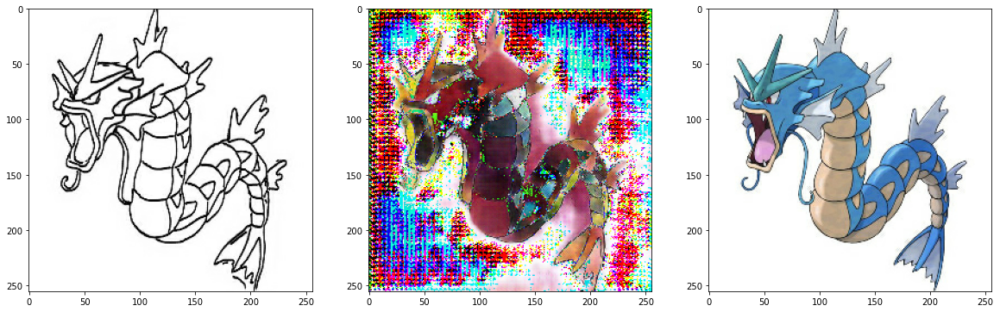

In [41]:
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

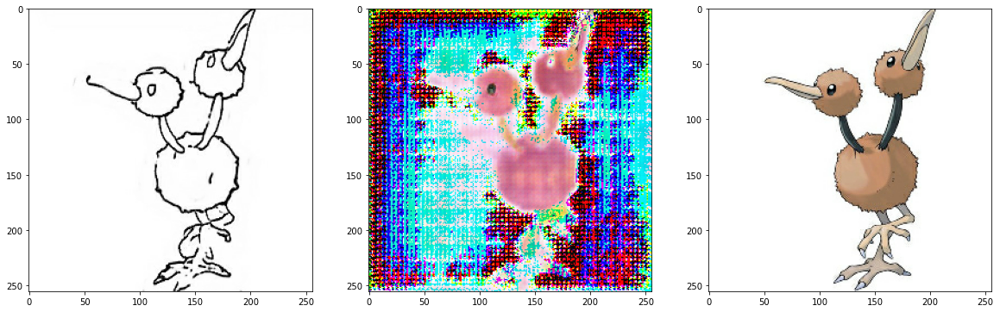

In [42]:
test_ind = 2

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

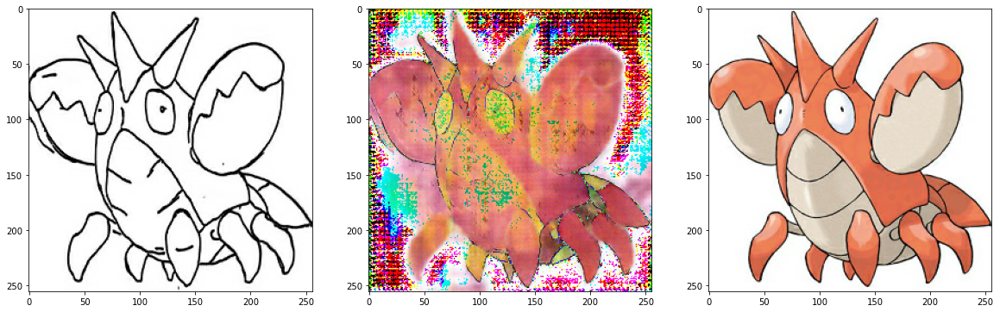

In [43]:
test_ind = 3

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

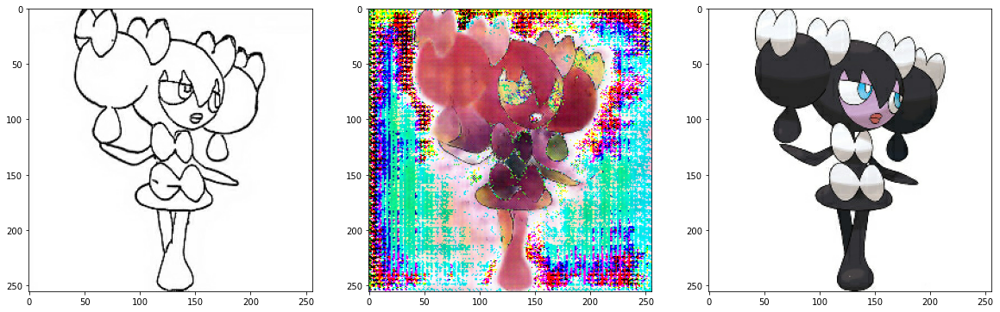

In [44]:
test_ind = 4

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

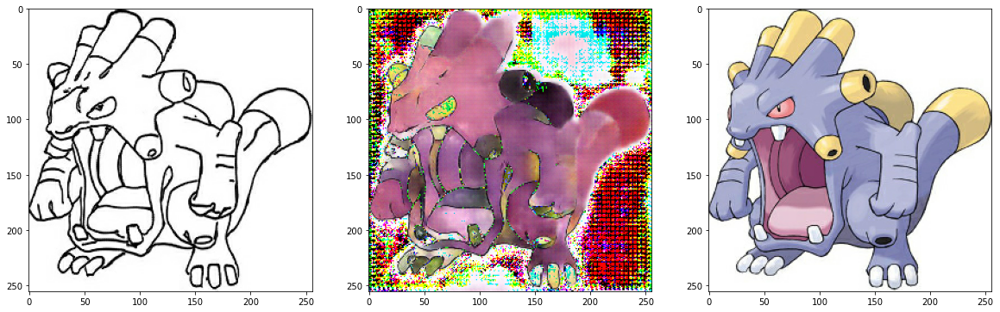

In [45]:
test_ind = 5

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))